<a href="https://colab.research.google.com/github/Hyshubham2504/Clustering-Project/blob/main/Clustering_Stocks_3_Approaches.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**1. Import libraries**

In [180]:
# For getting data
import yfinance as yf
from bs4 import BeautifulSoup as bs
import requests

# For handling data
import pandas as pd
import numpy as np
from datetime import datetime

# For clustering
from sklearn.cluster import KMeans, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# For hyperparameter tuning
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import silhouette_score, pairwise_distances

# For data visualization
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns

# For finding the average correlation between clusters
from itertools import combinations

#**2. Get the latest list of S&P 500 companies from Slickcharts**

In [2]:
# Get the latest S&P 500 components symbols (list of companies' ticker symbols)
# Reference: https://www.reddit.com/r/algotrading/comments/mtgakn/free_api_to_get_up_to_date_list_of_all_sp_500/
url = 'https://www.slickcharts.com/sp500'
request = requests.get(url,headers={'User-Agent': 'Mozilla/5.0'})
soup = bs(request.text, "lxml")
stats = soup.find('table',class_='table table-hover table-borderless table-sm')

df =pd.read_html(str(stats))[0]

SP500_tickers = df['Symbol']

<ipython-input-2-d6f52dca348c>:8: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  df =pd.read_html(str(stats))[0]


In [3]:
# Check if we got the ticker symbol correctly
print(SP500_tickers.head(), "\n")
print(SP500_tickers.describe())

0    AAPL
1    MSFT
2    NVDA
3    AMZN
4    META
Name: Symbol, dtype: object 

count      503
unique     503
top       AAPL
freq         1
Name: Symbol, dtype: object


#**3. Get the daily return data of the 500 companies and market data (S&P 500 data) from Yahoo Finance**
For the 20-year period 2004-01-01 — 2024-01-01 (YYYY-MM-dd).

In [4]:
# Temporary fix: Yahoo Finance uses "BRK-B" instead of "BRK.B" and "BF-B" instead of "BF.B"
# Replace these 2 tickers in the SP500_tickers list so that we can get their data from Yahoo Finance
SP500_tickers = list(map(lambda x: x.replace('BRK.B', 'BRK-B'), SP500_tickers))
SP500_tickers = list(map(lambda x: x.replace('BF.B', 'BF-B'), SP500_tickers))

In [5]:
# This may take 3-4 minutes
start = datetime.now()
SP500_dict = {}

for ticker in SP500_tickers:
    ticker_yahoo = yf.Ticker(ticker)
    adj_close_data = ticker_yahoo.history(start="2004-01-01", end="2024-01-01", auto_adjust=False, actions=False)["Adj Close"]
    if not adj_close_data.empty:
        SP500_dict[ticker] = adj_close_data.pct_change().dropna()

# See how long this piece of code actually took out of curiosity
print(datetime.now() - start)

ERROR:yfinance:GEV: Data doesn't exist for startDate = 1072933200, endDate = 1704085200
ERROR:yfinance:SW: Data doesn't exist for startDate = 1072933200, endDate = 1704085200
ERROR:yfinance:SOLV: Data doesn't exist for startDate = 1072933200, endDate = 1704085200


0:03:04.887862


In [6]:
sp500_yahoo = yf.Ticker("^GSPC")
sp500_adj_close_data = sp500_yahoo.history(start="2004-01-01", end="2024-01-01", auto_adjust=False, actions=False)["Adj Close"]
sp500_return = sp500_adj_close_data.pct_change().dropna()

# See how long this piece of code actually took out of curiosity
len(sp500_return)

5032

In [7]:
# Saving the data
# daily_return_df = pd.DataFrame(SP500_dict)
# daily_return_df.to_csv('daily_return_df.csv')

# Loading the dataset from GDrive
import gdown
file_id = '1Ez4YvElmPaAhJ4-Emkuxq21-LLbamVKG'
url = f'https://drive.google.com/uc?id={file_id}'

# Download the file to your local environment
output = 'file.csv'
gdown.download(url, output, quiet=False)

# Read the CSV file using pandas
daily_return_df = pd.read_csv(output, index_col = 0)
daily_return_df.head()

Downloading...
From: https://drive.google.com/uc?id=1Ez4YvElmPaAhJ4-Emkuxq21-LLbamVKG
To: /content/file.csv
100%|██████████| 49.3M/49.3M [00:00<00:00, 72.2MB/s]


,AAPL,MSFT,NVDA,AMZN,META,GOOGL,GOOG,BRK-B,LLY,AVGO,...,DVA,NCLH,ETSY,BIO,RL,AAL,BEN,PARA,FOX,NWS
Date,,,,,,,,,,,,,,,,,,,,,
2004-01-05 00:00:00-05:00,0.041824,0.025137,0.032496,0.026397,NaN,NaN,NaN,0.010703,-0.014739,NaN,...,0.011136,NaN,NaN,-0.002739,0.009412,NaN,0.016670,NaN,NaN,NaN
2004-01-06 00:00:00-05:00,-0.003609,0.003553,0.040709,-0.004505,NaN,NaN,NaN,0.008825,-0.000855,NaN,...,-0.012265,NaN,NaN,-0.002575,0.002762,NaN,-0.001131,NaN,NaN,NaN
2004-01-07 00:00:00-05:00,0.022635,-0.001062,0.008869,-0.021309,NaN,NaN,NaN,0.005598,-0.004420,NaN,...,-0.004055,NaN,NaN,0.011876,-0.012741,NaN,0.012830,NaN,NaN,NaN
2004-01-08 00:00:00-05:00,0.034086,-0.001773,0.003597,-0.031985,NaN,NaN,NaN,-0.013222,-0.024635,NaN,...,-0.006870,NaN,NaN,-0.005783,-0.001744,NaN,0.007266,NaN,NaN,NaN
2004-01-09 00:00:00-05:00,-0.015412,-0.017756,0.014337,0.026871,NaN,NaN,NaN,0.006700,-0.007637,NaN,...,-0.002306,NaN,NaN,0.005304,-0.022362,NaN,-0.006288,NaN,NaN,NaN


#**4. Double check the data**

In [46]:
# A quick look at the descriptive statistics
descriptive_data = daily_return_df.describe()
descriptive_data

,AAPL,MSFT,NVDA,AMZN,META,GOOGL,GOOG,BRK-B,AVGO,LLY,...,BIO,IVZ,ETSY,NCLH,RL,BEN,AAL,PARA,FOX,NWS
count,5032.000000,5032.000000,5032.000000,5032.000000,2922.000000,4874.000000,4874.000000,5032.000000,3624.000000,5032.000000,...,5032.000000,5032.000000,2192.000000,2755.000000,5032.000000,5032.000000,4595.000000,4547.000000,1209.000000,2651.000000
mean,0.001487,0.000758,0.001600,0.001101,0.001082,0.001011,0.001014,0.000457,0.001505,0.000662,...,0.000514,0.000526,0.001178,0.000554,0.000644,0.000458,0.000792,0.000367,-0.000008,0.000407
std,0.020802,0.017031,0.030844,0.024294,0.025280,0.019349,0.019367,0.013367,0.022169,0.015634,...,0.018676,0.026851,0.038176,0.035391,0.023349,0.021777,0.041707,0.028343,0.021045,0.018604
min,-0.179195,-0.147390,-0.352336,-0.218220,-0.263901,-0.116342,-0.116091,-0.109440,-0.199129,-0.123483,...,-0.167247,-0.211329,-0.283411,-0.357951,-0.221616,-0.152757,-0.303595,-0.283530,-0.104065,-0.145522
25%,-0.008436,-0.007239,-0.013788,-0.010354,-0.010045,-0.007991,-0.007862,-0.005608,-0.010266,-0.006769,...,-0.008106,-0.011486,-0.018437,-0.013158,-0.010496,-0.009611,-0.017787,-0.012082,-0.010882,-0.009032
50%,0.001137,0.000401,0.001511,0.000567,0.000998,0.000769,0.000701,0.000170,0.001441,0.000655,...,0.000415,0.000340,0.000000,0.000219,0.000527,0.000693,0.000000,0.000288,-0.000632,0.000000
75%,0.012002,0.008789,0.016473,0.012433,0.012825,0.010137,0.010139,0.006389,0.012932,0.007805,...,0.008629,0.012414,0.020372,0.013598,0.011526,0.011021,0.017940,0.012249,0.010762,0.009425
max,0.139049,0.186046,0.298067,0.269497,0.296115,0.199915,0.199915,0.192641,0.158337,0.156798,...,0.205034,0.280510,0.306001,0.421923,0.198007,0.161147,0.587360,0.307624,0.132469,0.132931


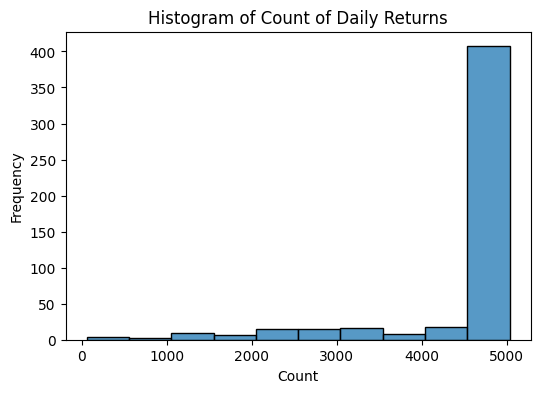

In [47]:
# A histogram showing how many companies have how many rows of data
# Most of the companies have over 4500 rows of data (in the rightmost bin), so we should have enough daily return data to work with
plt.figure(figsize=(6, 4))
sns.histplot(descriptive_data.loc['count'], bins=10, kde=False)
plt.title('Histogram of Count of Daily Returns')
plt.xlabel('Count')
plt.ylabel('Frequency')
plt.show()

In [48]:
# We can see that there are 2 companies with no data for this 20-year period (count for 0.0 is 2)
pd.set_option('display.max_rows', None)
descriptive_data.loc['count'].value_counts()

count
5032.0    385
2651.0      2
2370.0      2
4165.0      2
2137.0      2
952.0       2
4874.0      2
2192.0      1
2314.0      1
4651.0      1
2332.0      1
4658.0      1
3281.0      1
3047.0      1
4329.0      1
1739.0      1
2203.0      1
3409.0      1
4306.0      1
4072.0      1
2063.0      1
60.0        1
1820.0      1
3442.0      1
1885.0      1
4194.0      1
4223.0      1
4135.0      1
3554.0      1
3949.0      1
4547.0      1
4901.0      1
2334.0      1
2545.0      1
2444.0      1
1794.0      1
1429.0      1
4819.0      1
3494.0      1
1210.0      1
5009.0      1
2755.0      1
3215.0      1
2263.0      1
2992.0      1
2925.0      1
4505.0      1
4535.0      1
4595.0      1
4767.0      1
4627.0      1
4186.0      1
4792.0      1
2956.0      1
1273.0      1
4642.0      1
2645.0      1
4710.0      1
3287.0      1
2922.0      1
767.0       1
2948.0      1
3149.0      1
3372.0      1
4479.0      1
3223.0      1
3388.0      1
4512.0      1
2746.0      1
2408.0      1
4559.0      1


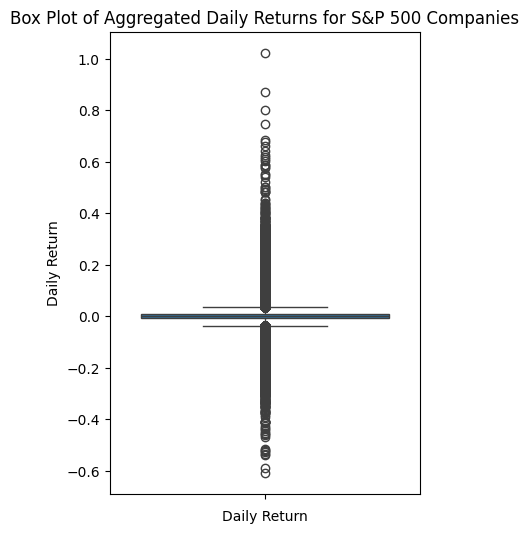

In [49]:
# How do these daily returns look like in a boxplot?
# It looks pretty normal (not skewed heavily to the left or right)

# aggregated_return: daily returns of all companies combined into one list
aggregated_return = daily_return_df.stack()

plt.figure(figsize=(4, 6))
sns.boxplot(aggregated_return)
plt.title('Box Plot of Aggregated Daily Returns for S&P 500 Companies')
plt.xlabel('Daily Return')
plt.ylabel('Daily Return')
plt.show()

In [50]:
# What are the minimum and maximum daily returns out of all this data? Out of curiosity..
summary_statistics = aggregated_return.describe()
summary_statistics

count    2.299678e+06
mean     6.895366e-04
std      2.199350e-02
min     -6.079080e-01
25%     -8.533922e-03
50%      6.372139e-04
75%      9.847881e-03
max      1.023579e+00
dtype: float64

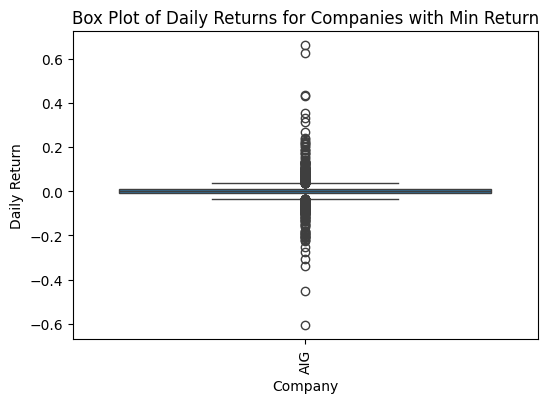

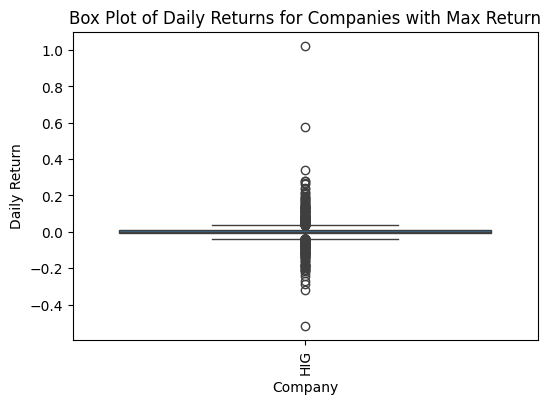

In [51]:
# What are the companies that achieve the minimum and maximum daily returns?
companies_min = daily_return_df.loc[:, (daily_return_df == summary_statistics['min']).any()].columns
companies_max = daily_return_df.loc[:, (daily_return_df == summary_statistics['max']).any()].columns

plt.figure(figsize=(6, 4))
sns.boxplot(daily_return_df[companies_min])
plt.title('Box Plot of Daily Returns for Companies with Min Return')
plt.xlabel('Company')
plt.ylabel('Daily Return')
plt.xticks(rotation=90)
plt.show()
plt.figure(figsize=(6, 4))
sns.boxplot(daily_return_df[companies_max])
plt.title('Box Plot of Daily Returns for Companies with Max Return')
plt.xlabel('Company')
plt.ylabel('Daily Return')
plt.xticks(rotation=90)
plt.show()

In [52]:
# When do these companies achieve the minimum and maximum values respectively?
print("For AIG, it achieves the minimum on: ", daily_return_df.index[daily_return_df['AIG'] == summary_statistics['min']])
print("For HIG, it achieves the maximum on: ", daily_return_df.index[daily_return_df['HIG'] == summary_statistics['max']])

For AIG, it achieves the minimum on:  DatetimeIndex(['2008-09-15 00:00:00-04:00'], dtype='datetime64[ns, America/New_York]', name='Date', freq=None)
For HIG, it achieves the maximum on:  DatetimeIndex(['2008-12-05 00:00:00-05:00'], dtype='datetime64[ns, America/New_York]', name='Date', freq=None)


<Figure size 2000x600 with 0 Axes>

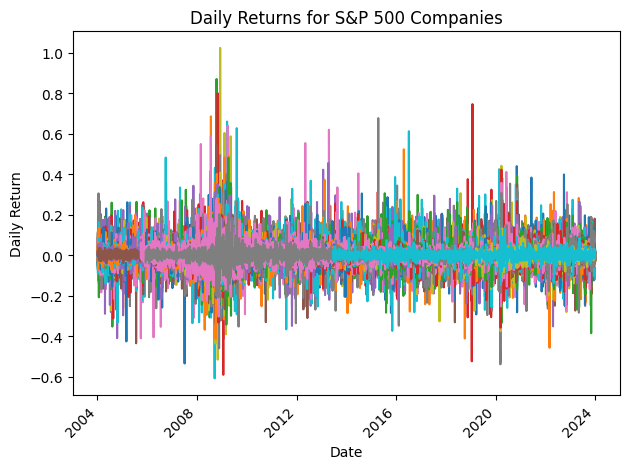

In [53]:
# The minimum and maximum values are achieved around the end of 2008
# These dates fall within the 2008 financial crisis
# In the line chart below, we can see that during the 2008 financial crisis, daily returns could go very high up and also very low, showing strong volatility
plt.figure(figsize=(20, 6))

daily_return_df.plot(legend=False)
plt.title('Daily Returns for S&P 500 Companies')
plt.xlabel('Date')
plt.ylabel('Daily Return')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

#**5. Clean the data and define the different periods**

In [54]:
# Remove companies that do not have complete data for this 20-year period
# Therefore, as long as a company is missing data for 1 day, it is removed
# Drop stocks (columns, hence axis = 1) with null values within this 10-year period
df = daily_return_df.dropna(axis=1)

# Double check if none of the companies left have missing data
# This should output 0 for all companies
df.isnull().sum()

AAPL     0
MSFT     0
NVDA     0
AMZN     0
BRK-B    0
LLY      0
JPM      0
UNH      0
XOM      0
PG       0
JNJ      0
COST     0
HD       0
WMT      0
MRK      0
KO       0
NFLX     0
BAC      0
CVX      0
PEP      0
TMO      0
ADBE     0
AMD      0
LIN      0
ORCL     0
ACN      0
MCD      0
ABT      0
WFC      0
CSCO     0
DHR      0
QCOM     0
AMGN     0
GE       0
INTU     0
PFE      0
IBM      0
VZ       0
TXN      0
DIS      0
NEE      0
ISRG     0
CAT      0
CMCSA    0
RTX      0
AMAT     0
SPGI     0
GS       0
UNP      0
LOW      0
T        0
HON      0
AXP      0
PGR      0
TJX      0
VRTX     0
COP      0
ELV      0
LMT      0
BLK      0
MS       0
BKNG     0
REGN     0
PLD      0
CB       0
ETN      0
C        0
BSX      0
MDT      0
SYK      0
MMC      0
ADP      0
AMT      0
LRCX     0
MU       0
ADI      0
BMY      0
BA       0
KLAC     0
SO       0
GILD     0
MDLZ     0
SCHW     0
CI       0
UPS      0
FI       0
DE       0
NKE      0
DUK      0
INTC     0
MO       0

In [55]:
# See how many companies are left after dropping companies with null values
len(df.columns)

385

The first human cases of COVID-19 occurred in Wuhan, People's Republic of China, on or about 17 November 2019.[2] The first human case in the United States was on 21 January 2020. The World Health Organization declared the COVID-19 outbreak a Public Health Emergency of International Concern (PHEIC) on 30 January 2020, and first referred to it as a pandemic on 11 March 2020.[3][4] The WHO ended the PHEIC on 5 May 2023.[5]
https://en.wikipedia.org/wiki/Timeline_of_the_COVID-19_pandemic

In [56]:
# Define the different periods
pre_financial_crisis = df.loc['2004-01-01':'2006-12-31']
financial_crisis = df.loc['2007-01-01':'2009-06-30']
post_financial_crisis = df.loc['2009-07-01':'2019-12-31']
covid_period = df.loc['2020-01-01':'2022-12-31']
post_covid_period = df.loc['2023-01-01':]

# Store the periods in a list to iterate through
periods = [pre_financial_crisis, financial_crisis, post_financial_crisis, covid_period, post_covid_period]
period_names = ['pre_financial_crisis', 'financial_crisis', 'post_financial_crisis', 'covid_period', 'post_covid_period']

In [57]:
five_year_period_names = ['Period 1', 'Period 2', 'Period 3', 'Period 4', 'Period 5']
five_year_periods = [df.loc['2004-01-01':'2008-12-31'], df.loc['2009-01-01':'2013-12-31'], df.loc['2014-01-01':'2018-12-31'], df.loc['2019-01-01':'2023-12-31']]

#**6. Get GICS sector and industry**

In [58]:
tickers = df.columns.tolist()

# Function to get GICS sector and industry
def get_gics_data(ticker):
    try:
        stock = yf.Ticker(ticker)
        sector = stock.info.get('sector', 'Unknown')
        industry = stock.info.get('industry', 'Unknown')
        return sector, industry
    except Exception as e:
        print(f"Error fetching data for {ticker}: {e}")
        return 'Unknown', 'Unknown'

# Fetch GICS data for each ticker
gics_data = []
for ticker in tickers:
    sector, industry = get_gics_data(ticker)
    gics_data.append({'Company': ticker, 'GICS Sector': sector, 'GICS Industry': industry})

# Convert to DataFrame
gics_df = pd.DataFrame(gics_data)

# Display the GICS DataFrame
print(gics_df)

    Company             GICS Sector                             GICS Industry
0      AAPL              Technology                      Consumer Electronics
1      MSFT              Technology                 Software - Infrastructure
2      NVDA              Technology                            Semiconductors
3      AMZN       Consumer Cyclical                           Internet Retail
4     BRK-B      Financial Services                   Insurance - Diversified
5       LLY              Healthcare              Drug Manufacturers - General
6       JPM      Financial Services                       Banks - Diversified
7       UNH              Healthcare                          Healthcare Plans
8       XOM                  Energy                      Oil & Gas Integrated
9        PG      Consumer Defensive             Household & Personal Products
10      JNJ              Healthcare              Drug Manufacturers - General
11     COST      Consumer Defensive                           Di

In [59]:
# See how many companies fall into each GICS sector
gics_df['GICS Sector'].value_counts()

GICS Sector
Industrials               57
Healthcare                54
Technology                52
Financial Services        52
Consumer Cyclical         41
Consumer Defensive        31
Utilities                 28
Real Estate               26
Energy                    17
Basic Materials           17
Communication Services    10
Name: count, dtype: int64

#**7. First approach: correlation matrix**

##**7.1 Get the correlation matrix**

In [60]:
# Create a correlation matrix based on the daily return data and considering data until 2022.
correlation_matrix = df.corr()
correlation_matrix

,AAPL,MSFT,NVDA,AMZN,BRK-B,LLY,JPM,UNH,XOM,PG,...,GL,MHK,BWA,DVA,BBWI,WYNN,BIO,IVZ,RL,BEN
AAPL,1.000000,0.515875,0.457381,0.445228,0.366614,0.290832,0.395235,0.342861,0.342901,0.333419,...,0.363540,0.324032,0.380448,0.233430,0.312325,0.358943,0.335534,0.430848,0.335786,0.429874
MSFT,0.515875,1.000000,0.511252,0.513598,0.456937,0.397548,0.449748,0.401533,0.413685,0.443252,...,0.443546,0.390500,0.425435,0.277980,0.333698,0.365627,0.400262,0.490186,0.377421,0.498522
NVDA,0.457381,0.511252,1.000000,0.415434,0.353807,0.263925,0.355184,0.293262,0.318554,0.270191,...,0.355272,0.353756,0.401878,0.234857,0.317734,0.369073,0.327366,0.427254,0.346381,0.424247
AMZN,0.445228,0.513598,0.415434,1.000000,0.331856,0.278473,0.347681,0.288249,0.284269,0.264903,...,0.308103,0.321843,0.348607,0.241217,0.292081,0.329508,0.337587,0.393931,0.334890,0.414686
BRK-B,0.366614,0.456937,0.353807,0.331856,1.000000,0.349591,0.595031,0.403912,0.480735,0.414460,...,0.602610,0.471732,0.466948,0.325926,0.392326,0.420933,0.363027,0.566588,0.426164,0.564983
LLY,0.290832,0.397548,0.263925,0.278473,0.349591,1.000000,0.350960,0.406178,0.365667,0.445079,...,0.410188,0.272965,0.270616,0.284546,0.234130,0.207043,0.330182,0.371833,0.272778,0.394954
JPM,0.395235,0.449748,0.355184,0.347681,0.595031,0.350960,1.000000,0.395930,0.481011,0.398160,...,0.702855,0.506334,0.514146,0.308919,0.432276,0.485510,0.381235,0.676939,0.493901,0.677666
UNH,0.342861,0.401533,0.293262,0.288249,0.403912,0.406178,0.395930,1.000000,0.386971,0.388405,...,0.422063,0.325199,0.345585,0.350190,0.287494,0.288816,0.328292,0.402923,0.314506,0.412052
XOM,0.342901,0.413685,0.318554,0.284269,0.480735,0.365667,0.481011,0.386971,1.000000,0.401538,...,0.514018,0.384065,0.448362,0.292359,0.355068,0.387211,0.277691,0.518655,0.405037,0.527886
PG,0.333419,0.443252,0.270191,0.264903,0.414460,0.445079,0.398160,0.388405,0.401538,1.000000,...,0.449834,0.301606,0.316552,0.295688,0.277222,0.239671,0.329197,0.416589,0.304402,0.448645


In [61]:
# None of the correlation coefficients are negative which is expected
# as all companies move with the market, which in general is always going up
correlation_matrix[correlation_matrix < 0].stack()

Series([], dtype: float64)

In [62]:
scaler = StandardScaler()
correlation_matrix_scaled = scaler.fit_transform(correlation_matrix)

##**7.2 K-means clustering**

###**7.2.1 Hyperparameter tuning**

In [80]:
import warnings
warnings.filterwarnings("ignore")

In [81]:
# *****Can take up to 8 minutes
param_grid_kmeans = {
    'n_clusters': range(2, 21),
    'n_init': ['auto', 10, 20, 30],
    'max_iter': [300, 400, 500],
    'init': ['k-means++', 'random'],
    'algorithm': ['lloyd', 'elkan'],
}

# In the variable name kmeans_first, I use 'first' to indicate 'first approach'
kmeans_first = KMeans(random_state=123)

# Initialize variables
best_kmeans_first_score = -2    # The lowest that silhouette score can be is -1
best_kmeans_first_grid = None
best_kmeans_first_labels = None

# To keep track of all combinations and their silhouette scores
kmeans_first_results = []

# Find the best hyperparameter combination
for g in ParameterGrid(param_grid_kmeans):
    kmeans_first.set_params(**g)
    kmeans_first.fit(correlation_matrix)
    kmeans_first_labels = kmeans_first.labels_
    # score = silhouette_score(correlation_matrix, kmeans_first_labels)
    score = silhouette_score(correlation_matrix, kmeans_first_labels)
    kmeans_first_results.append({'hyperparameters': g, 'silhouette_score': score, 'cluster_count': np.unique(kmeans_first_labels, return_counts=True)})

    if score > best_kmeans_first_score:
        best_kmeans_first_score = score
        best_kmeans_first_grid = g
        best_kmeans_first_labels = kmeans_first_labels

print("The best silhouette score is: ", best_kmeans_first_score)
print("The best hyperparameters are: ", best_kmeans_first_grid)
kmeans_first_results_df = pd.DataFrame(kmeans_first_results)

The best silhouette score is:  0.27777850669244053
The best hyperparameters are:  {'algorithm': 'lloyd', 'init': 'k-means++', 'max_iter': 300, 'n_clusters': 3, 'n_init': 10}


For the record: \

The best silhouette score is:  0.27777850669244053

The best hyperparameters are:  {'algorithm': 'lloyd', 'init': 'k-means++', 'max_iter': 300, 'n_clusters': 3, 'n_init': 10}

In [85]:
kmeans_first_results_df.sort_values(by='silhouette_score', ascending=False)

,hyperparameters,silhouette_score,cluster_count
83,"{'algorithm': 'lloyd', 'init': 'k-means++', 'm...",0.277779,"([0, 1, 2], [146, 35, 204])"
386,"{'algorithm': 'lloyd', 'init': 'random', 'max_...",0.277779,"([0, 1, 2], [204, 35, 146])"
690,"{'algorithm': 'elkan', 'init': 'random', 'max_...",0.277779,"([0, 1, 2], [204, 35, 146])"
310,"{'algorithm': 'lloyd', 'init': 'random', 'max_...",0.277779,"([0, 1, 2], [204, 35, 146])"
615,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.277779,"([0, 1, 2], [146, 35, 204])"
614,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.277779,"([0, 1, 2], [146, 35, 204])"
613,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.277779,"([0, 1, 2], [146, 35, 204])"
311,"{'algorithm': 'lloyd', 'init': 'random', 'max_...",0.277779,"([0, 1, 2], [204, 35, 146])"
539,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.277779,"([0, 1, 2], [146, 35, 204])"
234,"{'algorithm': 'lloyd', 'init': 'random', 'max_...",0.277779,"([0, 1, 2], [204, 35, 146])"


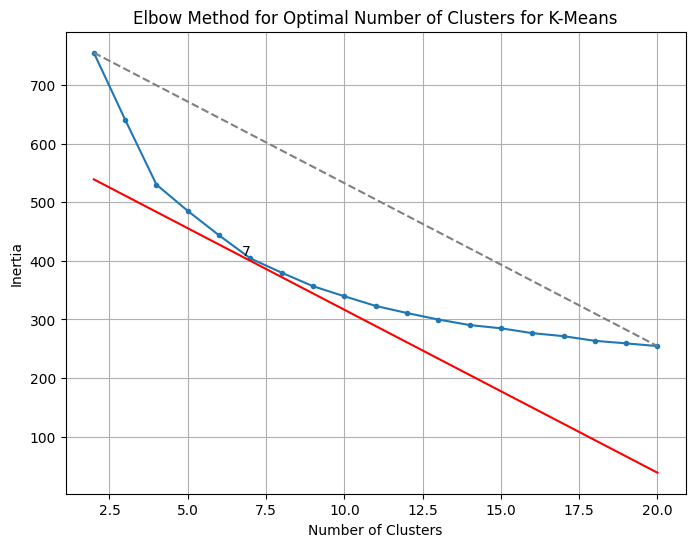

In [83]:
# For the sake of visualization, plot the elbow method graph
# with the best hyperparameter values
n_cluster_options = range(2, 21)

# inertia_: Sum of squared distances of samples to their closest cluster center
inertia_array = []
kmeans_results = {}

for n_cluster in n_cluster_options:
    kmeans = KMeans(n_clusters=n_cluster, random_state=123, algorithm='lloyd', init='k-means++', max_iter=300, n_init=20)
    kmeans.fit(correlation_matrix)
    kmeans_labels = kmeans.labels_
    kmeans_results[n_cluster] = kmeans_labels
    inertia_array.append(kmeans.inertia_)

start_point = (n_cluster_options[0], inertia_array[0])
end_point = (n_cluster_options[-1], inertia_array[-1])
slope = (end_point[1] - start_point[1]) / (end_point[0] - start_point[0])

x_values = np.linspace(2, 20)
y_values = slope * x_values + 595

# Plot elbow method (inertia)
plt.figure(figsize=(8, 6))
plt.plot(n_cluster_options, inertia_array, marker='.')
plt.plot([start_point[0], end_point[0]], [start_point[1], end_point[1]], linestyle='--', color='gray')
plt.plot(x_values, y_values, color='red')
plt.text(n_cluster_options[5], inertia_array[5], f'{n_cluster_options[5]}', ha='right', va='bottom')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal Number of Clusters for K-Means')
plt.grid(True)
plt.show()

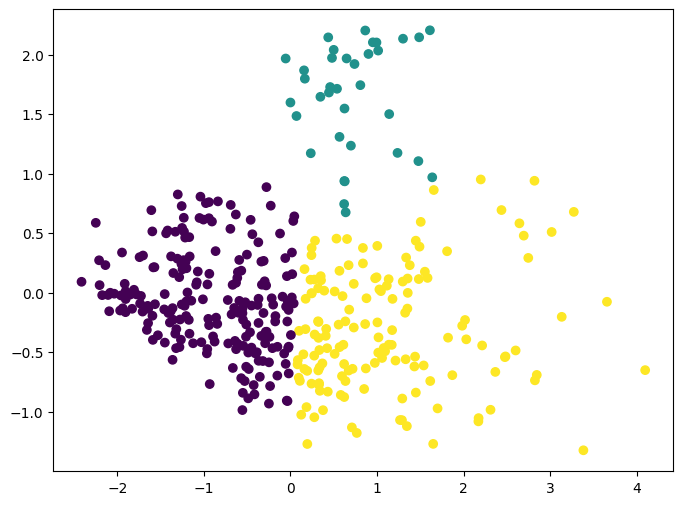

In [84]:
n_cluster = 3
pca = PCA(n_components=2)

pca_components = pca.fit_transform(correlation_matrix)

kmeans = KMeans(n_clusters=n_cluster, random_state=123, algorithm='lloyd', init='random', max_iter=300, n_init=20)
kmeans.fit(correlation_matrix)
kmeans_labels = kmeans.labels_

plt.figure(figsize=(8, 6))

# Create a colormap
unique_labels_length = len(np.unique(kmeans_labels))
cmap = ListedColormap(plt.cm.viridis(np.linspace(0, 1, unique_labels_length)))
colors = cmap(kmeans_labels)

plt.scatter(pca_components[:, 0], pca_components[:, 1], c=colors, cmap='viridis')

plt.show()

###**7.2.2 Count and percentage of industry sector in each cluster**

In [92]:
kmeans_first_sector_counts = pd.DataFrame({'Cluster': best_kmeans_first_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
kmeans_first_sector_percentages = kmeans_first_sector_counts.div(kmeans_first_sector_counts.sum(axis=1), axis=0) * 100

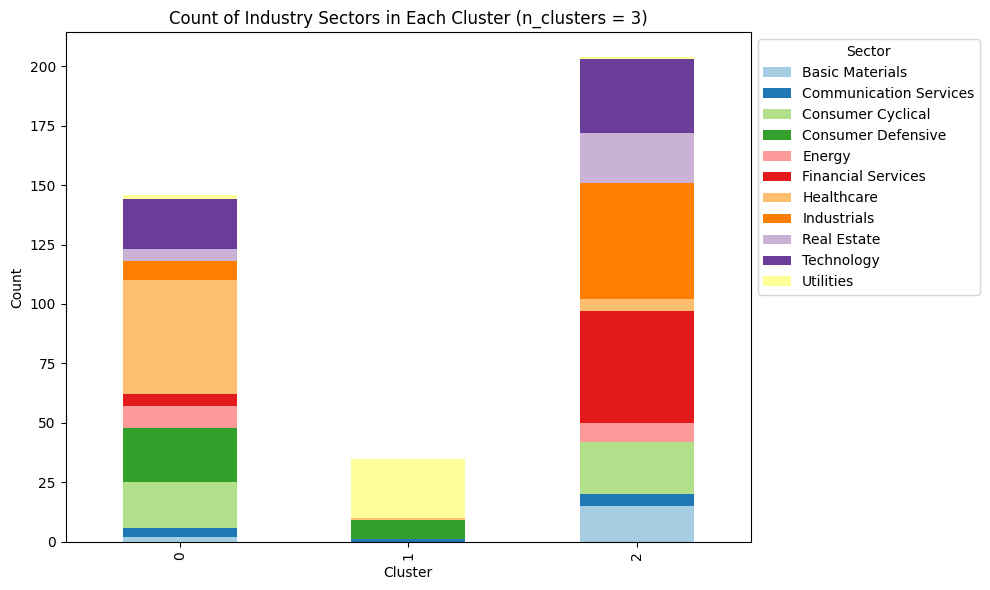

In [93]:
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Stacked bar chart
ax = kmeans_first_sector_counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Count of Industry Sectors in Each Cluster (n_clusters = 3)')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

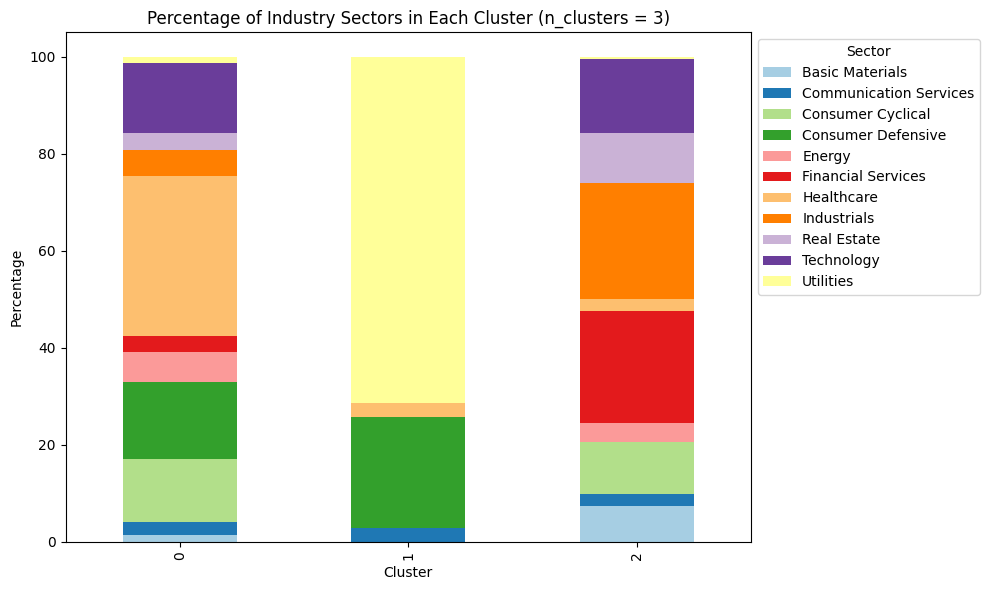

In [88]:
# Stacked bar chart
ax = kmeans_first_sector_percentages.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Percentage of Industry Sectors in Each Cluster (n_clusters = 3)')
plt.xlabel('Cluster')
plt.ylabel('Percentage')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

###**7.2.3 Count and percentage of cluster in each industry sector**

In [94]:
# Similar as before, but switch 0 and 1 in "axis="
kmeans_first_cluster_percentages = kmeans_first_sector_counts.div(kmeans_first_sector_counts.sum(axis=0), axis=1) * 100

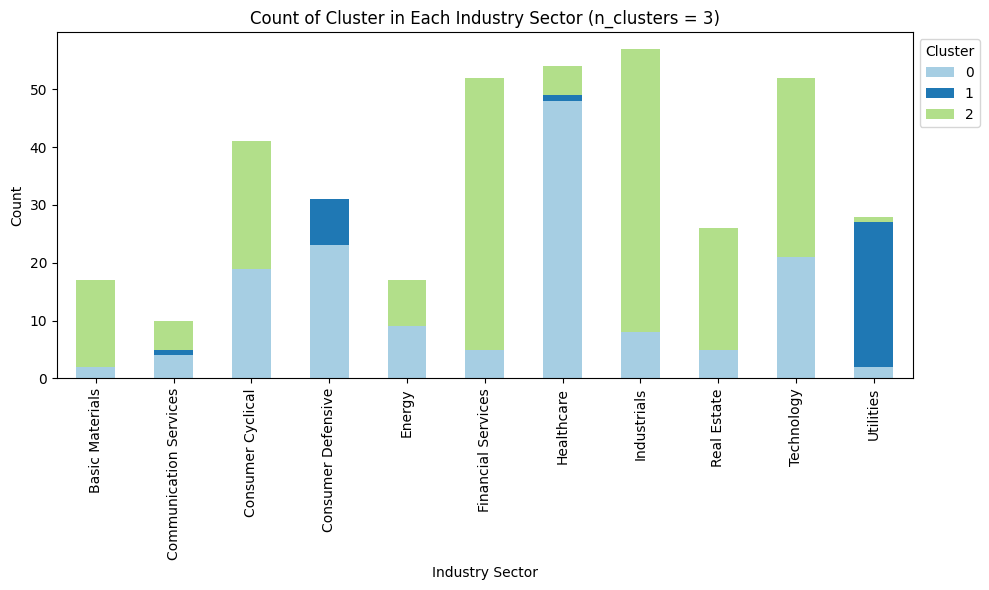

In [95]:
# Stacked bar charts
ax = kmeans_first_sector_counts.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Count of Cluster in Each Industry Sector (n_clusters = {n_cluster})')
plt.xlabel('Industry Sector')
plt.ylabel('Count')
plt.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

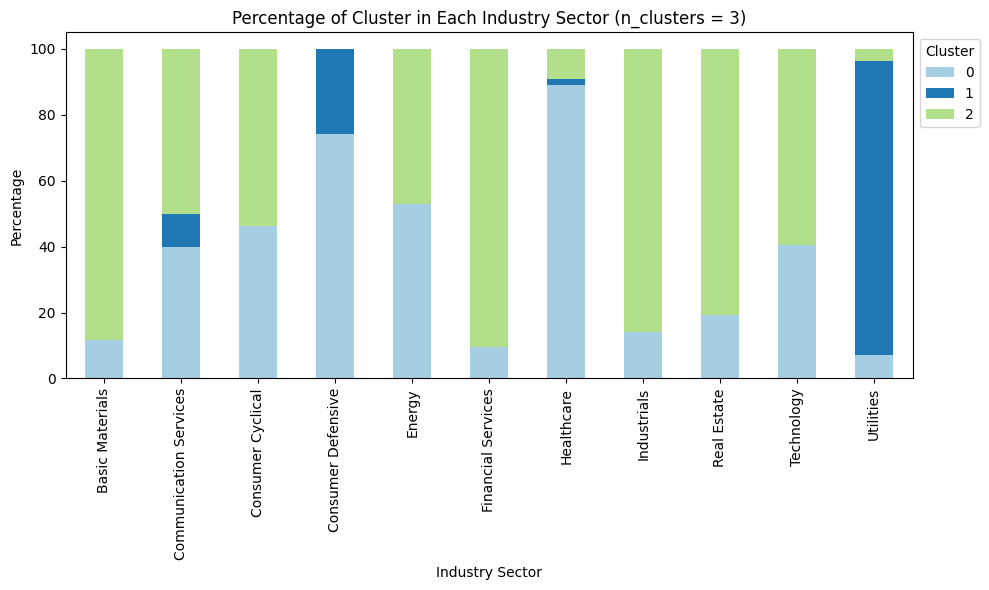

In [96]:
# Stacked bar charts
ax = kmeans_first_cluster_percentages.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Percentage of Cluster in Each Industry Sector (n_clusters = {n_cluster})')
plt.xlabel('Industry Sector')
plt.ylabel('Percentage')
plt.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

##**7.3 Hierarchical clustering**

###**7.3.1 Hyperparameter tuning**

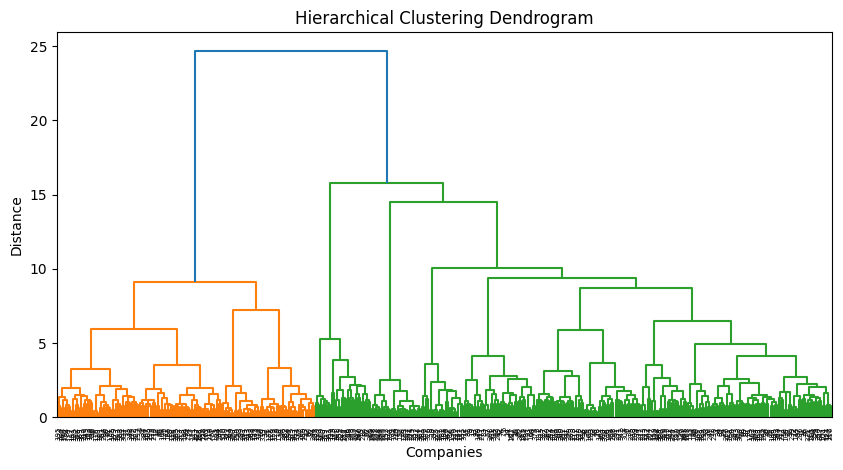

In [97]:
# Plot a dendogram to get an idea of the distance
link = linkage(correlation_matrix, method='ward', metric='euclidean')  #AgglomerativeClustering from scikitlearn uses linkage=ward by default, so use ward here as well

# Plot dendrogram
plt.figure(figsize=(10, 5))
dendrogram(link)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Companies')
plt.ylabel('Distance')
plt.show()

In [98]:
# *****
param_grid_hierarchical = {
    'n_clusters': range(2, 21),
    'linkage': ['ward'],
    'metric': ['euclidean'],
}

# In the variable name kmeans_first, I use 'first' to indicate 'first approach'
hierarchical_first = AgglomerativeClustering(n_clusters=None)

# Initialize variables
best_hierarchical_first_score = -2    # The lowest that silhouette score can be is -1
best_hierarchical_first_grid = None
best_hierarchical_first_labels = None
hierarchical_first_results = []

# Find the best hyperparameter combination
for g in ParameterGrid(param_grid_hierarchical):
    hierarchical_first.set_params(**g)
    hierarchical_first.fit(correlation_matrix)
    hierarchical_first_labels = hierarchical_first.labels_
    score = silhouette_score(correlation_matrix, hierarchical_first_labels)
    hierarchical_first_results.append({'hyperparameters': g, 'silhouette_score': score, 'cluster_count': np.unique(hierarchical_first_labels, return_counts=True)})

    if score > best_hierarchical_first_score:
        best_hierarchical_first_score = score
        best_hierarchical_first_grid = g
        best_hierarchical_first_labels = hierarchical_first_labels

print("The best silhouette score is: ", best_hierarchical_first_score)
print("The best hyperparameters are: ", best_hierarchical_first_grid)
hierarchical_first_results_df = pd.DataFrame(hierarchical_first_results)

The best silhouette score is:  0.23401311676711212
The best hyperparameters are:  {'linkage': 'ward', 'metric': 'euclidean', 'n_clusters': 5}


For the record: \

The best silhouette score is:  0.23401311676711212 \

The best hyperparameters are:  {'linkage': 'ward', 'metric': 'euclidean', 'n_clusters': 5}

In [99]:
hierarchical_first_results_df.sort_values(by='silhouette_score', ascending=False)

,hyperparameters,silhouette_score,cluster_count
3,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.234013,"([0, 1, 2, 3, 4], [183, 128, 28, 25, 21])"
2,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.219690,"([0, 1, 2, 3], [204, 128, 28, 25])"
0,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.218002,"([0, 1], [257, 128])"
8,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.205757,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], [82, 52, 28, ..."
4,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.205199,"([0, 1, 2, 3, 4, 5], [128, 147, 28, 25, 21, 36])"
18,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.202048,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
12,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.200182,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
15,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.199241,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
17,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.198406,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
9,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.198174,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10], [52, 21, ..."


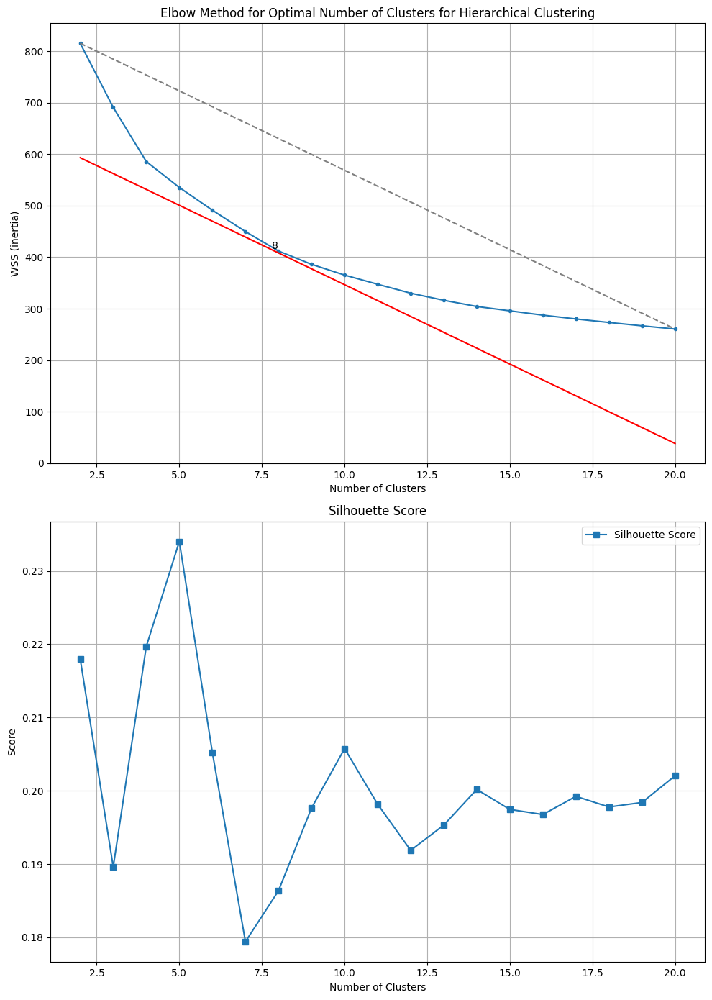

In [100]:
def wss_calculation(K, data):
    WSS = []
    for i in range(1, K):
        cluster = AgglomerativeClustering(n_clusters=i + 1)
        labels = cluster.fit_predict(data)
        wss = []
        for j in range(i + 1):
            # extract each cluster according to its index
            cluster_data = data[labels == j]
            cluster_mean = cluster_data.mean(axis=0)
            distance = np.sum(np.square(cluster_data - cluster_mean))
            wss.append(sum(distance))
        WSS.append(sum(wss))
    return WSS

WSS = wss_calculation(20, correlation_matrix)

# Test out different values of n_clusters using the elbow method
# Try the numbers between 2 to 20
n_cluster_options = range(2, 21)

silhouette_scores_hierarchical = []
hierarchical_results = {}

for n_cluster in n_cluster_options:
    hierarchical = AgglomerativeClustering(n_clusters=n_cluster, linkage='ward', metric='euclidean')
    hierarchical.fit(correlation_matrix)
    hierarchical_labels = hierarchical.labels_
    hierarchical_results[n_cluster] = hierarchical_labels

    # Record the metrics
    silhouette_scores_hierarchical.append(silhouette_score(correlation_matrix, hierarchical_labels))

start_point = (n_cluster_options[0], WSS[0])
end_point = (n_cluster_options[-1], WSS[-1])
slope = (end_point[1] - start_point[1]) / (end_point[0] - start_point[0])

x_values = np.linspace(2, 20)
y_values = slope * x_values + 655

#plot subplots
fig, ax = plt.subplots(2, 1, figsize=(10, 14))

# Plot elbow method (inertia)
ax[0].plot(n_cluster_options, WSS, marker='.')
ax[0].plot([start_point[0], end_point[0]], [start_point[1], end_point[1]], linestyle='--', color='gray')
ax[0].plot(x_values, y_values, color='red')
ax[0].text(n_cluster_options[6], WSS[6], f'{n_cluster_options[6]}', ha='right', va='bottom')
ax[0].set_xlabel('Number of Clusters')
ax[0].set_ylabel('WSS (inertia)')
ax[0].set_title('Elbow Method for Optimal Number of Clusters for Hierarchical Clustering')
ax[0].grid(True)

# Plot the silhoutte score and davies-bouldin index
ax[1].plot(n_cluster_options, silhouette_scores_hierarchical, marker='s', label='Silhouette Score')
ax[1].set_xlabel('Number of Clusters')
ax[1].set_ylabel('Score')
ax[1].set_title('Silhouette Score')
ax[1].legend()
ax[1].grid(True)

plt.tight_layout()
plt.show()

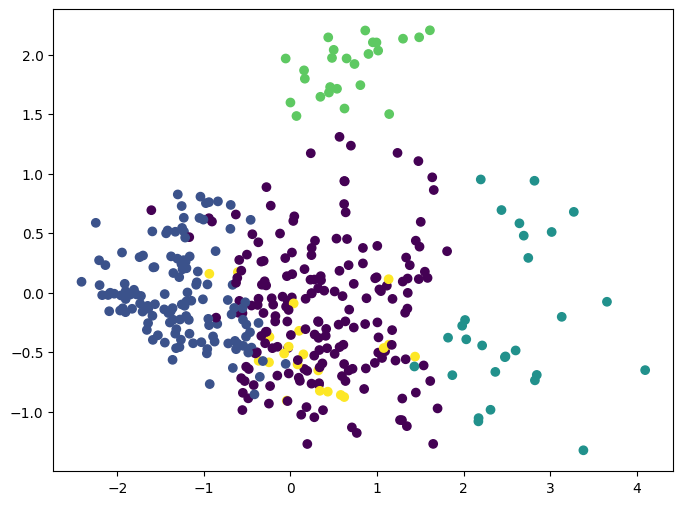

In [101]:
n_cluster = 5
pca = PCA(n_components=2)

pca_components = pca.fit_transform(correlation_matrix)

hierarchical = AgglomerativeClustering(n_clusters=n_cluster, linkage='ward', metric='euclidean')
hierarchical.fit(correlation_matrix)
hierarchical_labels = hierarchical.labels_

plt.figure(figsize=(8, 6))

# Create a colormap
unique_labels_length = len(np.unique(hierarchical_labels))
cmap = ListedColormap(plt.cm.viridis(np.linspace(0, 1, unique_labels_length)))
colors = cmap(hierarchical_labels)

plt.scatter(pca_components[:, 0], pca_components[:, 1], c=colors, cmap='viridis')

plt.show()

###**7.3.2 Count and percentage of industry sector in each cluster**

In [102]:
hierarchical_first_sector_counts = pd.DataFrame({'Cluster': best_hierarchical_first_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
hierarchical_first_sector_percentages = hierarchical_first_sector_counts.div(hierarchical_first_sector_counts.sum(axis=1), axis=0) * 100

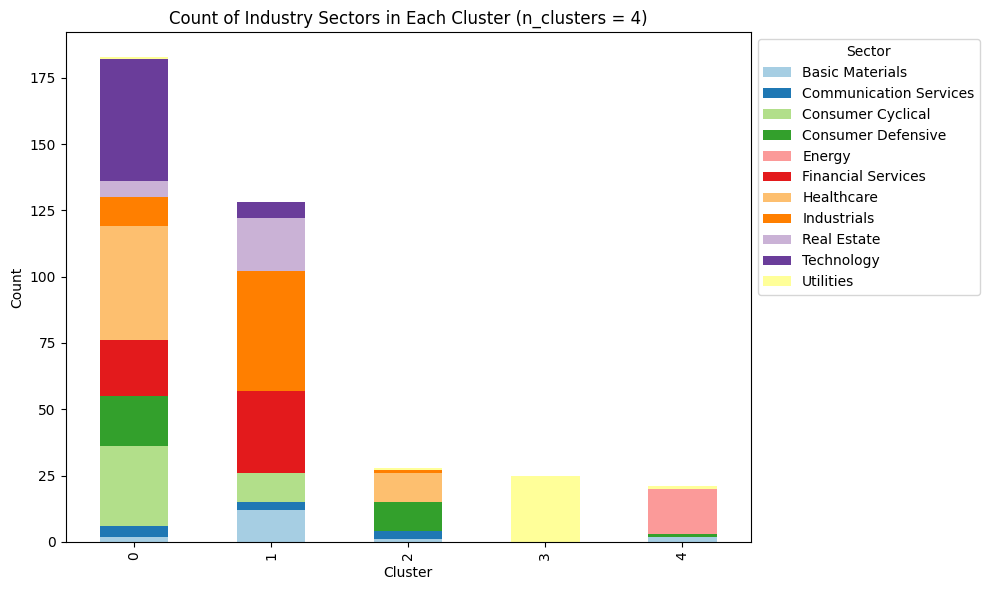

In [103]:
# Stacked bar chart
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))
ax = hierarchical_first_sector_counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Count of Industry Sectors in Each Cluster (n_clusters = 4)')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

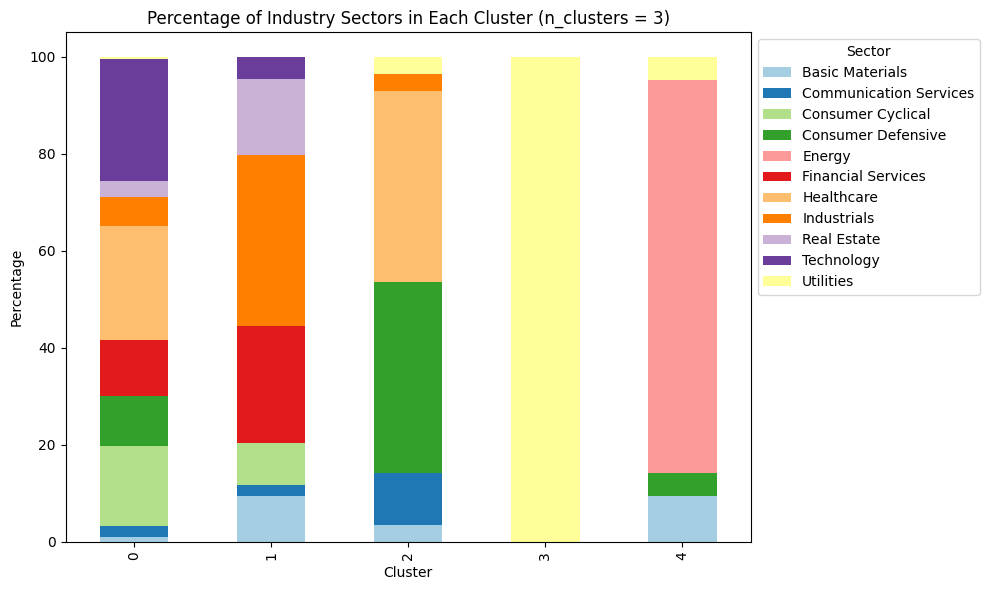

In [104]:
# Stacked bar chart
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))
ax = hierarchical_first_sector_percentages.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Percentage of Industry Sectors in Each Cluster (n_clusters = 3)')
plt.xlabel('Cluster')
plt.ylabel('Percentage')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

###**7.3.3 Count and percentage of cluster in each industry sector**

In [105]:
# Similar as before, but switch 0 and 1 in "axis="
hierarchical_first_cluster_percentages = hierarchical_first_sector_counts.div(hierarchical_first_sector_counts.sum(axis=0), axis=1) * 100

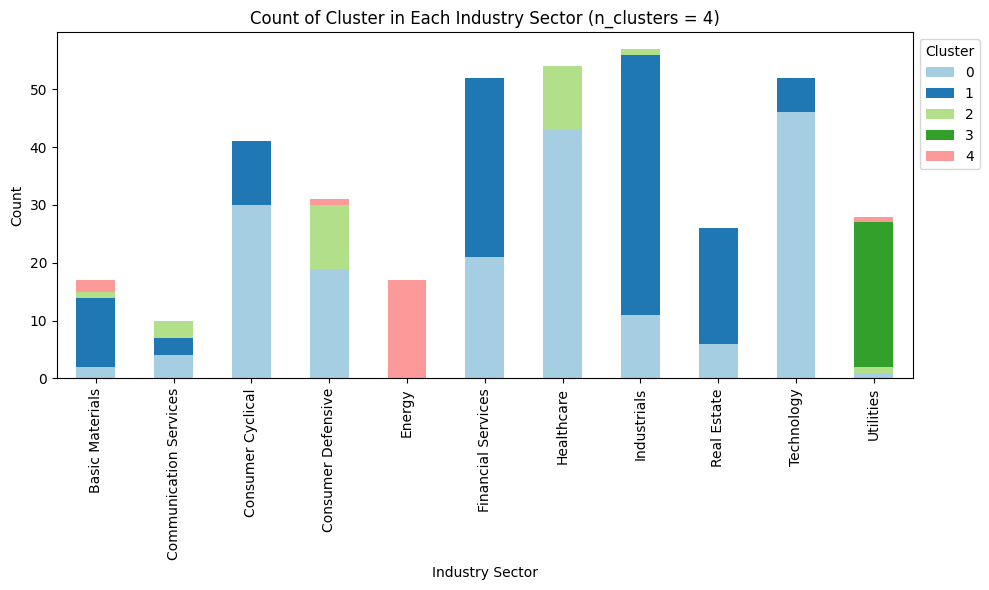

In [106]:
# Stacked bar charts
ax = hierarchical_first_sector_counts.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Count of Cluster in Each Industry Sector (n_clusters = 4)')
plt.xlabel('Industry Sector')
plt.ylabel('Count')
plt.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

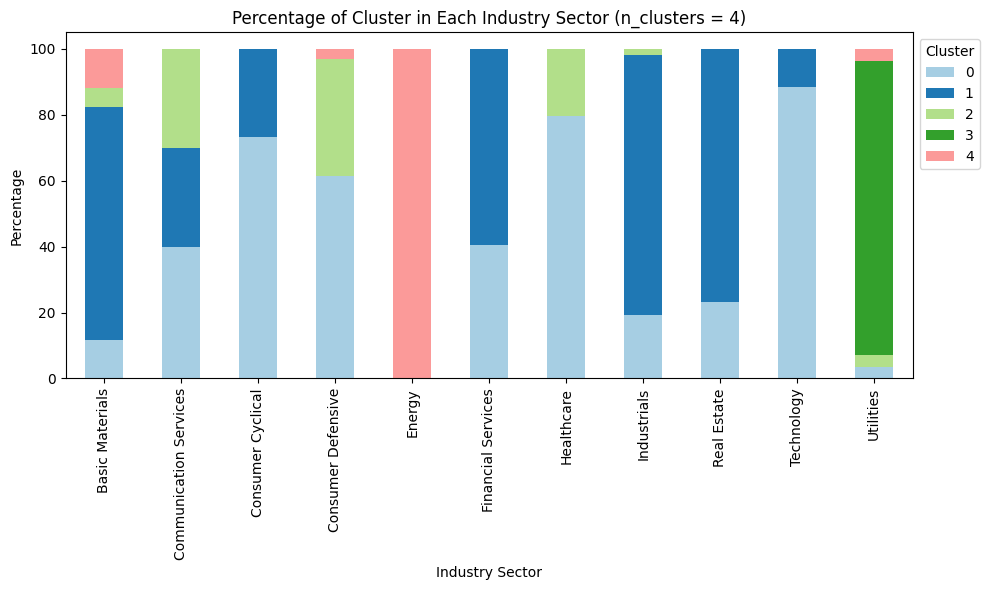

In [107]:
# Stacked bar charts
ax = hierarchical_first_cluster_percentages.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Percentage of Cluster in Each Industry Sector (n_clusters = 4)')
plt.xlabel('Industry Sector')
plt.ylabel('Percentage')
plt.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

#**8. Second approach: feature engineering**

##**8.1 Create new features**

In [63]:
daily_return_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5032 entries, 2004-01-05 00:00:00-05:00 to 2023-12-29 00:00:00-05:00
Columns: 500 entries, AAPL to NWS
dtypes: float64(500)
memory usage: 19.4 MB


In [64]:
df = daily_return_df.copy()

In [65]:
df.dropna(axis=1, inplace=True)

In [66]:
# Calculate average returns and volatilities for each period
avg_return_pre_crisis = pre_financial_crisis.mean()
volatility_pre_crisis = pre_financial_crisis.std()

avg_return_crisis = financial_crisis.mean()
volatility_crisis = financial_crisis.std()

avg_return_post_crisis = post_financial_crisis.mean()
volatility_post_crisis = post_financial_crisis.std()

avg_return_covid = covid_period.mean()
volatility_covid = covid_period.std()

avgr_return_post_covid = post_covid_period.mean()
volatility_post_covid = post_covid_period.std()

In [67]:
gics_df.head()

,Company,GICS Sector,GICS Industry
0,AAPL,Technology,Consumer Electronics
1,MSFT,Technology,Software - Infrastructure
2,NVDA,Technology,Semiconductors
3,AMZN,Consumer Cyclical,Internet Retail
4,BRK-B,Financial Services,Insurance - Diversified


In [143]:
feature_matrix = pd.DataFrame({
    'avg_return_pre_crisis': avg_return_pre_crisis,
    'volatility_pre_crisis': volatility_pre_crisis,
    'avg_return_crisis': avg_return_crisis,
    'volatility_crisis': volatility_crisis,
    'avg_return_post_crisis': avg_return_post_crisis,
    'volatility_post_crisis': volatility_post_crisis,
    'avg_return_covid': avg_return_covid,
    'volatility_covid': volatility_covid,
    'avg_return_post_covid': avgr_return_post_covid,
    'volatility_post_covid': volatility_post_covid
}).dropna()

# Reset the index to make company names a column
feature_matrix.reset_index(inplace=True)
feature_matrix.rename(columns={'index': 'Company'}, inplace=True)

# Merge the feature matrix with GICS data on the 'Company' column
merged_data = pd.merge(feature_matrix, gics_df, on='Company')

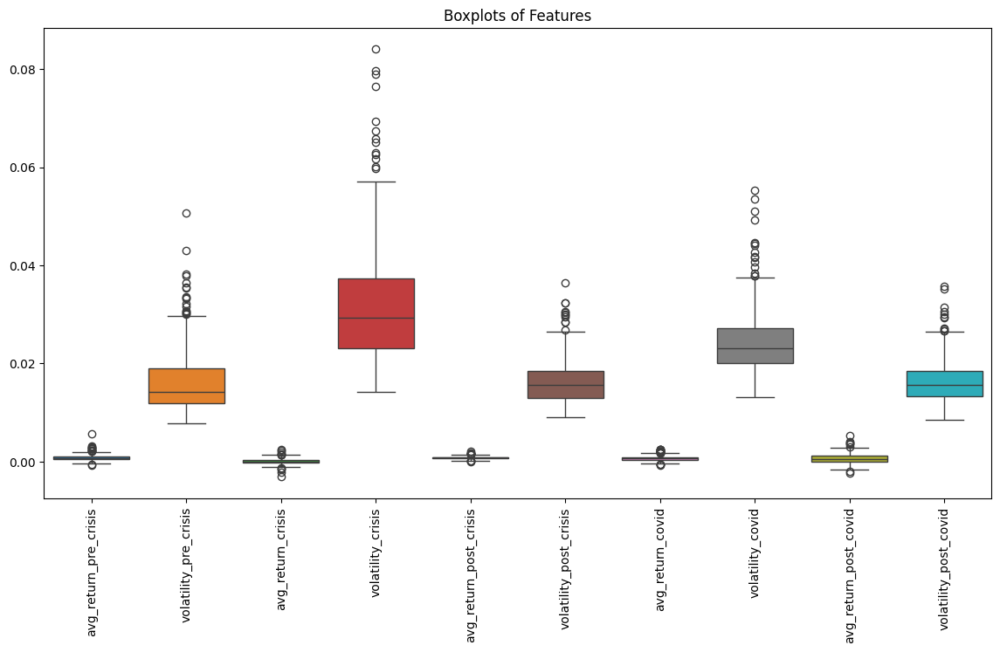

In [69]:
plt.figure(figsize=(14, 7))
sns.boxplot(data=feature_matrix)
plt.title('Boxplots of Features')
plt.xticks(rotation=90)
plt.show()

In [70]:
merged_data.head()

,Company,avg_return_pre_crisis,volatility_pre_crisis,avg_return_crisis,volatility_crisis,avg_return_post_crisis,volatility_post_crisis,avg_return_covid,volatility_covid,avg_return_post_covid,volatility_post_covid,GICS Sector,GICS Industry
0,AAPL,0.003060,0.024775,0.001281,0.030126,0.001194,0.016205,0.001053,0.023264,0.001678,0.012788,Technology,Consumer Electronics
1,MSFT,0.000356,0.011085,0.000020,0.025123,0.000914,0.014376,0.000832,0.021890,0.001960,0.015794,Technology,Software - Infrastructure
2,NVDA,0.002036,0.030606,-0.000298,0.042996,0.001507,0.025704,0.001829,0.035245,0.005338,0.030507,Technology,Semiconductors
3,AMZN,-0.000049,0.024757,0.001856,0.036857,0.001374,0.020287,0.000177,0.024624,0.002588,0.020798,Consumer Cyclical,Internet Retail
4,BRK-B,0.000391,0.008356,-0.000154,0.021217,0.000582,0.011497,0.000540,0.016116,0.000612,0.008594,Financial Services,Insurance - Diversified


In [71]:
# Store the column names for different periods in an array
period_columns = [['avg_return_pre_crisis',	'volatility_pre_crisis'], ['avg_return_crisis', 'volatility_crisis'], ['avg_return_post_crisis', 'volatility_post_crisis'], ['avg_return_covid', 'volatility_covid'], ['avg_return_post_covid', 'volatility_post_covid']]

In [72]:
from sklearn.preprocessing import StandardScaler

# Standardize the feature matrix
scaler = StandardScaler()
scaled_features = scaler.fit_transform(merged_data.drop(columns=['Company', 'GICS Sector', 'GICS Industry']))

##**8.2 K-means Clustering**

###**8.2.1 Hyperparameter tuning**

In [109]:
# *****Can take up to 8 minutes
param_grid_kmeans = {
    'n_clusters': range(2, 21),
    'n_init': ['auto', 10, 20, 30],
    'max_iter': [300, 400, 500],
    'init': ['k-means++', 'random'],
    'algorithm': ['lloyd', 'elkan'],
}

# In the variable name kmeans_second, I use 'second' to indicate 'second approach'
kmeans_second = KMeans(random_state=123)

# Initialize variables
best_kmeans_second_score = -2    # The lowest that silhouette score can be is -1
best_kmeans_second_grid = None
best_kmeans_second_labels = None

# To keep track of all combinations and their silhouette scores
kmeans_second_results = []

# Find the best hyperparameter combination
for g in ParameterGrid(param_grid_kmeans):
    kmeans_second.set_params(**g)
    kmeans_second.fit(scaled_features)
    kmeans_second_labels = kmeans_second.labels_
    score = silhouette_score(scaled_features, kmeans_second_labels)
    kmeans_second_results.append({'hyperparameters': g, 'silhouette_score': score, 'cluster_count': np.unique(kmeans_second_labels, return_counts=True)})

    if score > best_kmeans_second_score:
        best_kmeans_second_score = score
        best_kmeans_second_grid = g
        best_kmeans_second_labels = kmeans_second_labels

print("The best silhouette score is: ", best_kmeans_second_score)
print("The best hyperparameters are: ", best_kmeans_second_grid)
kmeans_second_results_df = pd.DataFrame(kmeans_second_results)

The best silhouette score is:  0.27469051578315123
The best hyperparameters are:  {'algorithm': 'lloyd', 'init': 'k-means++', 'max_iter': 300, 'n_clusters': 2, 'n_init': 'auto'}


For the record:

The best silhouette score is:  0.27469051578315123

The best hyperparameters are:  {'algorithm': 'lloyd', 'init': 'k-means++', 'max_iter': 300, 'n_clusters': 2, 'n_init': 'auto'}

In [110]:
kmeans_second_results_df.sort_values(by='silhouette_score', ascending=False)

,hyperparameters,silhouette_score,cluster_count
0,"{'algorithm': 'lloyd', 'init': 'k-means++', 'm...",0.274691,"([0, 1], [259, 126])"
76,"{'algorithm': 'lloyd', 'init': 'k-means++', 'm...",0.274691,"([0, 1], [259, 126])"
608,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.274691,"([0, 1], [259, 126])"
532,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.274691,"([0, 1], [259, 126])"
152,"{'algorithm': 'lloyd', 'init': 'k-means++', 'm...",0.274691,"([0, 1], [259, 126])"
456,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.274691,"([0, 1], [259, 126])"
459,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.273173,"([0, 1], [127, 258])"
533,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.273173,"([0, 1], [127, 258])"
458,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.273173,"([0, 1], [127, 258])"
457,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.273173,"([0, 1], [127, 258])"


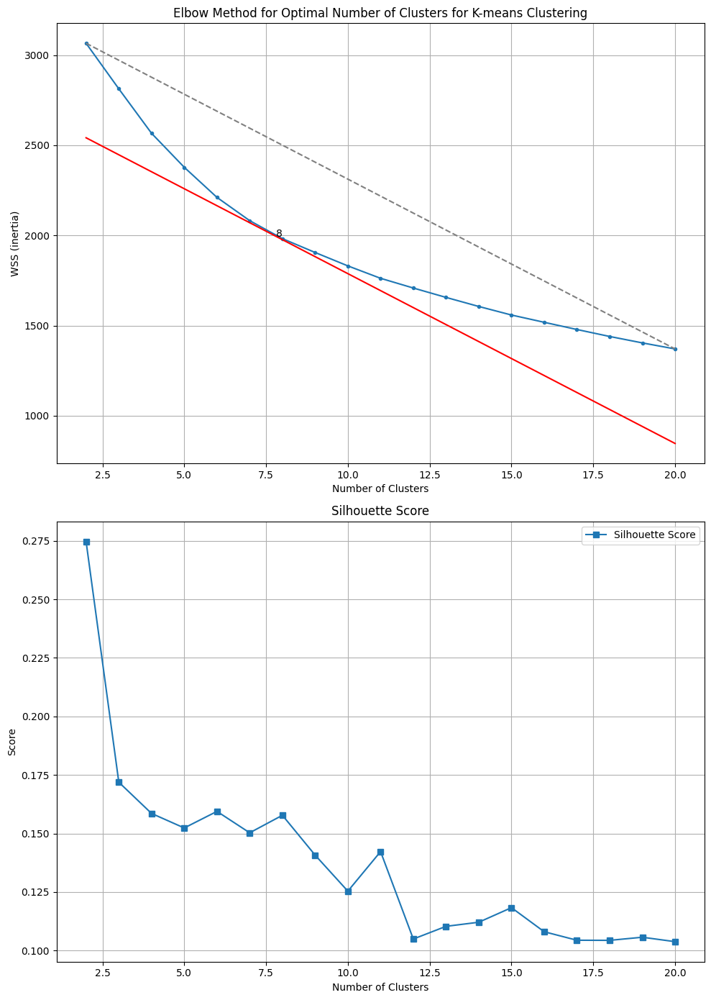

In [127]:
# Test out different values of n_clusters using the elbow method
# Try the numbers between 2 to 20
n_cluster_options = range(2, 21)

silhouette_scores_kmeans = []
kmeans_results = {}
wcss = []

for n_cluster in n_cluster_options:
    kmeans = KMeans(n_clusters=n_cluster, random_state=123, algorithm='lloyd', init='k-means++', max_iter=300, n_init='auto')
    kmeans.fit(scaled_features)
    kmeans_labels = kmeans.labels_
    kmeans_results[n_cluster] = kmeans_labels
    wcss.append(kmeans.inertia_)

    # Record the metrics
    silhouette_scores_kmeans.append(silhouette_score(scaled_features, kmeans_labels))

start_point = (n_cluster_options[0], WSS[0])
end_point = (n_cluster_options[-1], WSS[-1])
slope = (end_point[1] - start_point[1]) / (end_point[0] - start_point[0])

x_values = np.linspace(2, 20)
y_values = slope * x_values + 2730

#plot subplots
fig, ax = plt.subplots(2, 1, figsize=(10, 14))

# Plot elbow method (inertia)
ax[0].plot(n_cluster_options, WSS, marker='.')
ax[0].plot([start_point[0], end_point[0]], [start_point[1], end_point[1]], linestyle='--', color='gray')
ax[0].plot(x_values, y_values, color='red')
ax[0].text(n_cluster_options[6], WSS[6], f'{n_cluster_options[6]}', ha='right', va='bottom')
ax[0].set_xlabel('Number of Clusters')
ax[0].set_ylabel('WSS (inertia)')
ax[0].set_title('Elbow Method for Optimal Number of Clusters for K-means Clustering')
ax[0].grid(True)

# Plot the silhoutte score and davies-bouldin index
ax[1].plot(n_cluster_options, silhouette_scores_kmeans, marker='s', label='Silhouette Score')
ax[1].set_xlabel('Number of Clusters')
ax[1].set_ylabel('Score')
ax[1].set_title('Silhouette Score')
ax[1].legend()
ax[1].grid(True)

plt.tight_layout()
plt.show()

In [128]:
# Apply K-means clustering with the optimal number of clusters
kmeans = KMeans(n_clusters=2, random_state=123, algorithm='lloyd', init='k-means++', max_iter=300, n_init='auto')
clusters = kmeans.fit_predict(scaled_features)

# Add the cluster labels to the merged data
merged_data['Cluster'] = clusters

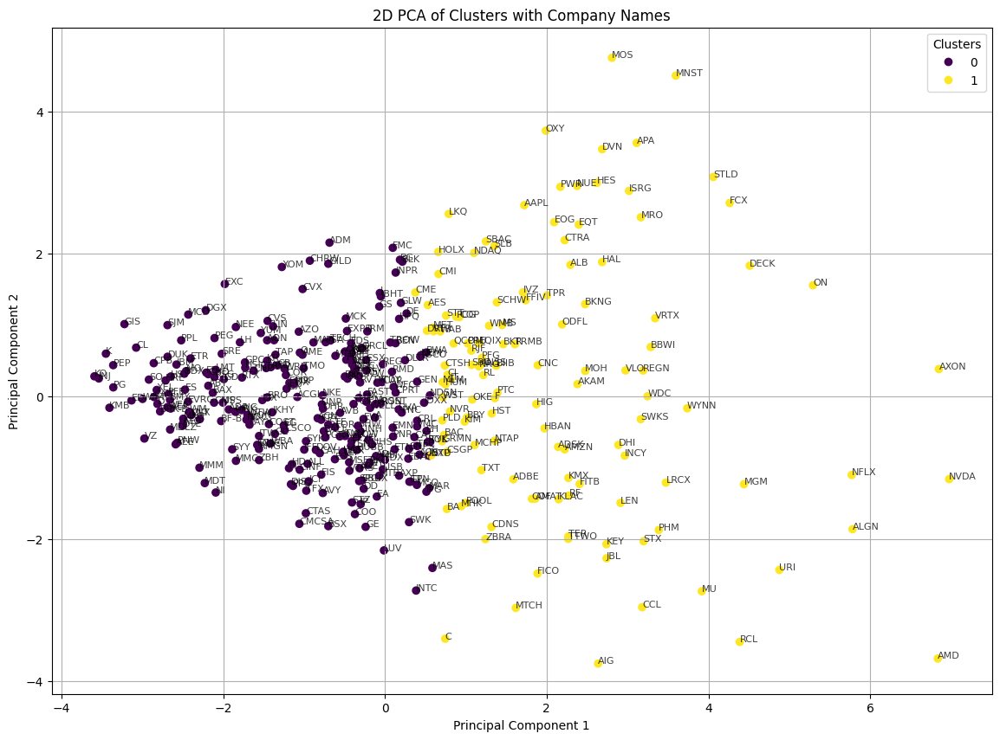

In [129]:
pca_2d = PCA(n_components=2)
components_2d = pca_2d.fit_transform(scaled_features)

# Create 2D plot with annotations
plt.figure(figsize=(14, 10))
scatter = plt.scatter(components_2d[:, 0], components_2d[:, 1], c=clusters, cmap='viridis')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.title('2D PCA of Clusters with Company Names')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)

for i, txt in enumerate(merged_data['Company']):
    plt.annotate(txt, (components_2d[i, 0], components_2d[i, 1]), fontsize=8, alpha=0.75)

plt.show()

###**8.2.2 Count and percentage of industry sector in each cluster**

In [130]:
kmeans_second_sector_counts = pd.DataFrame({'Cluster': np.array(merged_data['Cluster']), 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
kmeans_second_sector_percentages = kmeans_second_sector_counts.div(kmeans_second_sector_counts.sum(axis=1), axis=0) * 100

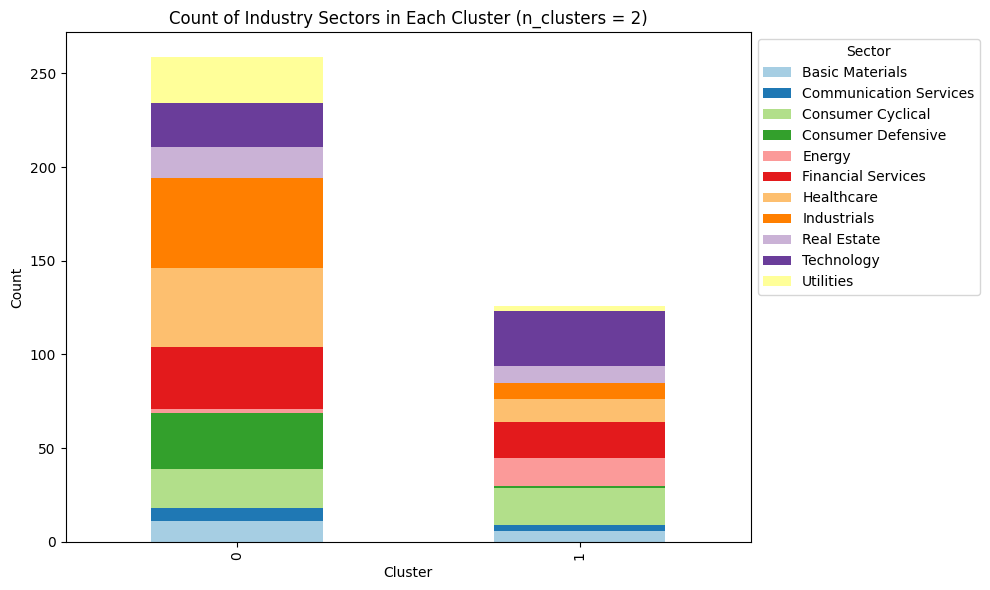

In [131]:
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Stacked bar chart
ax = kmeans_second_sector_counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Count of Industry Sectors in Each Cluster (n_clusters = 2)')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

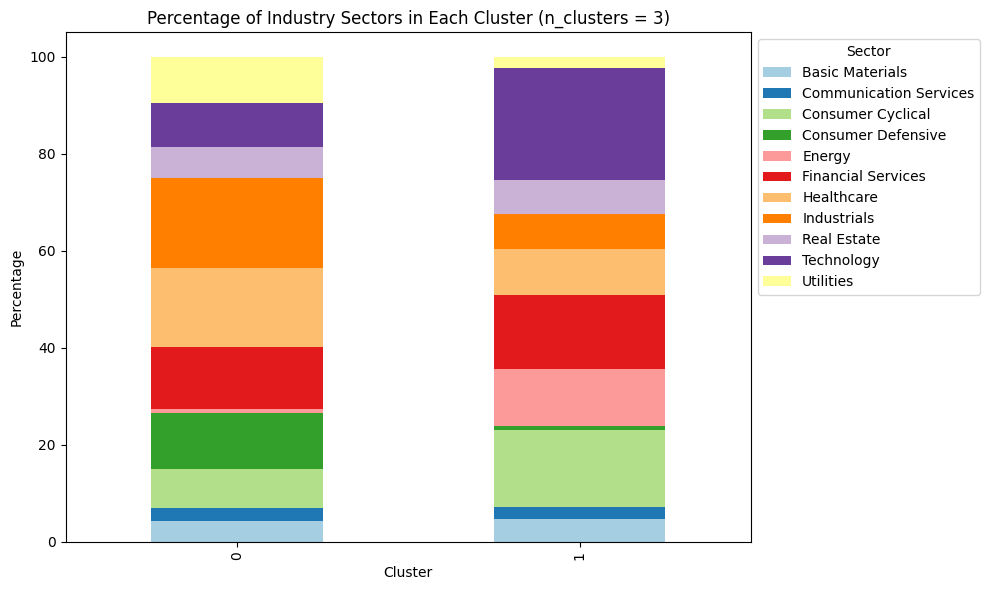

In [132]:
# Stacked bar chart
ax = kmeans_second_sector_percentages.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Percentage of Industry Sectors in Each Cluster (n_clusters = 3)')
plt.xlabel('Cluster')
plt.ylabel('Percentage')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

###**8.2.3 Count and percentage of cluster in each industry sector**

In [133]:
# Similar as before, but switch 0 and 1 in "axis="
kmeans_second_cluster_percentages = kmeans_second_sector_counts.div(kmeans_second_sector_counts.sum(axis=0), axis=1) * 100

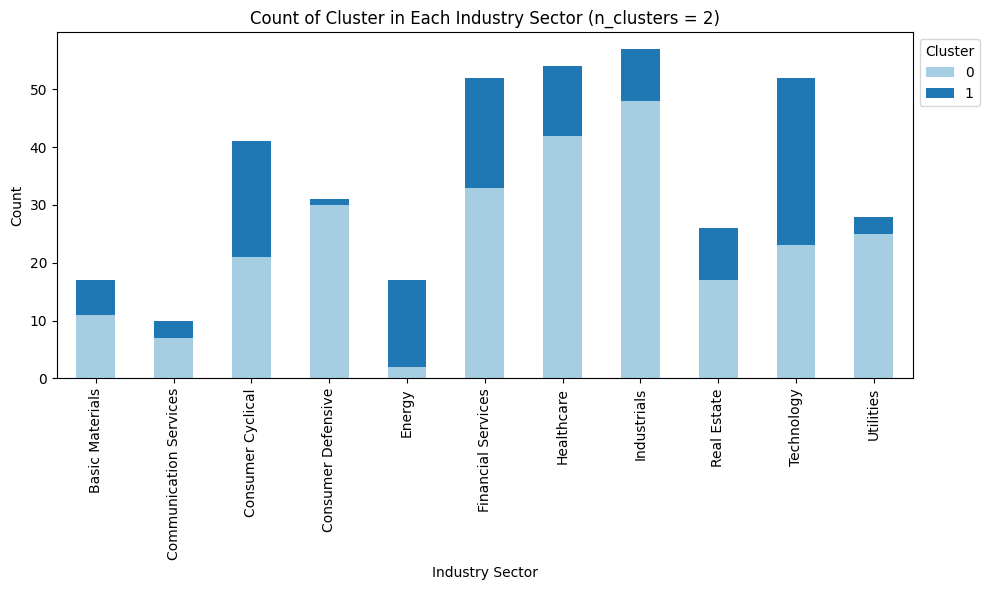

In [134]:
# Stacked bar charts
ax = kmeans_second_sector_counts.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Count of Cluster in Each Industry Sector (n_clusters = 2)')
plt.xlabel('Industry Sector')
plt.ylabel('Count')
plt.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

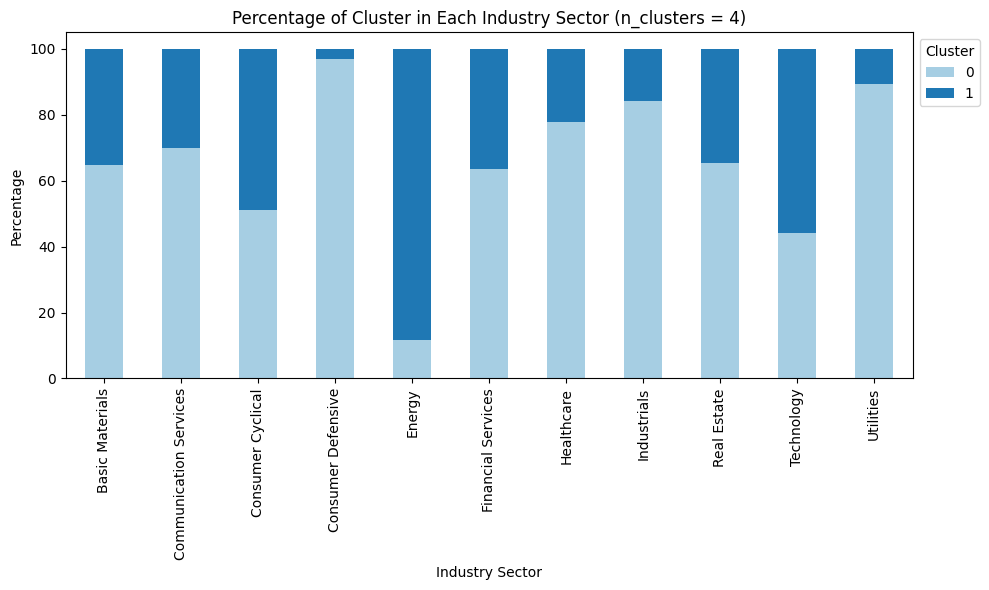

In [135]:
# Stacked bar charts
ax = kmeans_second_cluster_percentages.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Percentage of Cluster in Each Industry Sector (n_clusters = 4)')
plt.xlabel('Industry Sector')
plt.ylabel('Percentage')
plt.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

##**8.3 Hierarchical clustering**

###**8.3.1 Hyperparameter tuning**

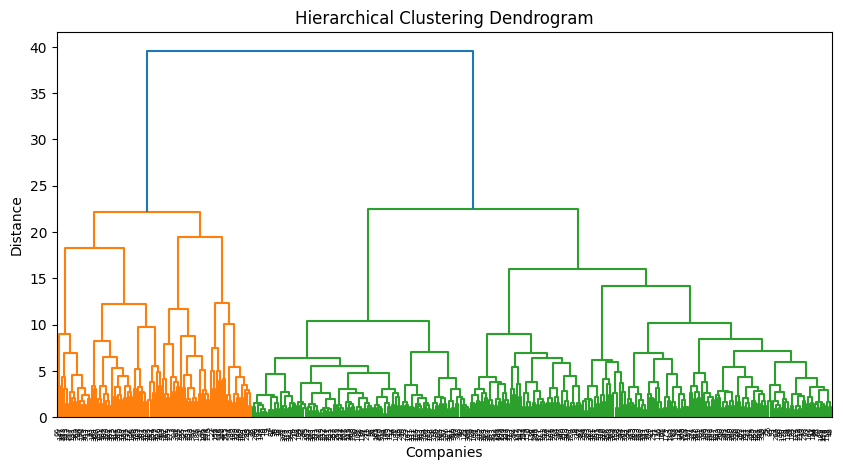

In [136]:
# Plot a dendogram to get an idea of the distance
link = linkage(scaled_features, method='ward', metric='euclidean')  #AgglomerativeClustering from scikitlearn uses linkage=ward by default, so use ward here as well

# Plot dendrogram
plt.figure(figsize=(10, 5))
dendrogram(link)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Companies')
plt.ylabel('Distance')
plt.show()

In [137]:
# *****
param_grid_hierarchical = {
    'n_clusters': range(2, 21),
    'linkage': ['ward'],
    'metric': ['euclidean'],
}

# In the variable name kmeans_second, I use 'second' to indicate 'first approach'
hierarchical_second = AgglomerativeClustering(n_clusters=None)

# Initialize variables
best_hierarchical_second_score = -2    # The lowest that silhouette score can be is -1
best_hierarchical_second_grid = None
best_hierarchical_second_labels = None
hierarchical_second_results = []

# Find the best hyperparameter combination
for g in ParameterGrid(param_grid_hierarchical):

    hierarchical_second.set_params(**g)

    if g['metric'] == 'precomputed':
        distance_matrix = pairwise_distances(scaled_features, metric='euclidean')
        hierarchical_second.fit(distance_matrix)
    else:
        hierarchical_second.fit(scaled_features)

    hierarchical_second_labels = hierarchical_second.labels_
    score = silhouette_score(scaled_features, hierarchical_second_labels)
    hierarchical_second_results.append({'hyperparameters': g, 'silhouette_score': score, 'cluster_count': np.unique(hierarchical_second_labels, return_counts=True)})

    if score > best_hierarchical_second_score:
        best_hierarchical_second_score = score
        best_hierarchical_second_grid = g
        best_hierarchical_second_labels = hierarchical_second_labels

print("The best silhouette score is: ", best_hierarchical_second_score)
print("The best hyperparameters are: ", best_hierarchical_second_grid)
hierarchical_second_results_df = pd.DataFrame(hierarchical_second_results)

The best silhouette score is:  0.30771604824262516
The best hyperparameters are:  {'linkage': 'ward', 'metric': 'euclidean', 'n_clusters': 2}


For the record:

The best silhouette score is:  0.30771604824262516

The best hyperparameters are:  {'linkage': 'ward', 'metric': 'euclidean', 'n_clusters': 2}

In [138]:
hierarchical_second_results_df.sort_values(by='silhouette_score', ascending=False)

,hyperparameters,silhouette_score,cluster_count
0,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.307716,"([0, 1], [288, 97])"
9,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.148209,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10], [108, 102..."
8,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.144022,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], [24, 102, 108..."
7,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.143030,"([0, 1, 2, 3, 4, 5, 6, 7, 8], [35, 24, 108, 10..."
6,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.139026,"([0, 1, 2, 3, 4, 5, 6, 7], [21, 35, 108, 102, ..."
5,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.133369,"([0, 1, 2, 3, 4, 5, 6], [124, 21, 108, 35, 24,..."
4,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.130379,"([0, 1, 2, 3, 4, 5], [180, 21, 108, 35, 24, 17])"
3,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.116592,"([0, 1, 2, 3, 4], [52, 180, 108, 21, 24])"
18,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.115555,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
17,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.112633,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."


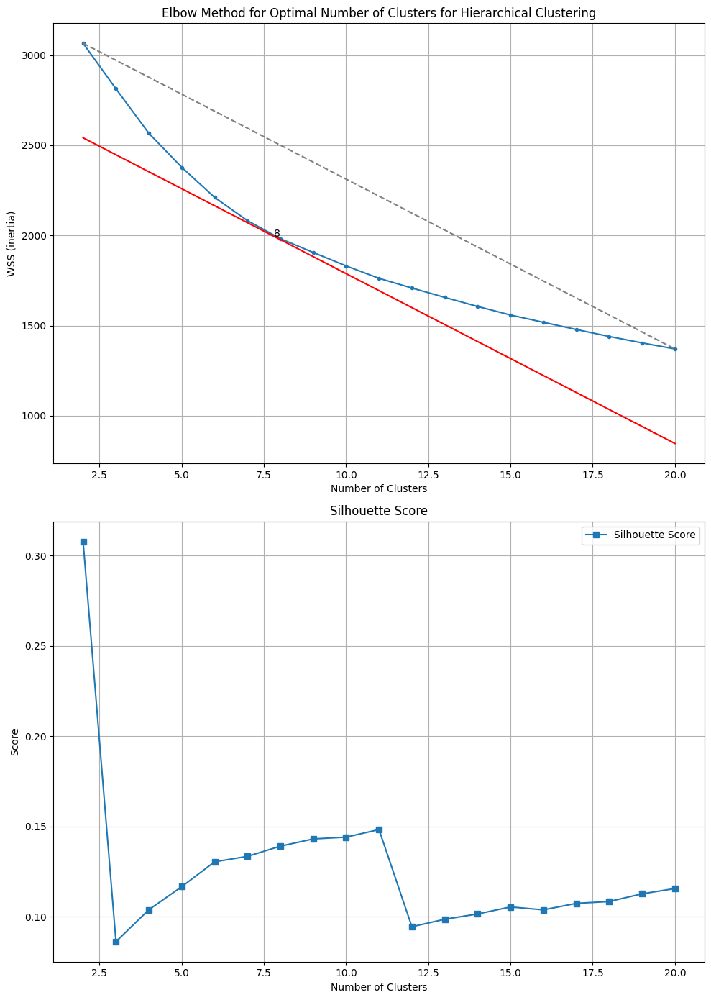

In [139]:
def wss_calculation2(K, data):
    WSS = []
    for i in range(1, K):
        cluster = AgglomerativeClustering(n_clusters=i + 1)
        labels = cluster.fit_predict(data)
        wss = []
        for j in range(i + 1):
            # extract each cluster according to its index
            cluster_data = data[labels == j]
            cluster_mean = cluster_data.mean(axis=0)
            distance = np.sum(np.square(cluster_data - cluster_mean))
            wss.append(distance)
        WSS.append(sum(wss))
    return WSS

WSS = wss_calculation2(20, scaled_features)

# Test out different values of n_clusters using the elbow method
# Try the numbers between 2 to 20
n_cluster_options = range(2, 21)

silhouette_scores_hierarchical = []
hierarchical_results = {}

for n_cluster in n_cluster_options:
    hierarchical = AgglomerativeClustering(n_clusters=n_cluster, linkage='ward', metric='euclidean')
    hierarchical.fit(scaled_features)
    hierarchical_labels = hierarchical.labels_
    hierarchical_results[n_cluster] = hierarchical_labels

    # Record the metrics
    silhouette_scores_hierarchical.append(silhouette_score(scaled_features, hierarchical_labels))

start_point = (n_cluster_options[0], WSS[0])
end_point = (n_cluster_options[-1], WSS[-1])
slope = (end_point[1] - start_point[1]) / (end_point[0] - start_point[0])

x_values = np.linspace(2, 20)
y_values = slope * x_values + 2730

#plot subplots
fig, ax = plt.subplots(2, 1, figsize=(10, 14))

# Plot elbow method (inertia)
ax[0].plot(n_cluster_options, WSS, marker='.')
ax[0].plot([start_point[0], end_point[0]], [start_point[1], end_point[1]], linestyle='--', color='gray')
ax[0].plot(x_values, y_values, color='red')
ax[0].text(n_cluster_options[6], WSS[6], f'{n_cluster_options[6]}', ha='right', va='bottom')
ax[0].set_xlabel('Number of Clusters')
ax[0].set_ylabel('WSS (inertia)')
ax[0].set_title('Elbow Method for Optimal Number of Clusters for Hierarchical Clustering')
ax[0].grid(True)

# Plot the silhoutte score and davies-bouldin index
ax[1].plot(n_cluster_options, silhouette_scores_hierarchical, marker='s', label='Silhouette Score')
ax[1].set_xlabel('Number of Clusters')
ax[1].set_ylabel('Score')
ax[1].set_title('Silhouette Score')
ax[1].legend()
ax[1].grid(True)

plt.tight_layout()
plt.show()

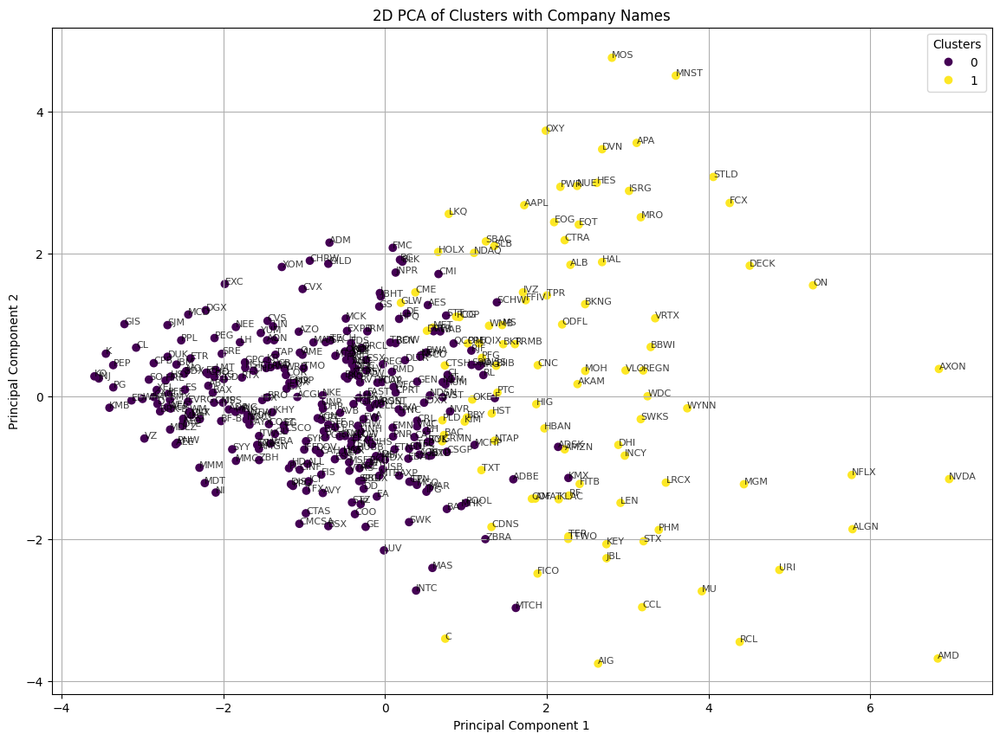

In [140]:
pca_2d = PCA(n_components=2)
components_2d = pca_2d.fit_transform(scaled_features)

# Apply hierarchical clustering with the optimal number of clusters
hierarchical = AgglomerativeClustering(n_clusters=2, linkage='ward', metric='euclidean')
clusters = hierarchical.fit_predict(scaled_features)

# Create 2D plot with annotations
plt.figure(figsize=(14, 10))
scatter = plt.scatter(components_2d[:, 0], components_2d[:, 1], c=clusters, cmap='viridis')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.title('2D PCA of Clusters with Company Names')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)

for i, txt in enumerate(merged_data['Company']):
    plt.annotate(txt, (components_2d[i, 0], components_2d[i, 1]), fontsize=8, alpha=0.75)

plt.show()

###**8.3.2 Count and percentage of industry sector in each cluster**

In [ ]:
hierarchical_second_sector_counts = pd.DataFrame({'Cluster': best_hierarchical_second_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
hierarchical_second_sector_percentages = hierarchical_second_sector_counts.div(hierarchical_second_sector_counts.sum(axis=1), axis=0) * 100

In [ ]:
# Stacked bar chart
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))
ax = hierarchical_second_sector_counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Count of Industry Sectors in Each Cluster (n_clusters = 2)')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [ ]:
# Stacked bar chart
ax = hierarchical_second_sector_percentages.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Percentage of Industry Sectors in Each Cluster (n_clusters = 3)')
plt.xlabel('Cluster')
plt.ylabel('Percentage')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

###**8.3.3 Count and percentage of cluster in each industry sector**

In [ ]:
# Similar as before, but switch 0 and 1 in "axis="
hierarchical_second_cluster_percentages = hierarchical_second_sector_counts.div(hierarchical_second_sector_counts.sum(axis=0), axis=1) * 100

In [ ]:
# Stacked bar charts
ax = kmeans_second_sector_counts.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Count of Cluster in Each Industry Sector (n_clusters = 2)')
plt.xlabel('Industry Sector')
plt.ylabel('Count')
plt.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [ ]:
# Stacked bar charts
ax = hierarchical_second_cluster_percentages.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Percentage of Cluster in Each Industry Sector (n_clusters = 2)')
plt.xlabel('Industry Sector')
plt.ylabel('Percentage')
plt.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

#**9. Third approach: correlation matrix + feature engineering**

##**9.1 K-means clustering**

###**9.1.1 Hyperparameter tuning**

In [144]:
feature_matrix.set_index('Company', inplace=True)

In [145]:
if not all(correlation_matrix.index == feature_matrix.index):
    print("Indices do not match between the correlation matrix and feature matrix.")
else:
    # Concatenate the correlation matrix and the feature matrix horizontally
    # Use PCA to reduce the correlation matrix to 8 principal components
    pca = PCA(n_components=10)
    correlation_matrix_reduced = pca.fit_transform(correlation_matrix)
    correlation_matrix_reduced = pd.DataFrame(correlation_matrix_reduced)
    correlation_matrix_reduced.rename(columns={0: "Corr_PCA_1", 1: "Corr_PCA_2", 2: "Corr_PCA_3", 3: "Corr_PCA_4", 4: "Corr_PCA_5", 5: "Corr_PCA_6", 6: "Corr_PCA_7", 7: "Corr_PCA_8", 8: "Corr_PCA_9", 9: "Corr_PCA_10"}, inplace=True)
    correlation_matrix_reduced.index = correlation_matrix.index   # The underlying order of the rows remains after PCA

    combined_matrix = pd.concat([feature_matrix, correlation_matrix_reduced], axis=1)

In [146]:
combined_matrix.head()

,avg_return_pre_crisis,volatility_pre_crisis,avg_return_crisis,volatility_crisis,avg_return_post_crisis,volatility_post_crisis,avg_return_covid,volatility_covid,avg_return_post_covid,volatility_post_covid,Corr_PCA_1,Corr_PCA_2,Corr_PCA_3,Corr_PCA_4,Corr_PCA_5,Corr_PCA_6,Corr_PCA_7,Corr_PCA_8,Corr_PCA_9,Corr_PCA_10
AAPL,0.003060,0.024775,0.001281,0.030126,0.001194,0.016205,0.001053,0.023264,0.001678,0.012788,0.672405,-0.653636,-0.443668,-0.056129,-0.229598,-0.190065,-0.162563,0.152557,0.141502,0.104978
MSFT,0.000356,0.011085,0.000020,0.025123,0.000914,0.014376,0.000832,0.021890,0.001960,0.015794,-0.378804,-0.102554,-0.884703,-0.043815,-0.051670,-0.328802,-0.074152,0.135558,0.302901,0.160216
NVDA,0.002036,0.030606,-0.000298,0.042996,0.001507,0.025704,0.001829,0.035245,0.005338,0.030507,0.709742,-1.131153,-0.652119,-0.052182,-0.463892,-0.328701,-0.143165,0.299998,0.134455,-0.002337
AMZN,-0.000049,0.024757,0.001856,0.036857,0.001374,0.020287,0.000177,0.024624,0.002588,0.020798,1.292061,-0.888673,-0.403928,-0.348478,-0.260385,-0.168526,-0.150053,0.081144,0.131398,0.199323
BRK-B,0.000391,0.008356,-0.000154,0.021217,0.000582,0.011497,0.000540,0.016116,0.000612,0.008594,-0.959177,0.069834,0.071320,0.119224,0.420520,-0.023988,0.065813,0.101182,-0.017378,0.017297


In [147]:
# The correlation matrix columns are reduced to 10 columns
# which explain around 89% of the variance in the data
pca.explained_variance_ratio_.cumsum()

array([0.5010217 , 0.66862823, 0.74375908, 0.80532289, 0.83333404,
       0.84894624, 0.86229679, 0.87344252, 0.88175437, 0.88727922])

In [77]:
# Standardize the combined matrix
scaler2 = StandardScaler()
combined_matrix_scaled = scaler2.fit_transform(combined_matrix)

In [78]:
# *****Can take up to 8 minutes
param_grid_kmeans = {
    'n_clusters': range(2, 21),
    'n_init': ['auto', 10, 20, 30],
    'max_iter': [300, 400, 500],
    'init': ['k-means++', 'random'],
    'algorithm': ['lloyd', 'elkan'],
}

# In the variable name kmeans_third, I use 'third' to indicate 'third approach'
kmeans_third = KMeans(random_state=123)

# Initialize variables
best_kmeans_third_score = -2    # The lowest that silhouette score can be is -1
best_kmeans_third_grid = None
best_kmeans_third_labels = None

# To keep track of all combinations and their silhouette scores
kmeans_third_results = []

# Find the best hyperparameter combination
for g in ParameterGrid(param_grid_kmeans):
    kmeans_third.set_params(**g)
    kmeans_third.fit(combined_matrix_scaled)
    kmeans_third_labels = kmeans_third.labels_
    score = silhouette_score(combined_matrix_scaled, kmeans_third_labels)
    kmeans_third_results.append({'hyperparameters': g, 'silhouette_score': score, 'cluster_count': np.unique(kmeans_third_labels, return_counts=True)})

    if score > best_kmeans_third_score:
        best_kmeans_third_score = score
        best_kmeans_third_grid = g
        best_kmeans_third_labels = kmeans_third_labels

print("The best silhouette score is: ", best_kmeans_third_score)
print("The best hyperparameters are: ", best_kmeans_third_grid)
kmeans_third_results_df = pd.DataFrame(kmeans_third_results)

The best silhouette score is:  0.20392201141157548
The best hyperparameters are:  {'algorithm': 'lloyd', 'init': 'random', 'max_iter': 300, 'n_clusters': 12, 'n_init': 'auto'}


For the record:  

The best silhouette score is:  0.20392201141157548

The best hyperparameters are:  {'algorithm': 'lloyd', 'init': 'random', 'max_iter': 500, 'n_clusters': 12, 'n_init': 10}

Note: there are multiple hyperparameter combinations that give the same silhouette score as shown below.

In [79]:
kmeans_third_results_df.sort_values(by='silhouette_score', ascending=False)

,hyperparameters,silhouette_score,cluster_count
801,"{'algorithm': 'elkan', 'init': 'random', 'max_...",0.203922,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], [29, ..."
876,"{'algorithm': 'elkan', 'init': 'random', 'max_...",0.203922,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], [29, ..."
420,"{'algorithm': 'lloyd', 'init': 'random', 'max_...",0.203922,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], [29, ..."
421,"{'algorithm': 'lloyd', 'init': 'random', 'max_...",0.203922,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], [29, ..."
724,"{'algorithm': 'elkan', 'init': 'random', 'max_...",0.203922,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], [29, ..."
800,"{'algorithm': 'elkan', 'init': 'random', 'max_...",0.203922,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], [29, ..."
725,"{'algorithm': 'elkan', 'init': 'random', 'max_...",0.203922,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], [29, ..."
268,"{'algorithm': 'lloyd', 'init': 'random', 'max_...",0.203922,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], [29, ..."
269,"{'algorithm': 'lloyd', 'init': 'random', 'max_...",0.203922,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], [29, ..."
877,"{'algorithm': 'elkan', 'init': 'random', 'max_...",0.203922,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], [29, ..."


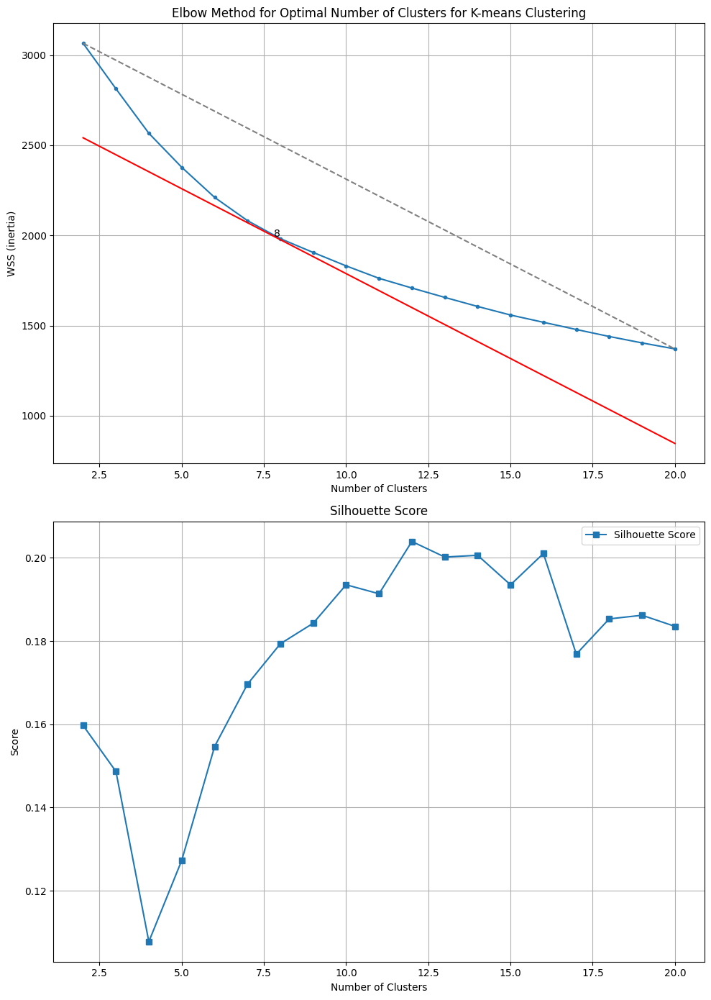

In [151]:
# Test out different values of n_clusters using the elbow method
# Try the numbers between 2 to 20
n_cluster_options = range(2, 21)

silhouette_scores_kmeans = []
kmeans_results = {}
wcss = []

for n_cluster in n_cluster_options:
    kmeans = KMeans(n_clusters=n_cluster, random_state=123, algorithm='lloyd', init='random', max_iter=500, n_init=10)
    kmeans.fit(combined_matrix_scaled)
    kmeans_labels = kmeans.labels_
    kmeans_results[n_cluster] = kmeans_labels
    wcss.append(kmeans.inertia_)

    # Record the metrics
    silhouette_scores_kmeans.append(silhouette_score(combined_matrix_scaled, kmeans_labels))

start_point = (n_cluster_options[0], WSS[0])
end_point = (n_cluster_options[-1], WSS[-1])
slope = (end_point[1] - start_point[1]) / (end_point[0] - start_point[0])

x_values = np.linspace(2, 20)
y_values = slope * x_values + 2730

#plot subplots
fig, ax = plt.subplots(2, 1, figsize=(10, 14))

# Plot elbow method (inertia)
ax[0].plot(n_cluster_options, WSS, marker='.')
ax[0].plot([start_point[0], end_point[0]], [start_point[1], end_point[1]], linestyle='--', color='gray')
ax[0].plot(x_values, y_values, color='red')
ax[0].text(n_cluster_options[6], WSS[6], f'{n_cluster_options[6]}', ha='right', va='bottom')
ax[0].set_xlabel('Number of Clusters')
ax[0].set_ylabel('WSS (inertia)')
ax[0].set_title('Elbow Method for Optimal Number of Clusters for K-means Clustering')
ax[0].grid(True)

# Plot the silhoutte score and davies-bouldin index
ax[1].plot(n_cluster_options, silhouette_scores_kmeans, marker='s', label='Silhouette Score')
ax[1].set_xlabel('Number of Clusters')
ax[1].set_ylabel('Score')
ax[1].set_title('Silhouette Score')
ax[1].legend()
ax[1].grid(True)

plt.tight_layout()
plt.show()

In [152]:
# Apply K-means clustering with the best hyperparameters
kmeans = KMeans(n_clusters=12, random_state=123, algorithm='lloyd', init='random', max_iter=500, n_init=10)
clusters = kmeans.fit_predict(combined_matrix_scaled)
clusters_third = clusters

# Add the cluster labels to the merged data
combined_matrix.reset_index(inplace=True)
combined_matrix['Cluster'] = clusters

In [153]:
combined_matrix.rename(columns={'index': 'Company'}, inplace=True)

In [154]:
combined_matrix = pd.merge(combined_matrix, gics_df, on='Company')

In [155]:
combined_matrix.head()

,Company,avg_return_pre_crisis,volatility_pre_crisis,avg_return_crisis,volatility_crisis,avg_return_post_crisis,volatility_post_crisis,avg_return_covid,volatility_covid,avg_return_post_covid,...,Corr_PCA_4,Corr_PCA_5,Corr_PCA_6,Corr_PCA_7,Corr_PCA_8,Corr_PCA_9,Corr_PCA_10,Cluster,GICS Sector,GICS Industry
0,AAPL,0.003060,0.024775,0.001281,0.030126,0.001194,0.016205,0.001053,0.023264,0.001678,...,-0.056129,-0.229598,-0.190065,-0.162563,0.152557,0.141502,0.104978,2,Technology,Consumer Electronics
1,MSFT,0.000356,0.011085,0.000020,0.025123,0.000914,0.014376,0.000832,0.021890,0.001960,...,-0.043815,-0.051670,-0.328802,-0.074152,0.135558,0.302901,0.160216,11,Technology,Software - Infrastructure
2,NVDA,0.002036,0.030606,-0.000298,0.042996,0.001507,0.025704,0.001829,0.035245,0.005338,...,-0.052182,-0.463892,-0.328701,-0.143165,0.299998,0.134455,-0.002337,4,Technology,Semiconductors
3,AMZN,-0.000049,0.024757,0.001856,0.036857,0.001374,0.020287,0.000177,0.024624,0.002588,...,-0.348478,-0.260385,-0.168526,-0.150053,0.081144,0.131398,0.199323,2,Consumer Cyclical,Internet Retail
4,BRK-B,0.000391,0.008356,-0.000154,0.021217,0.000582,0.011497,0.000540,0.016116,0.000612,...,0.119224,0.420520,-0.023988,0.065813,0.101182,-0.017378,0.017297,3,Financial Services,Insurance - Diversified


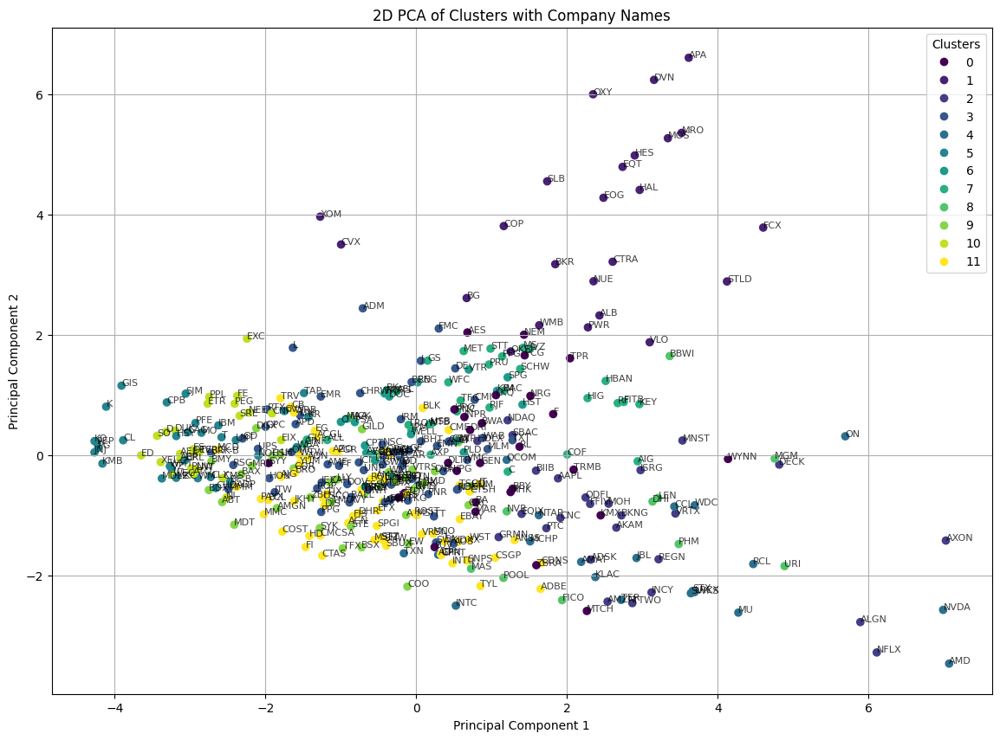

In [156]:
pca_2d = PCA(n_components=2)
components_2d = pca_2d.fit_transform(combined_matrix_scaled)

# Create 2D plot with annotations
plt.figure(figsize=(14, 10))
scatter = plt.scatter(components_2d[:, 0], components_2d[:, 1], c=clusters, cmap='viridis')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.title('2D PCA of Clusters with Company Names')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)

for i, txt in enumerate(combined_matrix['Company']):
    plt.annotate(txt, (components_2d[i, 0], components_2d[i, 1]), fontsize=8, alpha=0.75)

plt.show()

###**9.1.2 Count and percentage of industry sector in each cluster**

In [157]:
n_cluster_options = range(2, 21)
kmeans_third_labels = {}

for n_cluster in n_cluster_options:
    kmeans = KMeans(n_clusters=n_cluster, random_state=123, algorithm='lloyd', init='k-means++', max_iter=300, n_init=30)
    kmeans.fit(combined_matrix_scaled)
    kmeans_labels = kmeans.labels_
    kmeans_third_labels[n_cluster] = kmeans_labels

In [158]:
kmeans_third_sector_count_dfs = {}
kmeans_third_sector_percentage_dfs = {}

for n_cluster in n_cluster_options:
    cluster_labels = kmeans_third_labels[n_cluster]
    sector_counts = pd.DataFrame({'Cluster': cluster_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    kmeans_third_sector_count_dfs[n_cluster] = sector_counts
    sector_percentages = sector_counts.div(sector_counts.sum(axis=1), axis=0) * 100
    kmeans_third_sector_percentage_dfs[n_cluster] = sector_percentages

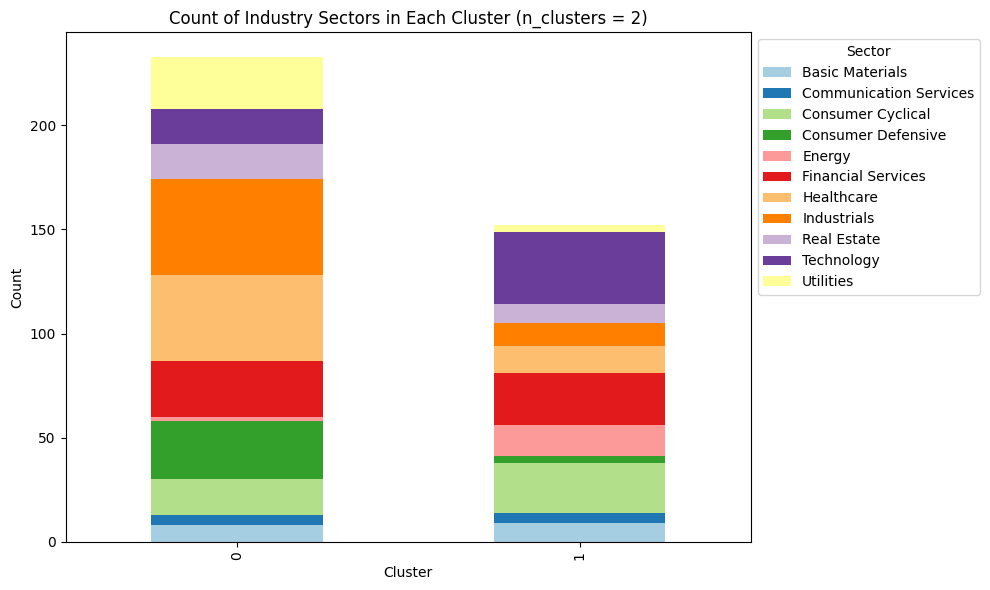

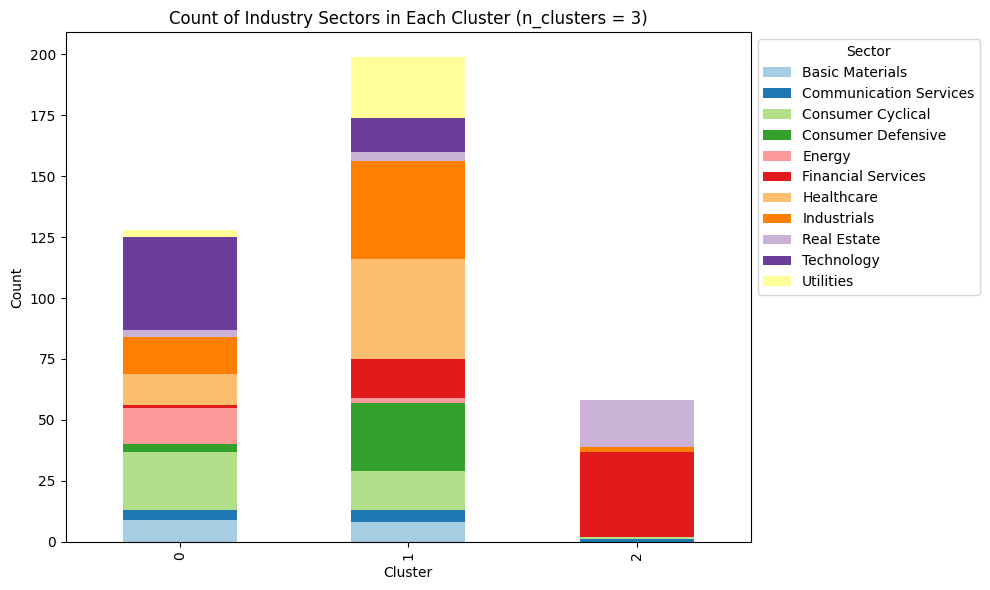

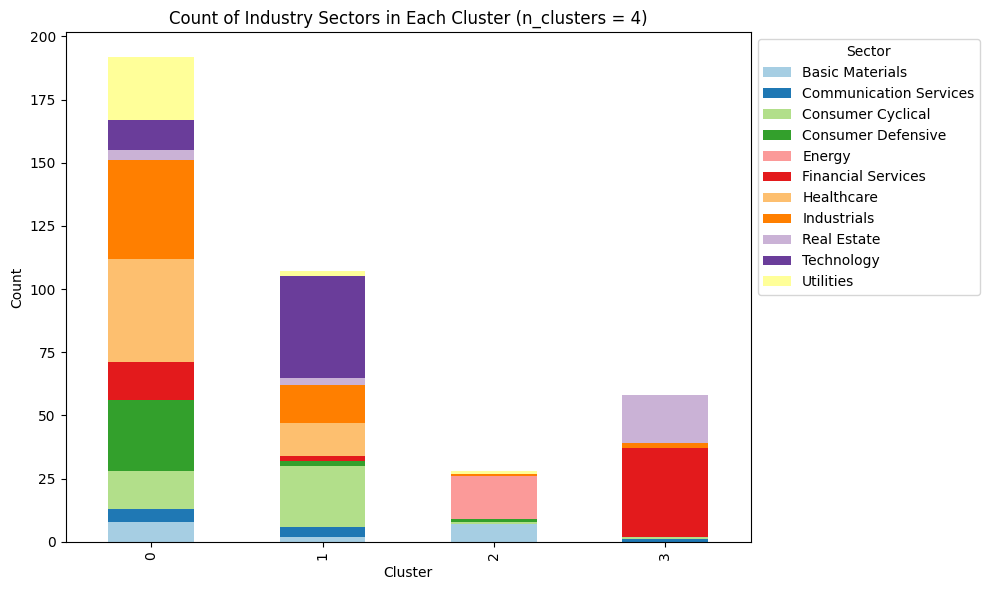

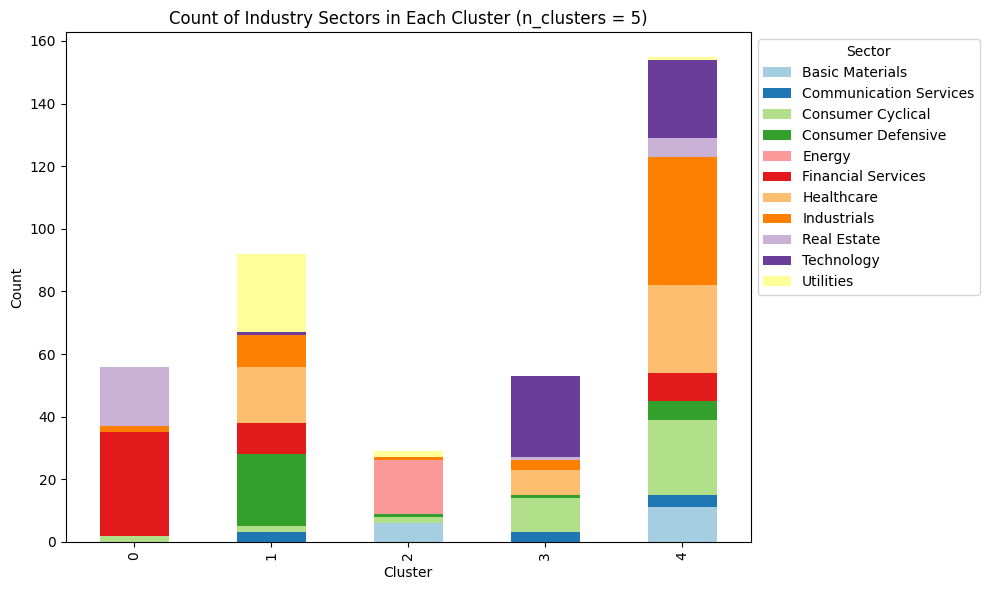

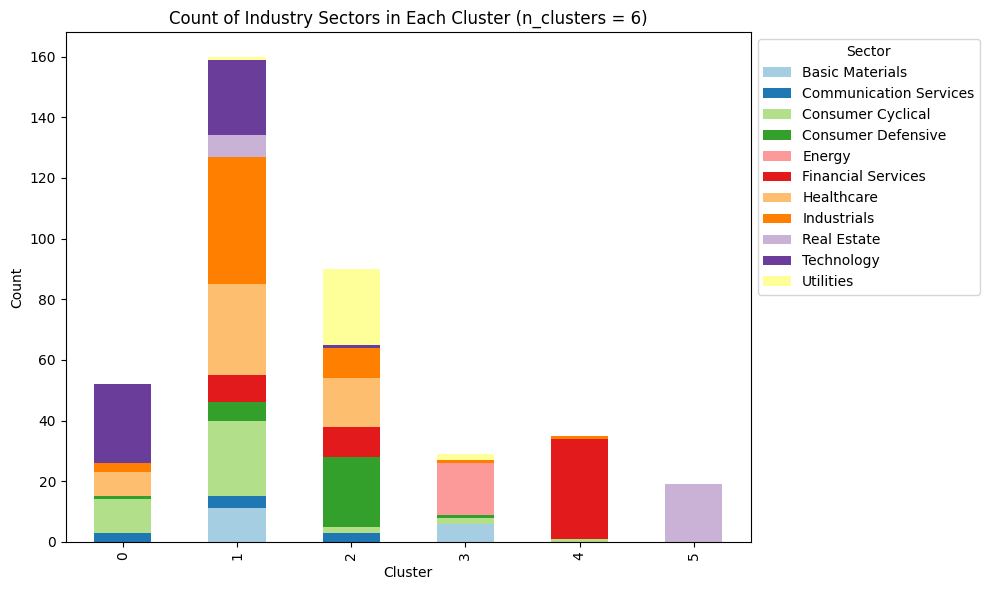

...

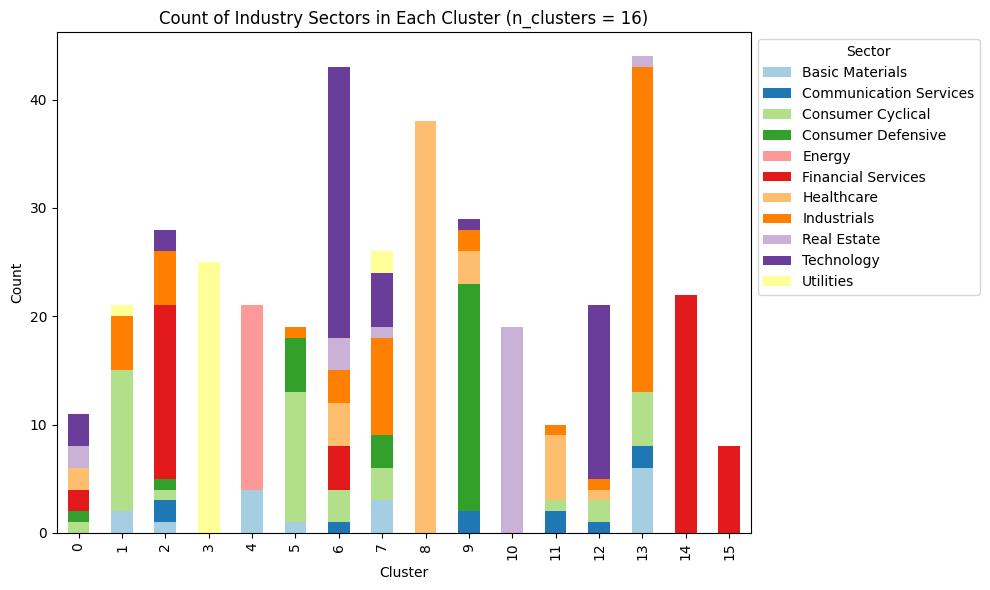

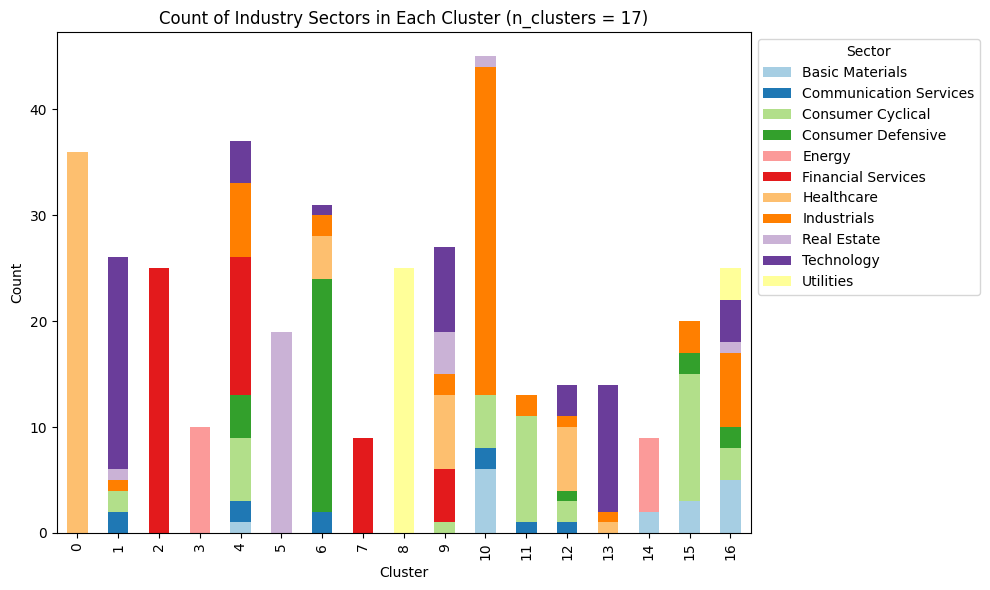

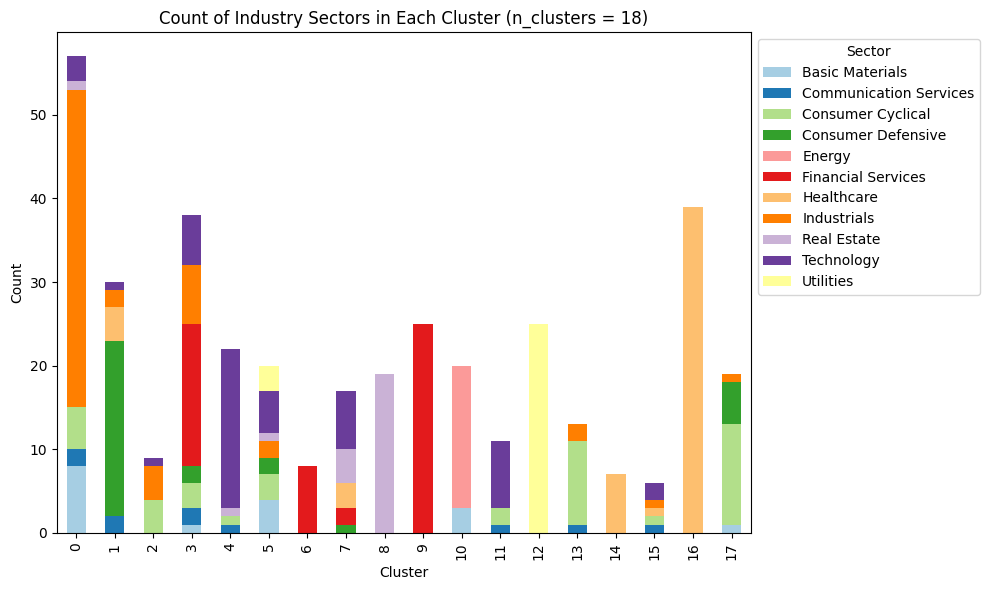

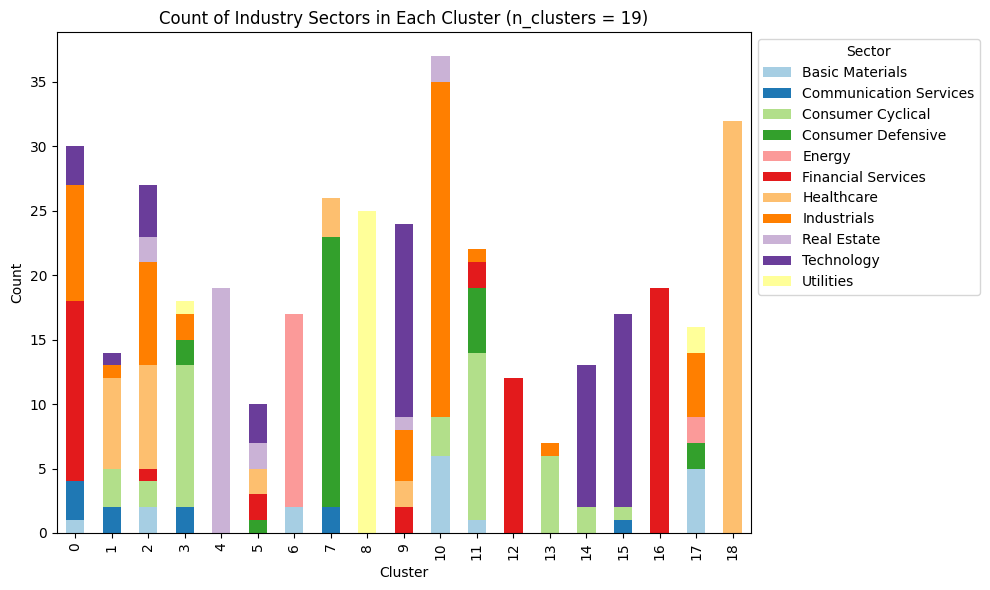

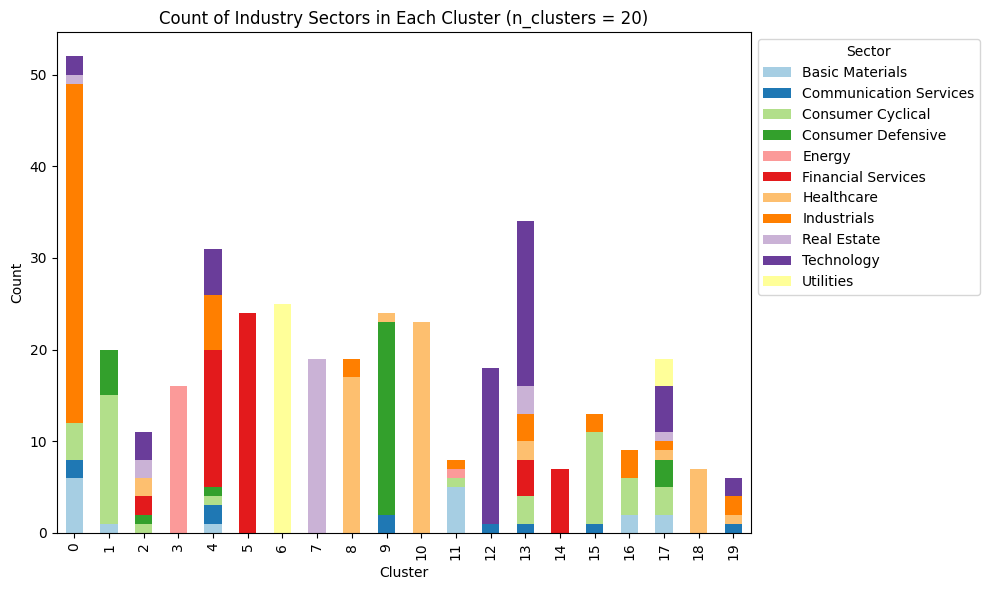

In [159]:
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Stacked bar charts
for n_cluster in n_cluster_options:
    kmeans_third_sector_count_df = kmeans_third_sector_count_dfs[n_cluster]

    ax = kmeans_third_sector_count_df.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
    plt.title(f'Count of Industry Sectors in Each Cluster (n_clusters = {n_cluster})')
    plt.xlabel('Cluster')
    plt.ylabel('Count')
    plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

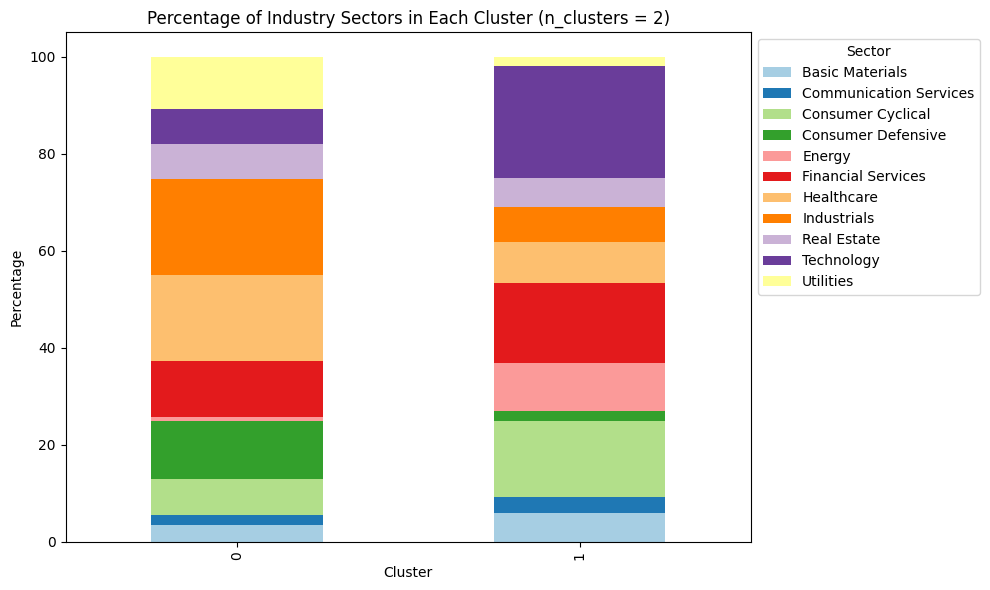

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       3.433476                2.145923           7.296137   
1                       5.921053                3.289474          15.789474   

Industry Sector  Consumer Defensive    Energy  Financial Services  Healthcare  \
Cluster                                                                         
0                         12.017167  0.858369           11.587983   17.596567   
1                          1.973684  9.868421           16.447368    8.552632   

Industry Sector  Industrials  Real Estate  Technology  Utilities  
Cluster                                                           
0                  19.742489     7.296137    7.296137  10.729614  
1                   7.236842     5.921053   23.026316   1.973684  


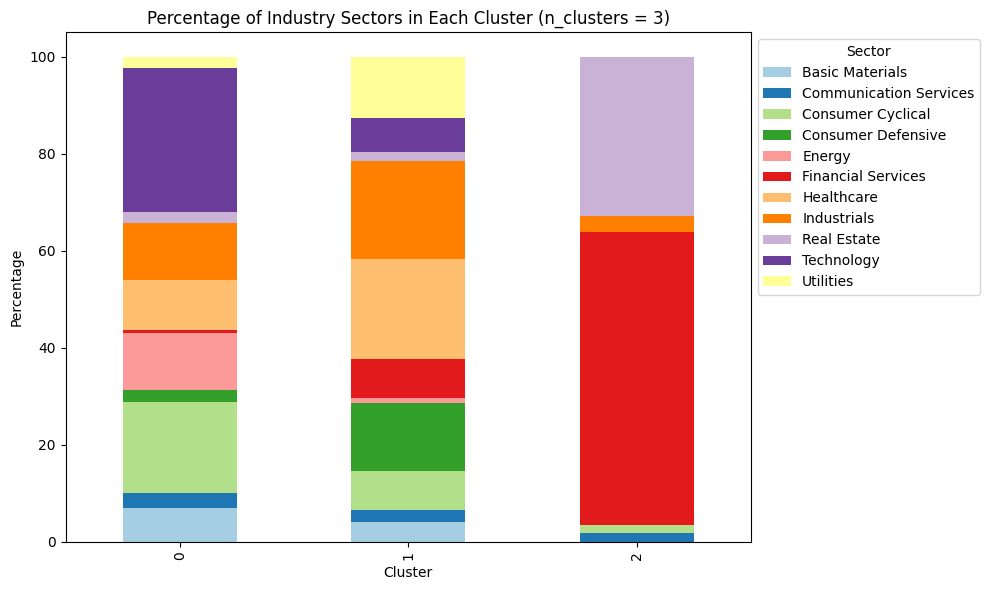

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       7.031250                3.125000          18.750000   
1                       4.020101                2.512563           8.040201   
2                       0.000000                1.724138           1.724138   

Industry Sector  Consumer Defensive     Energy  Financial Services  \
Cluster                                                              
0                          2.343750  11.718750            0.781250   
1                         14.070352   1.005025            8.040201   
2                          0.000000   0.000000           60.344828   

Industry Sector  Healthcare  Industrials  Real Estate  Technology  Utilities  
Cluster                                                                       
0                 10.156250    11.718750     2.343750   29.687500   2.343750  
1               

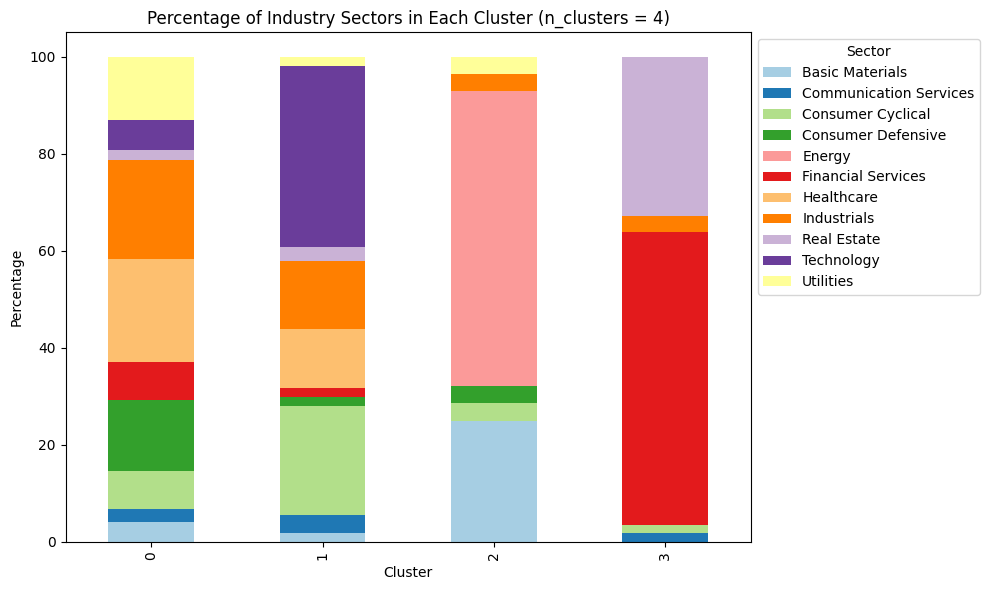

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       4.166667                2.604167           7.812500   
1                       1.869159                3.738318          22.429907   
2                      25.000000                0.000000           3.571429   
3                       0.000000                1.724138           1.724138   

Industry Sector  Consumer Defensive     Energy  Financial Services  \
Cluster                                                              
0                         14.583333   0.000000            7.812500   
1                          1.869159   0.000000            1.869159   
2                          3.571429  60.714286            0.000000   
3                          0.000000   0.000000           60.344828   

Industry Sector  Healthcare  Industrials  Real Estate  Technology  Utilities  
Cluster                  

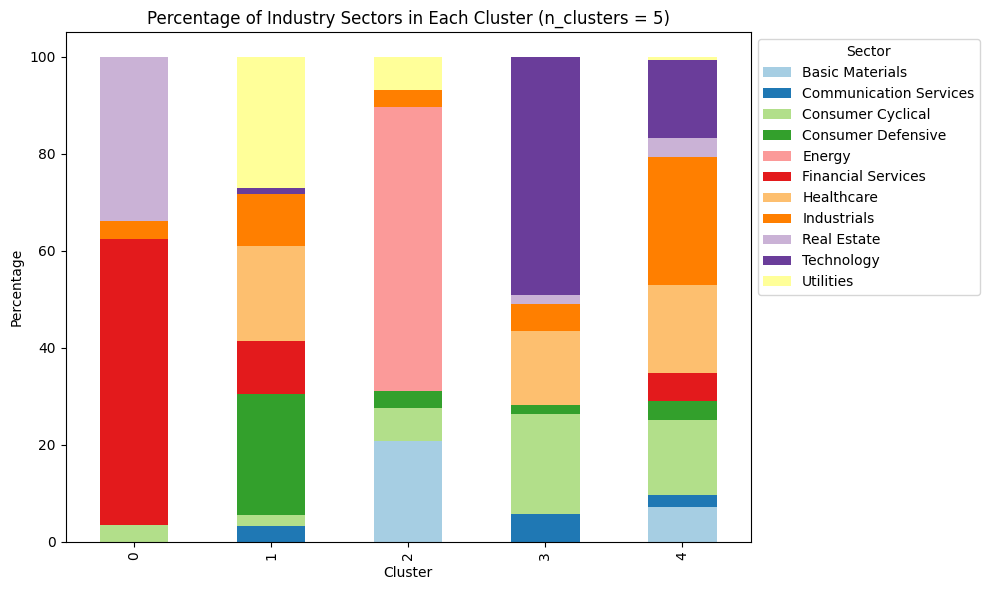

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                0.000000           3.571429   
1                       0.000000                3.260870           2.173913   
2                      20.689655                0.000000           6.896552   
3                       0.000000                5.660377          20.754717   
4                       7.096774                2.580645          15.483871   

Industry Sector  Consumer Defensive    Energy  Financial Services  Healthcare  \
Cluster                                                                         
0                          0.000000   0.00000           58.928571    0.000000   
1                         25.000000   0.00000           10.869565   19.565217   
2                          3.448276  58.62069            0.000000    0.000000   
3                          1.886792   0.0

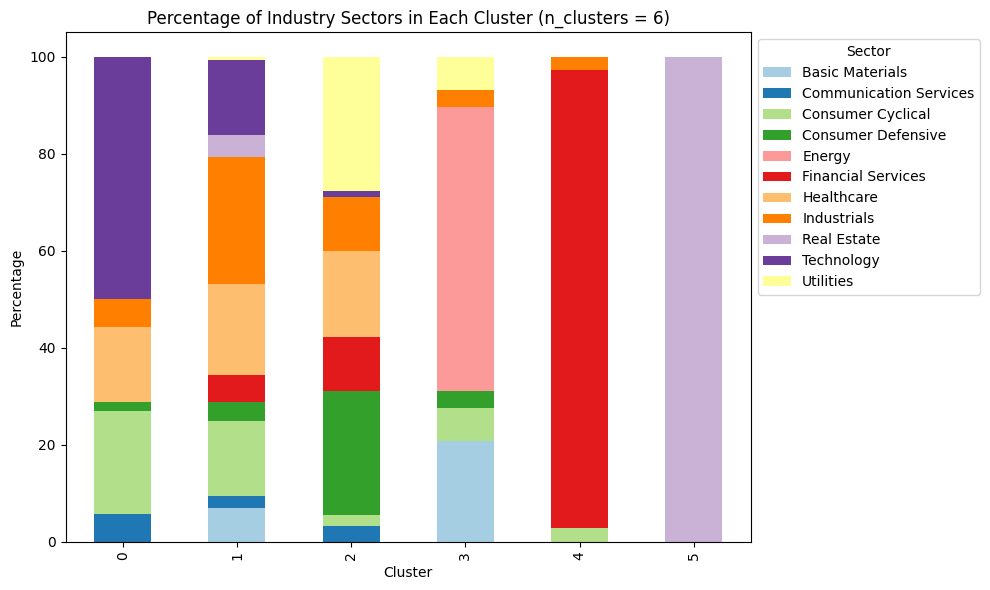

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                5.769231          21.153846   
1                       6.875000                2.500000          15.625000   
2                       0.000000                3.333333           2.222222   
3                      20.689655                0.000000           6.896552   
4                       0.000000                0.000000           2.857143   
5                       0.000000                0.000000           0.000000   

Industry Sector  Consumer Defensive    Energy  Financial Services  Healthcare  \
Cluster                                                                         
0                          1.923077   0.00000            0.000000   15.384615   
1                          3.750000   0.00000            5.625000   18.750000   
2                         25.555556   0.000

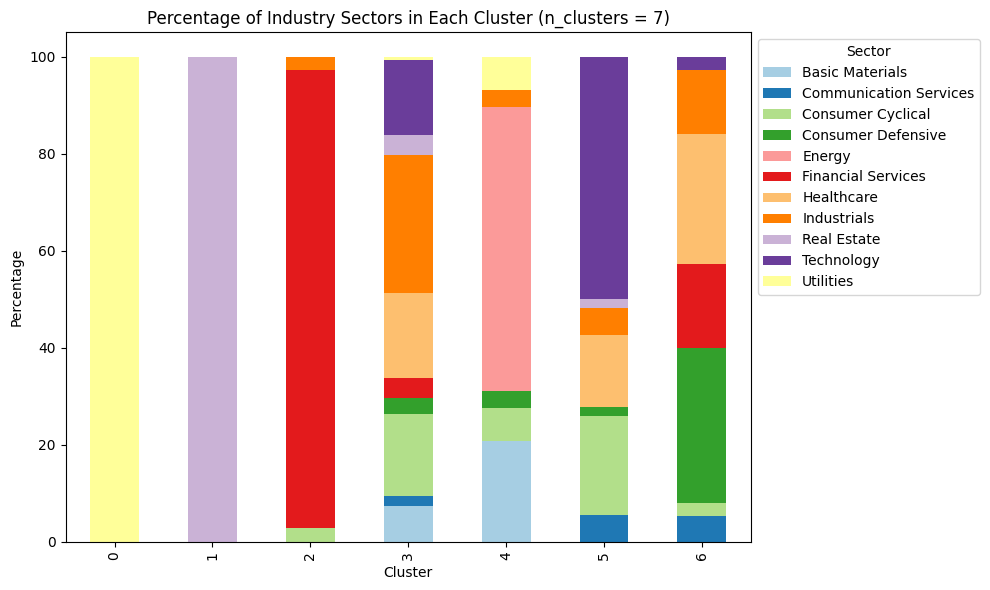

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                0.000000           0.000000   
1                       0.000000                0.000000           0.000000   
2                       0.000000                0.000000           2.857143   
3                       7.432432                2.027027          16.891892   
4                      20.689655                0.000000           6.896552   
5                       0.000000                5.555556          20.370370   
6                       0.000000                5.333333           2.666667   

Industry Sector  Consumer Defensive    Energy  Financial Services  Healthcare  \
Cluster                                                                         
0                          0.000000   0.00000            0.000000    0.000000   
1                          0.000000   0.00000

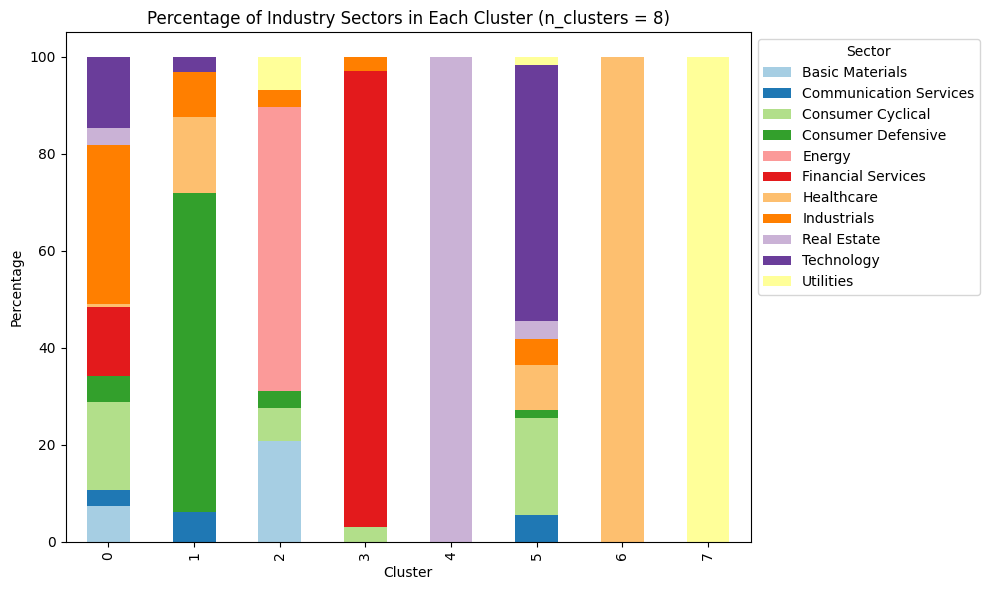

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       7.382550                3.355705          18.120805   
1                       0.000000                6.250000           0.000000   
2                      20.689655                0.000000           6.896552   
3                       0.000000                0.000000           3.030303   
4                       0.000000                0.000000           0.000000   
5                       0.000000                5.454545          20.000000   
6                       0.000000                0.000000           0.000000   
7                       0.000000                0.000000           0.000000   

Industry Sector  Consumer Defensive    Energy  Financial Services  Healthcare  \
Cluster                                                                         
0                          5.369128   0.00000  

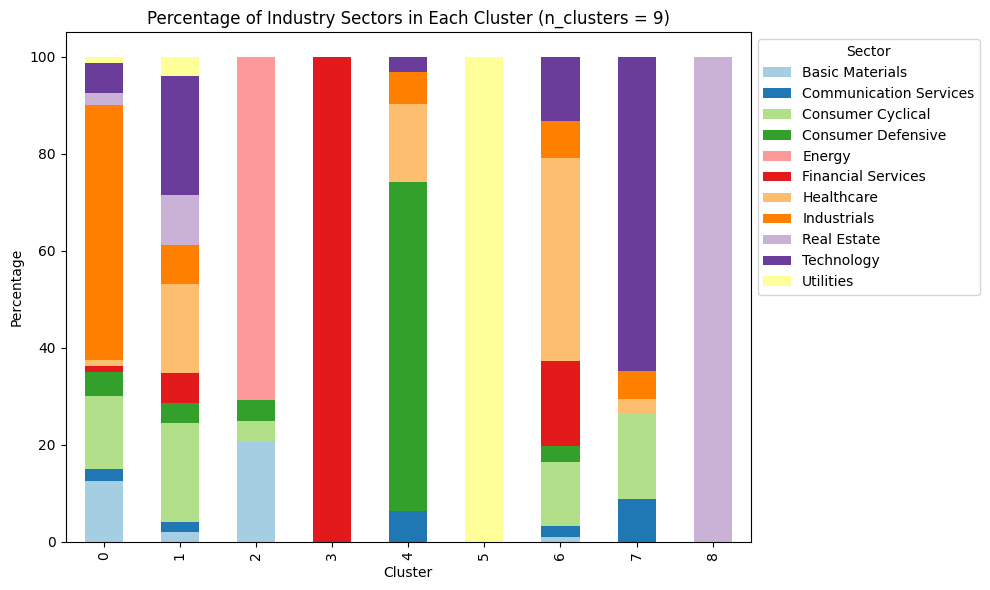

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      12.500000                2.500000          15.000000   
1                       2.040816                2.040816          20.408163   
2                      20.833333                0.000000           4.166667   
3                       0.000000                0.000000           0.000000   
4                       0.000000                6.451613           0.000000   
5                       0.000000                0.000000           0.000000   
6                       1.098901                2.197802          13.186813   
7                       0.000000                8.823529          17.647059   
8                       0.000000                0.000000           0.000000   

Industry Sector  Consumer Defensive     Energy  Financial Services  \
Cluster                                                     

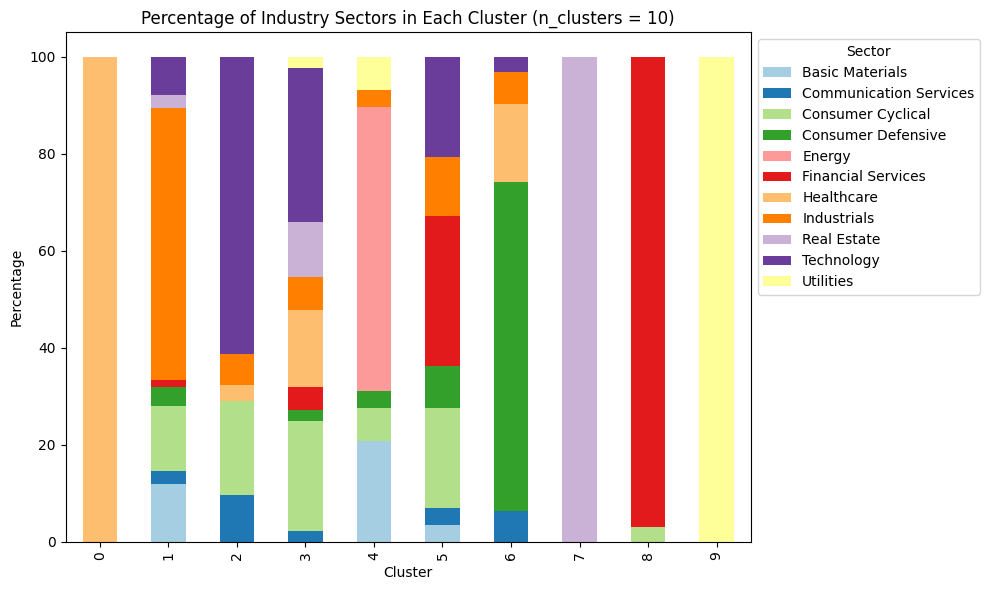

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                0.000000           0.000000   
1                      12.000000                2.666667          13.333333   
2                       0.000000                9.677419          19.354839   
3                       0.000000                2.272727          22.727273   
4                      20.689655                0.000000           6.896552   
5                       3.448276                3.448276          20.689655   
6                       0.000000                6.451613           0.000000   
7                       0.000000                0.000000           0.000000   
8                       0.000000                0.000000           3.125000   
9                       0.000000                0.000000           0.000000   

Industry Sector  Consumer Defensive    Energy  Fina

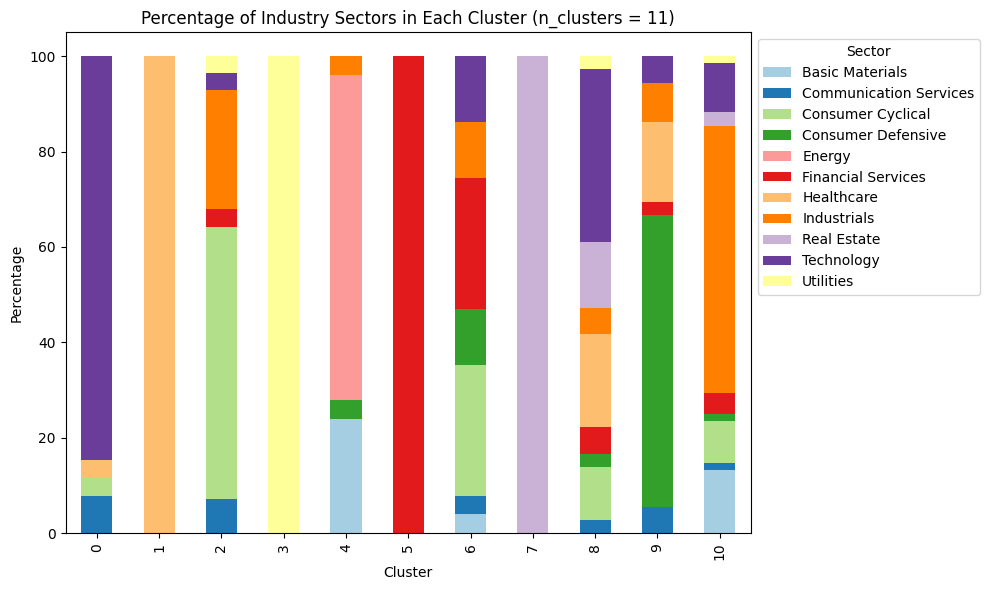

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                7.692308           3.846154   
1                       0.000000                0.000000           0.000000   
2                       0.000000                7.142857          57.142857   
3                       0.000000                0.000000           0.000000   
4                      24.000000                0.000000           0.000000   
5                       0.000000                0.000000           0.000000   
6                       3.921569                3.921569          27.450980   
7                       0.000000                0.000000           0.000000   
8                       0.000000                2.777778          11.111111   
9                       0.000000                5.555556           0.000000   
10                     13.235294                1.47

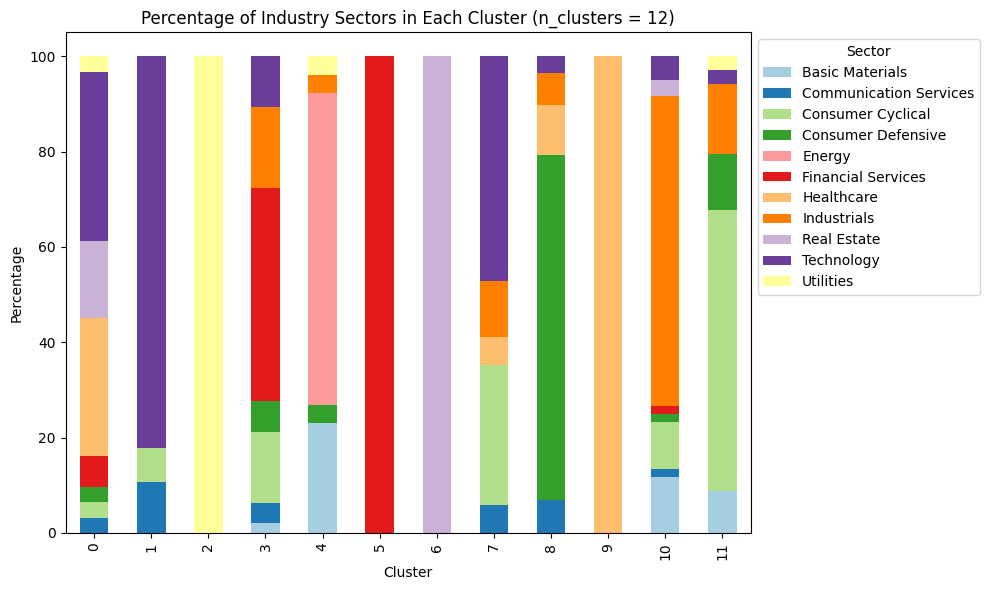

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                3.225806           3.225806   
1                       0.000000               10.714286           7.142857   
2                       0.000000                0.000000           0.000000   
3                       2.127660                4.255319          14.893617   
4                      23.076923                0.000000           0.000000   
5                       0.000000                0.000000           0.000000   
6                       0.000000                0.000000           0.000000   
7                       0.000000                5.882353          29.411765   
8                       0.000000                6.896552           0.000000   
9                       0.000000                0.000000           0.000000   
10                     11.666667                1.66

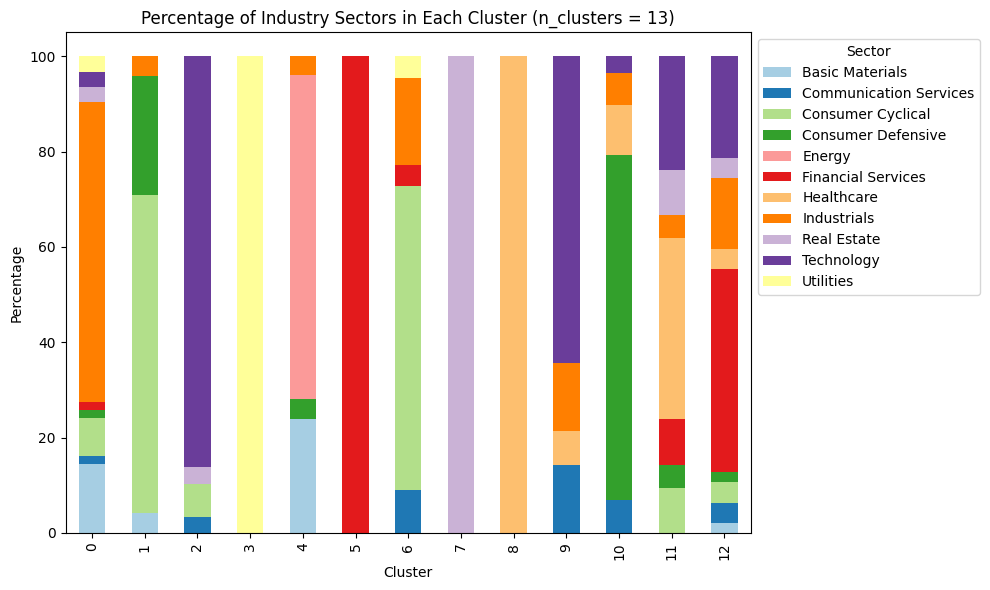

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      14.516129                1.612903           8.064516   
1                       4.166667                0.000000          66.666667   
2                       0.000000                3.448276           6.896552   
3                       0.000000                0.000000           0.000000   
4                      24.000000                0.000000           0.000000   
5                       0.000000                0.000000           0.000000   
6                       0.000000                9.090909          63.636364   
7                       0.000000                0.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                       0.000000               14.285714           0.000000   
10                      0.000000                6.89

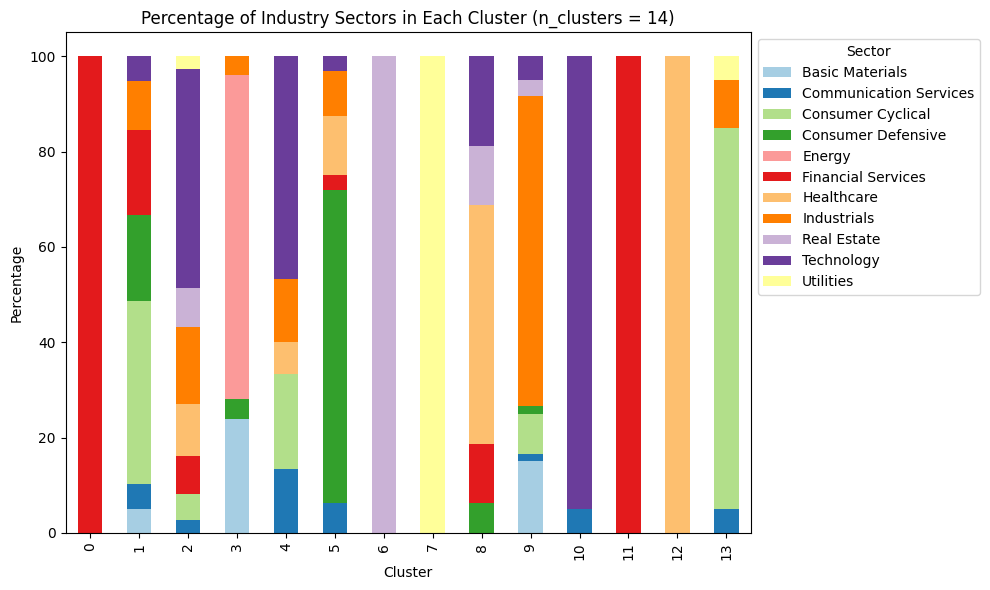

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                0.000000           0.000000   
1                       5.128205                5.128205          38.461538   
2                       0.000000                2.702703           5.405405   
3                      24.000000                0.000000           0.000000   
4                       0.000000               13.333333          20.000000   
5                       0.000000                6.250000           0.000000   
6                       0.000000                0.000000           0.000000   
7                       0.000000                0.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                      15.000000                1.666667           8.333333   
10                      0.000000                5.00

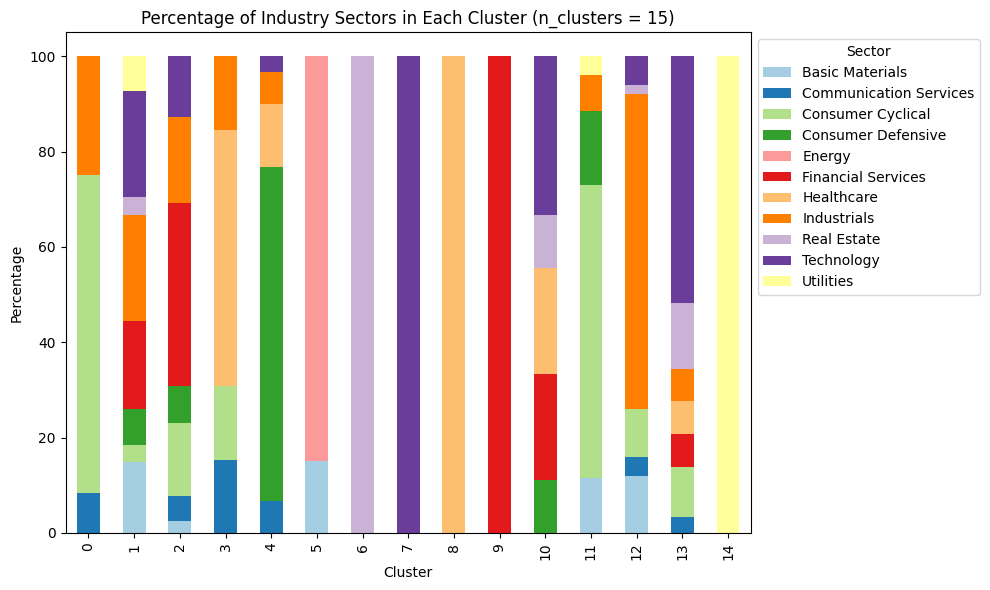

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                8.333333          66.666667   
1                      14.814815                0.000000           3.703704   
2                       2.564103                5.128205          15.384615   
3                       0.000000               15.384615          15.384615   
4                       0.000000                6.666667           0.000000   
5                      15.000000                0.000000           0.000000   
6                       0.000000                0.000000           0.000000   
7                       0.000000                0.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                       0.000000                0.000000           0.000000   
10                      0.000000                0.00

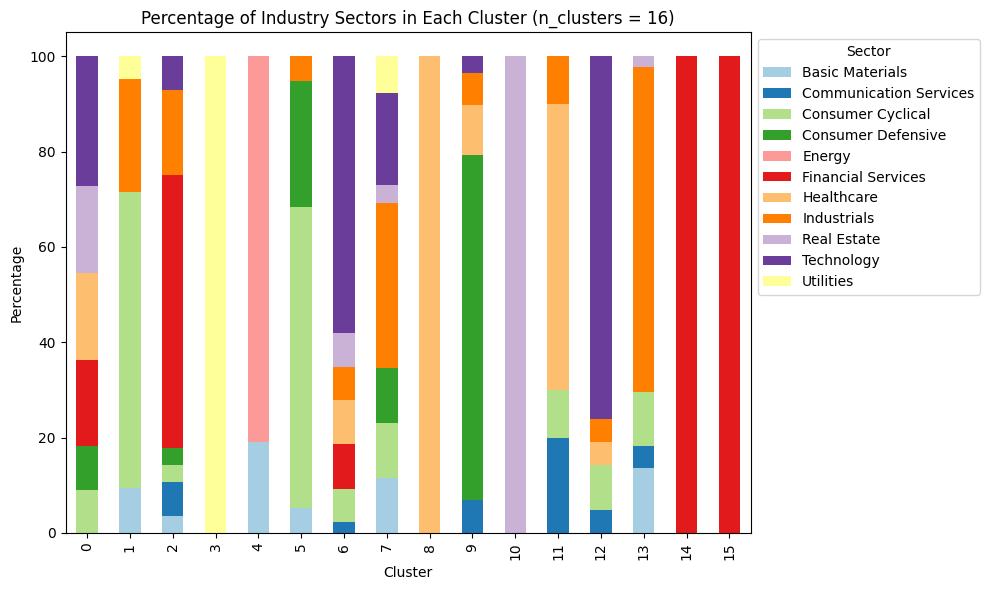

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                0.000000           9.090909   
1                       9.523810                0.000000          61.904762   
2                       3.571429                7.142857           3.571429   
3                       0.000000                0.000000           0.000000   
4                      19.047619                0.000000           0.000000   
5                       5.263158                0.000000          63.157895   
6                       0.000000                2.325581           6.976744   
7                      11.538462                0.000000          11.538462   
8                       0.000000                0.000000           0.000000   
9                       0.000000                6.896552           0.000000   
10                      0.000000                0.00

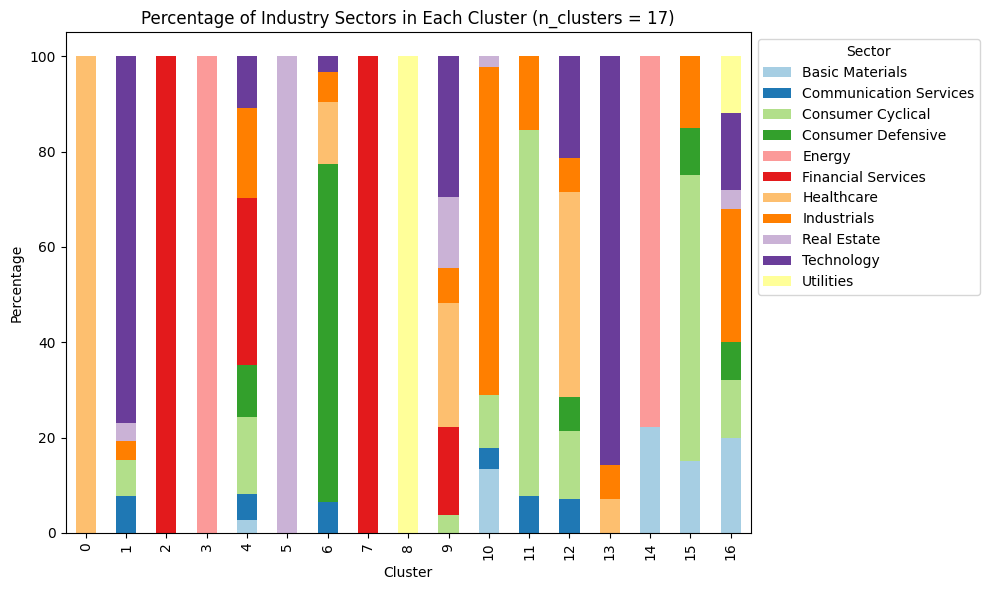

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                0.000000           0.000000   
1                       0.000000                7.692308           7.692308   
2                       0.000000                0.000000           0.000000   
3                       0.000000                0.000000           0.000000   
4                       2.702703                5.405405          16.216216   
5                       0.000000                0.000000           0.000000   
6                       0.000000                6.451613           0.000000   
7                       0.000000                0.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                       0.000000                0.000000           3.703704   
10                     13.333333                4.44

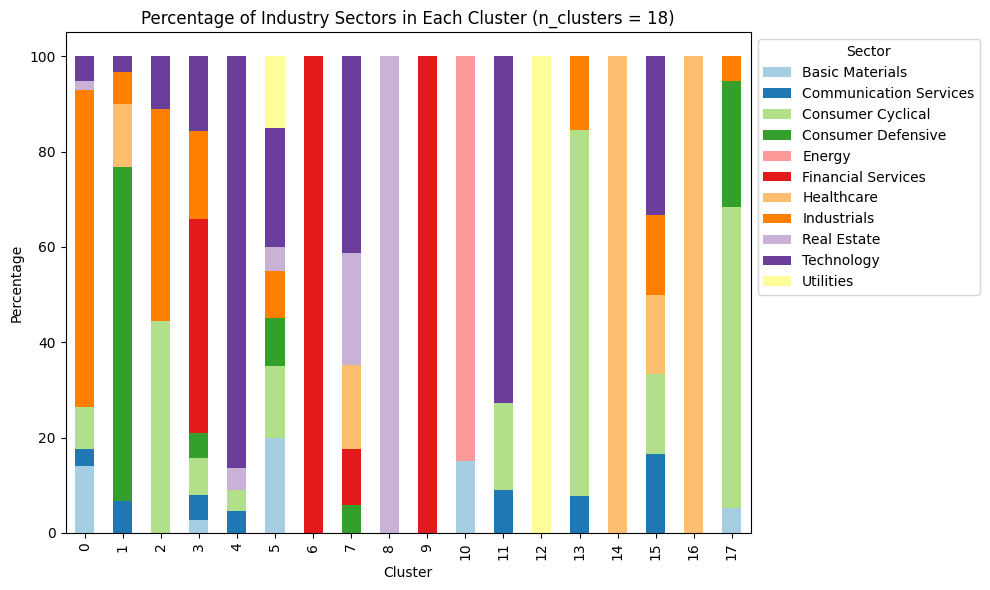

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      14.035088                3.508772           8.771930   
1                       0.000000                6.666667           0.000000   
2                       0.000000                0.000000          44.444444   
3                       2.631579                5.263158           7.894737   
4                       0.000000                4.545455           4.545455   
5                      20.000000                0.000000          15.000000   
6                       0.000000                0.000000           0.000000   
7                       0.000000                0.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                       0.000000                0.000000           0.000000   
10                     15.000000                0.00

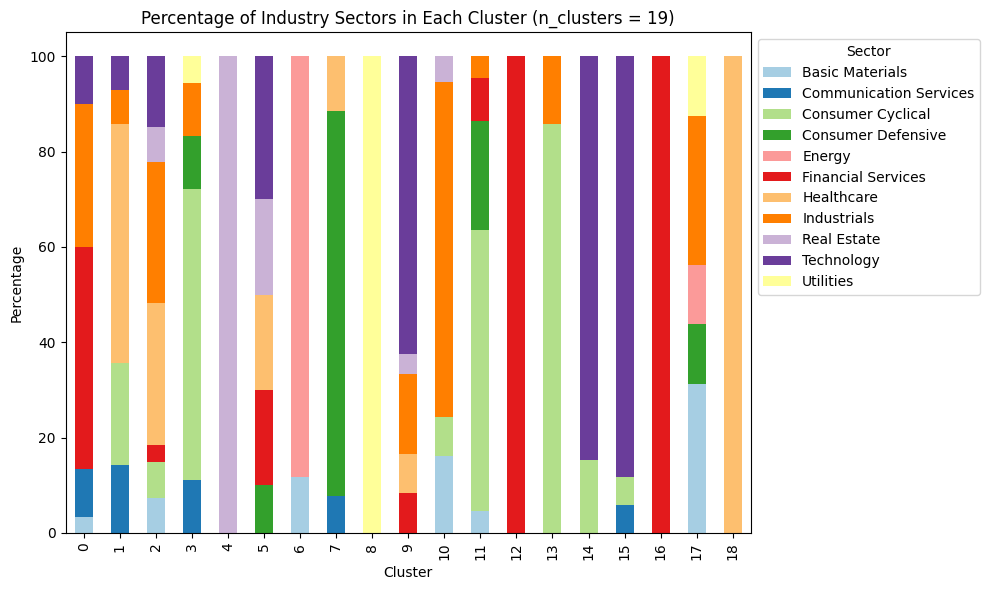

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       3.333333               10.000000           0.000000   
1                       0.000000               14.285714          21.428571   
2                       7.407407                0.000000           7.407407   
3                       0.000000               11.111111          61.111111   
4                       0.000000                0.000000           0.000000   
5                       0.000000                0.000000           0.000000   
6                      11.764706                0.000000           0.000000   
7                       0.000000                7.692308           0.000000   
8                       0.000000                0.000000           0.000000   
9                       0.000000                0.000000           0.000000   
10                     16.216216                0.00

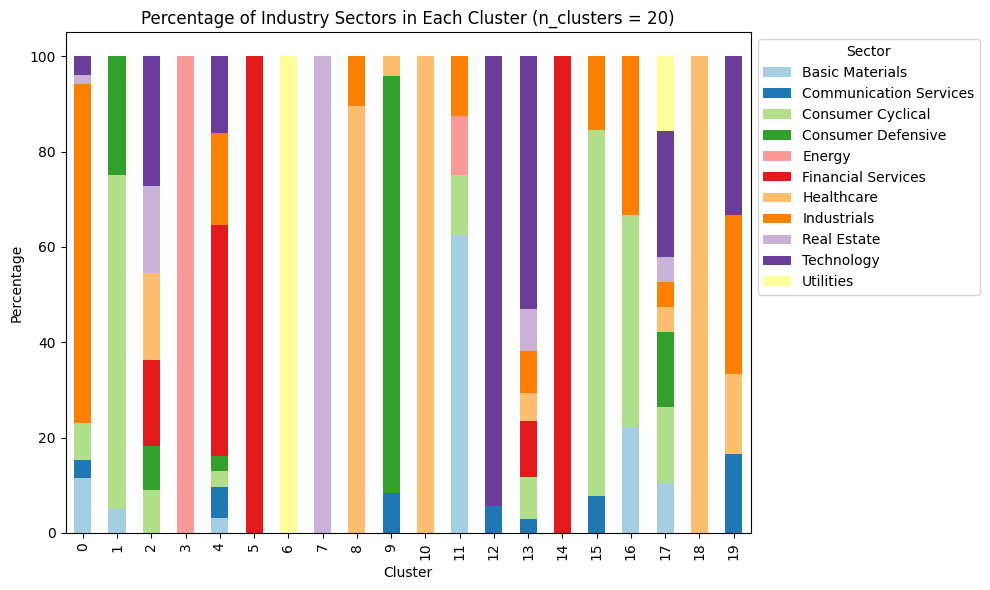

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      11.538462                3.846154           7.692308   
1                       5.000000                0.000000          70.000000   
2                       0.000000                0.000000           9.090909   
3                       0.000000                0.000000           0.000000   
4                       3.225806                6.451613           3.225806   
5                       0.000000                0.000000           0.000000   
6                       0.000000                0.000000           0.000000   
7                       0.000000                0.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                       0.000000                8.333333           0.000000   
10                      0.000000                0.00

In [160]:
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Stacked bar charts
for n_cluster in n_cluster_options:
    kmeans_third_sector_percentage_df = kmeans_third_sector_percentage_dfs[n_cluster]

    ax = kmeans_third_sector_percentage_df.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
    plt.title(f'Percentage of Industry Sectors in Each Cluster (n_clusters = {n_cluster})')
    plt.xlabel('Cluster')
    plt.ylabel('Percentage')
    plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    print(kmeans_third_sector_percentage_df)

#####**9.1.2.1 Plots for different periods**
See if the composition/structure of the clusters is maintained over time

[0.33016702 0.51761839 0.62621039 0.67922339 0.71006121 0.72633902
 0.73967566 0.75001594 0.75926051 0.76644441]


<Figure size 800x600 with 0 Axes>

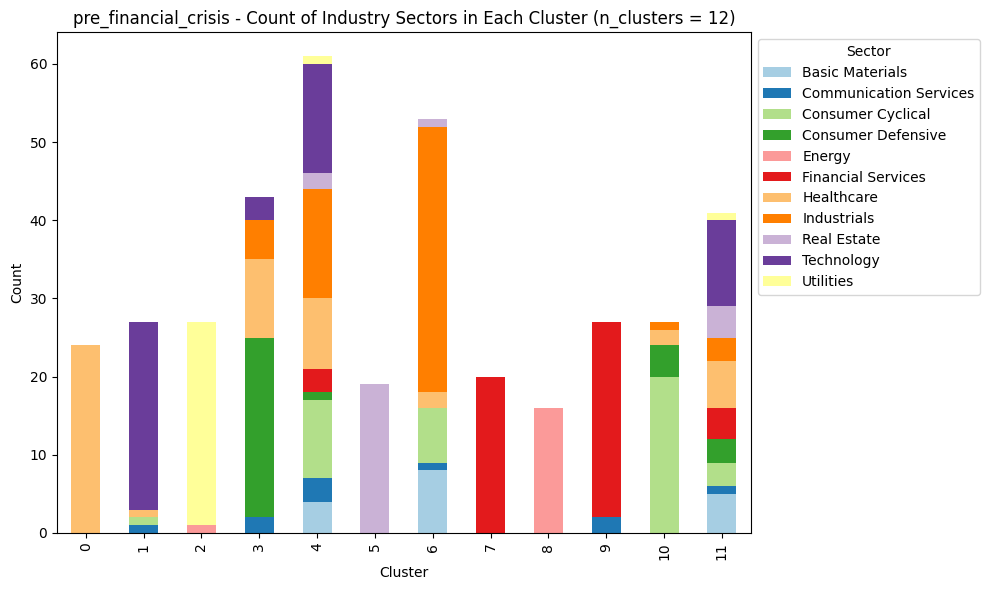

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                0.000000           0.000000   
1                       0.000000                3.703704           3.703704   
2                       0.000000                0.000000           0.000000   
3                       0.000000                4.651163           0.000000   
4                       6.557377                4.918033          16.393443   
5                       0.000000                0.000000           0.000000   
6                      15.094340                1.886792          13.207547   
7                       0.000000                0.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                       0.000000                7.407407           0.000000   
10                      0.000000                0.00

<Figure size 800x600 with 0 Axes>

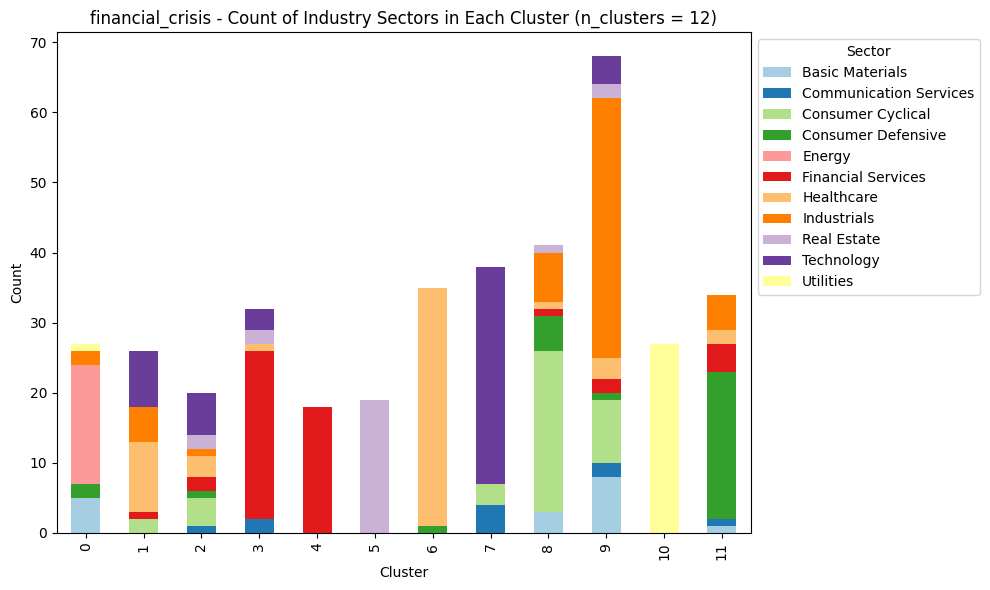

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      18.518519                0.000000           0.000000   
1                       0.000000                0.000000           7.692308   
2                       0.000000                5.000000          20.000000   
3                       0.000000                6.250000           0.000000   
4                       0.000000                0.000000           0.000000   
5                       0.000000                0.000000           0.000000   
6                       0.000000                0.000000           0.000000   
7                       0.000000               10.526316           7.894737   
8                       7.317073                0.000000          56.097561   
9                      11.764706                2.941176          13.235294   
10                      0.000000                0.00

<Figure size 800x600 with 0 Axes>

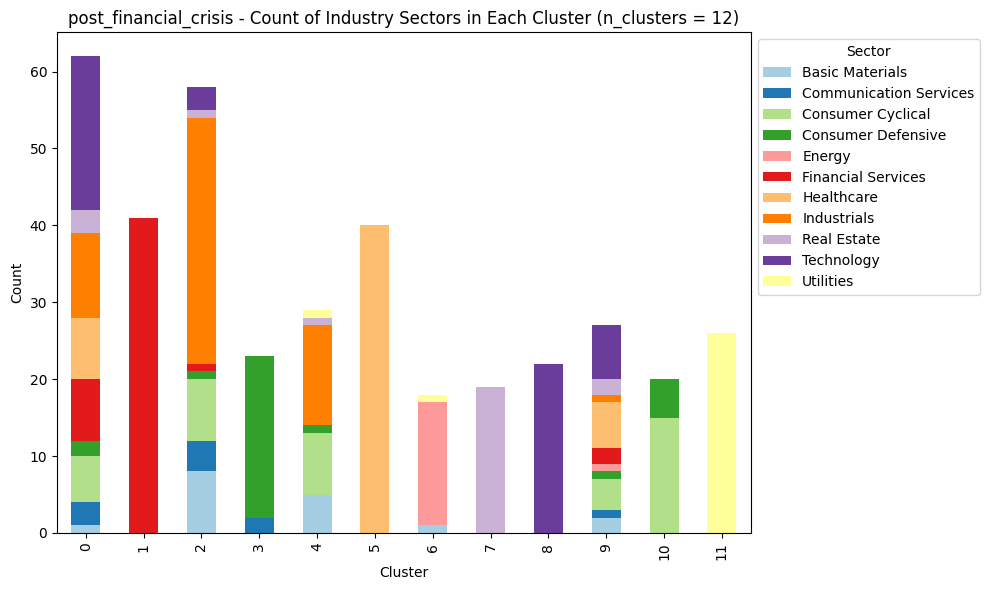

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       1.612903                4.838710           9.677419   
1                       0.000000                0.000000           0.000000   
2                      13.793103                6.896552          13.793103   
3                       0.000000                8.695652           0.000000   
4                      17.241379                0.000000          27.586207   
5                       0.000000                0.000000           0.000000   
6                       5.555556                0.000000           0.000000   
7                       0.000000                0.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                       7.407407                3.703704          14.814815   
10                      0.000000                0.00

<Figure size 800x600 with 0 Axes>

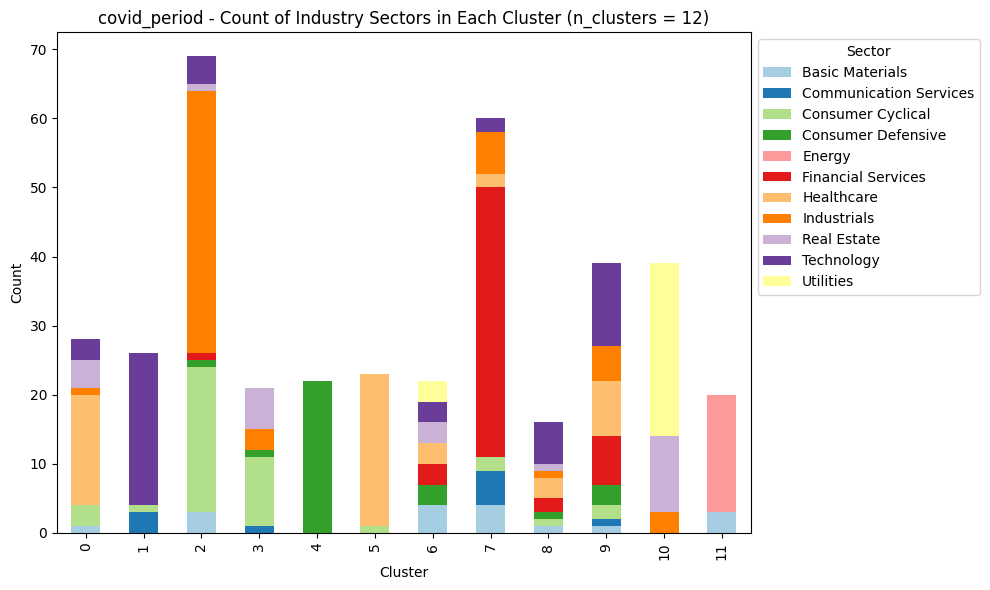

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       3.571429                0.000000          10.714286   
1                       0.000000               11.538462           3.846154   
2                       4.347826                0.000000          30.434783   
3                       0.000000                4.761905          47.619048   
4                       0.000000                0.000000           0.000000   
5                       0.000000                0.000000           4.347826   
6                      18.181818                0.000000           0.000000   
7                       6.666667                8.333333           3.333333   
8                       6.250000                0.000000           6.250000   
9                       2.564103                2.564103           5.128205   
10                      0.000000                0.00

<Figure size 800x600 with 0 Axes>

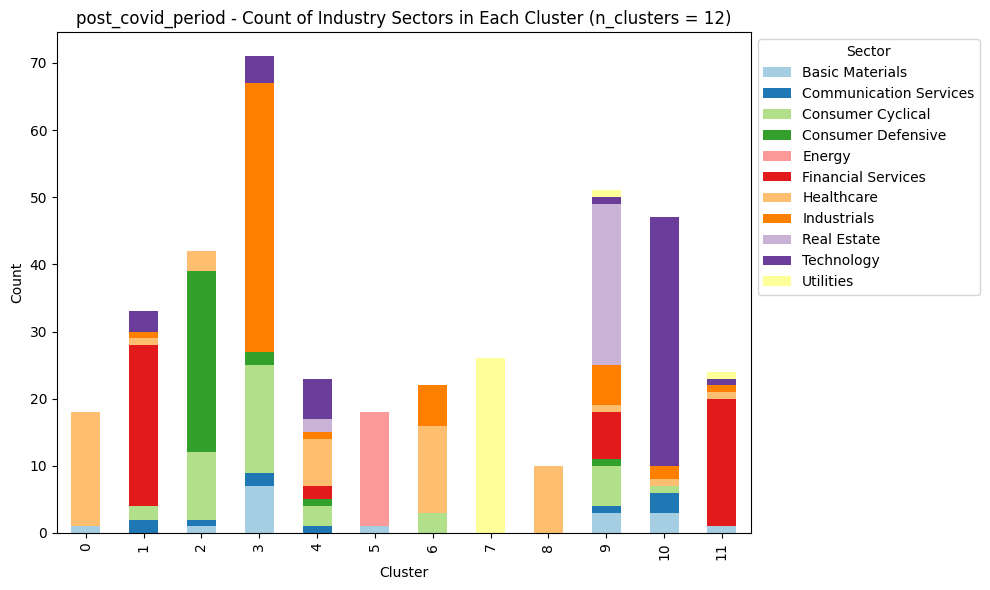

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       5.555556                0.000000           0.000000   
1                       0.000000                6.060606           6.060606   
2                       2.380952                2.380952          23.809524   
3                       9.859155                2.816901          22.535211   
4                       0.000000                4.347826          13.043478   
5                       5.555556                0.000000           0.000000   
6                       0.000000                0.000000          13.636364   
7                       0.000000                0.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                       5.882353                1.960784          11.764706   
10                      6.382979                6.38

In [161]:
# Periods by events
n_cluster = 12
pca_corr = PCA(n_components=10)
scaler = StandardScaler()
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Iterate over each period data
for index, period_data in enumerate(periods):
    # Use only the columns corresponding to this period
    # Get the correlation matrix specifically for this period
    period_correlation_matrix = period_data.corr()
    correlation_matrix_reduced2 = pca_corr.fit_transform(period_correlation_matrix)
    correlation_matrix_reduced2 = pd.DataFrame(correlation_matrix_reduced2)
    correlation_matrix_reduced2.rename(columns={0: "Corr_PCA_1", 1: "Corr_PCA_2", 2: "Corr_PCA_3", 3: "Corr_PCA_4", 4: "Corr_PCA_5", 5: "Corr_PCA_6", 6: "Corr_PCA_7", 7: "Corr_PCA_8", 8: "Corr_PCA_9", 9: "Corr_PCA_10"}, inplace=True)
    # print the percentage of variance explained by the 10 pca columns
    print(pca_corr.explained_variance_ratio_.cumsum())
    correlation_matrix_reduced2.index = period_correlation_matrix.index   # The underlying order of the rows remains after PCA

    combined_matrix = pd.concat([feature_matrix[period_columns[0]], correlation_matrix_reduced2], axis=1)

    scaled_features_1 = scaler.fit_transform(combined_matrix)

    # Use the best hyperparameters
    kmeans = KMeans(n_clusters=n_cluster, random_state=123, algorithm='lloyd', init='random', max_iter=500, n_init=10)
    kmeans.fit(scaled_features_1)
    kmeans_labels = kmeans.labels_

    plt.figure(figsize=(8, 6))

    sector_counts = pd.DataFrame({'Cluster': kmeans_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    sector_percentages = sector_counts.div(sector_counts.sum(axis=1), axis=0) * 100

    ax = sector_counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
    plt.title(f'{period_names[index]} - Count of Industry Sectors in Each Cluster (n_clusters = {n_cluster})')
    plt.xlabel('Cluster')
    plt.ylabel('Count')
    plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    print(sector_percentages)

[0.5109742  0.6819086  0.75469722 0.79584484 0.81975627 0.83493267
 0.84643285 0.85583861 0.86149361 0.86677427]


<Figure size 800x600 with 0 Axes>

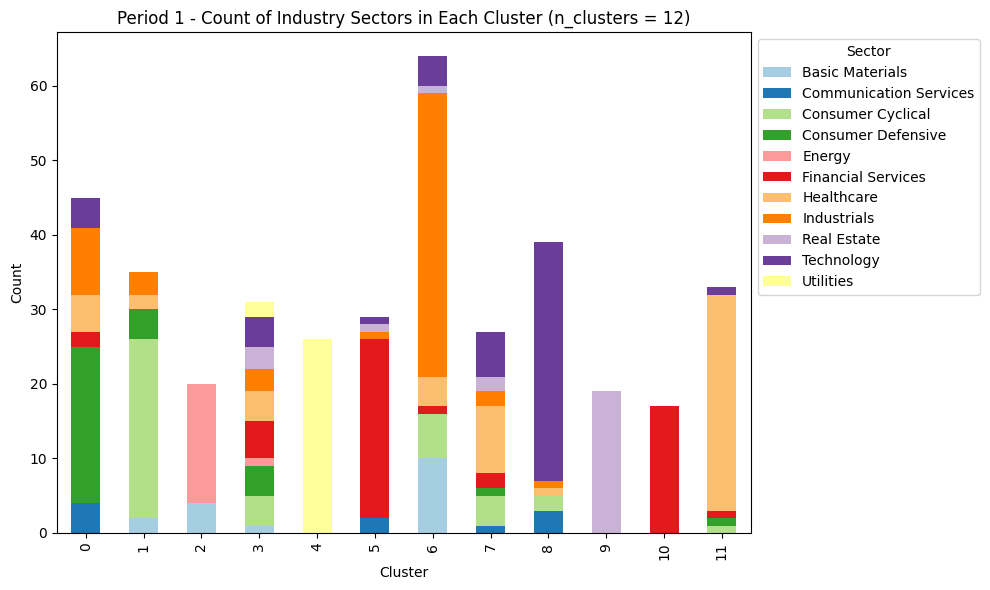

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                8.888889           0.000000   
1                       5.714286                0.000000          68.571429   
2                      20.000000                0.000000           0.000000   
3                       3.225806                0.000000          12.903226   
4                       0.000000                0.000000           0.000000   
5                       0.000000                6.896552           0.000000   
6                      15.625000                0.000000           9.375000   
7                       0.000000                3.703704          14.814815   
8                       0.000000                7.692308           5.128205   
9                       0.000000                0.000000           0.000000   
10                      0.000000                0.00

<Figure size 800x600 with 0 Axes>

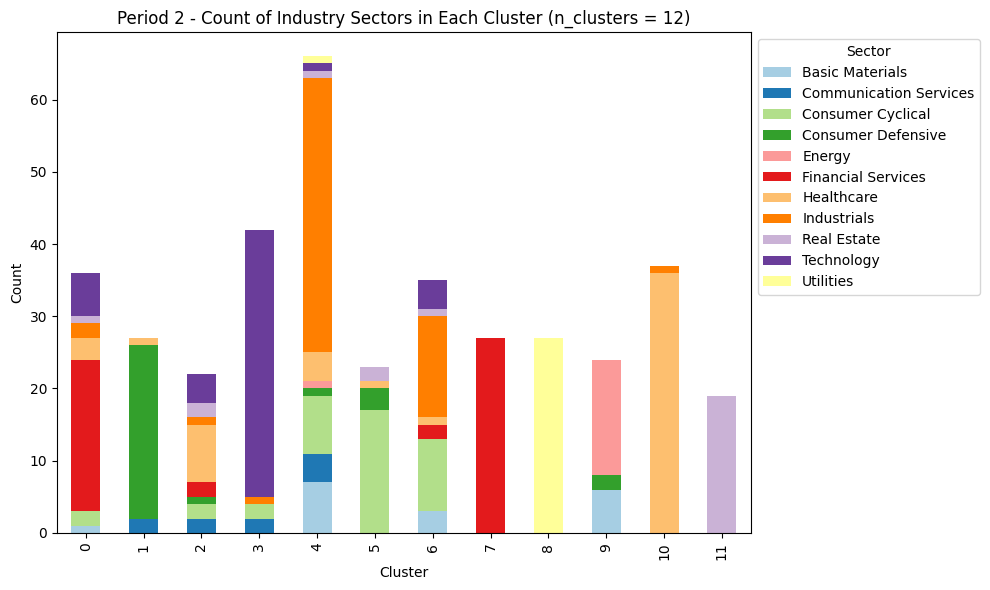

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       2.777778                0.000000           5.555556   
1                       0.000000                7.407407           0.000000   
2                       0.000000                9.090909           9.090909   
3                       0.000000                4.761905           4.761905   
4                      10.606061                6.060606          12.121212   
5                       0.000000                0.000000          73.913043   
6                       8.571429                0.000000          28.571429   
7                       0.000000                0.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                      25.000000                0.000000           0.000000   
10                      0.000000                0.00

<Figure size 800x600 with 0 Axes>

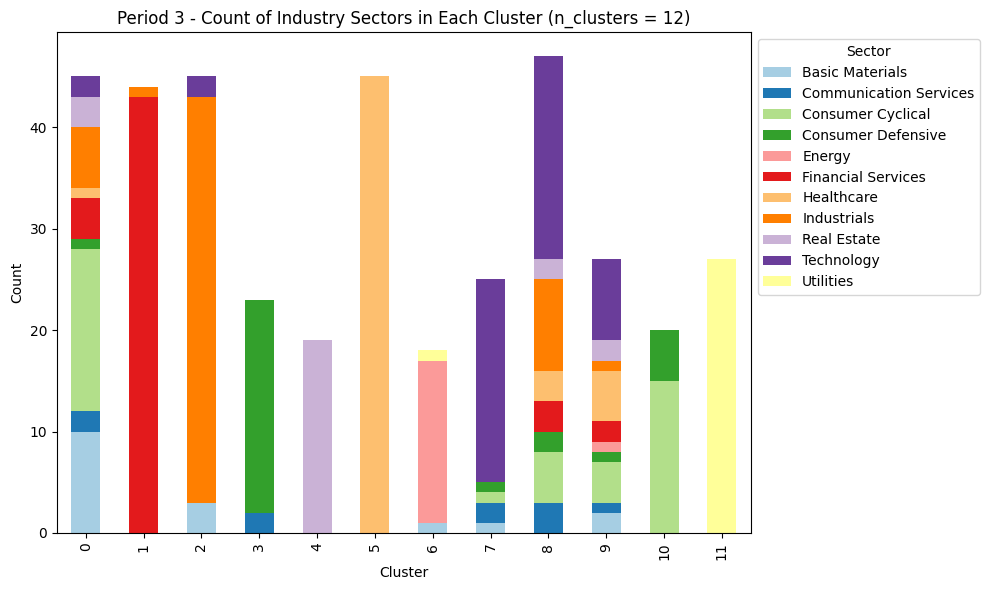

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      22.222222                4.444444          35.555556   
1                       0.000000                0.000000           0.000000   
2                       6.666667                0.000000           0.000000   
3                       0.000000                8.695652           0.000000   
4                       0.000000                0.000000           0.000000   
5                       0.000000                0.000000           0.000000   
6                       5.555556                0.000000           0.000000   
7                       4.000000                8.000000           4.000000   
8                       0.000000                6.382979          10.638298   
9                       7.407407                3.703704          14.814815   
10                      0.000000                0.00

<Figure size 800x600 with 0 Axes>

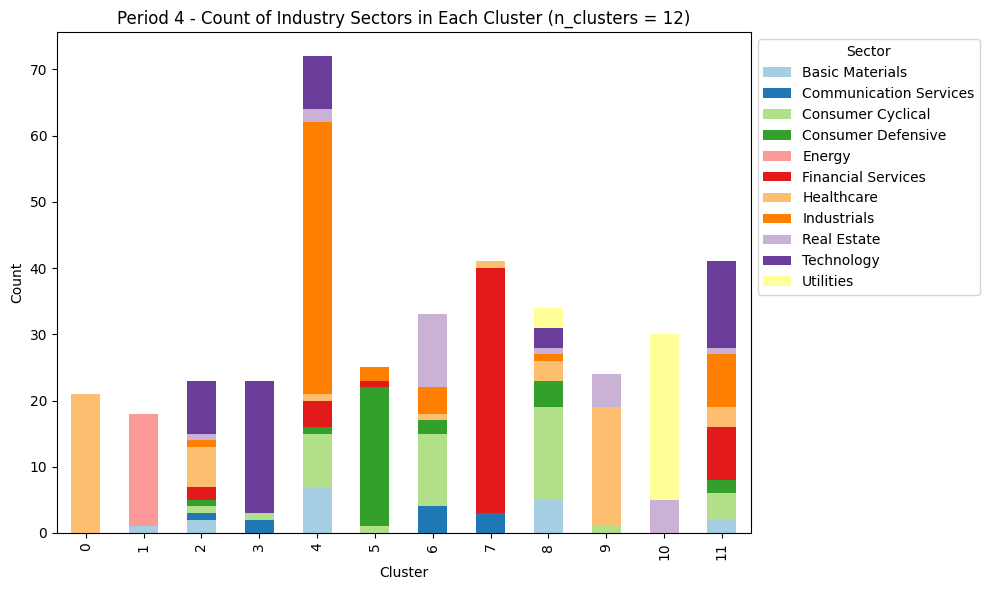

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                0.000000           0.000000   
1                       5.555556                0.000000           0.000000   
2                       8.695652                4.347826           4.347826   
3                       0.000000                8.695652           4.347826   
4                       9.722222                0.000000          11.111111   
5                       0.000000                0.000000           4.000000   
6                       0.000000               12.121212          33.333333   
7                       0.000000                7.317073           0.000000   
8                      14.705882                0.000000          41.176471   
9                       0.000000                0.000000           4.166667   
10                      0.000000                0.00

In [162]:
# 5-year periods
n_cluster = 12
pca_corr = PCA(n_components=10)
scaler = StandardScaler()
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Iterate over each period data
for index, period_data in enumerate(five_year_periods):
    # Use only the columns corresponding to this period
    # Get the correlation matrix specifically for this period
    period_correlation_matrix = period_data.corr()
    correlation_matrix_reduced2 = pca_corr.fit_transform(period_correlation_matrix)
    correlation_matrix_reduced2 = pd.DataFrame(correlation_matrix_reduced2)
    correlation_matrix_reduced2.rename(columns={0: "Corr_PCA_1", 1: "Corr_PCA_2", 2: "Corr_PCA_3", 3: "Corr_PCA_4", 4: "Corr_PCA_5", 5: "Corr_PCA_6", 6: "Corr_PCA_7", 7: "Corr_PCA_8", 8: "Corr_PCA_9", 9: "Corr_PCA_10"}, inplace=True)
    # print the percentage of variance explained by the 10 pca columns
    print(pca_corr.explained_variance_ratio_.cumsum())
    correlation_matrix_reduced2.index = period_correlation_matrix.index   # The underlying order of the rows remains after PCA

    combined_matrix = pd.concat([feature_matrix[period_columns[0]], correlation_matrix_reduced2], axis=1)

    scaled_features_1 = scaler.fit_transform(combined_matrix)

    # Use the best hyperparameters
    kmeans = KMeans(n_clusters=n_cluster, random_state=123, algorithm='lloyd', init='random', max_iter=500, n_init=10)
    kmeans.fit(scaled_features_1)
    kmeans_labels = kmeans.labels_

    plt.figure(figsize=(8, 6))

    sector_counts = pd.DataFrame({'Cluster': kmeans_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    sector_percentages = sector_counts.div(sector_counts.sum(axis=1), axis=0) * 100

    ax = sector_counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
    plt.title(f'{five_year_period_names[index]} - Count of Industry Sectors in Each Cluster (n_clusters = {n_cluster})')
    plt.xlabel('Cluster')
    plt.ylabel('Count')
    plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    print(sector_percentages)

###**9.1.3 Count and percentage of cluster in each industry sector**

In [172]:
kmeans_third_cluster_percentage_dfs = {}

for n_cluster in n_cluster_options:
    cluster_labels = kmeans_third_labels[n_cluster]
    sector_counts = pd.DataFrame({'Cluster': cluster_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    kmeans_third_sector_count_dfs[n_cluster] = sector_counts
    sector_percentages = sector_counts.div(sector_counts.sum(axis=0), axis=1) * 100
    kmeans_third_sector_percentage_dfs[n_cluster] = sector_percentages

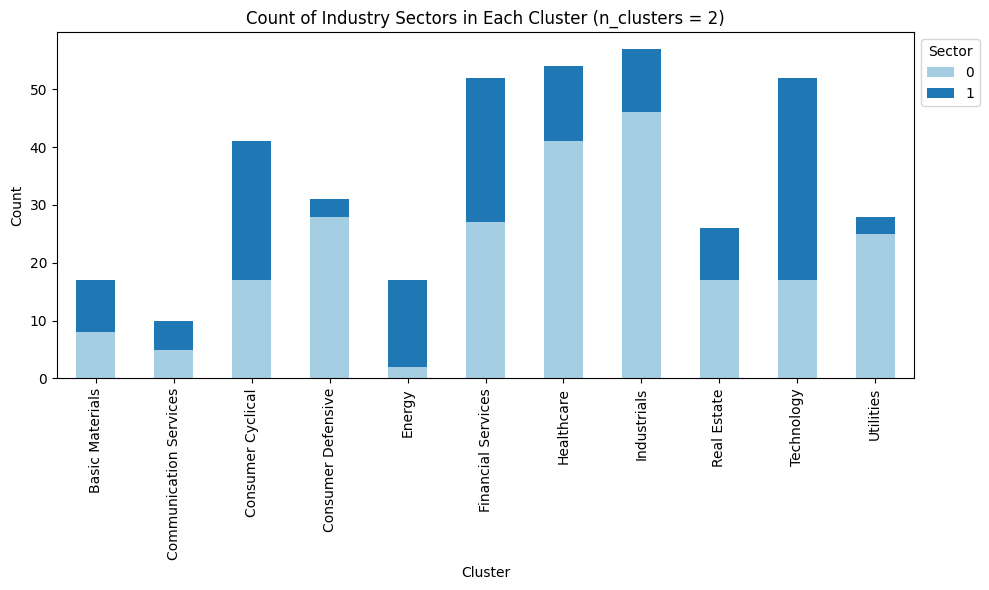

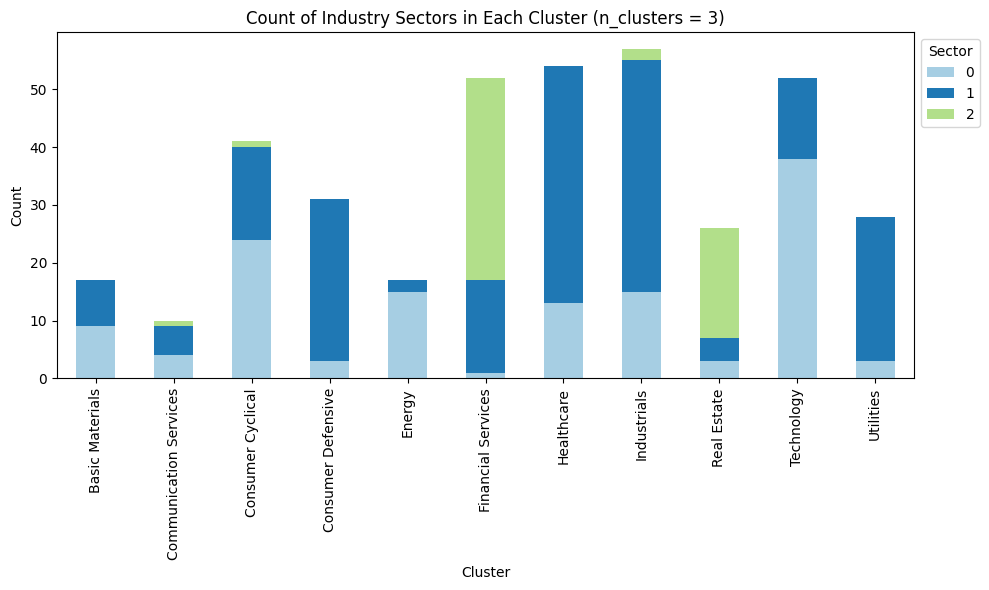

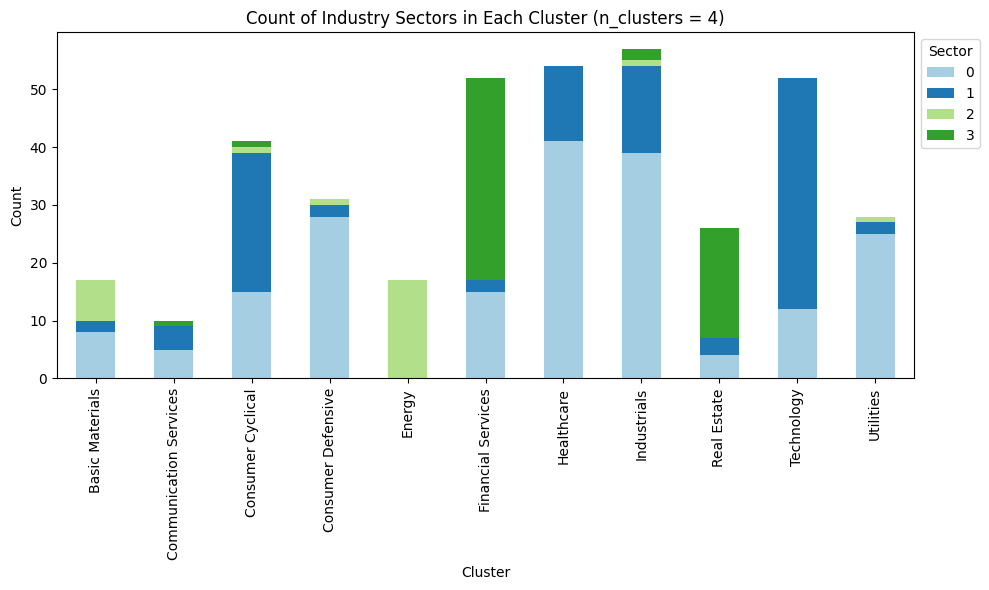

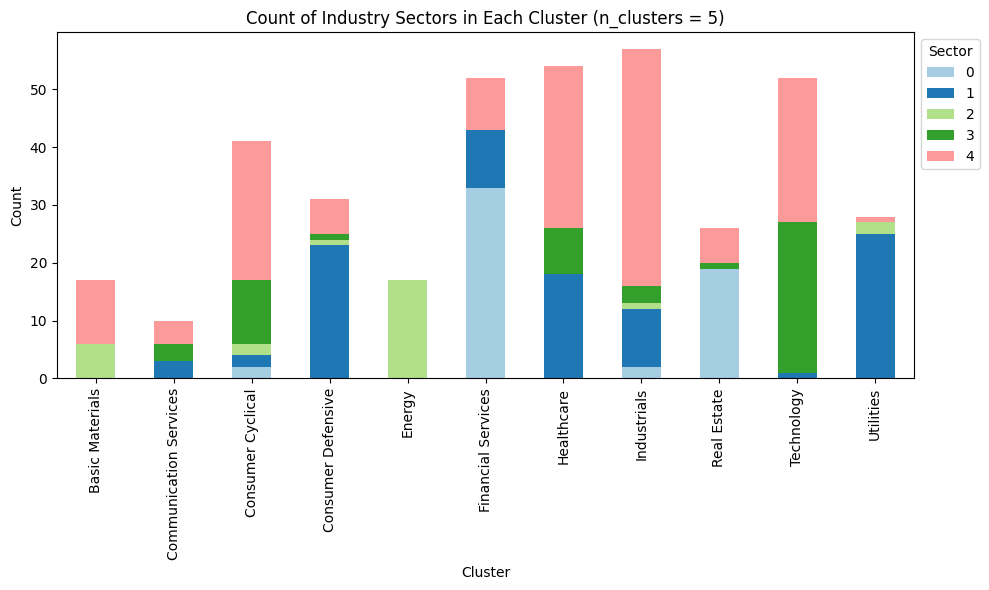

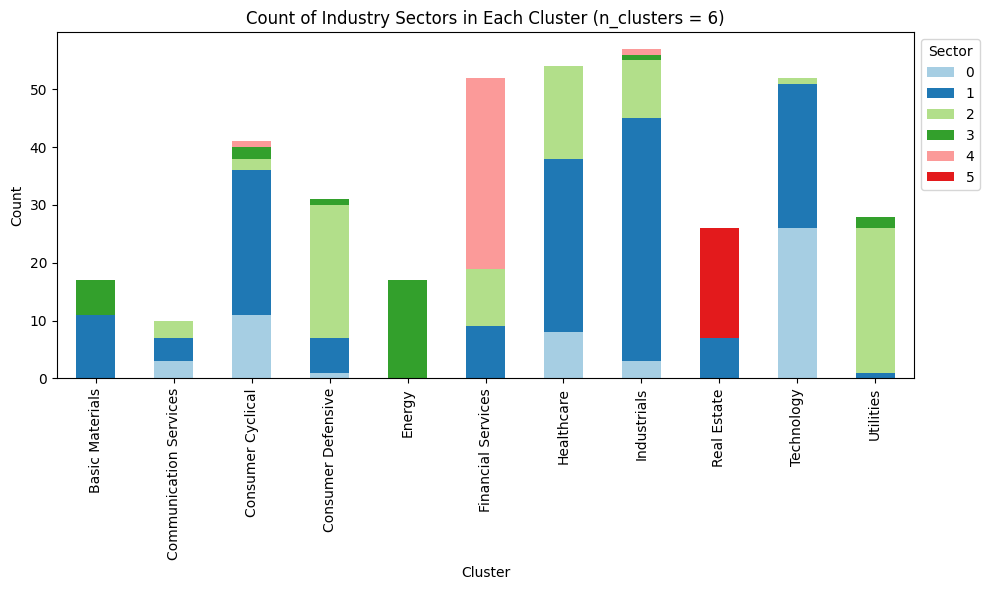

...

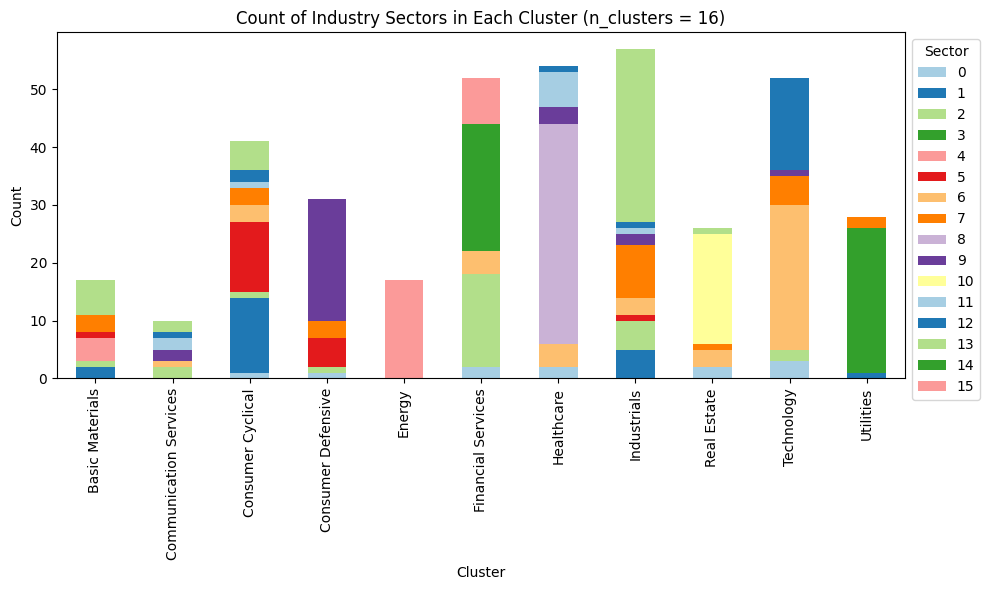

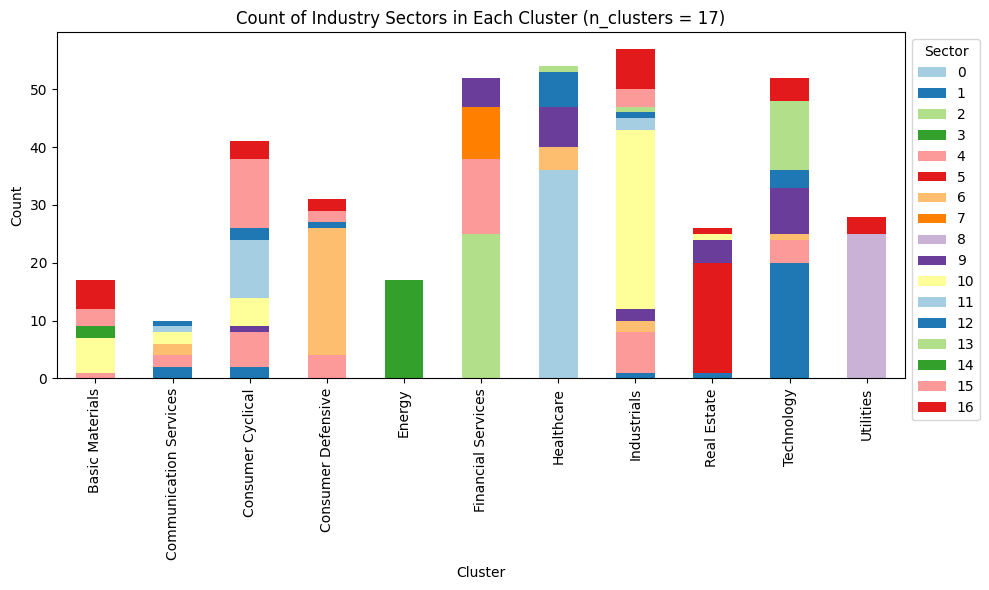

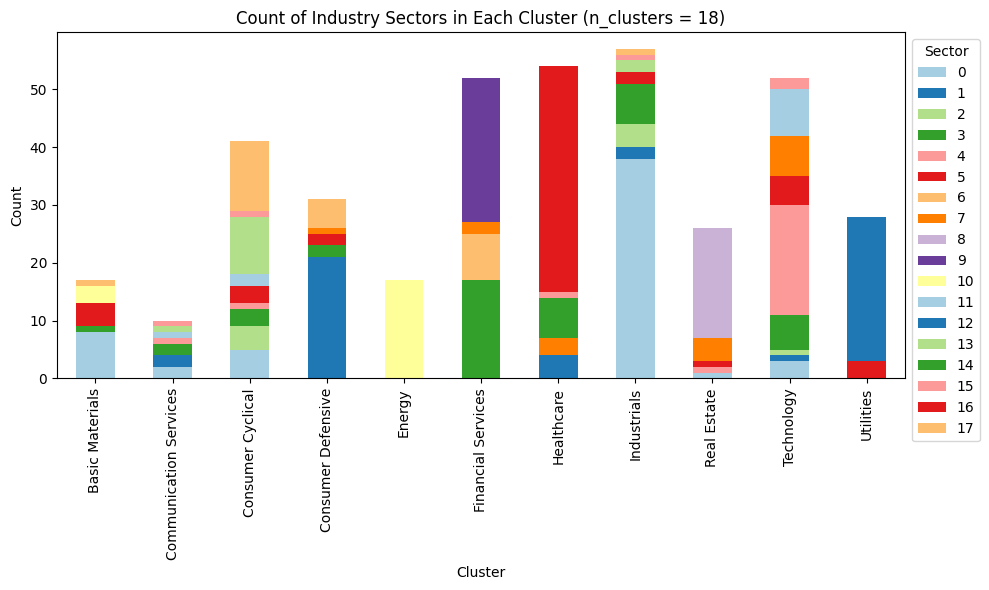

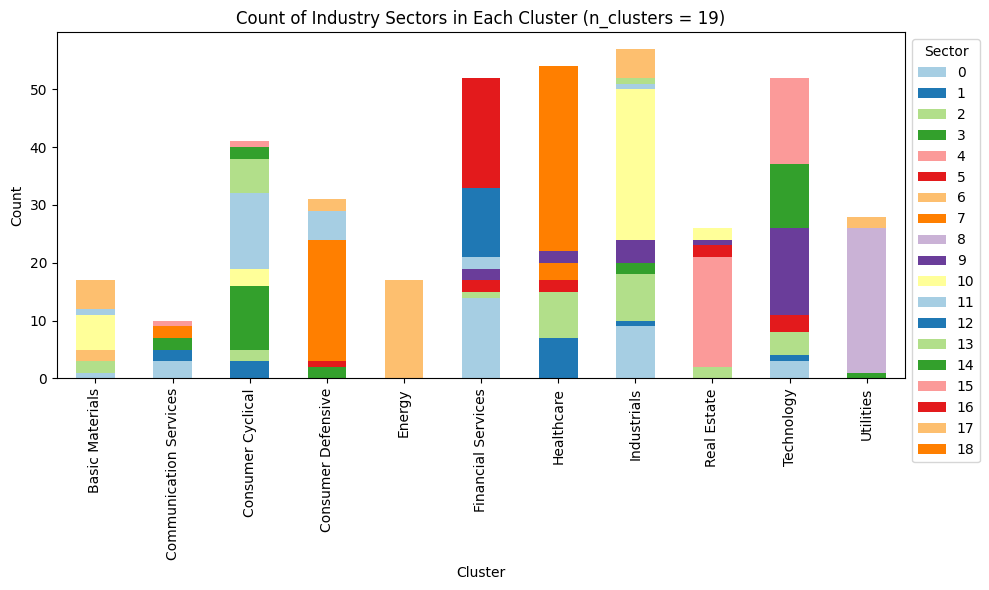

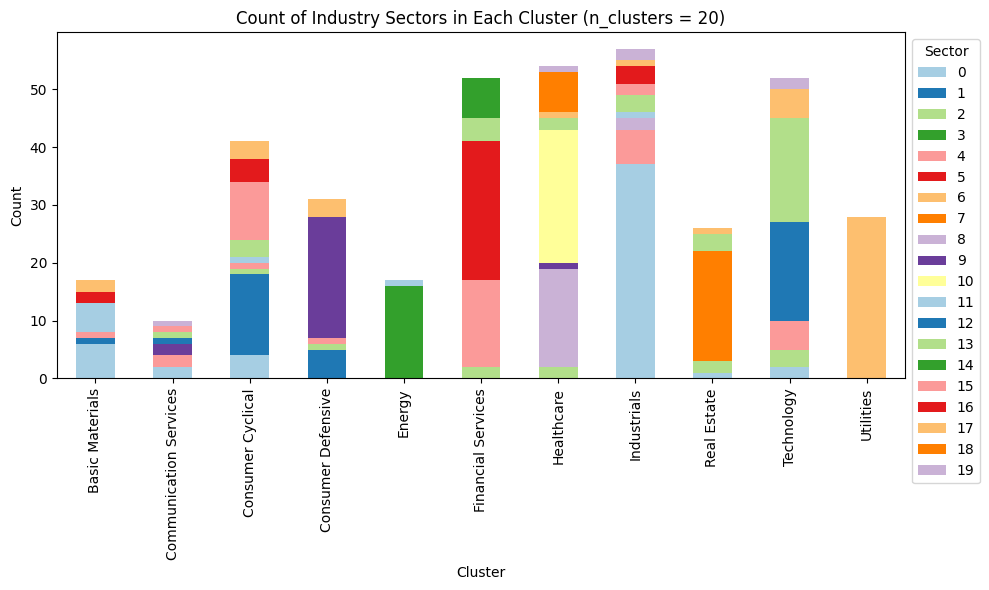

In [169]:
# Stacked bar charts
for n_cluster in n_cluster_options:
    kmeans_third_sector_count_df = kmeans_third_sector_count_dfs[n_cluster]

    ax = kmeans_third_sector_count_df.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
    plt.title(f'Count of Industry Sectors in Each Cluster (n_clusters = {n_cluster})')
    plt.xlabel('Cluster')
    plt.ylabel('Count')
    plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

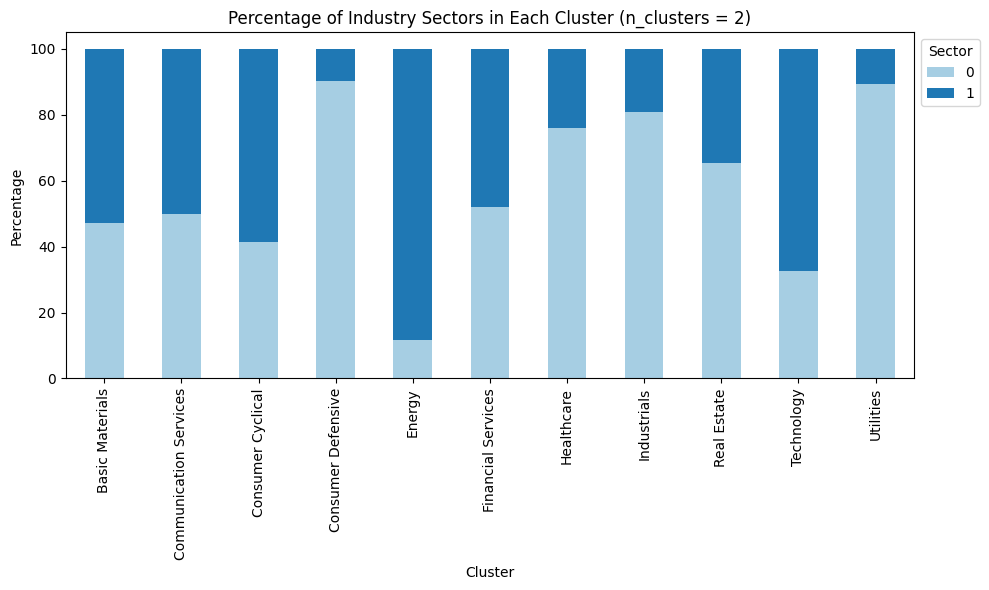

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      47.058824                    50.0          41.463415   
1                      52.941176                    50.0          58.536585   

Industry Sector  Consumer Defensive     Energy  Financial Services  \
Cluster                                                              
0                         90.322581  11.764706           51.923077   
1                          9.677419  88.235294           48.076923   

Industry Sector  Healthcare  Industrials  Real Estate  Technology  Utilities  
Cluster                                                                       
0                 75.925926    80.701754    65.384615   32.692308  89.285714  
1                 24.074074    19.298246    34.615385   67.307692  10.714286  


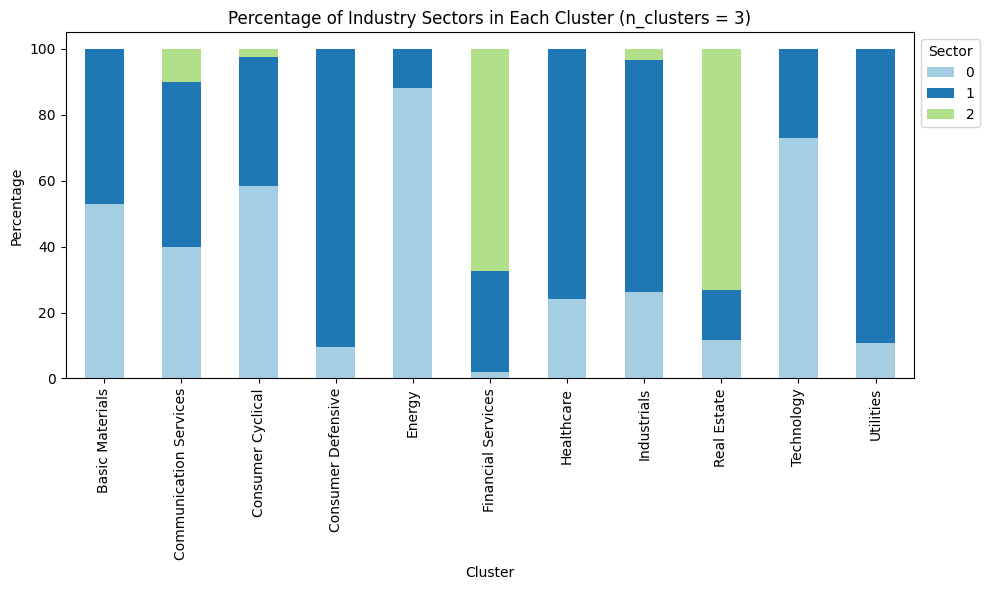

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      52.941176                    40.0          58.536585   
1                      47.058824                    50.0          39.024390   
2                       0.000000                    10.0           2.439024   

Industry Sector  Consumer Defensive     Energy  Financial Services  \
Cluster                                                              
0                          9.677419  88.235294            1.923077   
1                         90.322581  11.764706           30.769231   
2                          0.000000   0.000000           67.307692   

Industry Sector  Healthcare  Industrials  Real Estate  Technology  Utilities  
Cluster                                                                       
0                 24.074074    26.315789    11.538462   73.076923  10.714286  
1               

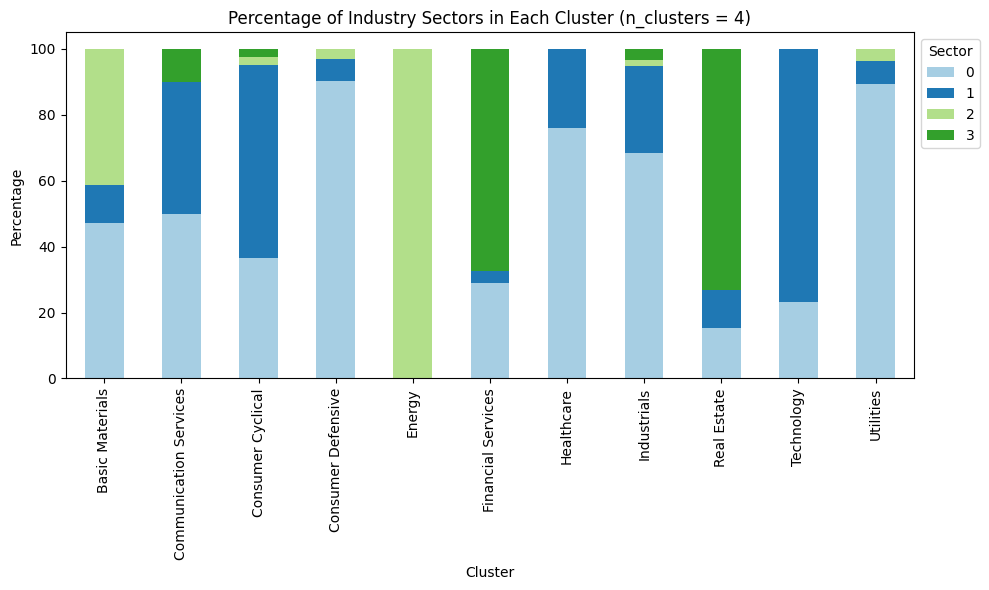

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      47.058824                    50.0          36.585366   
1                      11.764706                    40.0          58.536585   
2                      41.176471                     0.0           2.439024   
3                       0.000000                    10.0           2.439024   

Industry Sector  Consumer Defensive  Energy  Financial Services  Healthcare  \
Cluster                                                                       
0                         90.322581     0.0           28.846154   75.925926   
1                          6.451613     0.0            3.846154   24.074074   
2                          3.225806   100.0            0.000000    0.000000   
3                          0.000000     0.0           67.307692    0.000000   

Industry Sector  Industrials  Real Estate  Technol

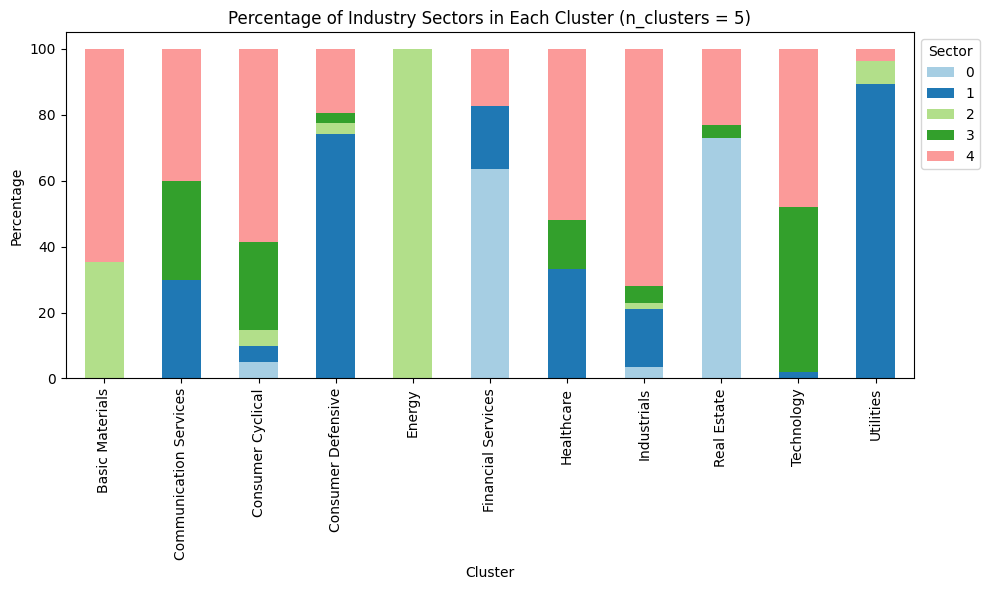

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                     0.0           4.878049   
1                       0.000000                    30.0           4.878049   
2                      35.294118                     0.0           4.878049   
3                       0.000000                    30.0          26.829268   
4                      64.705882                    40.0          58.536585   

Industry Sector  Consumer Defensive  Energy  Financial Services  Healthcare  \
Cluster                                                                       
0                          0.000000     0.0           63.461538    0.000000   
1                         74.193548     0.0           19.230769   33.333333   
2                          3.225806   100.0            0.000000    0.000000   
3                          3.225806     0.0        

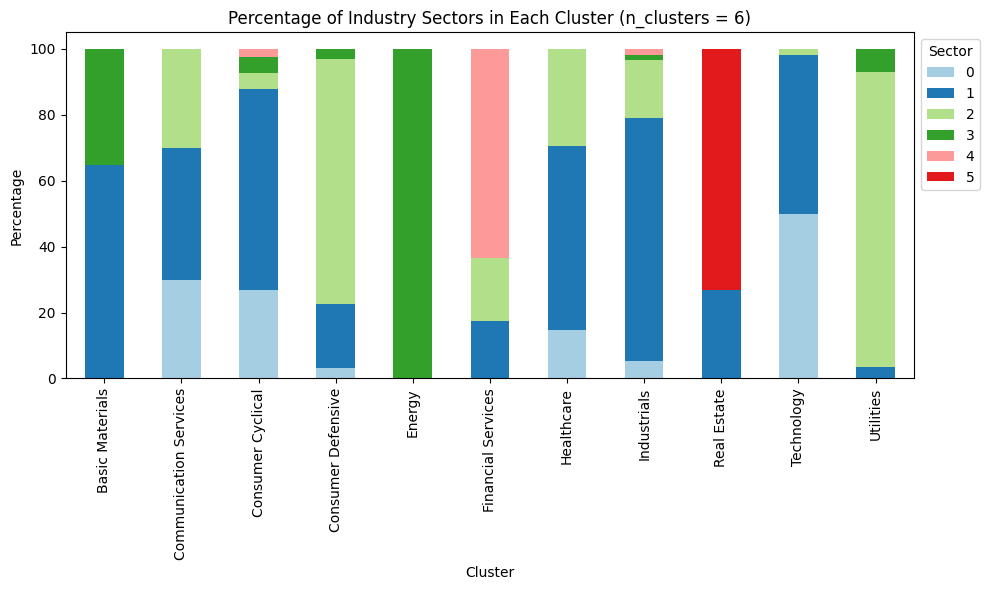

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                    30.0          26.829268   
1                      64.705882                    40.0          60.975610   
2                       0.000000                    30.0           4.878049   
3                      35.294118                     0.0           4.878049   
4                       0.000000                     0.0           2.439024   
5                       0.000000                     0.0           0.000000   

Industry Sector  Consumer Defensive  Energy  Financial Services  Healthcare  \
Cluster                                                                       
0                          3.225806     0.0            0.000000   14.814815   
1                         19.354839     0.0           17.307692   55.555556   
2                         74.193548     0.0        

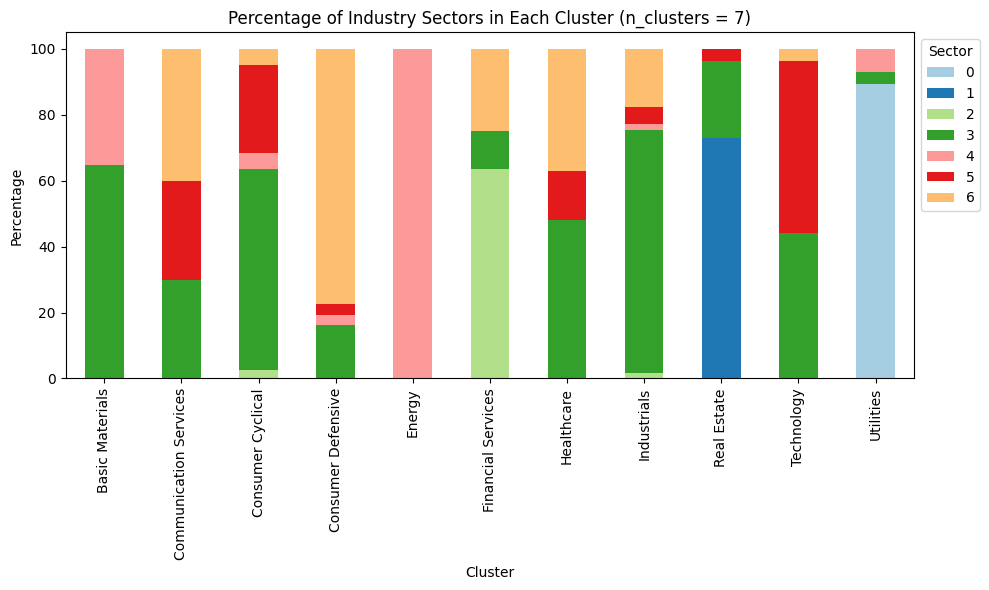

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                     0.0           0.000000   
1                       0.000000                     0.0           0.000000   
2                       0.000000                     0.0           2.439024   
3                      64.705882                    30.0          60.975610   
4                      35.294118                     0.0           4.878049   
5                       0.000000                    30.0          26.829268   
6                       0.000000                    40.0           4.878049   

Industry Sector  Consumer Defensive  Energy  Financial Services  Healthcare  \
Cluster                                                                       
0                          0.000000     0.0            0.000000    0.000000   
1                          0.000000     0.0        

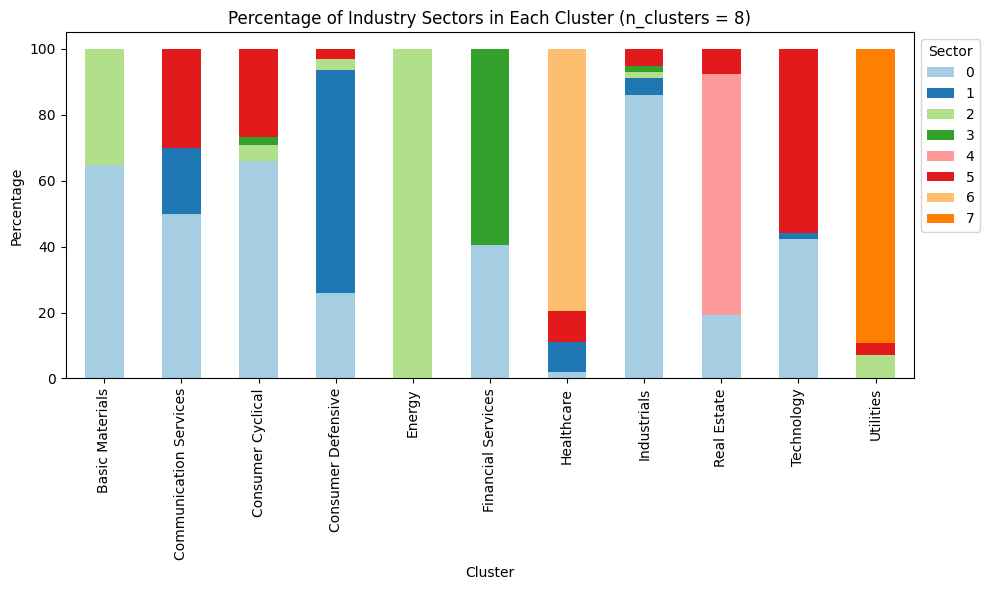

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      64.705882                    50.0          65.853659   
1                       0.000000                    20.0           0.000000   
2                      35.294118                     0.0           4.878049   
3                       0.000000                     0.0           2.439024   
4                       0.000000                     0.0           0.000000   
5                       0.000000                    30.0          26.829268   
6                       0.000000                     0.0           0.000000   
7                       0.000000                     0.0           0.000000   

Industry Sector  Consumer Defensive  Energy  Financial Services  Healthcare  \
Cluster                                                                       
0                         25.806452     0.0        

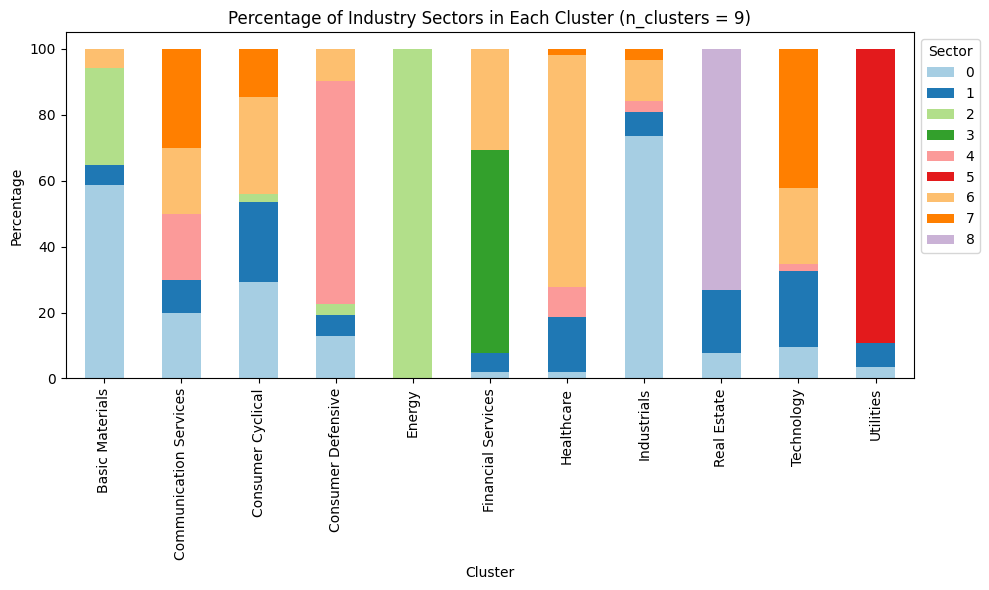

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      58.823529                    20.0          29.268293   
1                       5.882353                    10.0          24.390244   
2                      29.411765                     0.0           2.439024   
3                       0.000000                     0.0           0.000000   
4                       0.000000                    20.0           0.000000   
5                       0.000000                     0.0           0.000000   
6                       5.882353                    20.0          29.268293   
7                       0.000000                    30.0          14.634146   
8                       0.000000                     0.0           0.000000   

Industry Sector  Consumer Defensive  Energy  Financial Services  Healthcare  \
Cluster                                            

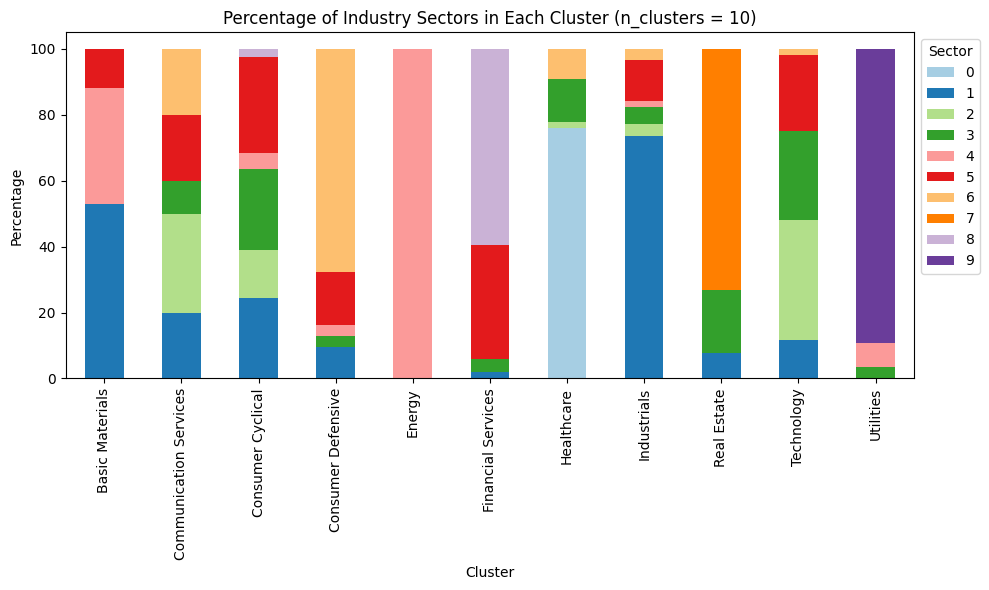

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                     0.0           0.000000   
1                      52.941176                    20.0          24.390244   
2                       0.000000                    30.0          14.634146   
3                       0.000000                    10.0          24.390244   
4                      35.294118                     0.0           4.878049   
5                      11.764706                    20.0          29.268293   
6                       0.000000                    20.0           0.000000   
7                       0.000000                     0.0           0.000000   
8                       0.000000                     0.0           2.439024   
9                       0.000000                     0.0           0.000000   

Industry Sector  Consumer Defensive  Energy  Financ

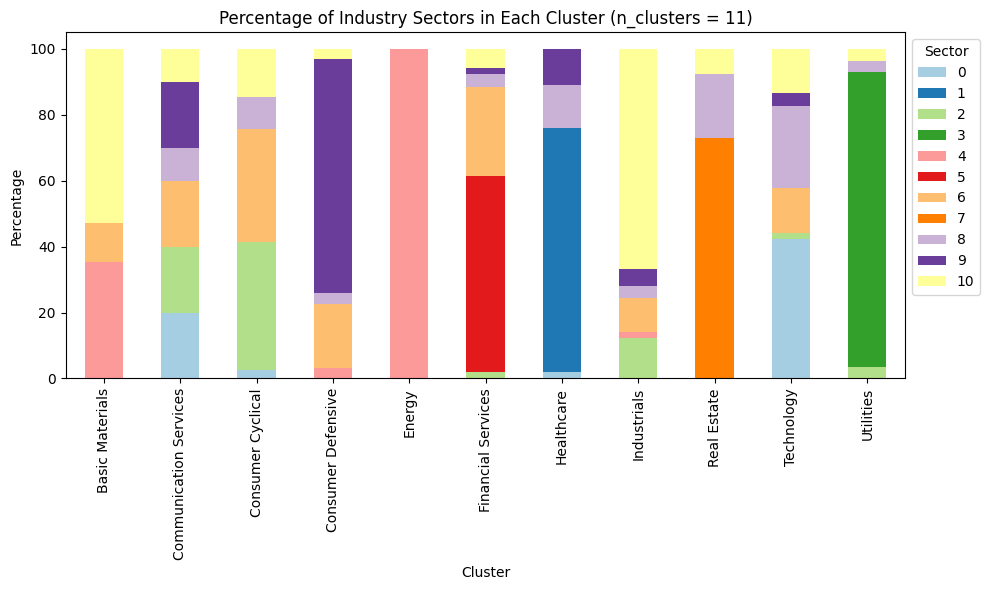

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                    20.0           2.439024   
1                       0.000000                     0.0           0.000000   
2                       0.000000                    20.0          39.024390   
3                       0.000000                     0.0           0.000000   
4                      35.294118                     0.0           0.000000   
5                       0.000000                     0.0           0.000000   
6                      11.764706                    20.0          34.146341   
7                       0.000000                     0.0           0.000000   
8                       0.000000                    10.0           9.756098   
9                       0.000000                    20.0           0.000000   
10                     52.941176                    

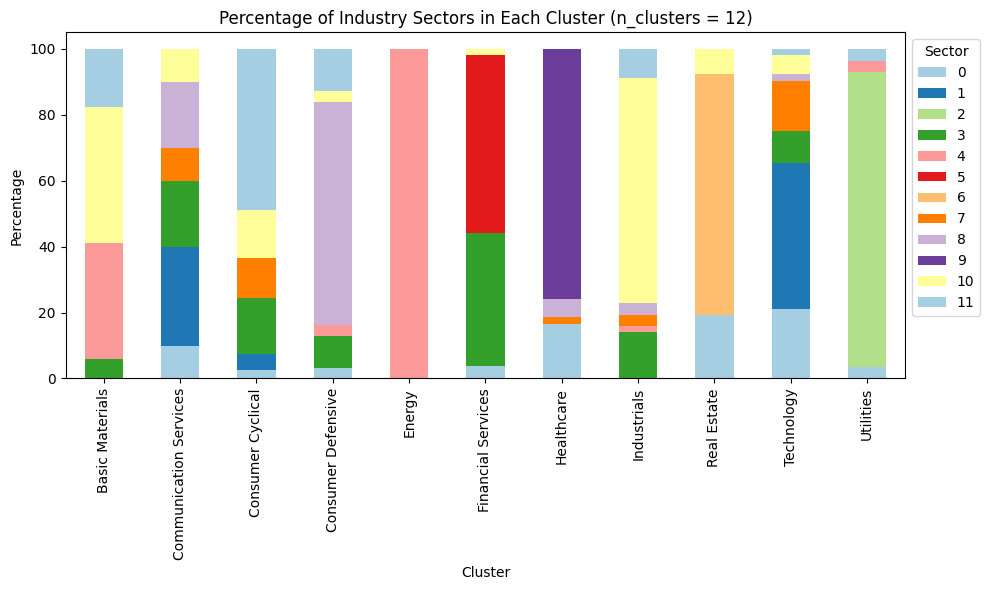

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                    10.0           2.439024   
1                       0.000000                    30.0           4.878049   
2                       0.000000                     0.0           0.000000   
3                       5.882353                    20.0          17.073171   
4                      35.294118                     0.0           0.000000   
5                       0.000000                     0.0           0.000000   
6                       0.000000                     0.0           0.000000   
7                       0.000000                    10.0          12.195122   
8                       0.000000                    20.0           0.000000   
9                       0.000000                     0.0           0.000000   
10                     41.176471                    

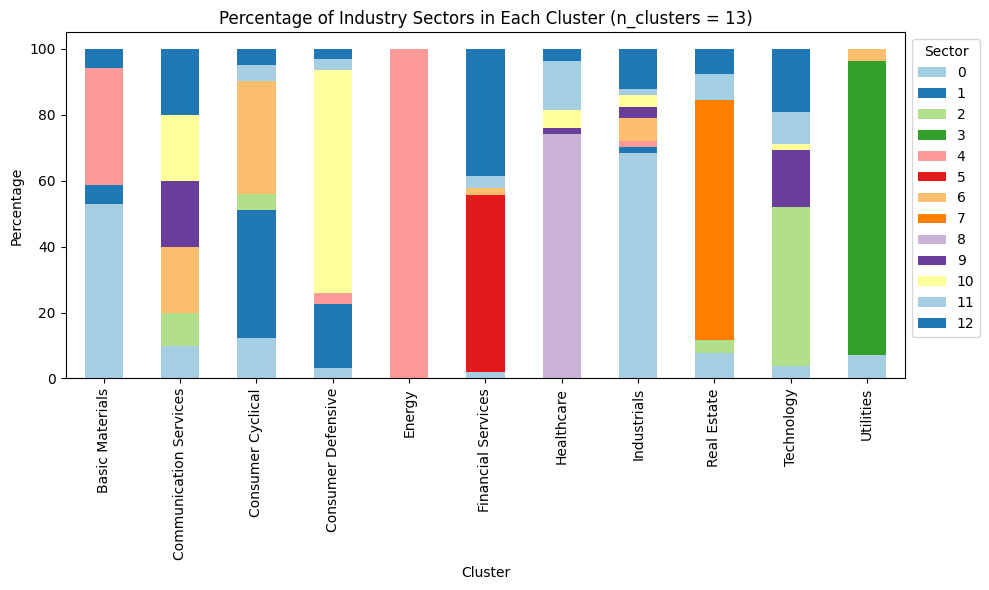

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      52.941176                    10.0          12.195122   
1                       5.882353                     0.0          39.024390   
2                       0.000000                    10.0           4.878049   
3                       0.000000                     0.0           0.000000   
4                      35.294118                     0.0           0.000000   
5                       0.000000                     0.0           0.000000   
6                       0.000000                    20.0          34.146341   
7                       0.000000                     0.0           0.000000   
8                       0.000000                     0.0           0.000000   
9                       0.000000                    20.0           0.000000   
10                      0.000000                    

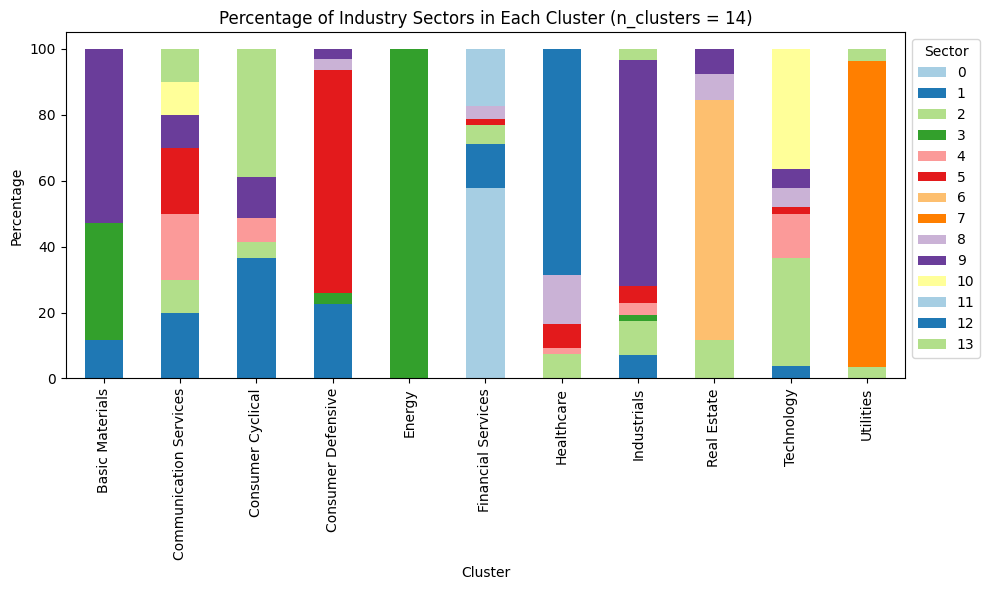

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                     0.0           0.000000   
1                      11.764706                    20.0          36.585366   
2                       0.000000                    10.0           4.878049   
3                      35.294118                     0.0           0.000000   
4                       0.000000                    20.0           7.317073   
5                       0.000000                    20.0           0.000000   
6                       0.000000                     0.0           0.000000   
7                       0.000000                     0.0           0.000000   
8                       0.000000                     0.0           0.000000   
9                      52.941176                    10.0          12.195122   
10                      0.000000                    

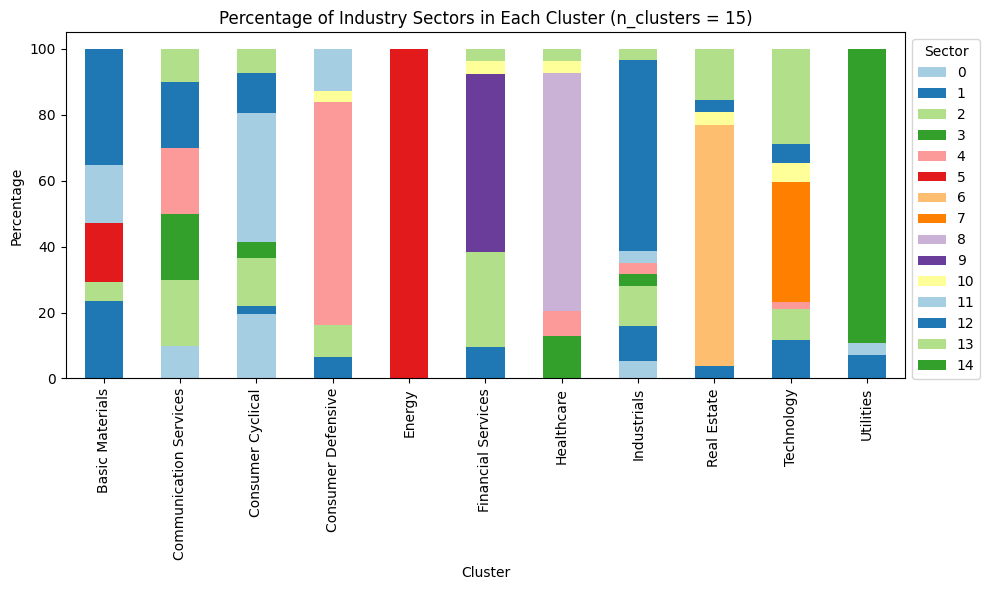

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                    10.0          19.512195   
1                      23.529412                     0.0           2.439024   
2                       5.882353                    20.0          14.634146   
3                       0.000000                    20.0           4.878049   
4                       0.000000                    20.0           0.000000   
5                      17.647059                     0.0           0.000000   
6                       0.000000                     0.0           0.000000   
7                       0.000000                     0.0           0.000000   
8                       0.000000                     0.0           0.000000   
9                       0.000000                     0.0           0.000000   
10                      0.000000                    

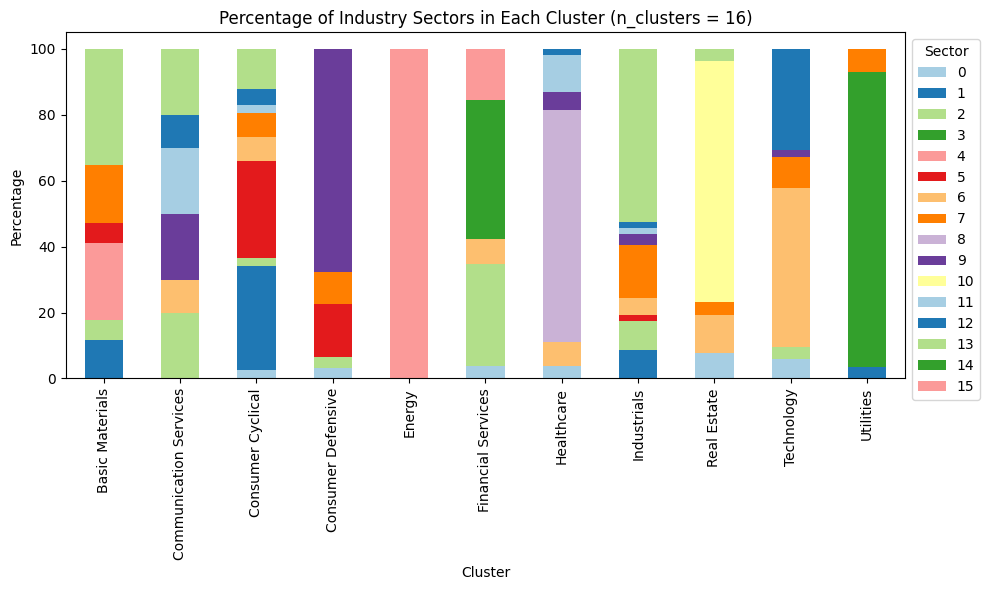

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                     0.0           2.439024   
1                      11.764706                     0.0          31.707317   
2                       5.882353                    20.0           2.439024   
3                       0.000000                     0.0           0.000000   
4                      23.529412                     0.0           0.000000   
5                       5.882353                     0.0          29.268293   
6                       0.000000                    10.0           7.317073   
7                      17.647059                     0.0           7.317073   
8                       0.000000                     0.0           0.000000   
9                       0.000000                    20.0           0.000000   
10                      0.000000                    

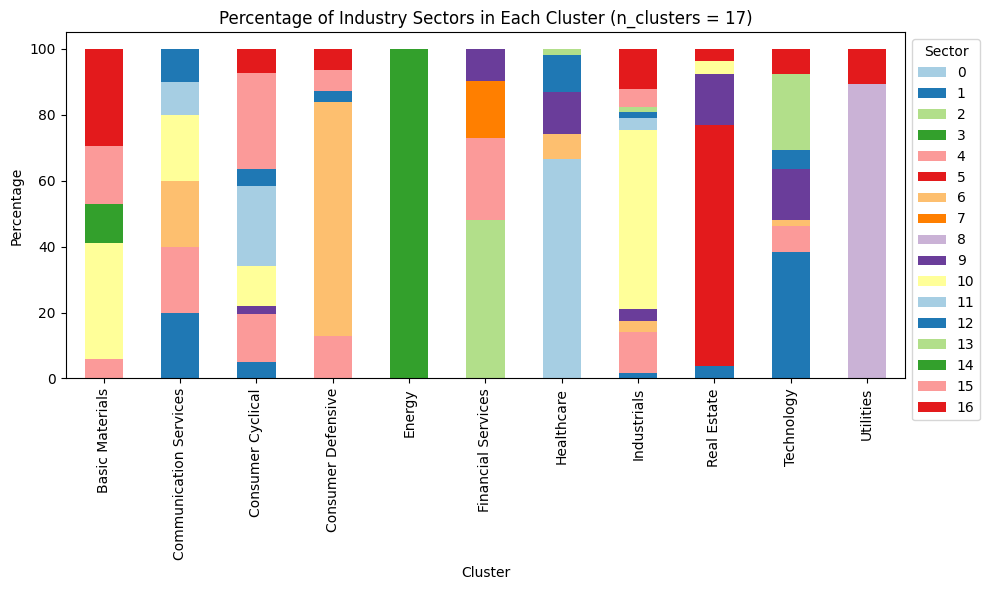

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                     0.0           0.000000   
1                       0.000000                    20.0           4.878049   
2                       0.000000                     0.0           0.000000   
3                       0.000000                     0.0           0.000000   
4                       5.882353                    20.0          14.634146   
5                       0.000000                     0.0           0.000000   
6                       0.000000                    20.0           0.000000   
7                       0.000000                     0.0           0.000000   
8                       0.000000                     0.0           0.000000   
9                       0.000000                     0.0           2.439024   
10                     35.294118                    

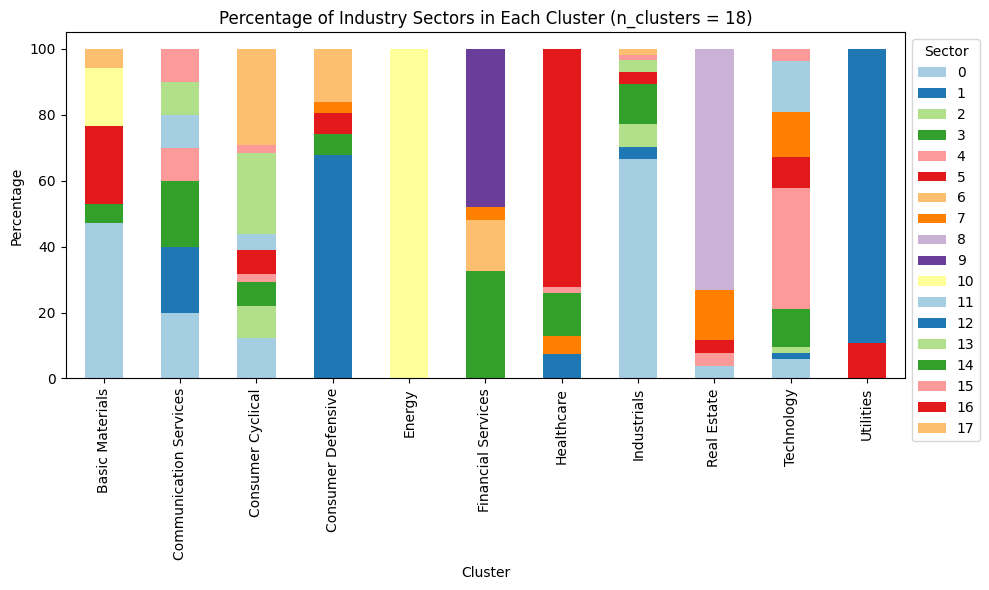

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      47.058824                    20.0          12.195122   
1                       0.000000                    20.0           0.000000   
2                       0.000000                     0.0           9.756098   
3                       5.882353                    20.0           7.317073   
4                       0.000000                    10.0           2.439024   
5                      23.529412                     0.0           7.317073   
6                       0.000000                     0.0           0.000000   
7                       0.000000                     0.0           0.000000   
8                       0.000000                     0.0           0.000000   
9                       0.000000                     0.0           0.000000   
10                     17.647059                    

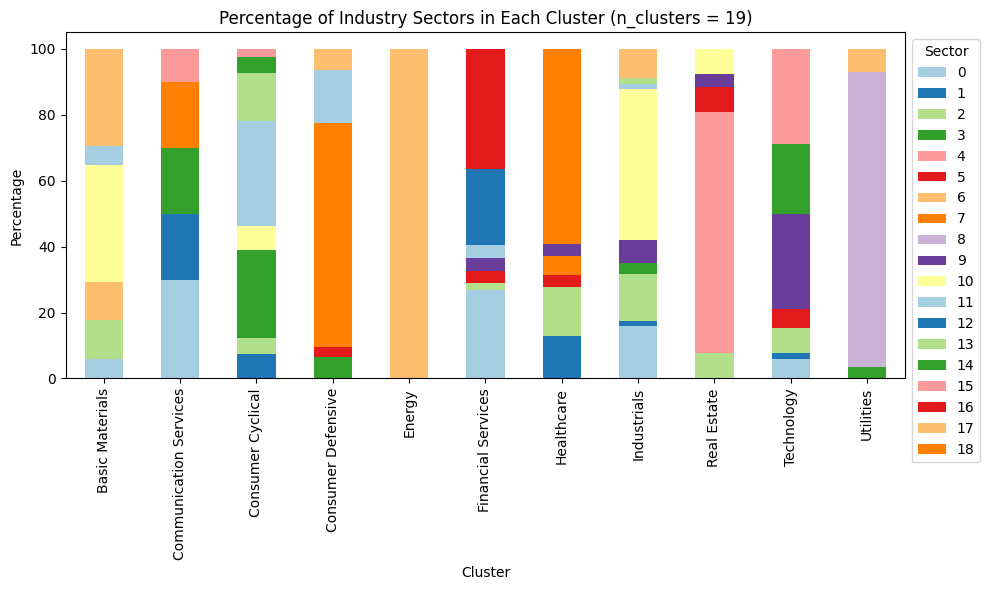

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       5.882353                    30.0           0.000000   
1                       0.000000                    20.0           7.317073   
2                      11.764706                     0.0           4.878049   
3                       0.000000                    20.0          26.829268   
4                       0.000000                     0.0           0.000000   
5                       0.000000                     0.0           0.000000   
6                      11.764706                     0.0           0.000000   
7                       0.000000                    20.0           0.000000   
8                       0.000000                     0.0           0.000000   
9                       0.000000                     0.0           0.000000   
10                     35.294118                    

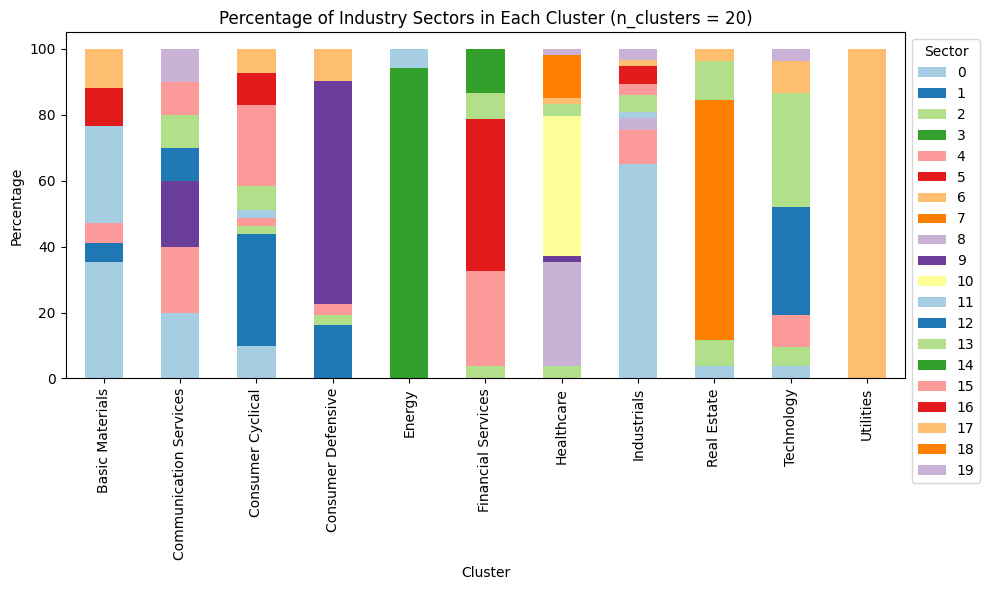

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      35.294118                    20.0           9.756098   
1                       5.882353                     0.0          34.146341   
2                       0.000000                     0.0           2.439024   
3                       0.000000                     0.0           0.000000   
4                       5.882353                    20.0           2.439024   
5                       0.000000                     0.0           0.000000   
6                       0.000000                     0.0           0.000000   
7                       0.000000                     0.0           0.000000   
8                       0.000000                     0.0           0.000000   
9                       0.000000                    20.0           0.000000   
10                      0.000000                    

In [173]:
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Stacked bar charts
for n_cluster in n_cluster_options:
    kmeans_third_sector_percentage_df = kmeans_third_sector_percentage_dfs[n_cluster]

    ax = kmeans_third_sector_percentage_df.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
    plt.title(f'Percentage of Industry Sectors in Each Cluster (n_clusters = {n_cluster})')
    plt.xlabel('Cluster')
    plt.ylabel('Percentage')
    plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    print(kmeans_third_sector_percentage_df)

###**9.1.4 The average return and volatility of each cluster for n_clusters=12**

In [163]:
# Reset combined_matrix's index
combined_matrix = pd.concat([feature_matrix, correlation_matrix_reduced], axis=1)
combined_matrix_2 = combined_matrix.reset_index()
combined_matrix_2.rename(columns={'index': 'Company'}, inplace=True)
combined_matrix_2.head()

,Company,avg_return_pre_crisis,volatility_pre_crisis,avg_return_crisis,volatility_crisis,avg_return_post_crisis,volatility_post_crisis,avg_return_covid,volatility_covid,avg_return_post_covid,...,Corr_PCA_1,Corr_PCA_2,Corr_PCA_3,Corr_PCA_4,Corr_PCA_5,Corr_PCA_6,Corr_PCA_7,Corr_PCA_8,Corr_PCA_9,Corr_PCA_10
0,AAPL,0.003060,0.024775,0.001281,0.030126,0.001194,0.016205,0.001053,0.023264,0.001678,...,0.672405,-0.653636,-0.443668,-0.056129,-0.229598,-0.190065,-0.162563,0.152557,0.141502,0.104978
1,MSFT,0.000356,0.011085,0.000020,0.025123,0.000914,0.014376,0.000832,0.021890,0.001960,...,-0.378804,-0.102554,-0.884703,-0.043815,-0.051670,-0.328802,-0.074152,0.135558,0.302901,0.160216
2,NVDA,0.002036,0.030606,-0.000298,0.042996,0.001507,0.025704,0.001829,0.035245,0.005338,...,0.709742,-1.131153,-0.652119,-0.052182,-0.463892,-0.328701,-0.143165,0.299998,0.134455,-0.002337
3,AMZN,-0.000049,0.024757,0.001856,0.036857,0.001374,0.020287,0.000177,0.024624,0.002588,...,1.292061,-0.888673,-0.403928,-0.348478,-0.260385,-0.168526,-0.150053,0.081144,0.131398,0.199323
4,BRK-B,0.000391,0.008356,-0.000154,0.021217,0.000582,0.011497,0.000540,0.016116,0.000612,...,-0.959177,0.069834,0.071320,0.119224,0.420520,-0.023988,0.065813,0.101182,-0.017378,0.017297


In [164]:
scaler3 = StandardScaler()
combined_matrix_scaled_2 = scaler3.fit_transform(combined_matrix_2.drop(columns=['Company']))

In [165]:
# Deep dive on K-means with n_clusters = 12
kmeans = KMeans(n_clusters=12, random_state=123, algorithm='lloyd', init='random', max_iter=500, n_init=10)
clusters = kmeans.fit_predict(combined_matrix_scaled_2)

# Add the cluster labels to the merged data
combined_matrix_2['Cluster'] = clusters
combined_matrix_2.head()

,Company,avg_return_pre_crisis,volatility_pre_crisis,avg_return_crisis,volatility_crisis,avg_return_post_crisis,volatility_post_crisis,avg_return_covid,volatility_covid,avg_return_post_covid,...,Corr_PCA_2,Corr_PCA_3,Corr_PCA_4,Corr_PCA_5,Corr_PCA_6,Corr_PCA_7,Corr_PCA_8,Corr_PCA_9,Corr_PCA_10,Cluster
0,AAPL,0.003060,0.024775,0.001281,0.030126,0.001194,0.016205,0.001053,0.023264,0.001678,...,-0.653636,-0.443668,-0.056129,-0.229598,-0.190065,-0.162563,0.152557,0.141502,0.104978,2
1,MSFT,0.000356,0.011085,0.000020,0.025123,0.000914,0.014376,0.000832,0.021890,0.001960,...,-0.102554,-0.884703,-0.043815,-0.051670,-0.328802,-0.074152,0.135558,0.302901,0.160216,11
2,NVDA,0.002036,0.030606,-0.000298,0.042996,0.001507,0.025704,0.001829,0.035245,0.005338,...,-1.131153,-0.652119,-0.052182,-0.463892,-0.328701,-0.143165,0.299998,0.134455,-0.002337,4
3,AMZN,-0.000049,0.024757,0.001856,0.036857,0.001374,0.020287,0.000177,0.024624,0.002588,...,-0.888673,-0.403928,-0.348478,-0.260385,-0.168526,-0.150053,0.081144,0.131398,0.199323,2
4,BRK-B,0.000391,0.008356,-0.000154,0.021217,0.000582,0.011497,0.000540,0.016116,0.000612,...,0.069834,0.071320,0.119224,0.420520,-0.023988,0.065813,0.101182,-0.017378,0.017297,3


In [167]:
# Return the count in each cluster
combined_matrix_2['Cluster'].value_counts()

Cluster
11    67
3     64
9     38
7     32
5     31
0     29
2     26
10    25
1     24
4     20
6     19
8     10
Name: count, dtype: int64

In [168]:
cluster_summary = combined_matrix_2.drop(['Company'], axis=1).groupby('Cluster').mean()
cluster_summary

,avg_return_pre_crisis,volatility_pre_crisis,avg_return_crisis,volatility_crisis,avg_return_post_crisis,volatility_post_crisis,avg_return_covid,volatility_covid,avg_return_post_covid,volatility_post_covid,Corr_PCA_1,Corr_PCA_2,Corr_PCA_3,Corr_PCA_4,Corr_PCA_5,Corr_PCA_6,Corr_PCA_7,Corr_PCA_8,Corr_PCA_9,Corr_PCA_10
Cluster,,,,,,,,,,,,,,,,,,,,
0,0.000670,0.017755,0.000024,0.032113,0.000713,0.019435,0.000478,0.028867,0.000358,0.018998,0.529128,-0.481152,0.174770,-0.014678,-0.146032,0.199820,0.119138,0.114268,0.007685,-0.026987
1,0.001399,0.019039,0.000466,0.036405,0.000391,0.020410,0.001609,0.035516,0.000258,0.019947,0.040707,-0.499454,0.599131,1.103989,-0.144963,-0.053147,-0.101898,-0.149864,0.083322,0.111525
2,0.001652,0.030816,0.000500,0.037170,0.001159,0.022238,0.000680,0.025158,0.001126,0.017329,1.439857,-0.677157,-0.064962,-0.203111,-0.128028,-0.105743,-0.022938,-0.061228,-0.072551,0.017693
3,0.000713,0.014607,0.000022,0.029106,0.000710,0.015460,0.000616,0.022131,0.000730,0.015246,-1.155414,-0.055133,-0.220922,0.214019,0.038189,0.166944,-0.084700,-0.055456,-0.088682,-0.071053
4,0.000458,0.023109,-0.000178,0.035561,0.000993,0.021867,0.000668,0.032535,0.002329,0.022730,0.054296,-0.895490,-0.399720,0.008356,-0.295057,-0.159572,-0.009766,0.348173,0.138086,-0.150620
5,0.000460,0.010599,0.000039,0.018183,0.000566,0.011665,0.000420,0.017196,-0.000205,0.012491,1.388876,0.653953,-0.048545,-0.043495,0.334322,0.168993,-0.238245,0.018744,0.159251,-0.062496
6,0.001080,0.012525,-0.000028,0.043541,0.000679,0.014515,0.000300,0.025623,0.000483,0.016509,-1.135554,0.574217,0.740715,-0.803117,-0.538561,-0.098926,-0.038254,-0.318827,0.212053,-0.128525
7,0.000580,0.011520,-0.000009,0.052922,0.000664,0.017618,0.000578,0.027257,0.000449,0.018949,-1.318150,-0.184920,0.652017,-0.301013,0.383544,-0.212922,-0.052847,0.199144,-0.107469,0.041956
8,0.000757,0.019440,-0.000751,0.044457,0.001041,0.021572,0.001072,0.031521,0.001976,0.019265,-0.125218,-0.509846,0.114917,-0.389577,-0.207211,0.275109,0.089091,-0.044079,-0.226677,0.119770


In [166]:
combined_matrix_mc = combined_matrix_2.copy()

###**9.1.5 Average correlation between each cluster**

In [174]:
combined_matrix_mc.head()

,Company,avg_return_pre_crisis,volatility_pre_crisis,avg_return_crisis,volatility_crisis,avg_return_post_crisis,volatility_post_crisis,avg_return_covid,volatility_covid,avg_return_post_covid,...,Corr_PCA_2,Corr_PCA_3,Corr_PCA_4,Corr_PCA_5,Corr_PCA_6,Corr_PCA_7,Corr_PCA_8,Corr_PCA_9,Corr_PCA_10,Cluster
0,AAPL,0.003060,0.024775,0.001281,0.030126,0.001194,0.016205,0.001053,0.023264,0.001678,...,-0.653636,-0.443668,-0.056129,-0.229598,-0.190065,-0.162563,0.152557,0.141502,0.104978,2
1,MSFT,0.000356,0.011085,0.000020,0.025123,0.000914,0.014376,0.000832,0.021890,0.001960,...,-0.102554,-0.884703,-0.043815,-0.051670,-0.328802,-0.074152,0.135558,0.302901,0.160216,11
2,NVDA,0.002036,0.030606,-0.000298,0.042996,0.001507,0.025704,0.001829,0.035245,0.005338,...,-1.131153,-0.652119,-0.052182,-0.463892,-0.328701,-0.143165,0.299998,0.134455,-0.002337,4
3,AMZN,-0.000049,0.024757,0.001856,0.036857,0.001374,0.020287,0.000177,0.024624,0.002588,...,-0.888673,-0.403928,-0.348478,-0.260385,-0.168526,-0.150053,0.081144,0.131398,0.199323,2
4,BRK-B,0.000391,0.008356,-0.000154,0.021217,0.000582,0.011497,0.000540,0.016116,0.000612,...,0.069834,0.071320,0.119224,0.420520,-0.023988,0.065813,0.101182,-0.017378,0.017297,3


In [176]:
cluster_labels = combined_matrix_mc['Cluster']
feature_data = combined_matrix_mc.drop(columns=['Cluster', 'Company'])

# Create a dictionary to hold data for each cluster
cluster_data = {}
for cluster in range(12):
    cluster_data[cluster] = feature_data.loc[cluster_labels == cluster]

# Print the size of each cluster to ensure they have sufficient data
for cluster, data in cluster_data.items():
    print(f"Cluster {cluster} size: {data.shape[0]}")

# Function to calculate the mean correlation of a cluster
def mean_correlation(cluster_df):
    if cluster_df.shape[1] < 2:
        return np.nan  # Not enough data to compute correlation
    correlation_matrix = cluster_df.corr()
    # Extract upper triangle values excluding the diagonal
    upper_triangle_values = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool)).stack().values
    if len(upper_triangle_values) == 0:
        return np.nan
    mean_corr = np.mean(upper_triangle_values)
    return mean_corr

# Calculate mean correlations for all clusters
mean_correlations = {cluster: mean_correlation(cluster_df) for cluster, cluster_df in cluster_data.items()}

# Function to calculate the mean correlation between two clusters
def mean_correlation_between_clusters(cluster_df1, cluster_df2):
    combined_df = pd.concat([cluster_df1, cluster_df2], axis=0)
    correlation_matrix = combined_df.corr()
    # Extract inter-cluster correlation values
    inter_cluster_values = correlation_matrix.loc[cluster_df1.columns, cluster_df2.columns].values.flatten()
    if len(inter_cluster_values) == 0:
        return np.nan
    mean_corr = np.mean(inter_cluster_values)
    return mean_corr

# Calculate mean correlations between all combinations of clusters
cluster_pairs = combinations(cluster_data.keys(), 2)
mean_between = {}
for (cluster1, cluster2) in cluster_pairs:
    mean_corr_between = mean_correlation_between_clusters(cluster_data[cluster1], cluster_data[cluster2])
    mean_between[(cluster1, cluster2)] = mean_corr_between

# Create a DataFrame for mean correlations between clusters
mean_between_df = pd.DataFrame(index=range(12), columns=range(12))
for (cluster1, cluster2), mean_corr in mean_between.items():
    mean_between_df.loc[cluster1, cluster2] = mean_corr
    mean_between_df.loc[cluster2, cluster1] = mean_corr
np.fill_diagonal(mean_between_df.values, 1)  # Fill diagonal with 1 for same clusters

print("\nMean Correlations Between Clusters:")
display(mean_between_df)

Cluster 0 size: 29
Cluster 1 size: 24
Cluster 2 size: 26
Cluster 3 size: 64
Cluster 4 size: 20
Cluster 5 size: 31
Cluster 6 size: 19
Cluster 7 size: 32
Cluster 8 size: 10
Cluster 9 size: 38
Cluster 10 size: 25
Cluster 11 size: 67

Mean Correlations Between Clusters:


,0,1,2,3,4,5,6,7,8,9,10,11
0,1,0.042892,0.05996,0.059182,0.052134,0.07207,0.072063,0.037674,0.050584,0.062584,0.088829,0.04273
1,0.042892,1,0.05872,0.083196,0.070223,0.07537,0.122236,0.051902,0.042608,0.100496,0.139793,0.055444
2,0.05996,0.05872,1,0.084765,0.081739,0.08557,0.131664,0.058085,0.085536,0.105572,0.132549,0.075773
3,0.059182,0.083196,0.084765,1,0.066386,0.03663,0.037031,0.038387,0.074333,0.037969,0.040874,0.039944
4,0.052134,0.070223,0.081739,0.066386,1,0.062514,0.103217,0.066269,0.085911,0.070443,0.073983,0.065977
5,0.07207,0.07537,0.08557,0.03663,0.062514,1,0.040697,0.054936,0.076618,0.043446,0.067275,0.045712
6,0.072063,0.122236,0.131664,0.037031,0.103217,0.040697,1,0.063523,0.155287,0.048458,0.043165,0.047577
7,0.037674,0.051902,0.058085,0.038387,0.066269,0.054936,0.063523,1,0.059027,0.037555,0.049728,0.029485
8,0.050584,0.042608,0.085536,0.074333,0.085911,0.076618,0.155287,0.059027,1,0.075724,0.108463,0.055721
9,0.062584,0.100496,0.105572,0.037969,0.070443,0.043446,0.048458,0.037555,0.075724,1,0.055935,0.043544


In [177]:
# Create a dictionary to hold companies for each cluster
cluster_companies = {}
for cluster in range(12):
    cluster_companies[cluster] = combined_matrix_mc.loc[combined_matrix_mc['Cluster'] == cluster, 'Company'].tolist()

for cluster, companies in cluster_companies.items():
    print(f"Cluster {cluster}: {', '.join(companies)}")

Cluster 0: BA, NEM, MAR, PCG, F, SYY, HPQ, EL, DLTR, TSN, DRI, ZBRA, BBY, NRG, LUV, GEN, TRMB, JNPR, KMX, IPG, AES, LKQ, MTCH, TPR, HAS, MHK, BWA, WYNN, RL
Cluster 1: XOM, CVX, COP, EOG, SLB, FCX, WMB, VLO, OKE, OXY, HES, NUE, PWR, BKR, HAL, DVN, STLD, EQT, CTRA, MRO, BG, APA, ALB, MOS
Cluster 2: AAPL, AMZN, NFLX, ISRG, VRTX, BKNG, REGN, EQIX, ADSK, CNC, MNST, ODFL, BIIB, NDAQ, GRMN, SBAC, TTWO, DECK, AXON, MOH, PTC, HOLX, ALGN, AKAM, FFIV, INCY
Cluster 3: BRK-B, LIN, GE, CAT, RTX, UNP, HON, ETN, UPS, DE, TT, APH, MMM, ITW, PH, GD, CSX, FDX, APD, EMR, ROP, NSC, PCAR, JCI, LHX, GWW, RSG, CMI, FAST, AME, VMC, MLM, DD, IRM, GLW, ADM, ROK, PPG, WAB, IFF, DOV, WY, BALL, HUBB, GPC, OMC, J, PKG, EXPD, TXT, AVY, IP, SWK, IEX, SNA, L, PNR, JBHT, NDSN, CHRW, EMN, AOS, FMC, BEN
Cluster 4: NVDA, AMD, QCOM, TXN, AMAT, LRCX, MU, ADI, KLAC, INTC, MCHP, RCL, ON, NTAP, WDC, STX, TER, SWKS, CCL, JBL
Cluster 5: PG, JNJ, WMT, KO, PEP, PFE, IBM, VZ, T, LMT, MDLZ, MO, CL, WM, CVS, NOC, KMB, GIS, KR, HSY, CH

###**9.1.6 Track Amazon**

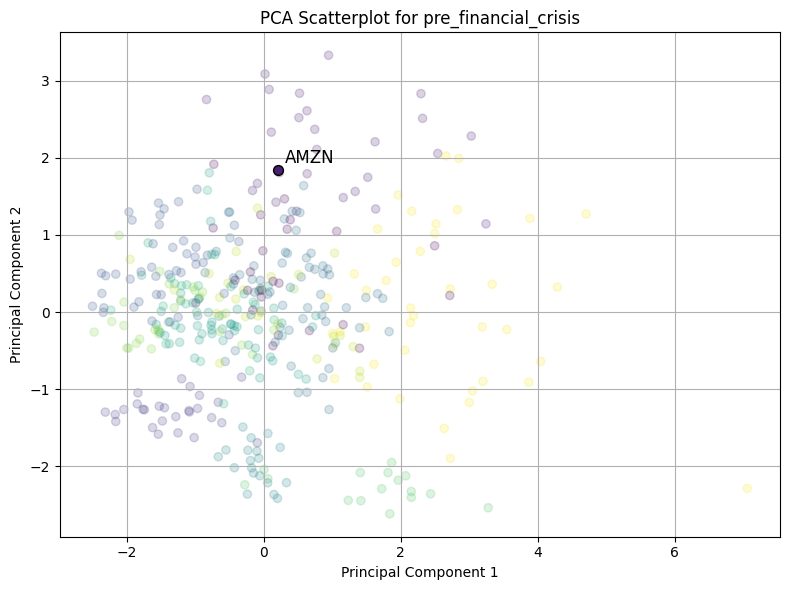

********** Period:  pre_financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                24
Communication Services     1
Consumer Cyclical          1
Healthcare                 1
Basic Materials            0
Consumer Defensive         0
Energy                     0
Financial Services         0
Industrials                0
Real Estate                0
Utilities                  0
Name: 1, dtype: int64 

Industry Sector
Technology                88.888889
Communication Services     3.703704
Consumer Cyclical          3.703704
Healthcare                 3.703704
Basic Materials            0.000000
Consumer Defensive         0.000000
Energy                     0.000000
Financial Services         0.000000
Industrials                0.000000
Real Estate                0.000000
Utilities                  0.000000
Name: 1, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Se

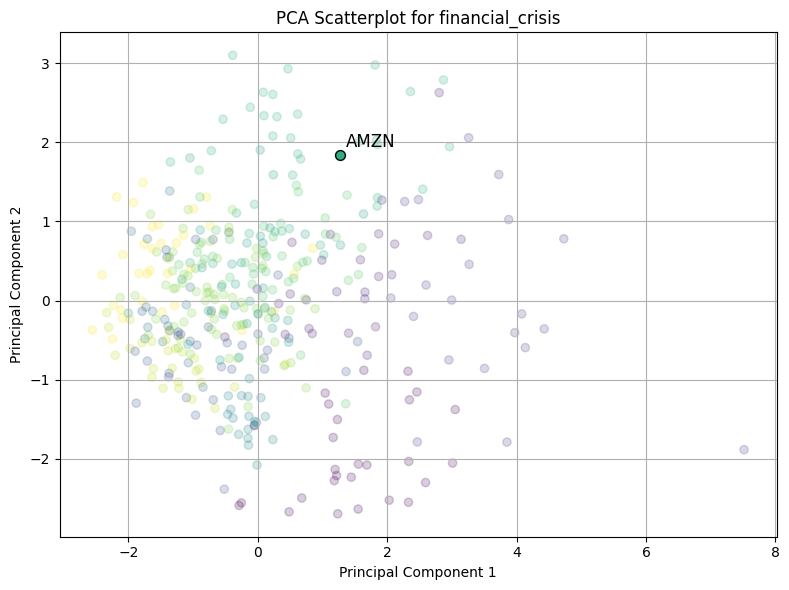

********** Period:  financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                31
Communication Services     4
Consumer Cyclical          3
Basic Materials            0
Consumer Defensive         0
Energy                     0
Financial Services         0
Healthcare                 0
Industrials                0
Real Estate                0
Utilities                  0
Name: 7, dtype: int64 

Industry Sector
Technology                81.578947
Communication Services    10.526316
Consumer Cyclical          7.894737
Basic Materials            0.000000
Consumer Defensive         0.000000
Energy                     0.000000
Financial Services         0.000000
Healthcare                 0.000000
Industrials                0.000000
Real Estate                0.000000
Utilities                  0.000000
Name: 7, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Sector

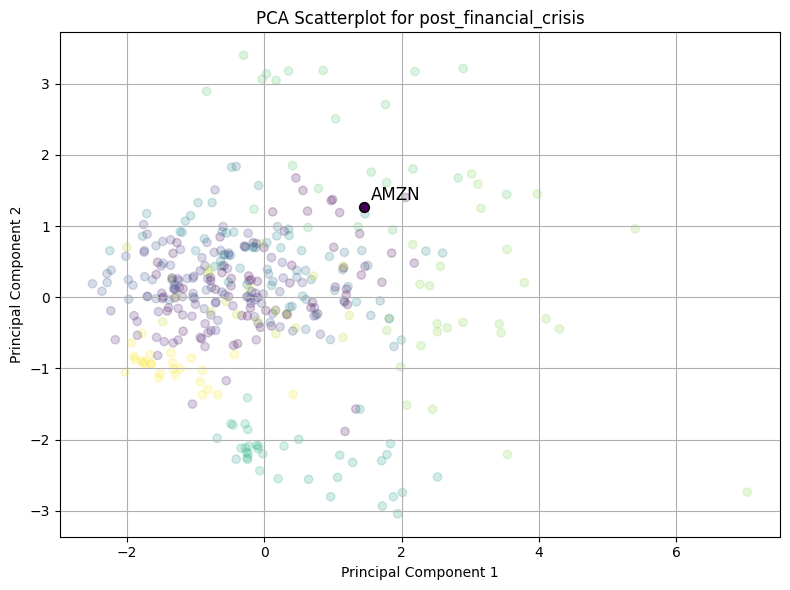

********** Period:  post_financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                20
Industrials               11
Financial Services         8
Healthcare                 8
Consumer Cyclical          6
Communication Services     3
Real Estate                3
Consumer Defensive         2
Basic Materials            1
Energy                     0
Utilities                  0
Name: 0, dtype: int64 

Industry Sector
Technology                32.258065
Industrials               17.741935
Financial Services        12.903226
Healthcare                12.903226
Consumer Cyclical          9.677419
Communication Services     4.838710
Real Estate                4.838710
Consumer Defensive         3.225806
Basic Materials            1.612903
Energy                     0.000000
Utilities                  0.000000
Name: 0, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry S

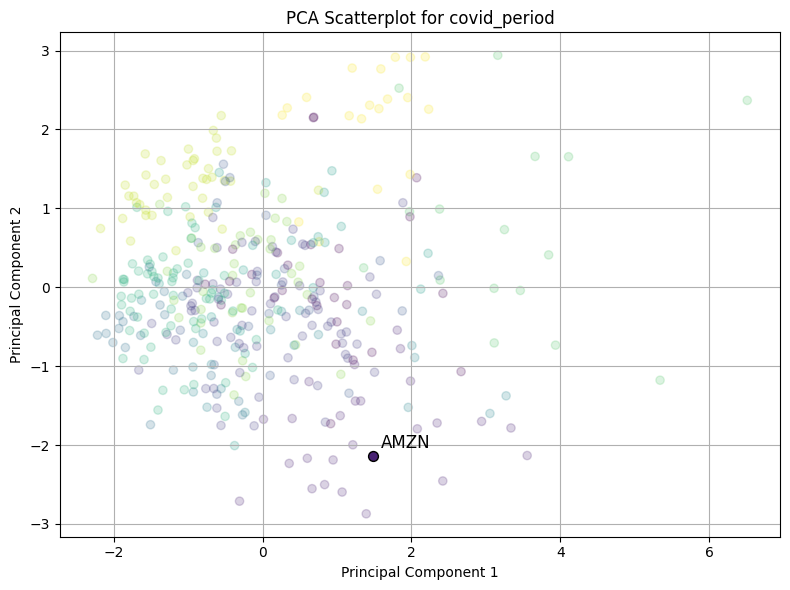

********** Period:  covid_period **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                22
Communication Services     3
Consumer Cyclical          1
Basic Materials            0
Consumer Defensive         0
Energy                     0
Financial Services         0
Healthcare                 0
Industrials                0
Real Estate                0
Utilities                  0
Name: 1, dtype: int64 

Industry Sector
Technology                84.615385
Communication Services    11.538462
Consumer Cyclical          3.846154
Basic Materials            0.000000
Consumer Defensive         0.000000
Energy                     0.000000
Financial Services         0.000000
Healthcare                 0.000000
Industrials                0.000000
Real Estate                0.000000
Utilities                  0.000000
Name: 1, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Sector  Ba

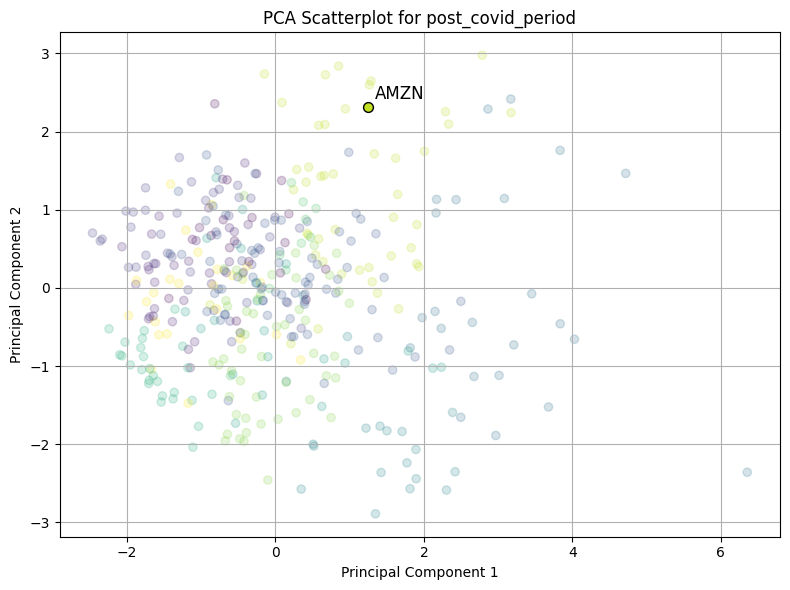

********** Period:  post_covid_period **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                37
Basic Materials            3
Communication Services     3
Industrials                2
Consumer Cyclical          1
Healthcare                 1
Consumer Defensive         0
Energy                     0
Financial Services         0
Real Estate                0
Utilities                  0
Name: 10, dtype: int64 

Industry Sector
Technology                78.723404
Basic Materials            6.382979
Communication Services     6.382979
Industrials                4.255319
Consumer Cyclical          2.127660
Healthcare                 2.127660
Consumer Defensive         0.000000
Energy                     0.000000
Financial Services         0.000000
Real Estate                0.000000
Utilities                  0.000000
Name: 10, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Sec

In [178]:
n_cluster = 12
pca_corr = PCA(n_components=10)
pca = PCA(n_components=2)
scaler = StandardScaler()

# Iterate over each period data
for index, period_data in enumerate(periods):
    # Use only the columns corresponding to this period
    # Get the correlation matrix specifically for this period
    period_correlation_matrix = period_data.corr()
    correlation_matrix_reduced2 = pca_corr.fit_transform(period_correlation_matrix)
    correlation_matrix_reduced2 = pd.DataFrame(correlation_matrix_reduced2)
    correlation_matrix_reduced2.rename(columns={0: "Corr_PCA_1", 1: "Corr_PCA_2", 2: "Corr_PCA_3", 3: "Corr_PCA_4", 4: "Corr_PCA_5", 5: "Corr_PCA_6", 6: "Corr_PCA_7", 7: "Corr_PCA_8", 8: "Corr_PCA_9", 9: "Corr_PCA_10"}, inplace=True)
    correlation_matrix_reduced2.index = period_correlation_matrix.index   # The underlying order of the rows remains after PCA

    combined_matrix = pd.concat([feature_matrix[period_columns[0]], correlation_matrix_reduced2], axis=1)
    combined_matrix_2 = combined_matrix.reset_index()
    combined_matrix_2.rename(columns={'index': 'Company'}, inplace=True)

    scaled_features_1 = scaler.fit_transform(combined_matrix)
    pca_components = pca.fit_transform(scaled_features_1)

    # Use the best hyperparameters
    kmeans = KMeans(n_clusters=n_cluster, random_state=123, algorithm='lloyd', init='random', max_iter=500, n_init=10)
    kmeans.fit(scaled_features_1)
    kmeans_labels = kmeans.labels_

    combined_matrix_2['Cluster'] = kmeans_labels

    plt.figure(figsize=(8, 6))

    # Create a colormap from the kmeans labels
    unique_labels_length = len(np.unique(kmeans_labels))
    cmap = ListedColormap(plt.cm.viridis(np.linspace(0, 1, unique_labels_length)))
    colors = cmap(kmeans_labels)

    plt.scatter(pca_components[:, 0], pca_components[:, 1], c=colors, cmap='viridis', alpha=0.2)

    # Highlight 'AMZN'
    amzn_index = period_correlation_matrix.index.get_loc('AMZN')
    plt.scatter(pca_components[amzn_index, 0], pca_components[amzn_index, 1], color=colors[amzn_index], marker='o', s=50, edgecolors='black', alpha=1.0)
    plt.annotate('AMZN', xy=(pca_components[amzn_index, 0], pca_components[amzn_index, 1]), xytext=(pca_components[amzn_index, 0] + 0.1, pca_components[amzn_index, 1] + 0.1), fontsize=12, color='black')

    plt.title(f'PCA Scatterplot for {period_names[index]}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    amazons_cluster = kmeans_labels[amzn_index]

    print("********** Period: ", period_names[index], "**********")
    sector_counts_amzn = pd.DataFrame({'Cluster': kmeans_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    sector_percentages_amzn = sector_counts_amzn.div(sector_counts_amzn.sum(axis=1), axis=0) * 100
    print("\n1. Count and percentage of industry sector in the cluster that Amazon is in: ")
    #count
    print(sector_counts_amzn.loc[amazons_cluster].sort_values(ascending=False), "\n")
    #order by percentage in descending order
    print(sector_percentages_amzn.loc[amazons_cluster].sort_values(ascending=False))

    print("\n2. Count and percentage of industry sector in all clusters: \n")
    #count
    print(sector_counts_amzn)
    print(sector_percentages_amzn)
    print("\n")

    # Get distances between each data point and cluster centers
    distances = kmeans.transform(scaled_features_1)

    # Get distances for Amazon
    amazon_distances = distances[amzn_index]

    # Sort distances in ascending order and get corresponding cluster indices
    sorted_distances_indices = np.argsort(amazon_distances)
    sorted_amazon_distances = amazon_distances[sorted_distances_indices]

    # Print distances in ascending order
    print("\n3. Distances between Amazon and all cluster centers (in ascending order): \n")
    for idx in sorted_distances_indices:
        print(f"Cluster {idx}: {amazon_distances[idx]}")

    print("\n4. More information about each cluster: \n")
    print(combined_matrix_2.drop(['Company'], axis=1).groupby('Cluster').mean())

##**9.2 Hierarchical clustering**

###**9.2.1 Hyperparameter tuning**

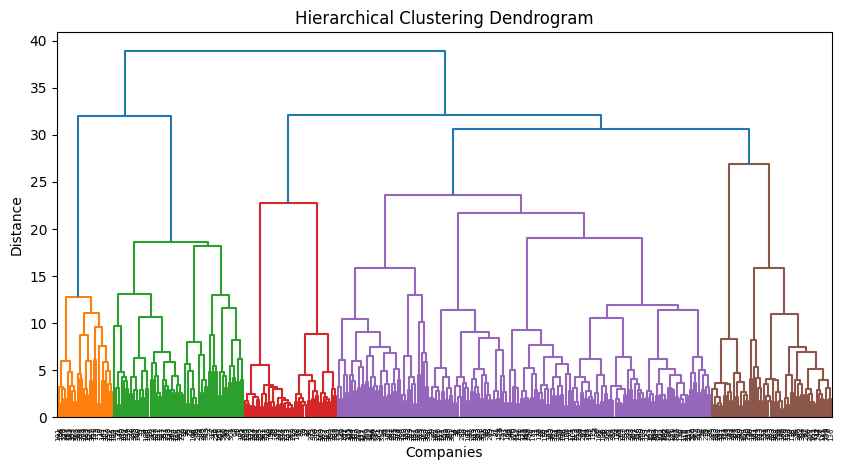

In [179]:
# Plot a dendogram to get an idea of the distance
link = linkage(combined_matrix_scaled, method='ward', metric='euclidean')  #AgglomerativeClustering from scikitlearn uses linkage=ward by default, so use ward here as well

# Plot dendrogram
plt.figure(figsize=(10, 5))
dendrogram(link)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Companies')
plt.ylabel('Distance')
plt.show()

In [181]:
# *****
param_grid_hierarchical = {
    'n_clusters': range(2, 21),
    'linkage': ['ward'],
    'metric': ['euclidean'],
}

hierarchical_third = AgglomerativeClustering(n_clusters=None)

# Initialize variables
best_hierarchical_third_score = -2    # The lowest that silhouette score can be is -1
best_hierarchical_third_grid = None
best_hierarchical_third_labels = None
hierarchical_third_results = []

# Find the best hyperparameter combination
for g in ParameterGrid(param_grid_hierarchical):

    hierarchical_third.set_params(**g)

    if g['metric'] == 'precomputed':
        distance_matrix = pairwise_distances(combined_matrix_scaled, metric='euclidean')
        hierarchical_third.fit(distance_matrix)
    else:
        hierarchical_third.fit(combined_matrix_scaled)

    hierarchical_third_labels = hierarchical_third.labels_
    score = silhouette_score(combined_matrix_scaled, hierarchical_third_labels)
    hierarchical_third_results.append({'hyperparameters': g, 'silhouette_score': score, 'cluster_count': np.unique(hierarchical_third_labels, return_counts=True)})

    if score > best_hierarchical_third_score:
        best_hierarchical_third_score = score
        best_hierarchical_third_grid = g
        best_hierarchical_third_labels = hierarchical_third_labels

print("The best silhouette score is: ", best_hierarchical_third_score)
print("The best hyperparameters are: ", best_hierarchical_third_grid)
hierarchical_third_results_df = pd.DataFrame(hierarchical_third_results)

The best silhouette score is:  0.18987431020877296
The best hyperparameters are:  {'linkage': 'ward', 'metric': 'euclidean', 'n_clusters': 17}


For the record:

The best silhouette score is:  0.18987431020877296

The best hyperparameters are:  {'linkage': 'ward', 'metric': 'euclidean', 'n_clusters': 17}

In [182]:
hierarchical_third_results_df.sort_values(by='silhouette_score', ascending=False)

,hyperparameters,silhouette_score,cluster_count
15,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.189874,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
14,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.187098,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
16,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.185523,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
12,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.184885,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
13,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.184753,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
11,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.177744,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [..."
18,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.175675,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
10,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.174947,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], [41, ..."
17,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.172221,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
9,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.168375,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10], [30, 41, ..."


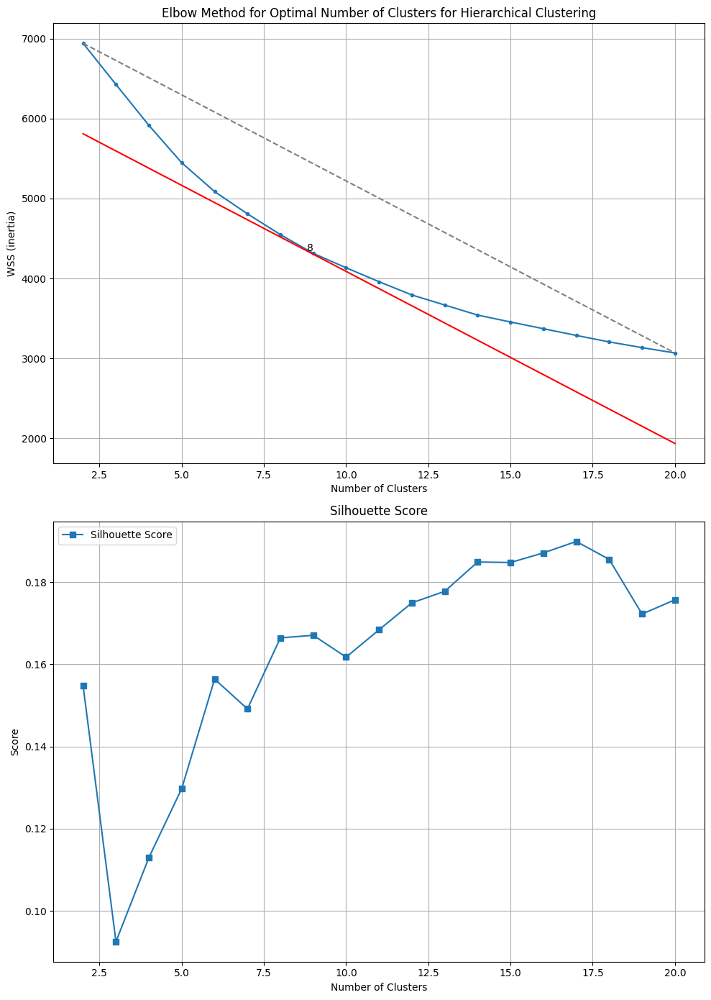

In [184]:
WSS = wss_calculation2(20, combined_matrix_scaled)

# Test out different values of n_clusters using the elbow method
# Try the numbers between 2 to 20
n_cluster_options = range(2, 21)

silhouette_scores_hierarchical = []
hierarchical_results = {}

for n_cluster in n_cluster_options:
    hierarchical = AgglomerativeClustering(n_clusters=n_cluster, linkage='ward', metric='euclidean')
    hierarchical.fit(combined_matrix_scaled)
    hierarchical_labels = hierarchical.labels_
    hierarchical_results[n_cluster] = hierarchical_labels

    # Record the metrics
    silhouette_scores_hierarchical.append(silhouette_score(combined_matrix_scaled, hierarchical_labels))

start_point = (n_cluster_options[0], WSS[0])
end_point = (n_cluster_options[-1], WSS[-1])
slope = (end_point[1] - start_point[1]) / (end_point[0] - start_point[0])

x_values = np.linspace(2, 20)
y_values = slope * x_values + 6240

#plot subplots
fig, ax = plt.subplots(2, 1, figsize=(10, 14))

# Plot elbow method (inertia)
ax[0].plot(n_cluster_options, WSS, marker='.')
ax[0].plot([start_point[0], end_point[0]], [start_point[1], end_point[1]], linestyle='--', color='gray')
ax[0].plot(x_values, y_values, color='red')
ax[0].text(n_cluster_options[7], WSS[7], f'{n_cluster_options[6]}', ha='right', va='bottom')
ax[0].set_xlabel('Number of Clusters')
ax[0].set_ylabel('WSS (inertia)')
ax[0].set_title('Elbow Method for Optimal Number of Clusters for Hierarchical Clustering')
ax[0].grid(True)

# Plot the silhoutte score and davies-bouldin index
ax[1].plot(n_cluster_options, silhouette_scores_hierarchical, marker='s', label='Silhouette Score')
ax[1].set_xlabel('Number of Clusters')
ax[1].set_ylabel('Score')
ax[1].set_title('Silhouette Score')
ax[1].legend()
ax[1].grid(True)

plt.tight_layout()
plt.show()

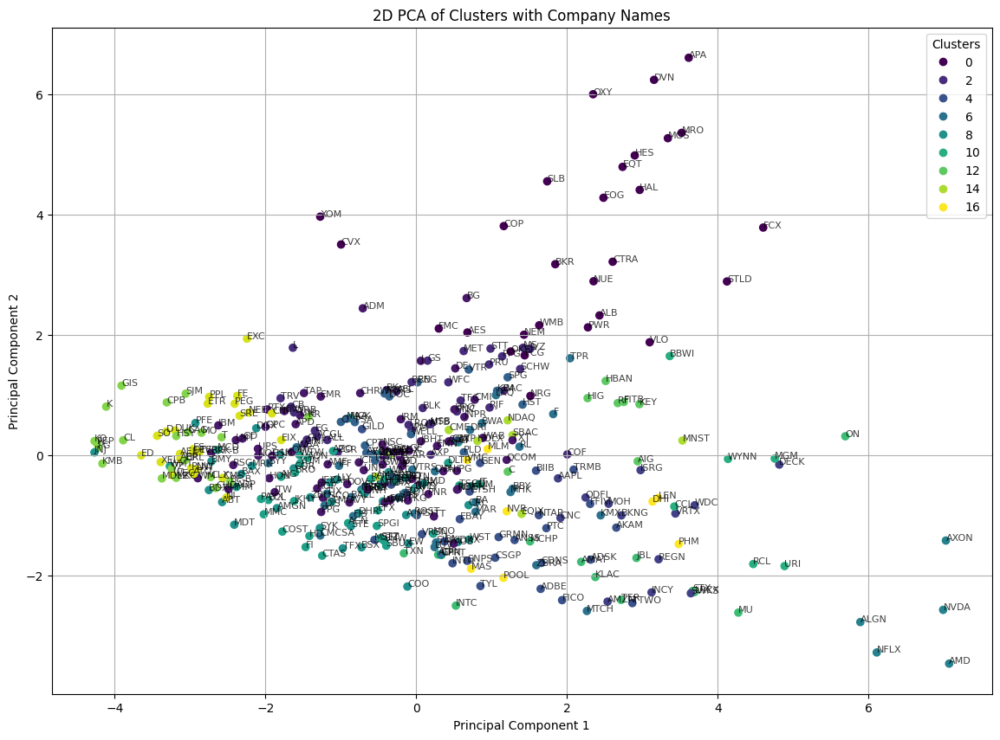

In [185]:
pca_2d = PCA(n_components=2)
components_2d = pca_2d.fit_transform(combined_matrix_scaled)

# Apply hierarchical clustering with the optimal number of clusters
hierarchical = AgglomerativeClustering(n_clusters=17, linkage='ward', metric='euclidean')
clusters = hierarchical.fit_predict(combined_matrix_scaled)

# Create 2D plot with annotations
plt.figure(figsize=(14, 10))
scatter = plt.scatter(components_2d[:, 0], components_2d[:, 1], c=clusters, cmap='viridis')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.title('2D PCA of Clusters with Company Names')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)

for i, txt in enumerate(merged_data['Company']):
    plt.annotate(txt, (components_2d[i, 0], components_2d[i, 1]), fontsize=8, alpha=0.75)

plt.show()

###**9.2.2 Count and percentage of industry sector in each cluster**

In [186]:
n_cluster_options = range(2, 21)
hierarchical_third_labels = {}

for n_cluster in n_cluster_options:
    hierarchical = AgglomerativeClustering(n_clusters=n_cluster, linkage='ward', metric='euclidean')
    hierarchical.fit(combined_matrix_scaled)
    hierarchical_labels = hierarchical.labels_
    hierarchical_third_labels[n_cluster] = hierarchical_labels

In [187]:
hierarchical_third_sector_count_dfs = {}
hierarchical_third_sector_percentage_dfs = {}

for n_cluster in n_cluster_options:
    cluster_labels = hierarchical_third_labels[n_cluster]
    sector_counts = pd.DataFrame({'Cluster': cluster_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    hierarchical_third_sector_count_dfs[n_cluster] = sector_counts
    sector_percentages = sector_counts.div(sector_counts.sum(axis=1), axis=0) * 100
    hierarchical_third_sector_percentage_dfs[n_cluster] = sector_percentages

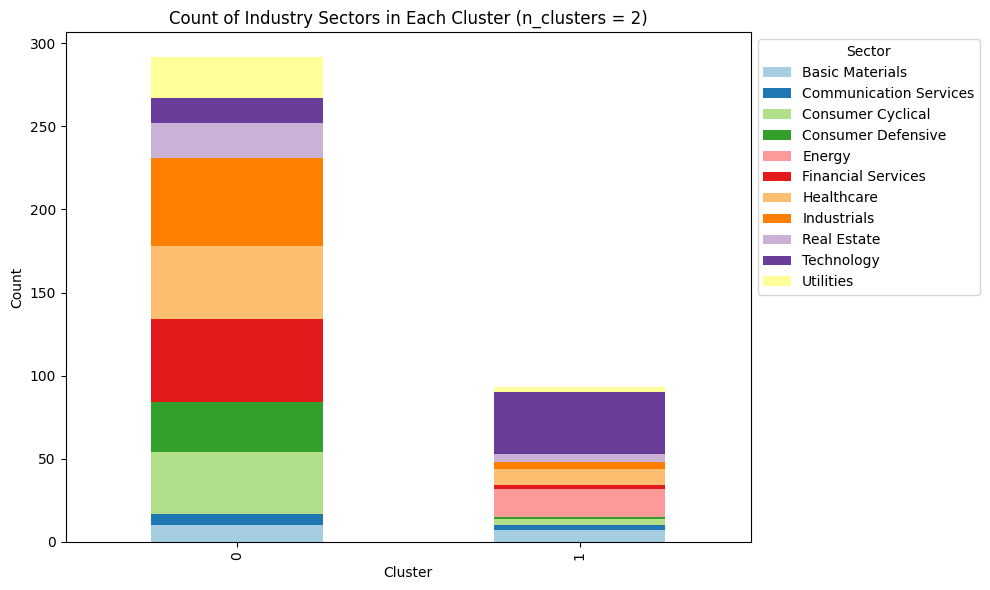

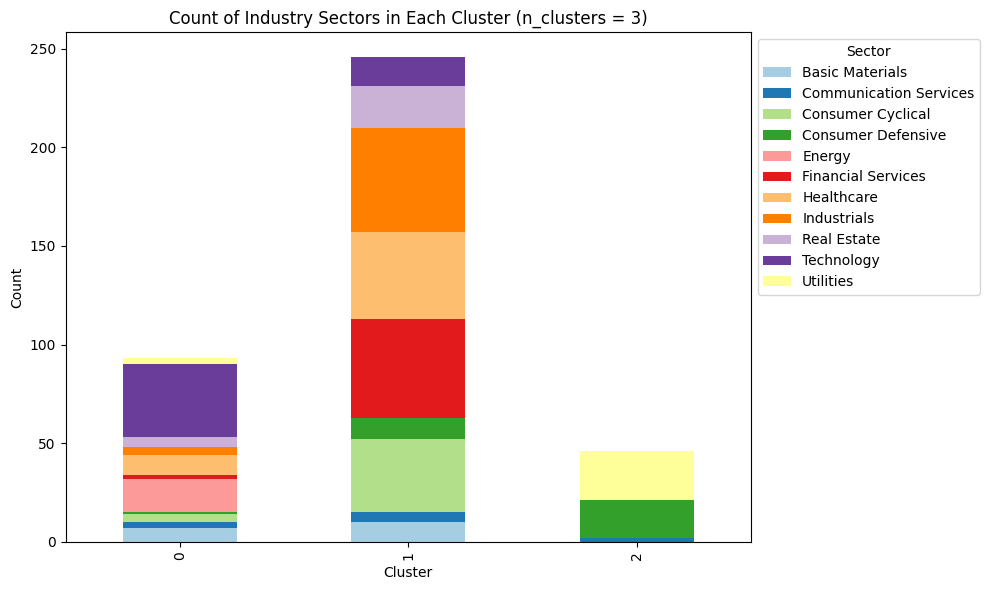

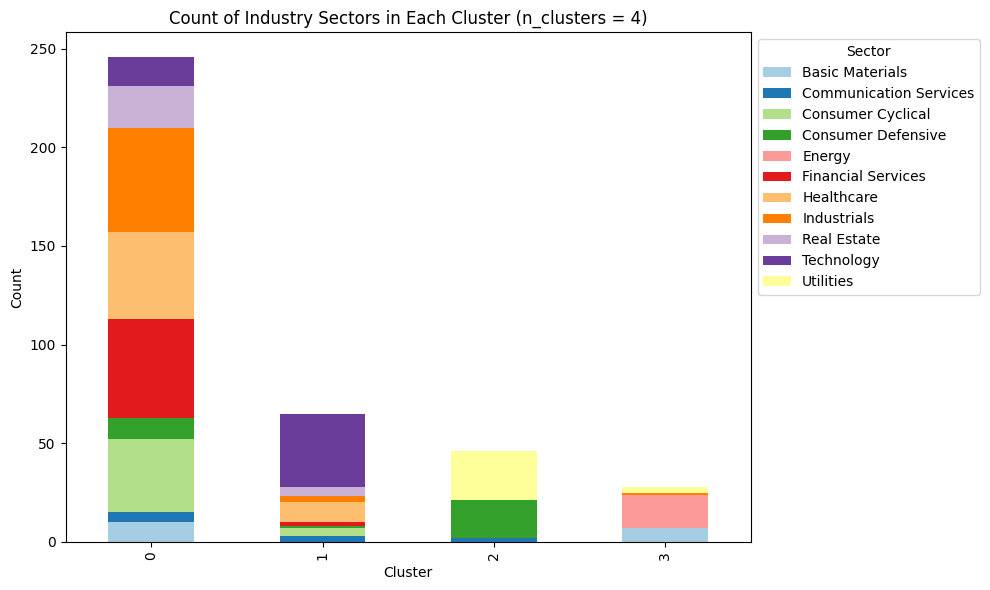

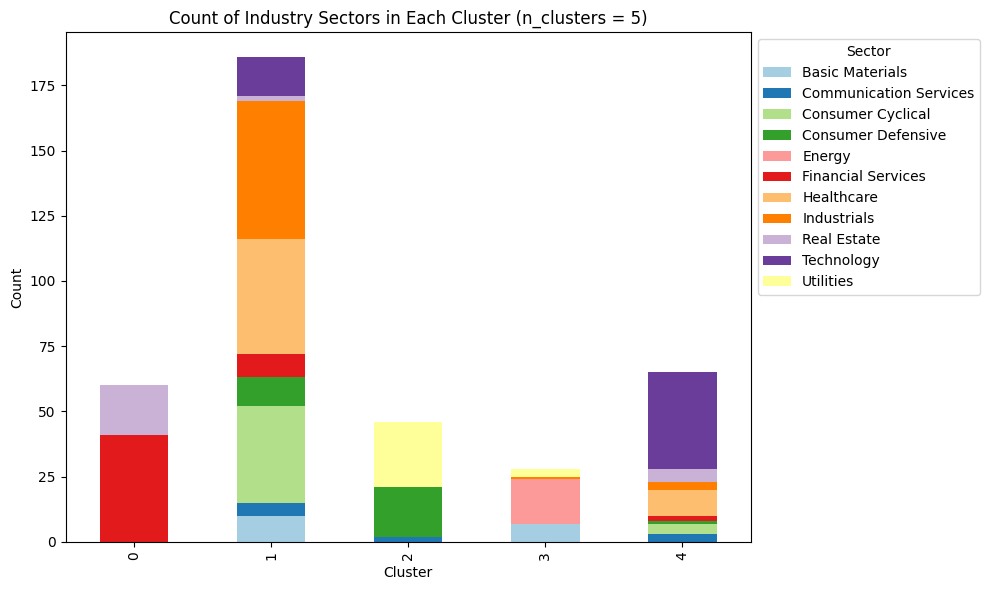

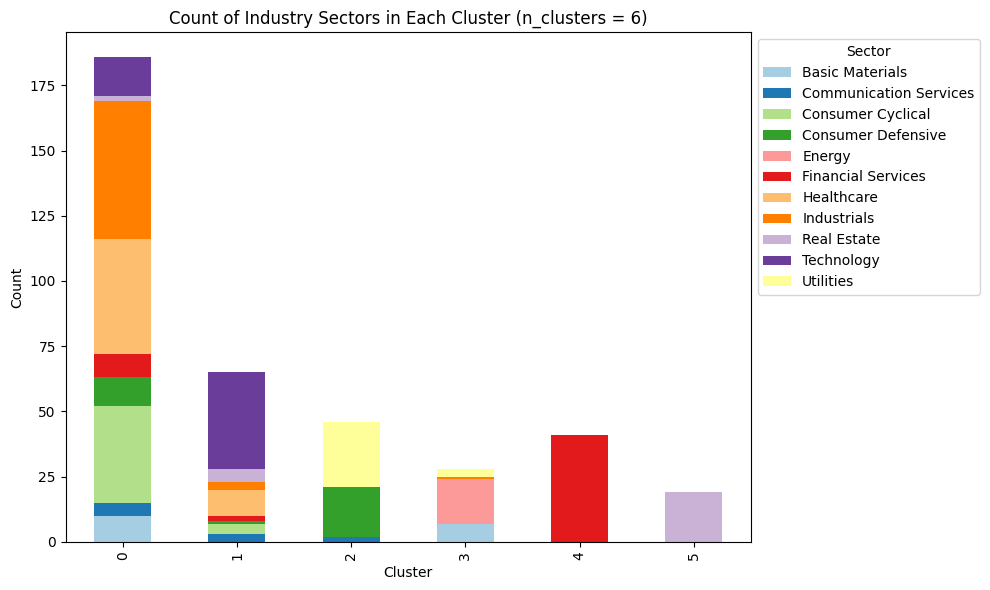

...

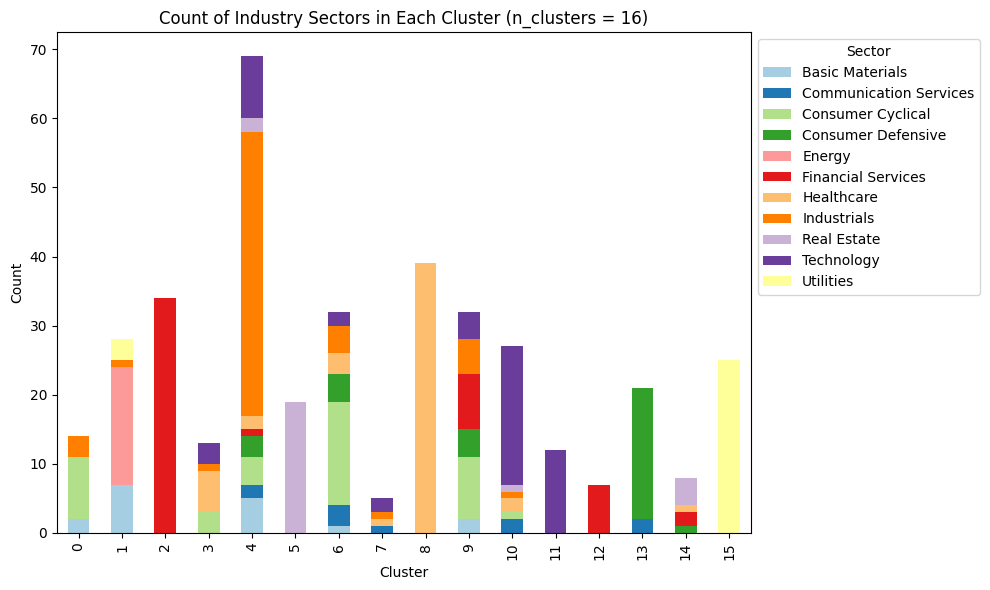

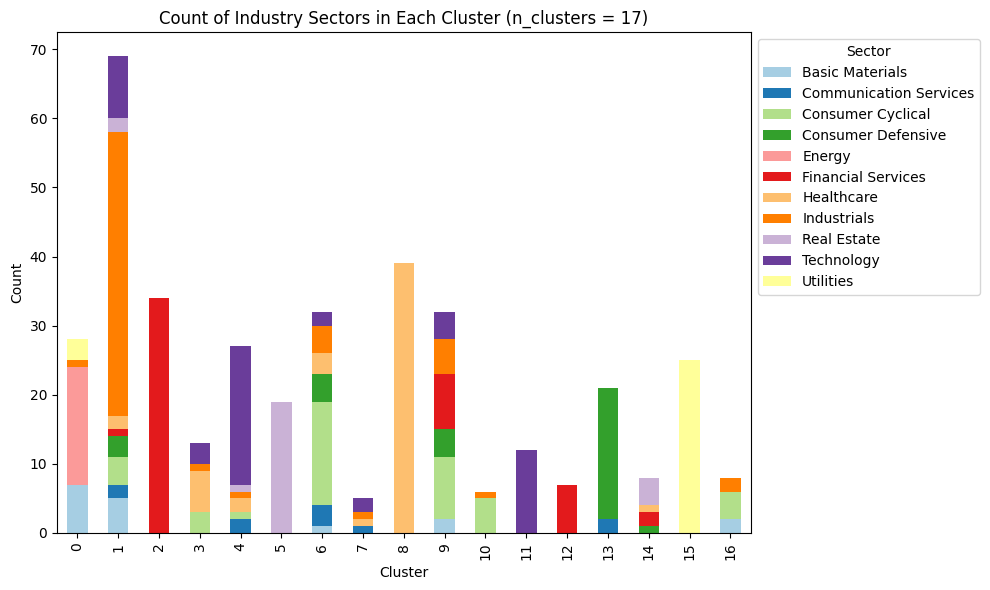

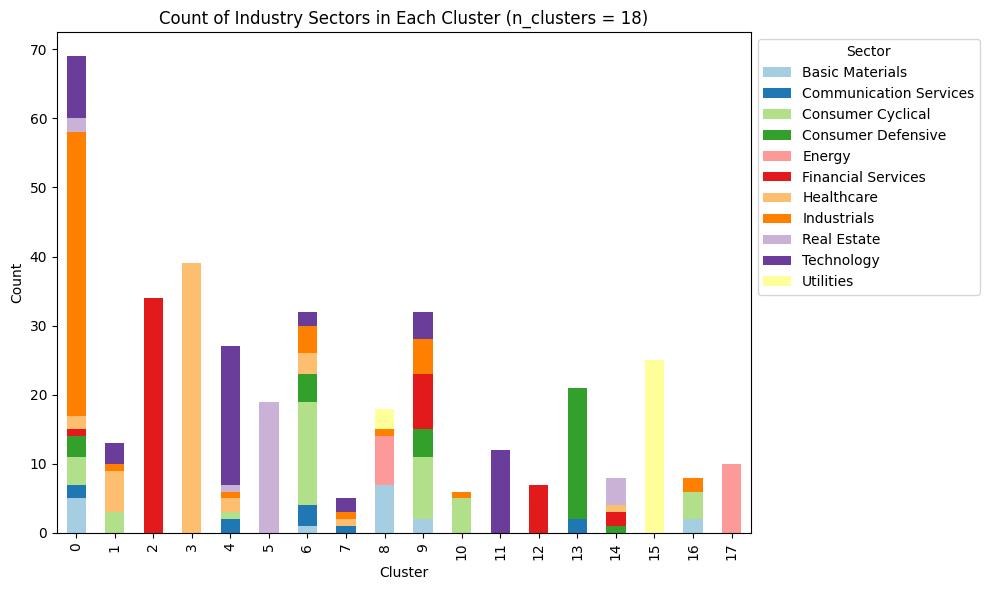

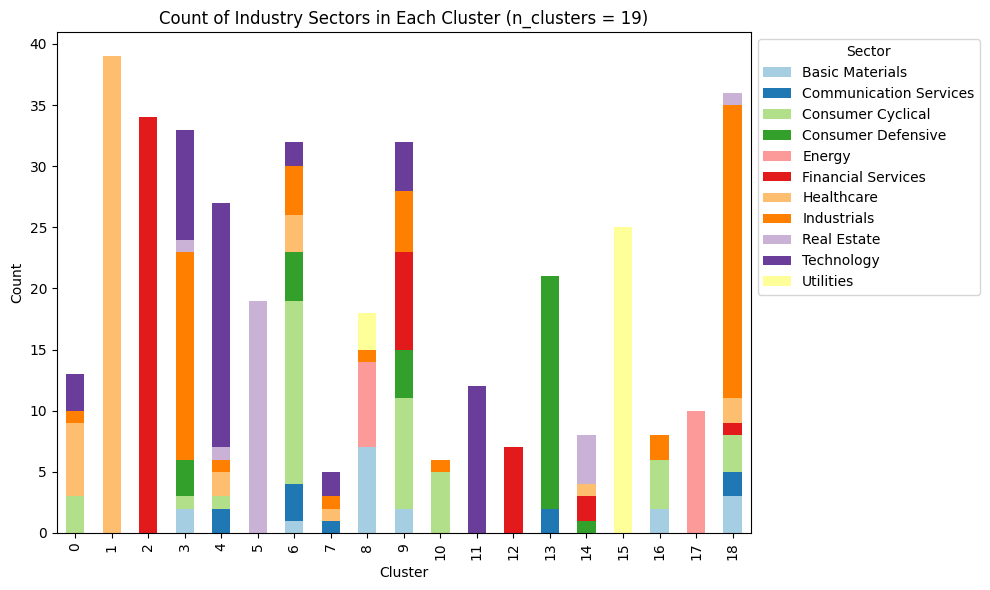

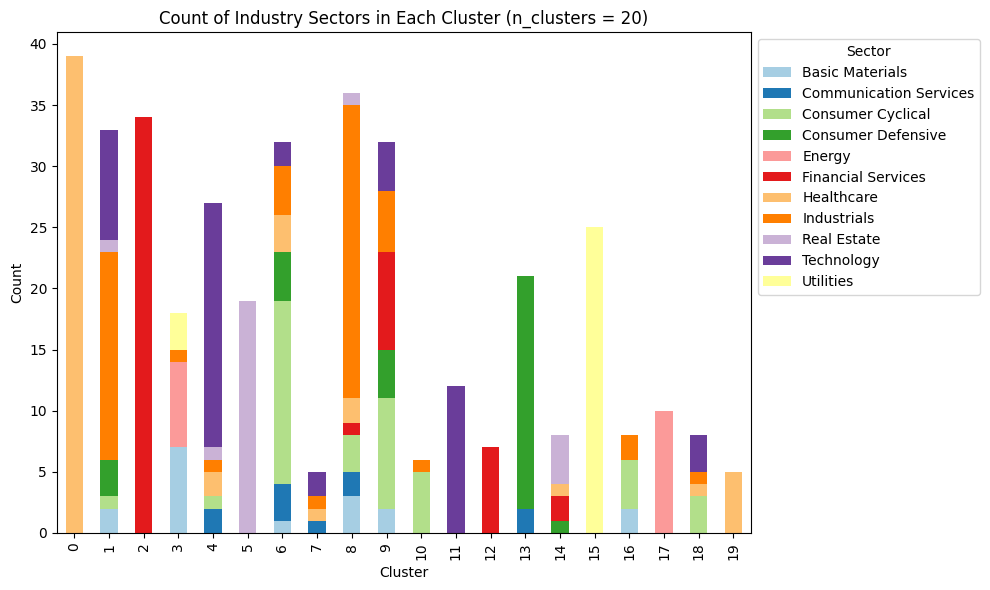

In [188]:
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Stacked bar charts
for n_cluster in n_cluster_options:
    hierarchical_third_sector_count_df = hierarchical_third_sector_count_dfs[n_cluster]

    ax = hierarchical_third_sector_count_df.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
    plt.title(f'Count of Industry Sectors in Each Cluster (n_clusters = {n_cluster})')
    plt.xlabel('Cluster')
    plt.ylabel('Count')
    plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

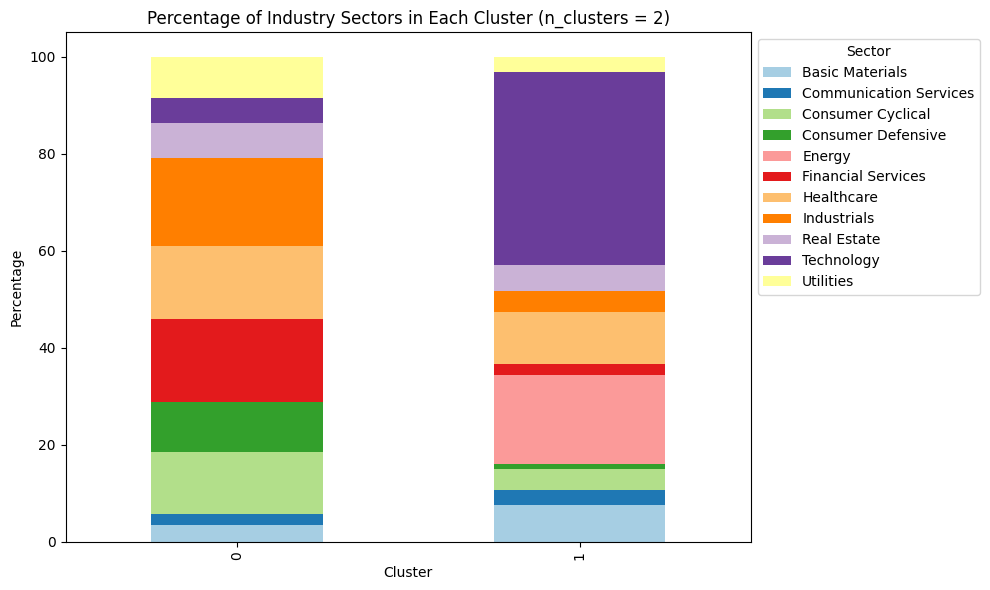

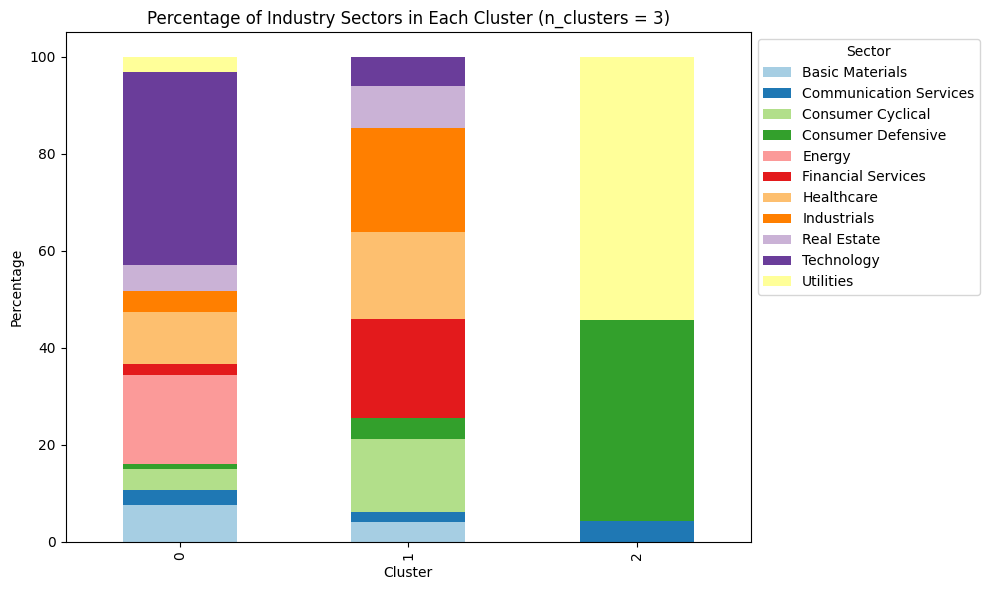

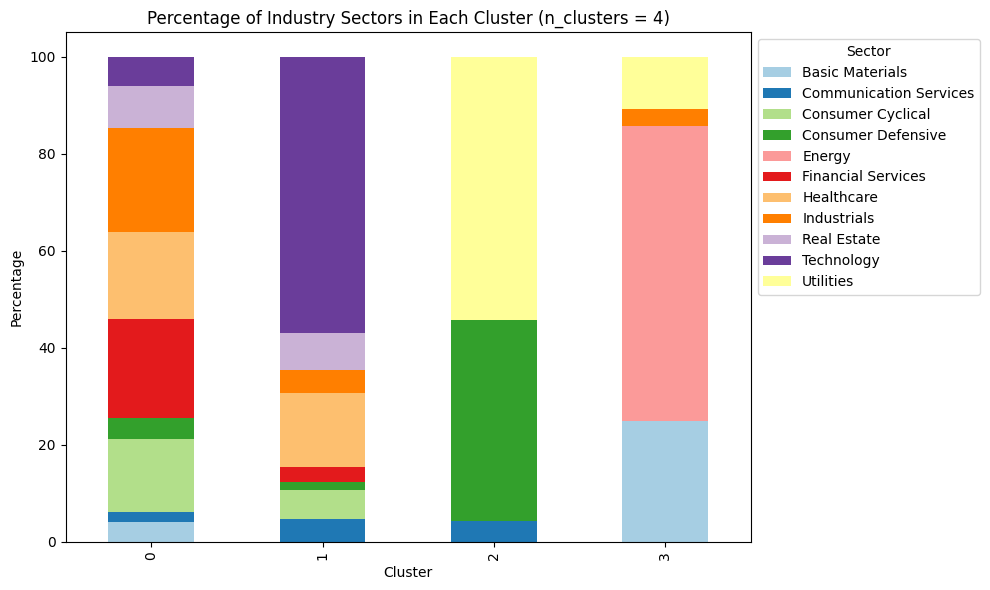

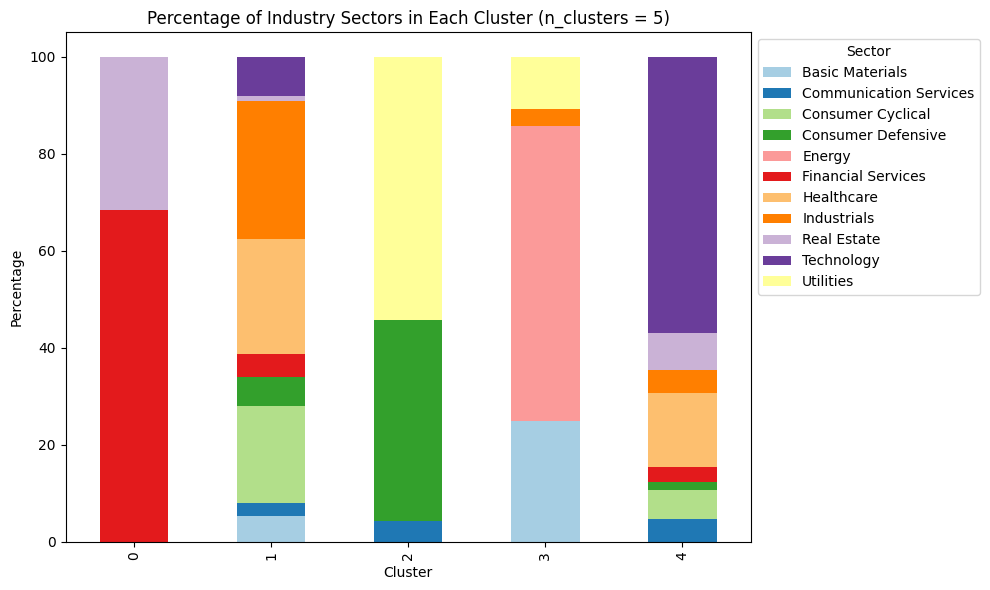

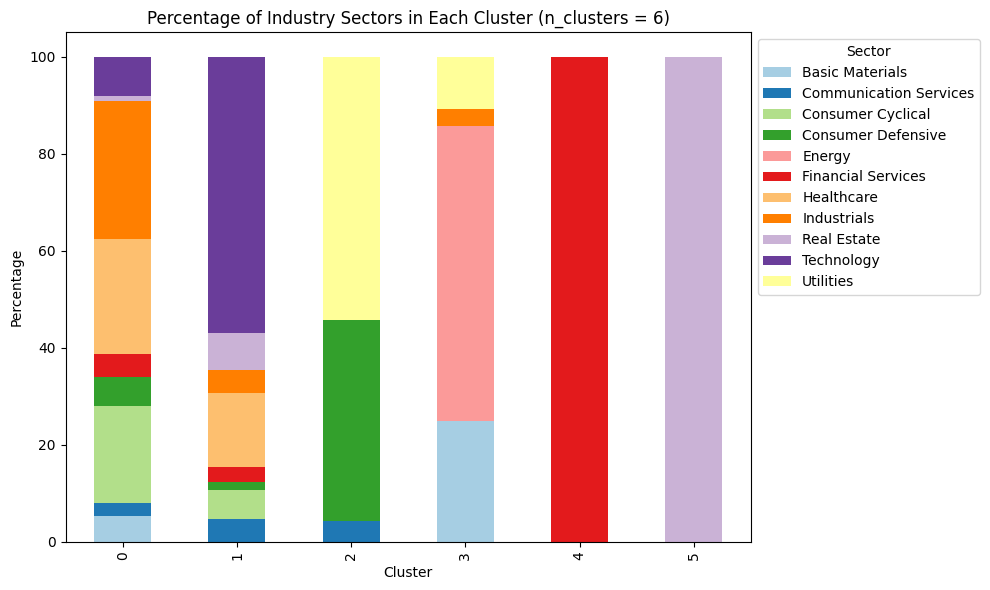

...

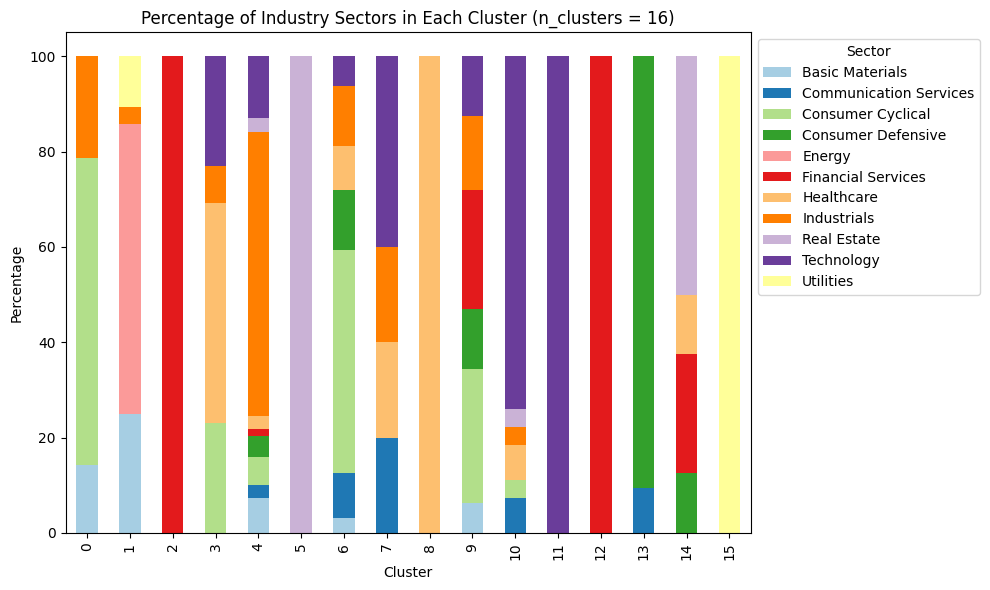

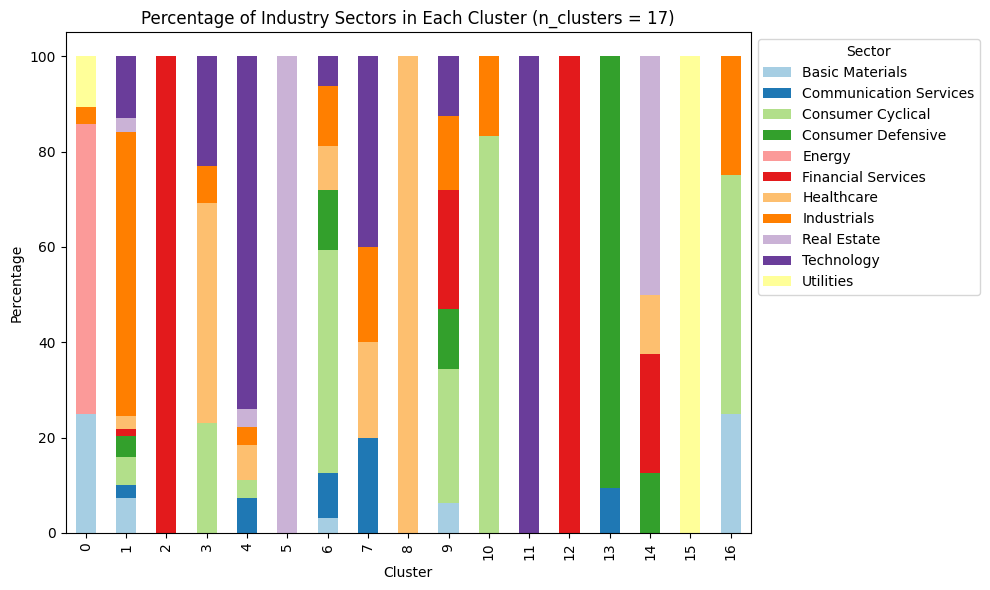

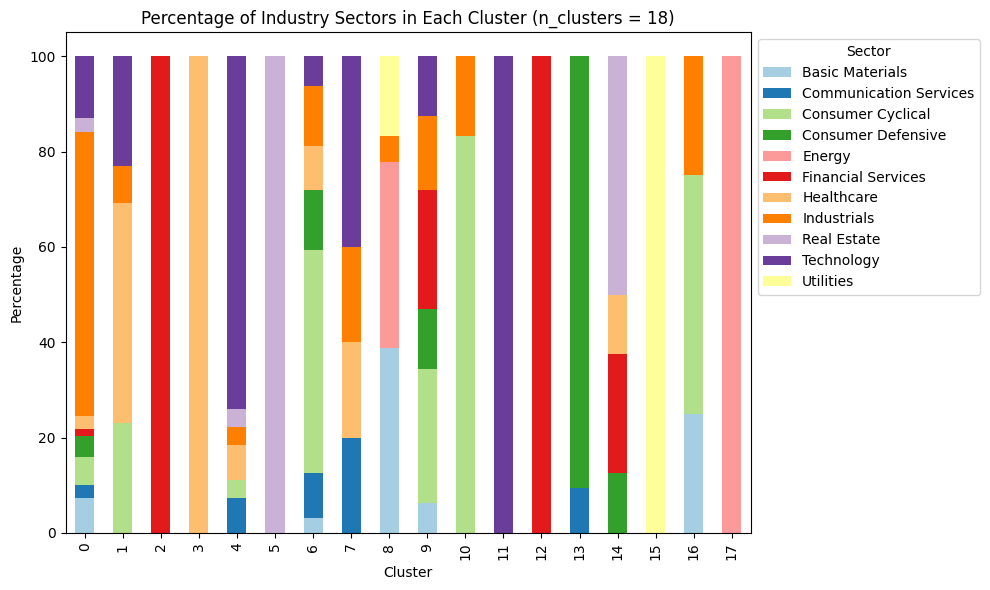

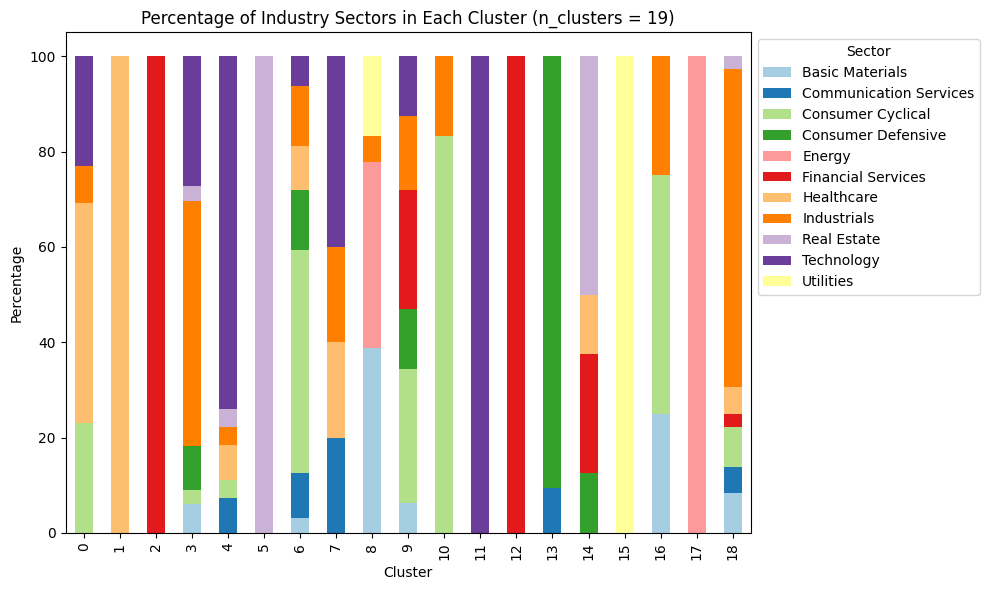

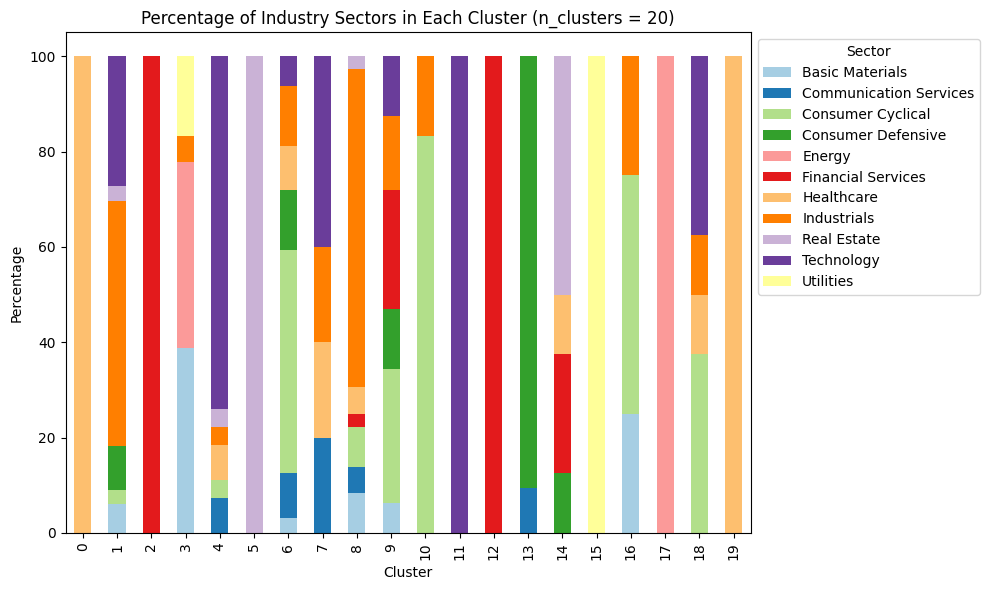

In [189]:
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Stacked bar charts
for n_cluster in n_cluster_options:
    hierarchical_third_sector_percentage_df = hierarchical_third_sector_percentage_dfs[n_cluster]

    ax = hierarchical_third_sector_percentage_df.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
    plt.title(f'Percentage of Industry Sectors in Each Cluster (n_clusters = {n_cluster})')
    plt.xlabel('Cluster')
    plt.ylabel('Percentage')
    plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

#####**9.2.2.1 Plots for different periods**
See if the composition/structure of the clusters is maintained over time

[0.33016702 0.51761839 0.62621039 0.67922339 0.71006121 0.72633902
 0.73967566 0.75001594 0.75926051 0.76644441]


<Figure size 800x600 with 0 Axes>

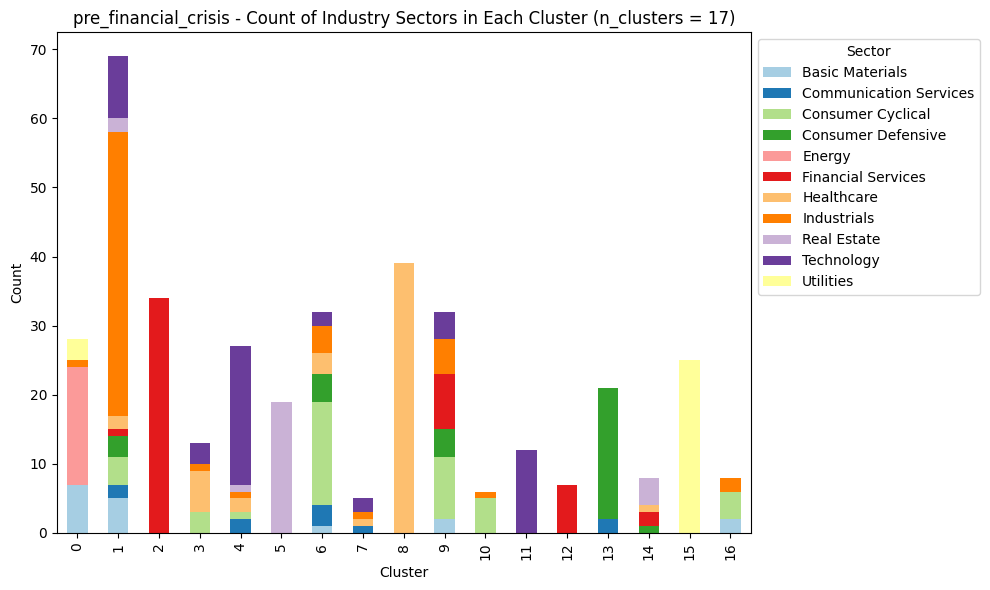

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      25.000000                0.000000           0.000000   
1                       7.246377                2.898551           5.797101   
2                       0.000000                0.000000           0.000000   
3                       0.000000                0.000000          23.076923   
4                       0.000000                7.407407           3.703704   
5                       0.000000                0.000000           0.000000   
6                       3.125000                9.375000          46.875000   
7                       0.000000               20.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                       6.250000                0.000000          28.125000   
10                      0.000000                0.00

<Figure size 800x600 with 0 Axes>

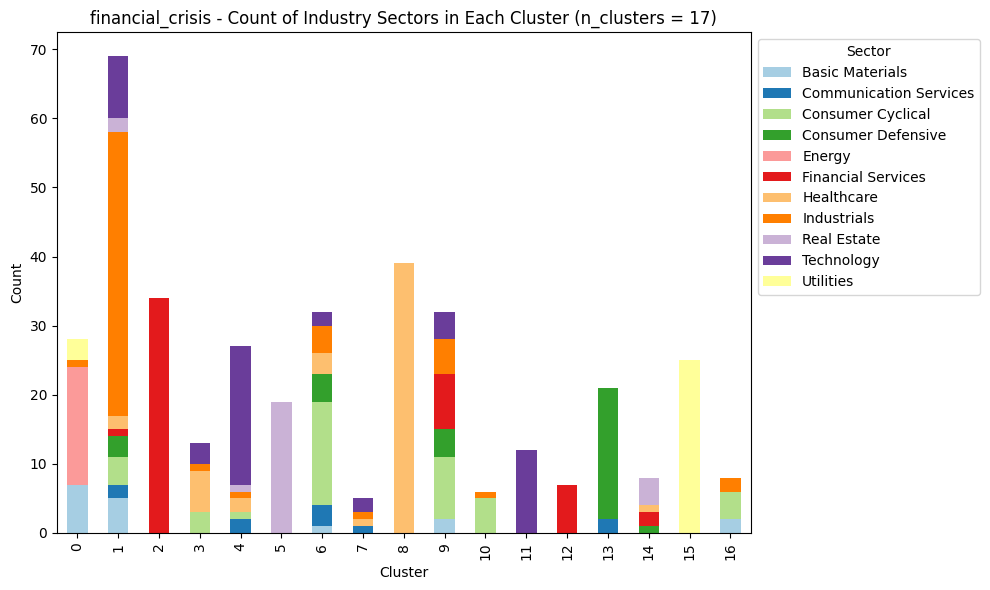

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      25.000000                0.000000           0.000000   
1                       7.246377                2.898551           5.797101   
2                       0.000000                0.000000           0.000000   
3                       0.000000                0.000000          23.076923   
4                       0.000000                7.407407           3.703704   
5                       0.000000                0.000000           0.000000   
6                       3.125000                9.375000          46.875000   
7                       0.000000               20.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                       6.250000                0.000000          28.125000   
10                      0.000000                0.00

<Figure size 800x600 with 0 Axes>

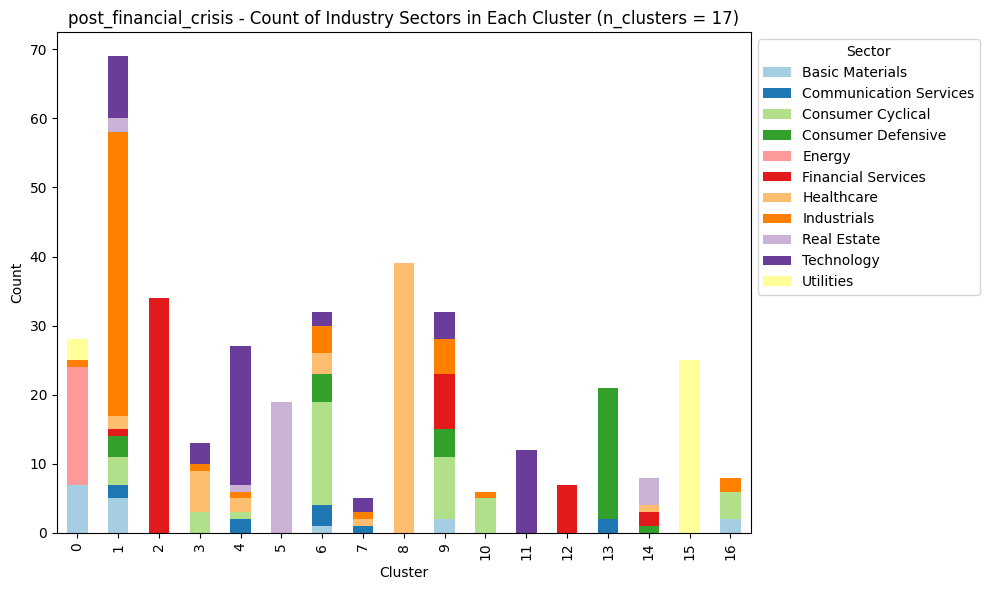

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      25.000000                0.000000           0.000000   
1                       7.246377                2.898551           5.797101   
2                       0.000000                0.000000           0.000000   
3                       0.000000                0.000000          23.076923   
4                       0.000000                7.407407           3.703704   
5                       0.000000                0.000000           0.000000   
6                       3.125000                9.375000          46.875000   
7                       0.000000               20.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                       6.250000                0.000000          28.125000   
10                      0.000000                0.00

<Figure size 800x600 with 0 Axes>

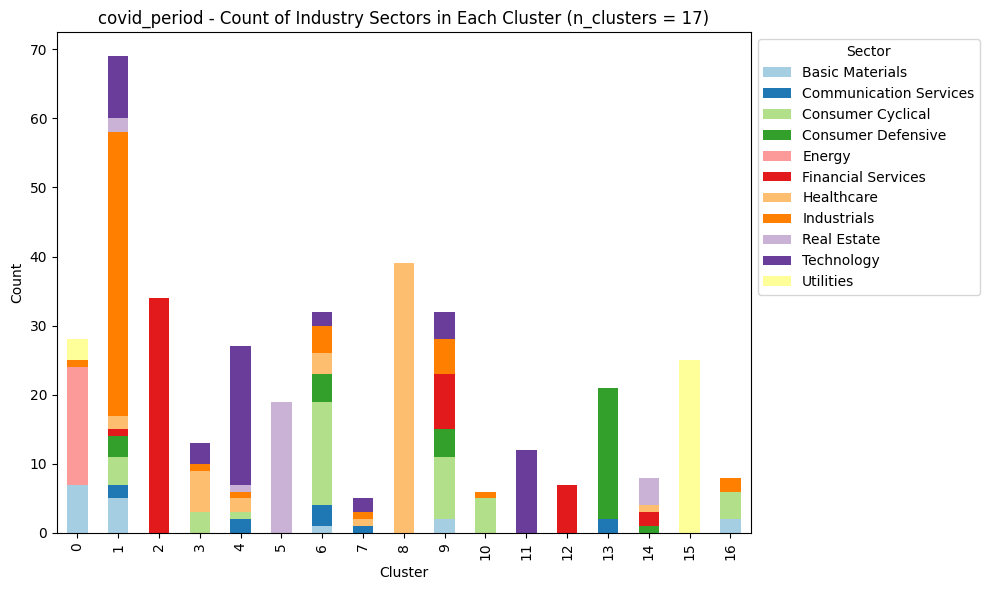

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      25.000000                0.000000           0.000000   
1                       7.246377                2.898551           5.797101   
2                       0.000000                0.000000           0.000000   
3                       0.000000                0.000000          23.076923   
4                       0.000000                7.407407           3.703704   
5                       0.000000                0.000000           0.000000   
6                       3.125000                9.375000          46.875000   
7                       0.000000               20.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                       6.250000                0.000000          28.125000   
10                      0.000000                0.00

<Figure size 800x600 with 0 Axes>

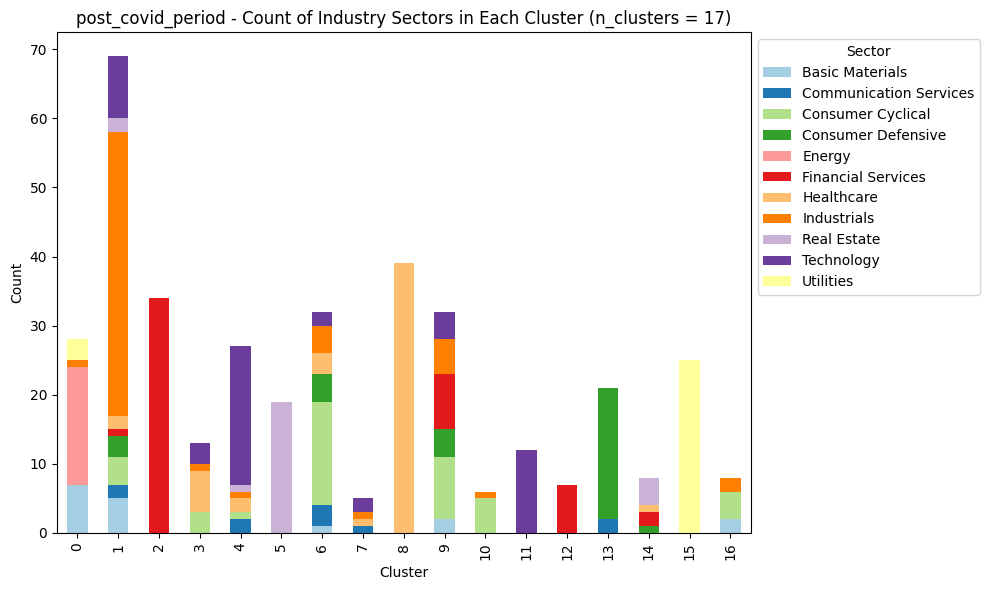

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      25.000000                0.000000           0.000000   
1                       7.246377                2.898551           5.797101   
2                       0.000000                0.000000           0.000000   
3                       0.000000                0.000000          23.076923   
4                       0.000000                7.407407           3.703704   
5                       0.000000                0.000000           0.000000   
6                       3.125000                9.375000          46.875000   
7                       0.000000               20.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                       6.250000                0.000000          28.125000   
10                      0.000000                0.00

In [190]:
# Periods by events
n_cluster = 17
pca_corr = PCA(n_components=10)
scaler = StandardScaler()
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Iterate over each period data
for index, period_data in enumerate(periods):
    # Use only the columns corresponding to this period
    # Get the correlation matrix specifically for this period
    period_correlation_matrix = period_data.corr()
    correlation_matrix_reduced2 = pca_corr.fit_transform(period_correlation_matrix)
    correlation_matrix_reduced2 = pd.DataFrame(correlation_matrix_reduced2)
    correlation_matrix_reduced2.rename(columns={0: "Corr_PCA_1", 1: "Corr_PCA_2", 2: "Corr_PCA_3", 3: "Corr_PCA_4", 4: "Corr_PCA_5", 5: "Corr_PCA_6", 6: "Corr_PCA_7", 7: "Corr_PCA_8", 8: "Corr_PCA_9", 9: "Corr_PCA_10"}, inplace=True)
    # print the percentage of variance explained by the 10 pca columns
    print(pca_corr.explained_variance_ratio_.cumsum())
    correlation_matrix_reduced2.index = period_correlation_matrix.index   # The underlying order of the rows remains after PCA

    combined_matrix = pd.concat([feature_matrix[period_columns[0]], correlation_matrix_reduced2], axis=1)

    scaled_features_1 = scaler.fit_transform(combined_matrix)

    # Use the best hyperparameters
    hierarchical = AgglomerativeClustering(n_clusters=n_cluster, linkage='ward', metric='euclidean')
    hierarchical.fit(combined_matrix_scaled)
    hierarchical_labels = hierarchical.labels_

    plt.figure(figsize=(8, 6))

    sector_counts = pd.DataFrame({'Cluster': hierarchical_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    sector_percentages = sector_counts.div(sector_counts.sum(axis=1), axis=0) * 100

    ax = sector_counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
    plt.title(f'{period_names[index]} - Count of Industry Sectors in Each Cluster (n_clusters = {n_cluster})')
    plt.xlabel('Cluster')
    plt.ylabel('Count')
    plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    print(sector_percentages)

[0.5109742  0.6819086  0.75469722 0.79584484 0.81975627 0.83493267
 0.84643285 0.85583861 0.86149361 0.86677427]


<Figure size 800x600 with 0 Axes>

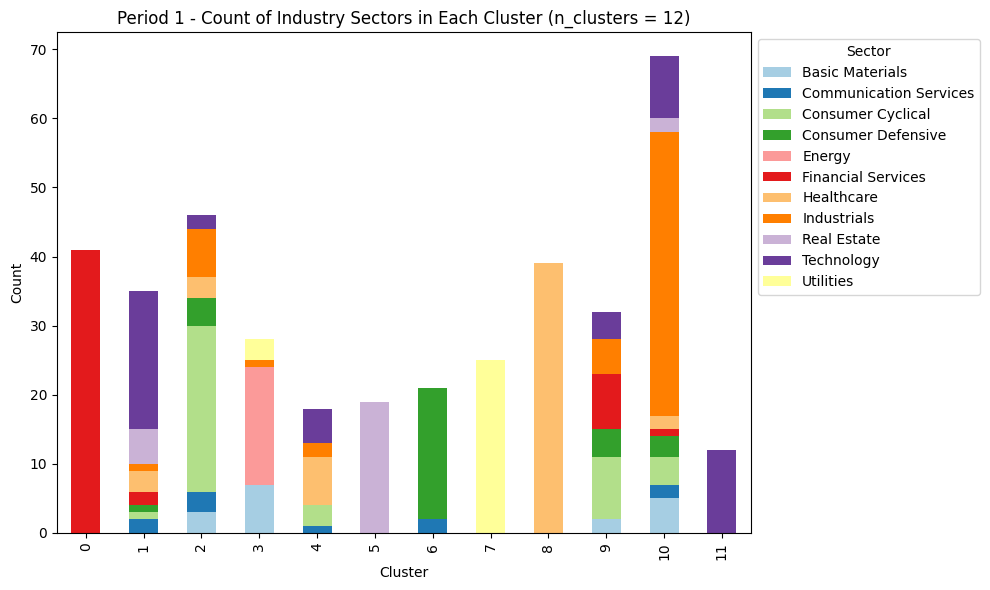

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                0.000000           0.000000   
1                       0.000000                5.714286           2.857143   
2                       6.521739                6.521739          52.173913   
3                      25.000000                0.000000           0.000000   
4                       0.000000                5.555556          16.666667   
5                       0.000000                0.000000           0.000000   
6                       0.000000                9.523810           0.000000   
7                       0.000000                0.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                       6.250000                0.000000          28.125000   
10                      7.246377                2.89

<Figure size 800x600 with 0 Axes>

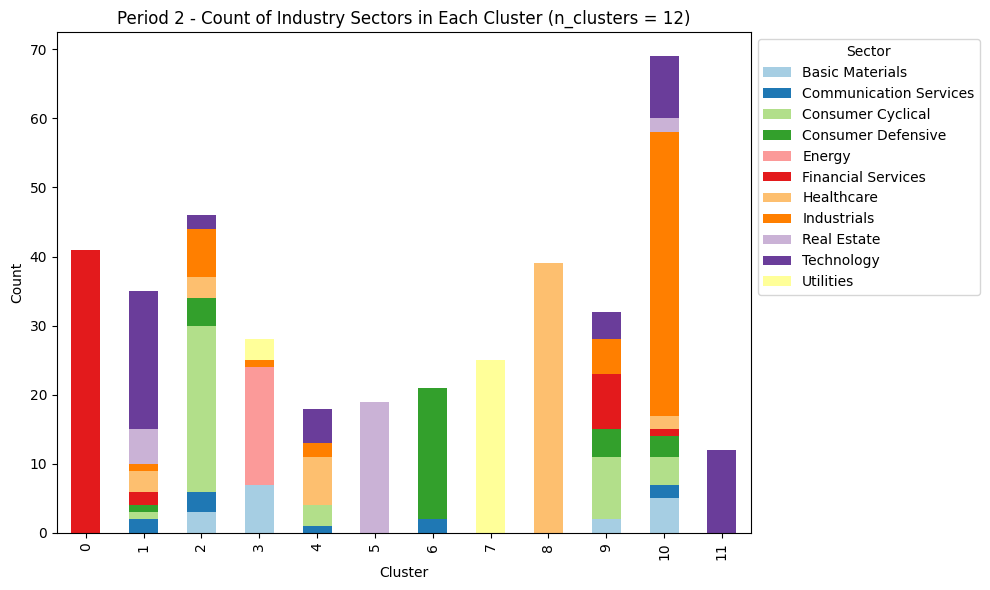

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                0.000000           0.000000   
1                       0.000000                5.714286           2.857143   
2                       6.521739                6.521739          52.173913   
3                      25.000000                0.000000           0.000000   
4                       0.000000                5.555556          16.666667   
5                       0.000000                0.000000           0.000000   
6                       0.000000                9.523810           0.000000   
7                       0.000000                0.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                       6.250000                0.000000          28.125000   
10                      7.246377                2.89

<Figure size 800x600 with 0 Axes>

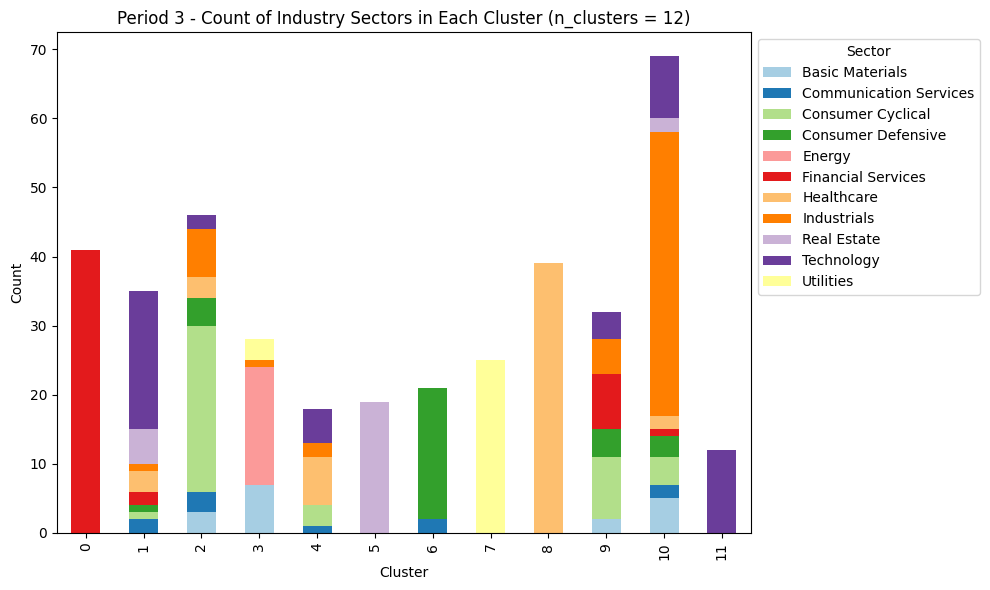

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                0.000000           0.000000   
1                       0.000000                5.714286           2.857143   
2                       6.521739                6.521739          52.173913   
3                      25.000000                0.000000           0.000000   
4                       0.000000                5.555556          16.666667   
5                       0.000000                0.000000           0.000000   
6                       0.000000                9.523810           0.000000   
7                       0.000000                0.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                       6.250000                0.000000          28.125000   
10                      7.246377                2.89

<Figure size 800x600 with 0 Axes>

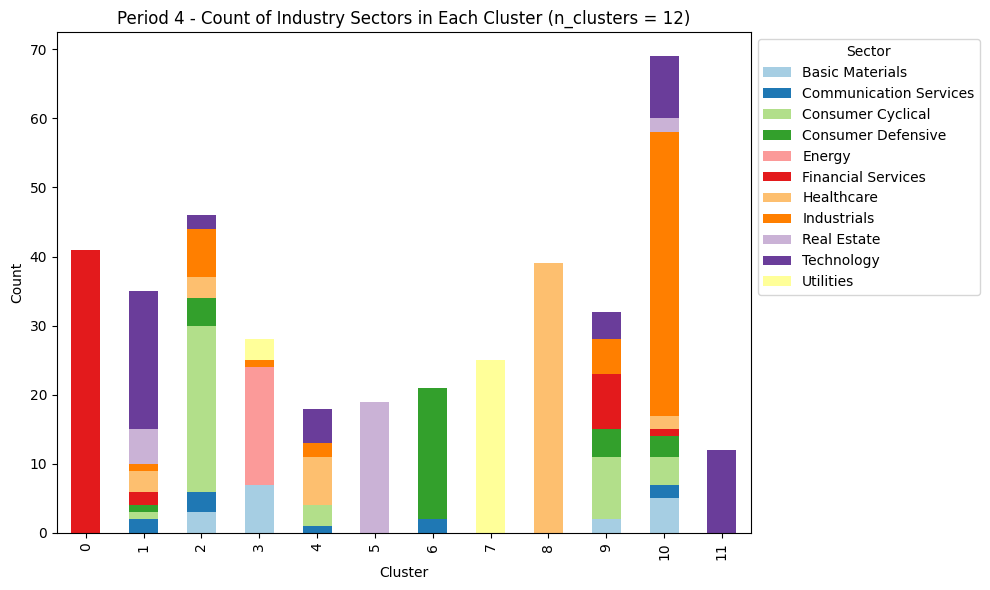

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                0.000000           0.000000   
1                       0.000000                5.714286           2.857143   
2                       6.521739                6.521739          52.173913   
3                      25.000000                0.000000           0.000000   
4                       0.000000                5.555556          16.666667   
5                       0.000000                0.000000           0.000000   
6                       0.000000                9.523810           0.000000   
7                       0.000000                0.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                       6.250000                0.000000          28.125000   
10                      7.246377                2.89

In [191]:
# 5-year periods
n_cluster = 12
pca_corr = PCA(n_components=10)
scaler = StandardScaler()
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Iterate over each period data
for index, period_data in enumerate(five_year_periods):
    # Use only the columns corresponding to this period
    # Get the correlation matrix specifically for this period
    period_correlation_matrix = period_data.corr()
    correlation_matrix_reduced2 = pca_corr.fit_transform(period_correlation_matrix)
    correlation_matrix_reduced2 = pd.DataFrame(correlation_matrix_reduced2)
    correlation_matrix_reduced2.rename(columns={0: "Corr_PCA_1", 1: "Corr_PCA_2", 2: "Corr_PCA_3", 3: "Corr_PCA_4", 4: "Corr_PCA_5", 5: "Corr_PCA_6", 6: "Corr_PCA_7", 7: "Corr_PCA_8", 8: "Corr_PCA_9", 9: "Corr_PCA_10"}, inplace=True)
    # print the percentage of variance explained by the 10 pca columns
    print(pca_corr.explained_variance_ratio_.cumsum())
    correlation_matrix_reduced2.index = period_correlation_matrix.index   # The underlying order of the rows remains after PCA

    combined_matrix = pd.concat([feature_matrix[period_columns[0]], correlation_matrix_reduced2], axis=1)

    scaled_features_1 = scaler.fit_transform(combined_matrix)

    # Use the best hyperparameters
    hierarchical = AgglomerativeClustering(n_clusters=n_cluster, linkage='ward', metric='euclidean')
    hierarchical.fit(combined_matrix_scaled)
    hierarchical_labels = hierarchical.labels_

    plt.figure(figsize=(8, 6))

    sector_counts = pd.DataFrame({'Cluster': hierarchical_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    sector_percentages = sector_counts.div(sector_counts.sum(axis=1), axis=0) * 100

    ax = sector_counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
    plt.title(f'{five_year_period_names[index]} - Count of Industry Sectors in Each Cluster (n_clusters = {n_cluster})')
    plt.xlabel('Cluster')
    plt.ylabel('Count')
    plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    print(sector_percentages)

###**9.2.3 Count and percentage of cluster in each industry sector**

In [192]:
hierarchical_third_sector_percentage_dfs = {}

for n_cluster in n_cluster_options:
    cluster_labels = hierarchical_third_labels[n_cluster]
    sector_counts = pd.DataFrame({'Cluster': cluster_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    hierarchical_third_sector_count_dfs[n_cluster] = sector_counts
    sector_percentages = sector_counts.div(sector_counts.sum(axis=0), axis=1) * 100
    hierarchical_third_sector_percentage_dfs[n_cluster] = sector_percentages

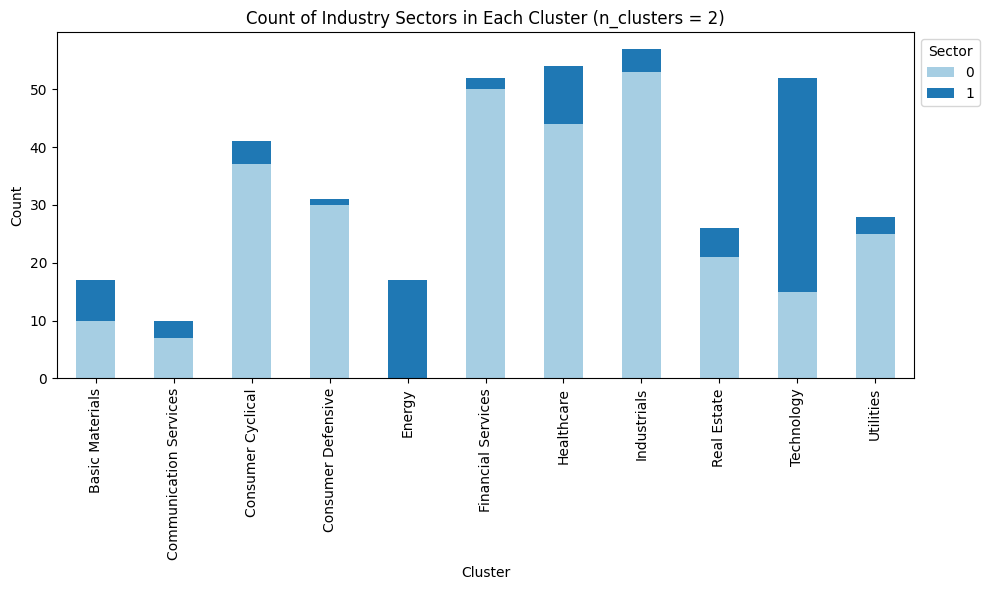

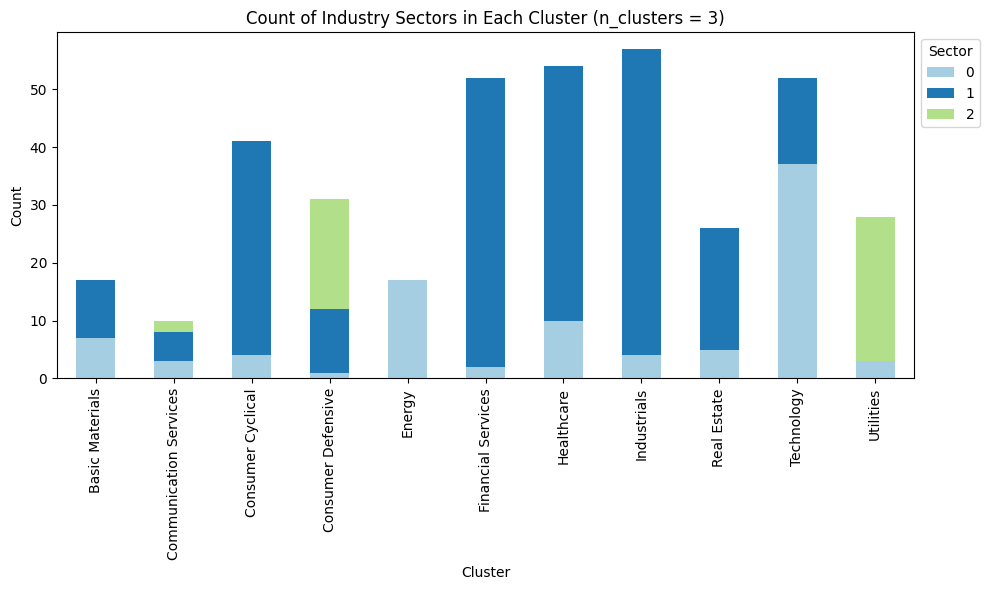

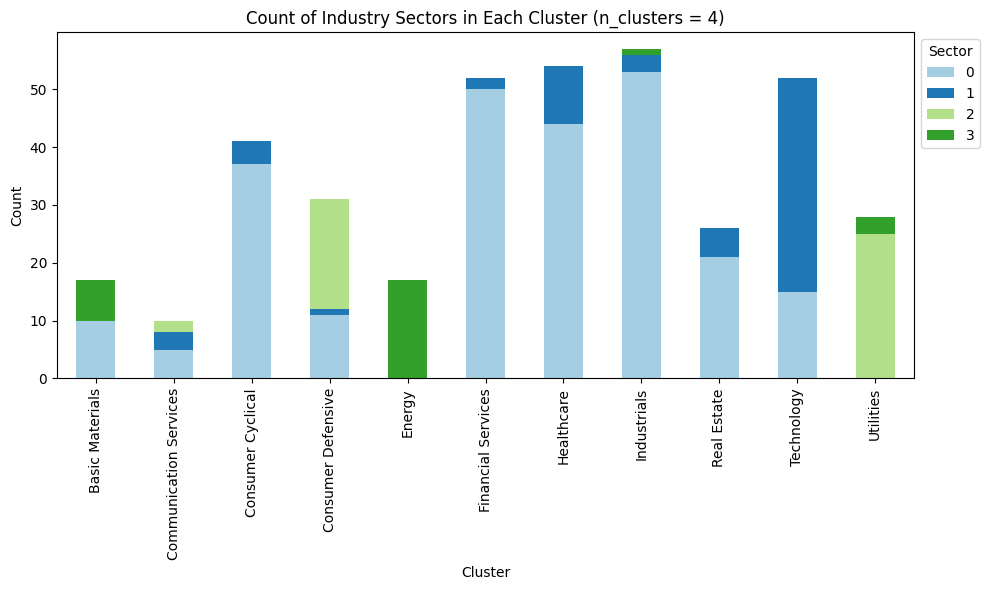

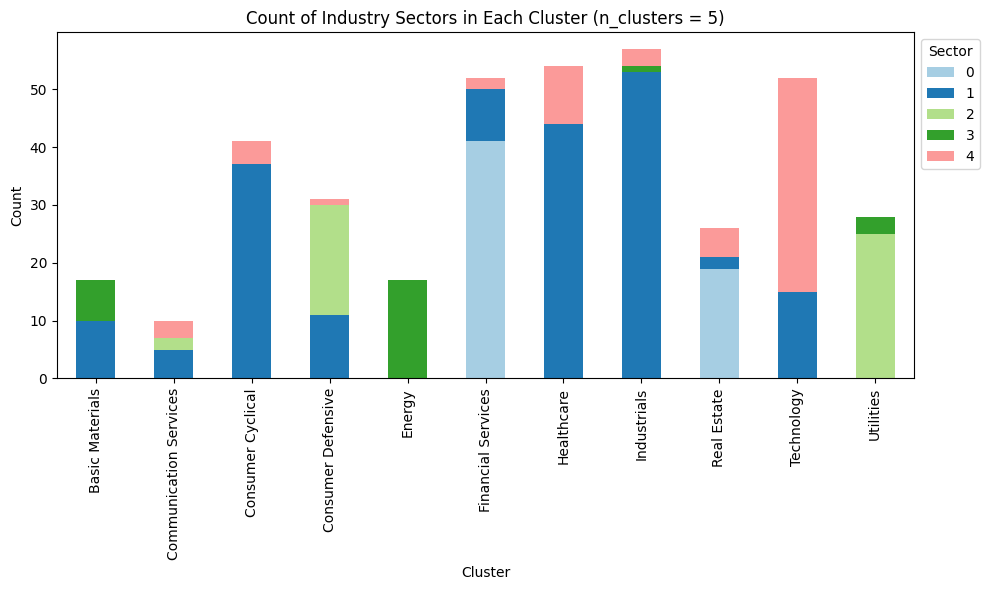

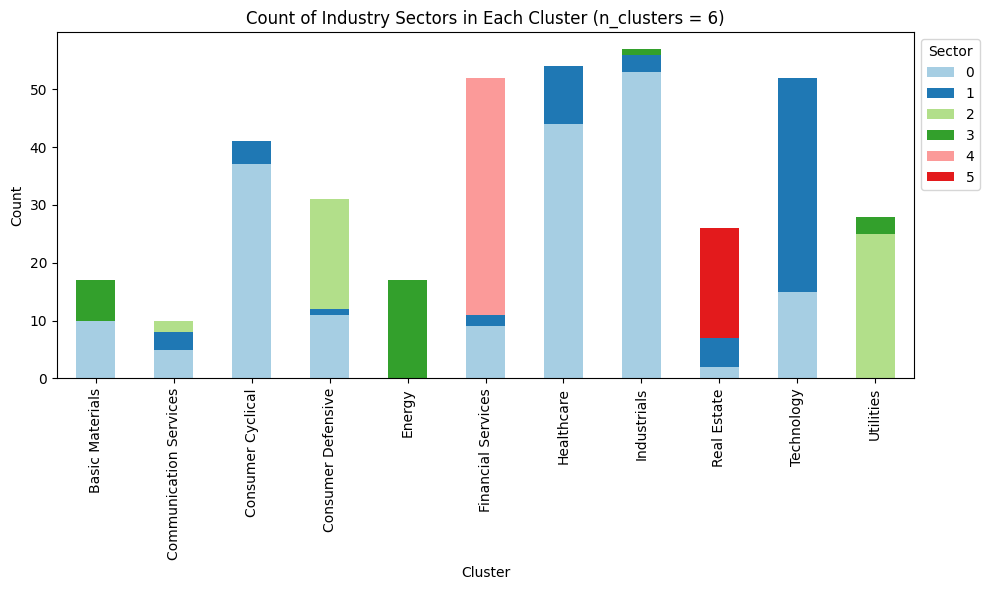

...

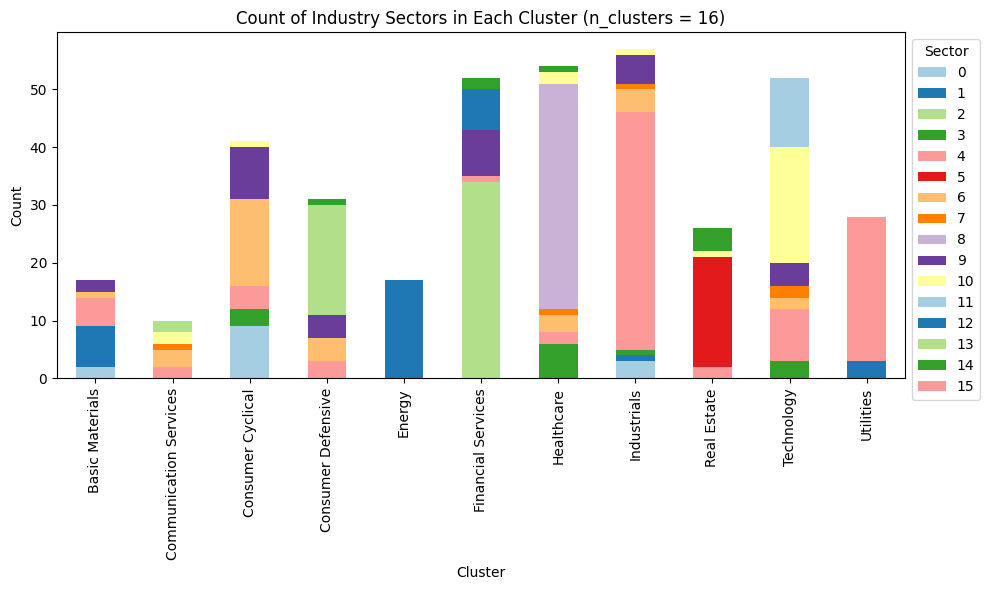

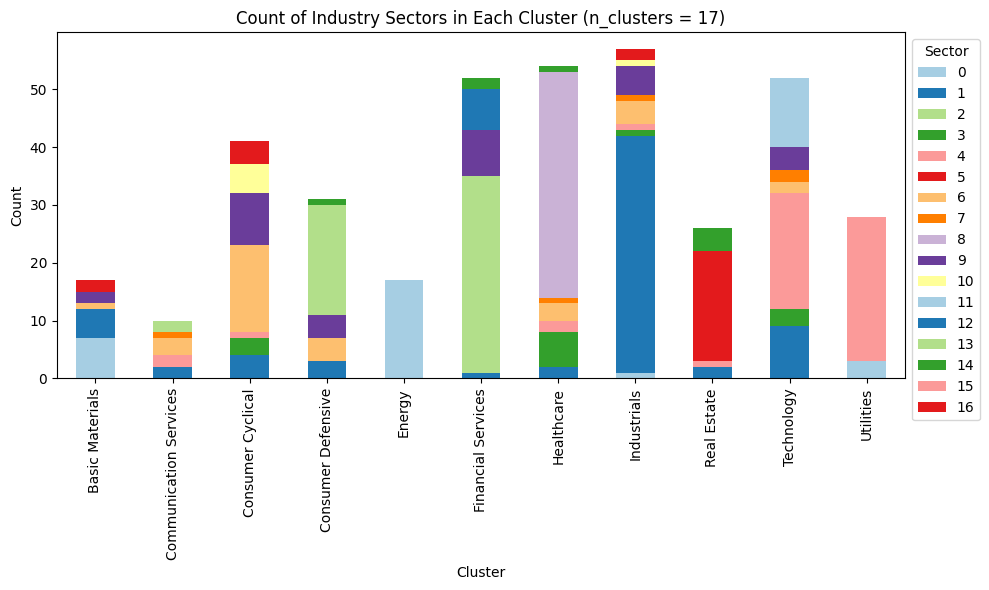

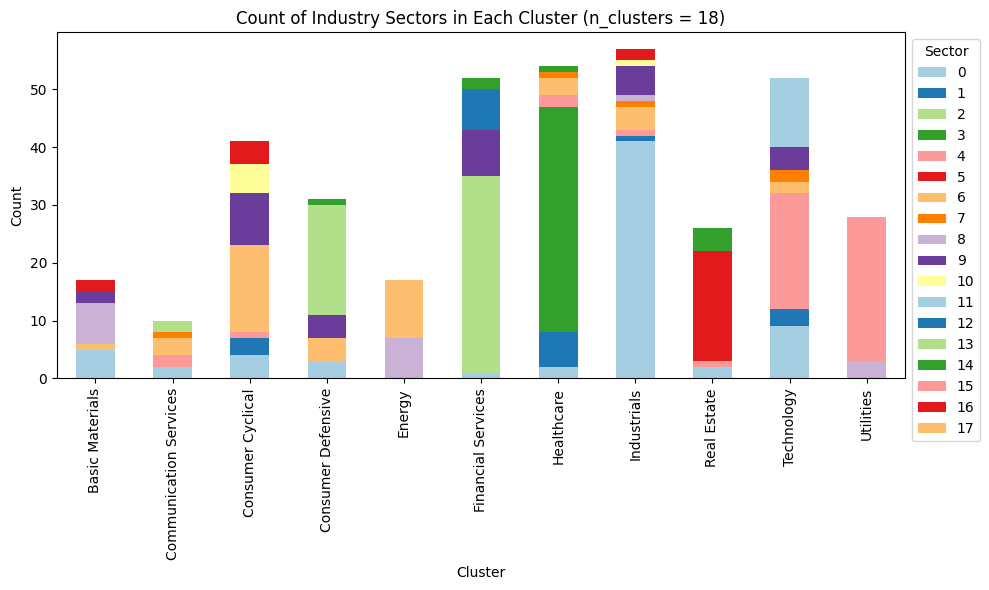

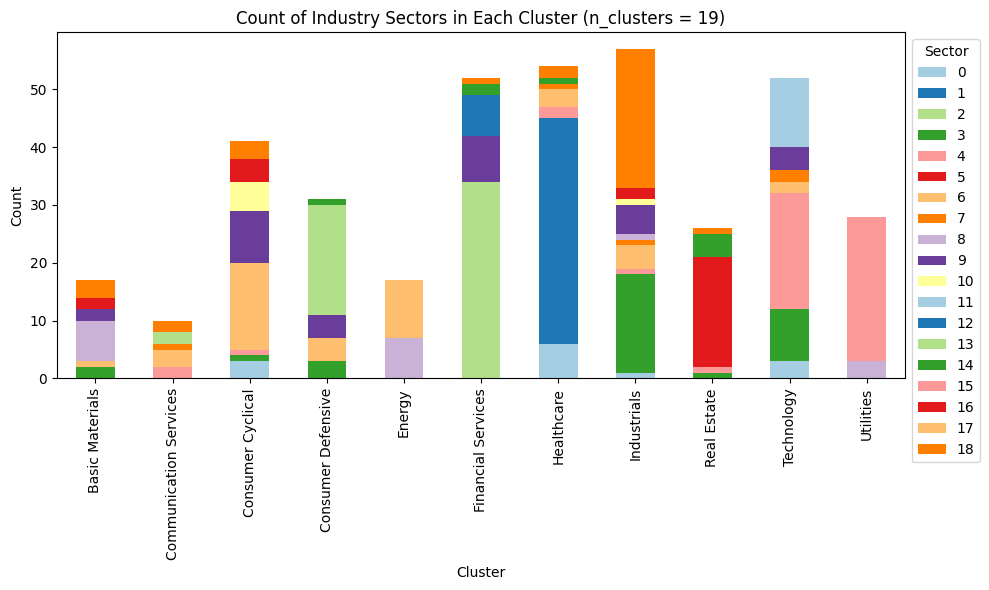

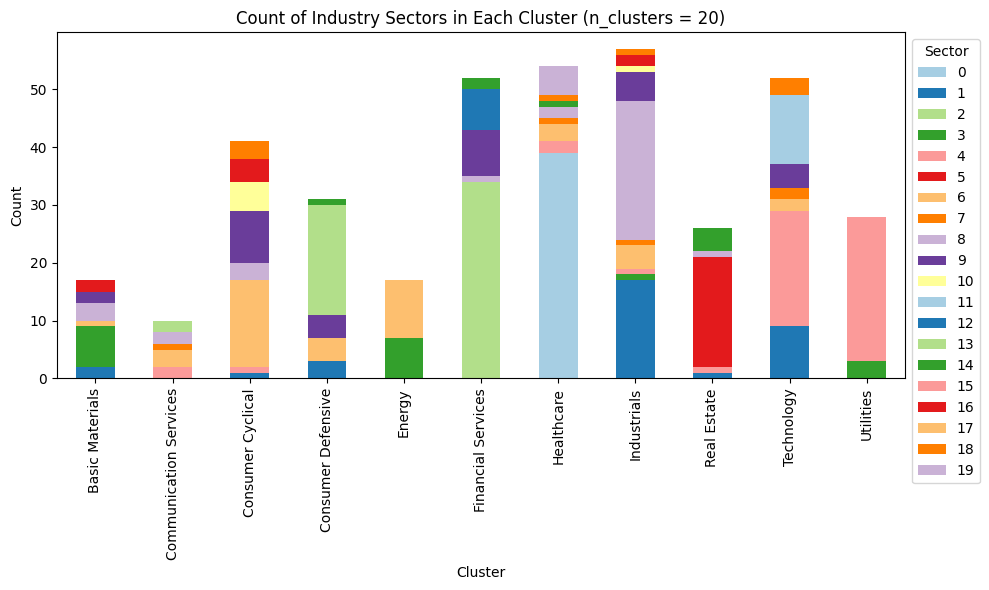

In [193]:
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Stacked bar charts
for n_cluster in n_cluster_options:
    hierarchical_third_sector_count_df = hierarchical_third_sector_count_dfs[n_cluster]

    ax = hierarchical_third_sector_count_df.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
    plt.title(f'Count of Industry Sectors in Each Cluster (n_clusters = {n_cluster})')
    plt.xlabel('Cluster')
    plt.ylabel('Count')
    plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

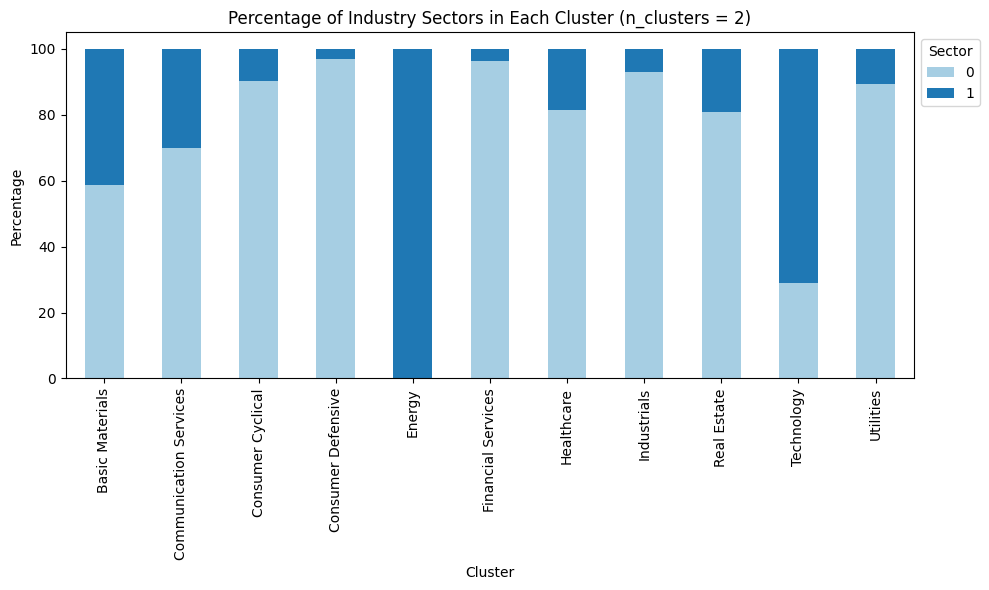

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      58.823529                    70.0          90.243902   
1                      41.176471                    30.0           9.756098   

Industry Sector  Consumer Defensive  Energy  Financial Services  Healthcare  \
Cluster                                                                       
0                         96.774194     0.0           96.153846   81.481481   
1                          3.225806   100.0            3.846154   18.518519   

Industry Sector  Industrials  Real Estate  Technology  Utilities  
Cluster                                                           
0                  92.982456    80.769231   28.846154  89.285714  
1                   7.017544    19.230769   71.153846  10.714286  


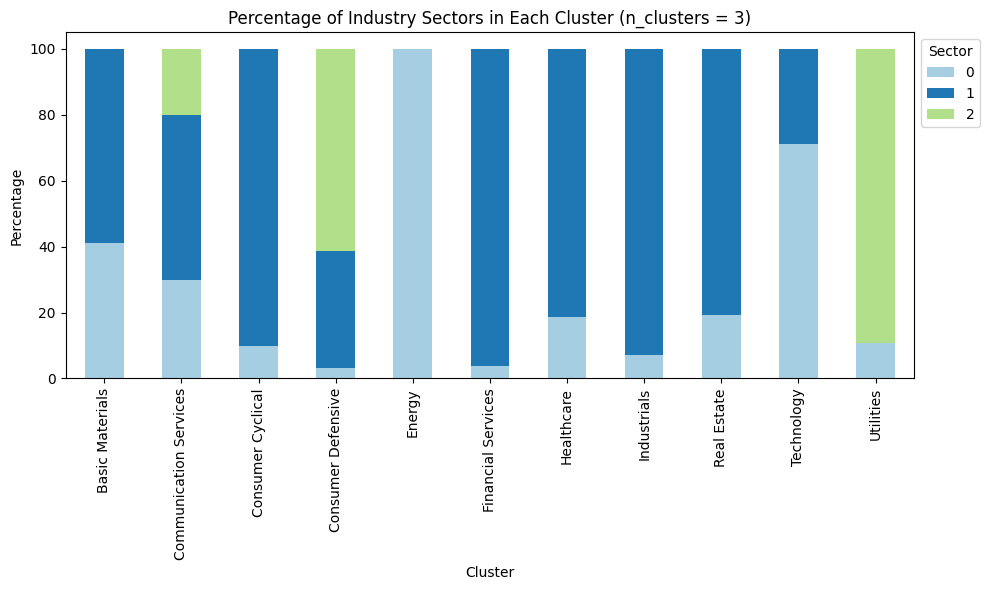

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      41.176471                    30.0           9.756098   
1                      58.823529                    50.0          90.243902   
2                       0.000000                    20.0           0.000000   

Industry Sector  Consumer Defensive  Energy  Financial Services  Healthcare  \
Cluster                                                                       
0                          3.225806   100.0            3.846154   18.518519   
1                         35.483871     0.0           96.153846   81.481481   
2                         61.290323     0.0            0.000000    0.000000   

Industry Sector  Industrials  Real Estate  Technology  Utilities  
Cluster                                                           
0                   7.017544    19.230769   71.153846  10.714286  
1      

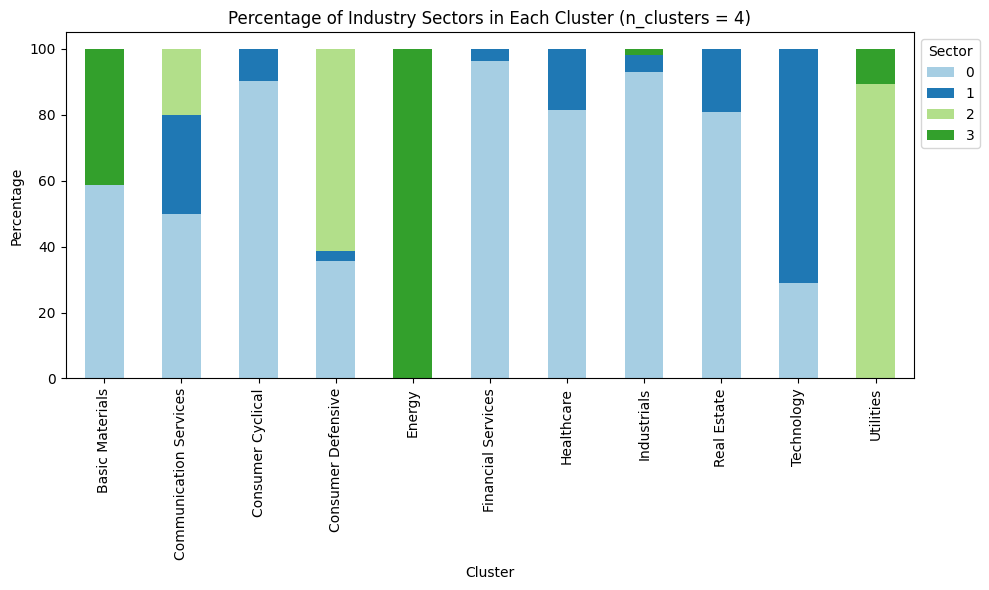

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      58.823529                    50.0          90.243902   
1                       0.000000                    30.0           9.756098   
2                       0.000000                    20.0           0.000000   
3                      41.176471                     0.0           0.000000   

Industry Sector  Consumer Defensive  Energy  Financial Services  Healthcare  \
Cluster                                                                       
0                         35.483871     0.0           96.153846   81.481481   
1                          3.225806     0.0            3.846154   18.518519   
2                         61.290323     0.0            0.000000    0.000000   
3                          0.000000   100.0            0.000000    0.000000   

Industry Sector  Industrials  Real Estate  Technol

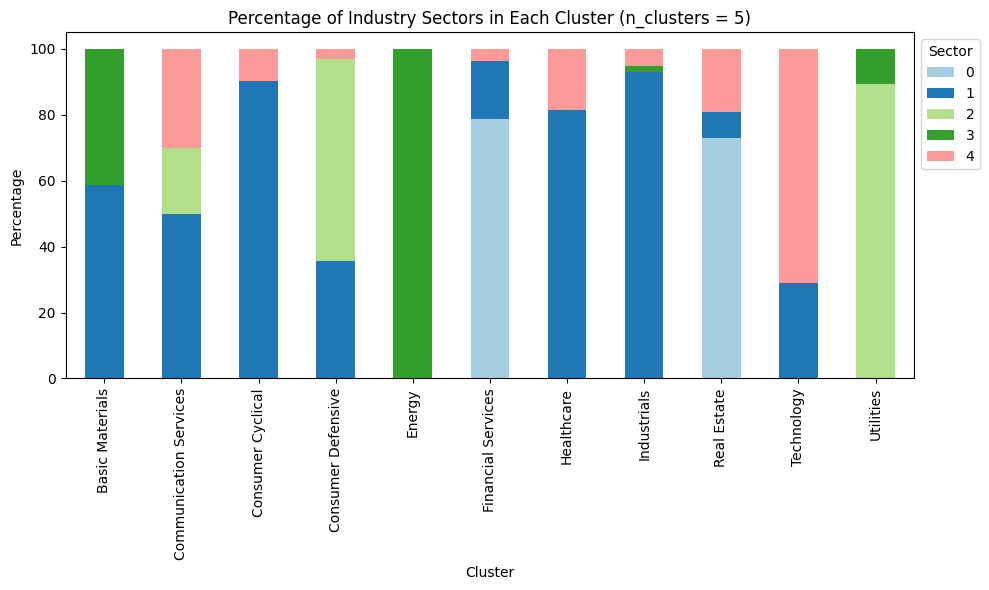

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                     0.0           0.000000   
1                      58.823529                    50.0          90.243902   
2                       0.000000                    20.0           0.000000   
3                      41.176471                     0.0           0.000000   
4                       0.000000                    30.0           9.756098   

Industry Sector  Consumer Defensive  Energy  Financial Services  Healthcare  \
Cluster                                                                       
0                          0.000000     0.0           78.846154    0.000000   
1                         35.483871     0.0           17.307692   81.481481   
2                         61.290323     0.0            0.000000    0.000000   
3                          0.000000   100.0        

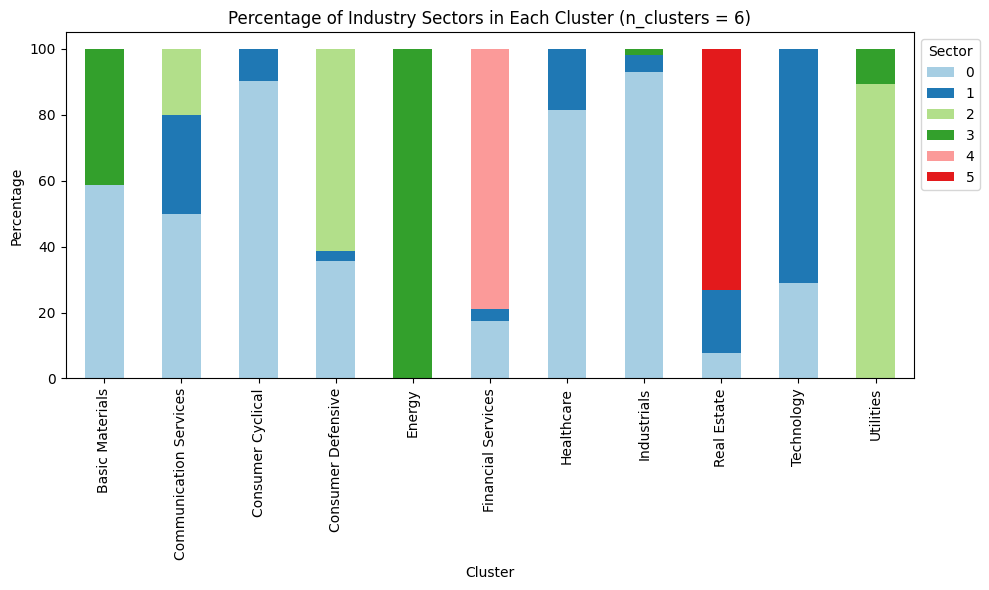

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      58.823529                    50.0          90.243902   
1                       0.000000                    30.0           9.756098   
2                       0.000000                    20.0           0.000000   
3                      41.176471                     0.0           0.000000   
4                       0.000000                     0.0           0.000000   
5                       0.000000                     0.0           0.000000   

Industry Sector  Consumer Defensive  Energy  Financial Services  Healthcare  \
Cluster                                                                       
0                         35.483871     0.0           17.307692   81.481481   
1                          3.225806     0.0            3.846154   18.518519   
2                         61.290323     0.0        

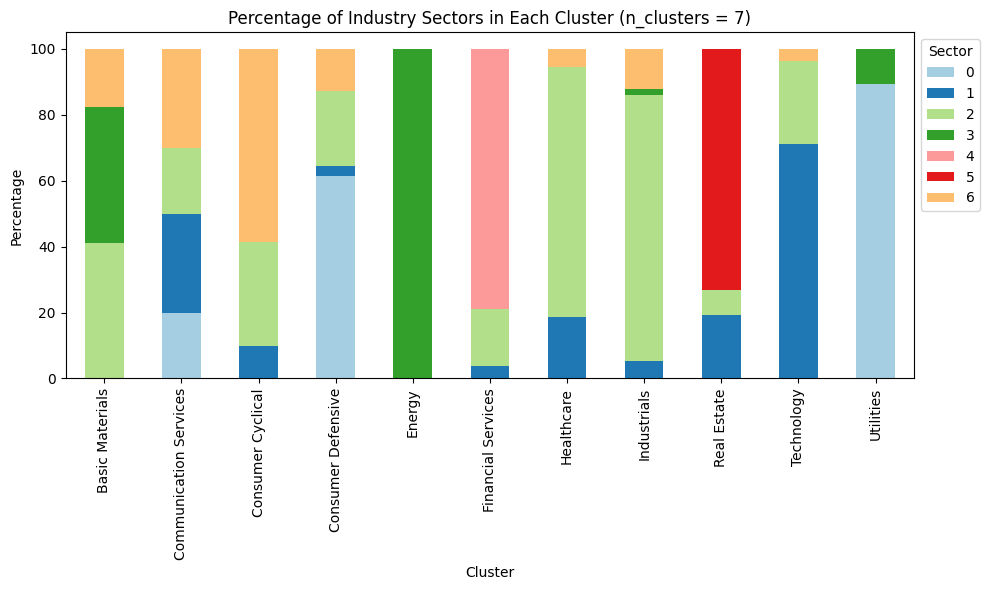

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                    20.0           0.000000   
1                       0.000000                    30.0           9.756098   
2                      41.176471                    20.0          31.707317   
3                      41.176471                     0.0           0.000000   
4                       0.000000                     0.0           0.000000   
5                       0.000000                     0.0           0.000000   
6                      17.647059                    30.0          58.536585   

Industry Sector  Consumer Defensive  Energy  Financial Services  Healthcare  \
Cluster                                                                       
0                         61.290323     0.0            0.000000    0.000000   
1                          3.225806     0.0        

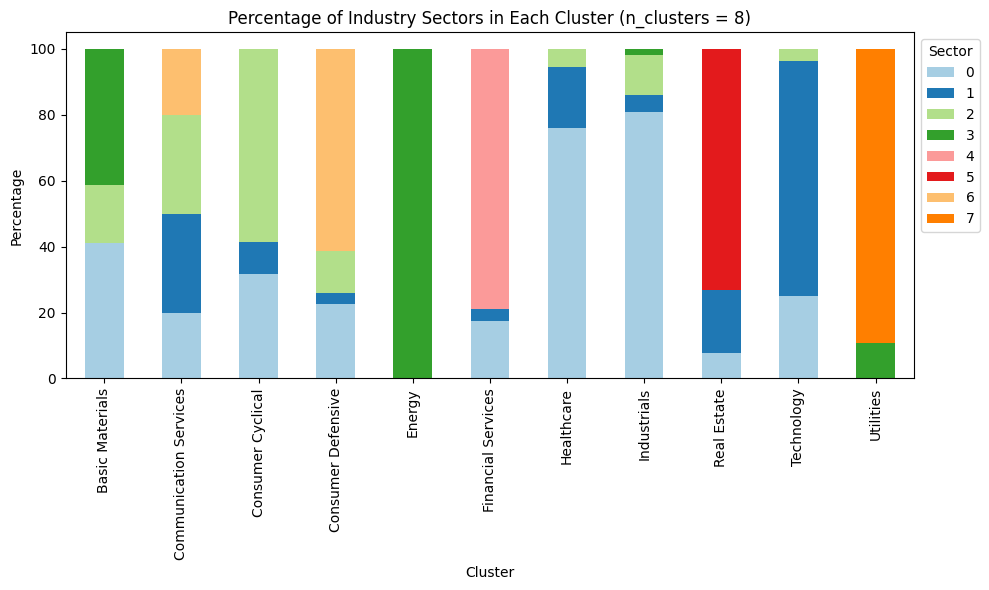

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      41.176471                    20.0          31.707317   
1                       0.000000                    30.0           9.756098   
2                      17.647059                    30.0          58.536585   
3                      41.176471                     0.0           0.000000   
4                       0.000000                     0.0           0.000000   
5                       0.000000                     0.0           0.000000   
6                       0.000000                    20.0           0.000000   
7                       0.000000                     0.0           0.000000   

Industry Sector  Consumer Defensive  Energy  Financial Services  Healthcare  \
Cluster                                                                       
0                         22.580645     0.0        

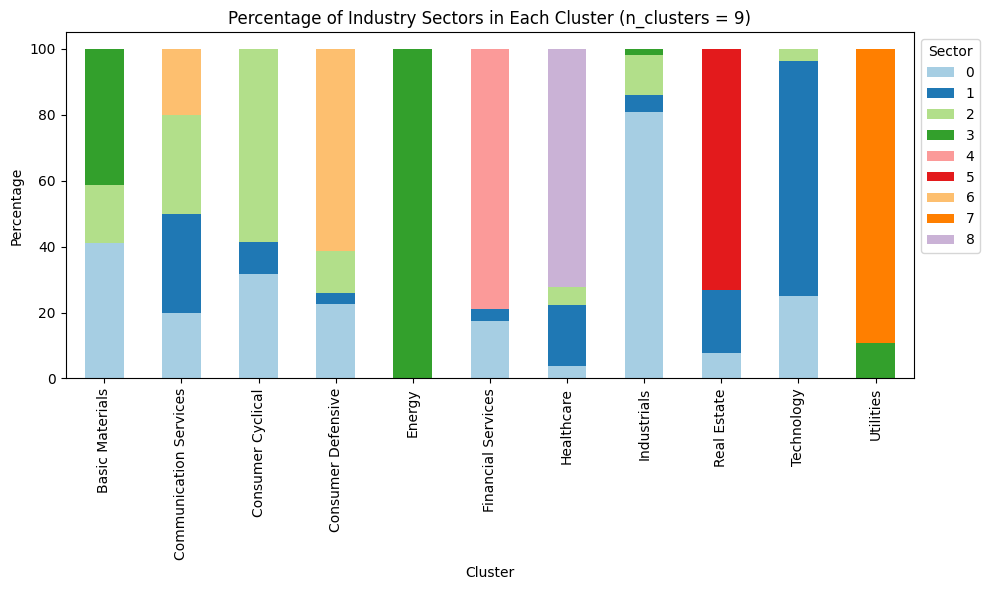

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      41.176471                    20.0          31.707317   
1                       0.000000                    30.0           9.756098   
2                      17.647059                    30.0          58.536585   
3                      41.176471                     0.0           0.000000   
4                       0.000000                     0.0           0.000000   
5                       0.000000                     0.0           0.000000   
6                       0.000000                    20.0           0.000000   
7                       0.000000                     0.0           0.000000   
8                       0.000000                     0.0           0.000000   

Industry Sector  Consumer Defensive  Energy  Financial Services  Healthcare  \
Cluster                                            

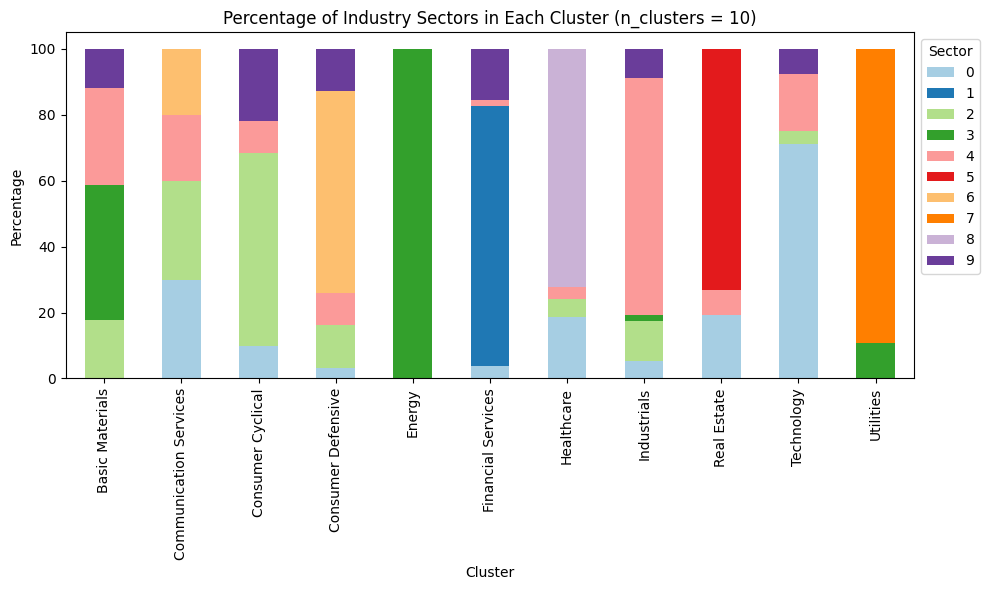

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                    30.0           9.756098   
1                       0.000000                     0.0           0.000000   
2                      17.647059                    30.0          58.536585   
3                      41.176471                     0.0           0.000000   
4                      29.411765                    20.0           9.756098   
5                       0.000000                     0.0           0.000000   
6                       0.000000                    20.0           0.000000   
7                       0.000000                     0.0           0.000000   
8                       0.000000                     0.0           0.000000   
9                      11.764706                     0.0          21.951220   

Industry Sector  Consumer Defensive  Energy  Financ

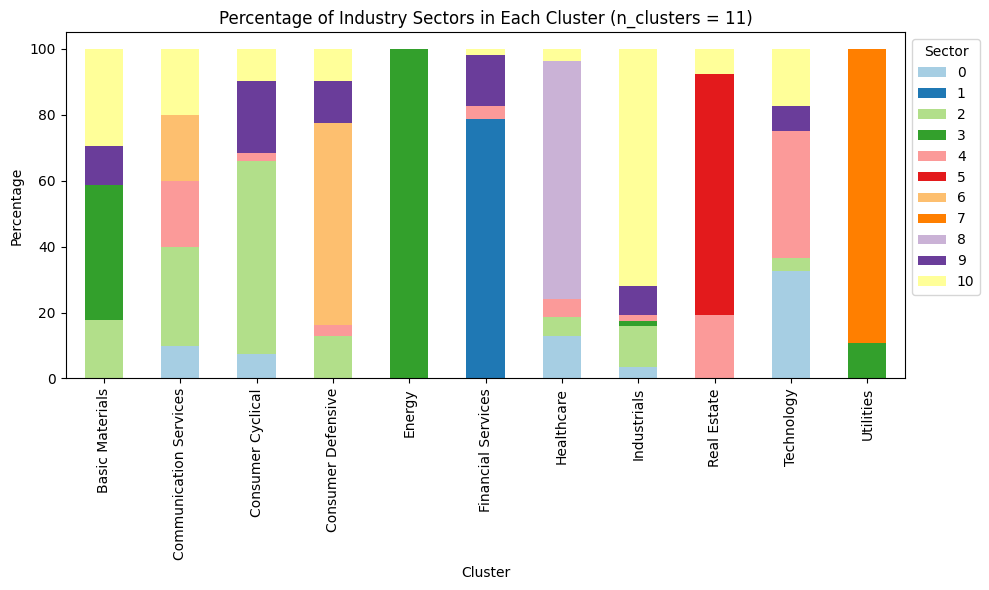

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                    10.0           7.317073   
1                       0.000000                     0.0           0.000000   
2                      17.647059                    30.0          58.536585   
3                      41.176471                     0.0           0.000000   
4                       0.000000                    20.0           2.439024   
5                       0.000000                     0.0           0.000000   
6                       0.000000                    20.0           0.000000   
7                       0.000000                     0.0           0.000000   
8                       0.000000                     0.0           0.000000   
9                      11.764706                     0.0          21.951220   
10                     29.411765                    

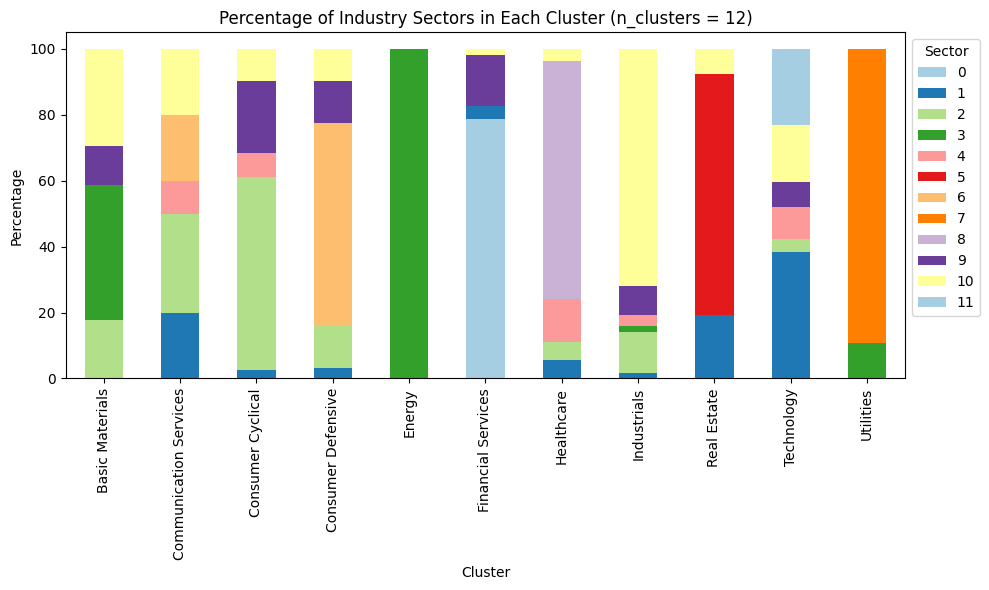

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                     0.0           0.000000   
1                       0.000000                    20.0           2.439024   
2                      17.647059                    30.0          58.536585   
3                      41.176471                     0.0           0.000000   
4                       0.000000                    10.0           7.317073   
5                       0.000000                     0.0           0.000000   
6                       0.000000                    20.0           0.000000   
7                       0.000000                     0.0           0.000000   
8                       0.000000                     0.0           0.000000   
9                      11.764706                     0.0          21.951220   
10                     29.411765                    

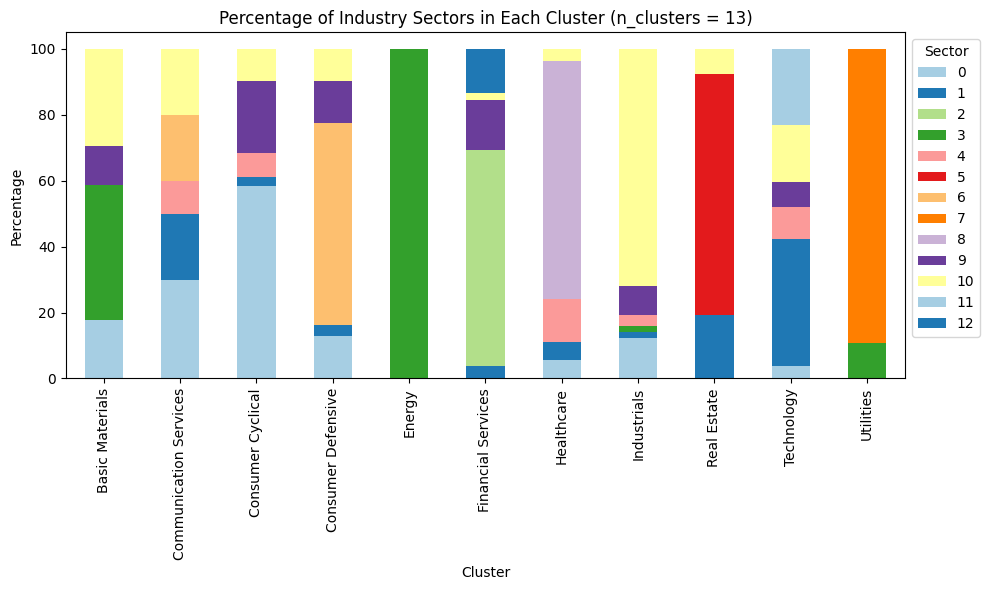

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      17.647059                    30.0          58.536585   
1                       0.000000                    20.0           2.439024   
2                       0.000000                     0.0           0.000000   
3                      41.176471                     0.0           0.000000   
4                       0.000000                    10.0           7.317073   
5                       0.000000                     0.0           0.000000   
6                       0.000000                    20.0           0.000000   
7                       0.000000                     0.0           0.000000   
8                       0.000000                     0.0           0.000000   
9                      11.764706                     0.0          21.951220   
10                     29.411765                    

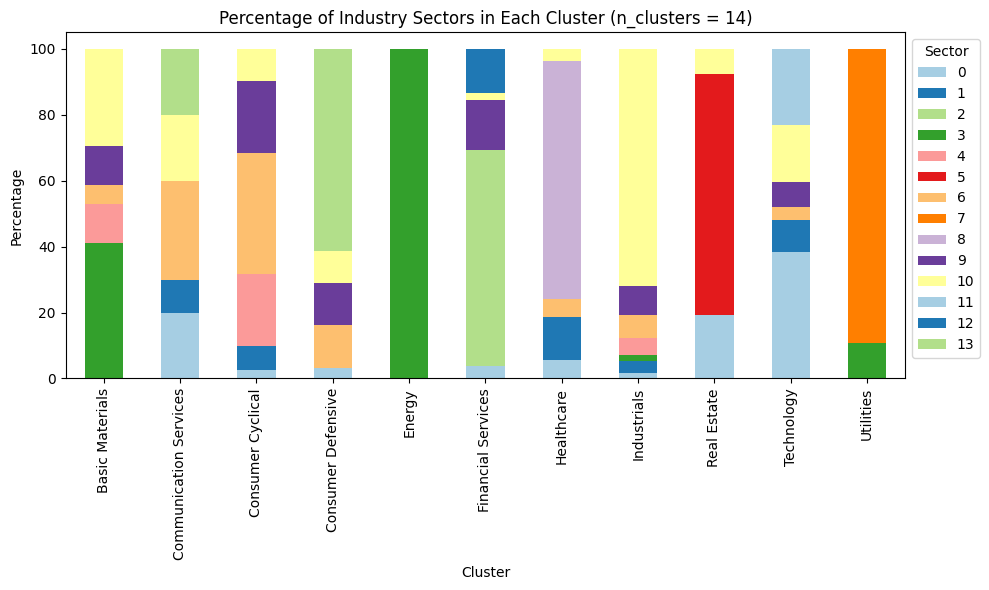

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                    20.0           2.439024   
1                       0.000000                    10.0           7.317073   
2                       0.000000                     0.0           0.000000   
3                      41.176471                     0.0           0.000000   
4                      11.764706                     0.0          21.951220   
5                       0.000000                     0.0           0.000000   
6                       5.882353                    30.0          36.585366   
7                       0.000000                     0.0           0.000000   
8                       0.000000                     0.0           0.000000   
9                      11.764706                     0.0          21.951220   
10                     29.411765                    

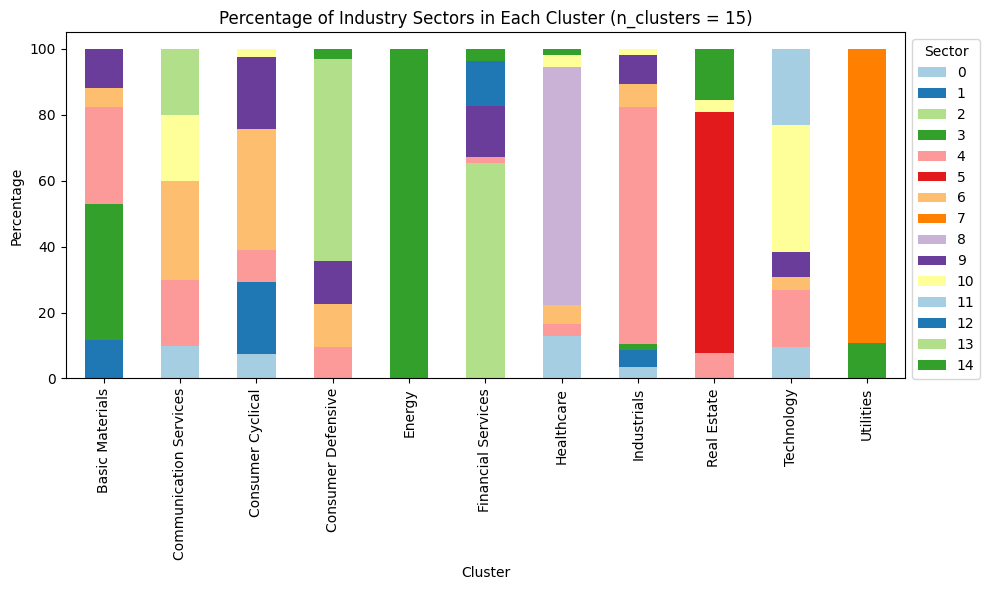

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                    10.0           7.317073   
1                      11.764706                     0.0          21.951220   
2                       0.000000                     0.0           0.000000   
3                      41.176471                     0.0           0.000000   
4                      29.411765                    20.0           9.756098   
5                       0.000000                     0.0           0.000000   
6                       5.882353                    30.0          36.585366   
7                       0.000000                     0.0           0.000000   
8                       0.000000                     0.0           0.000000   
9                      11.764706                     0.0          21.951220   
10                      0.000000                    

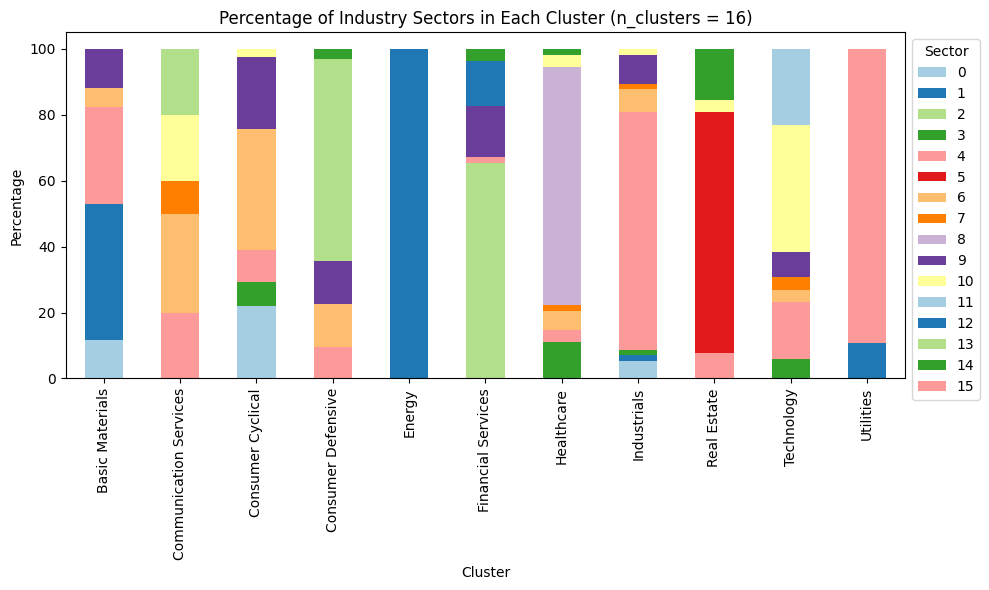

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      11.764706                     0.0          21.951220   
1                      41.176471                     0.0           0.000000   
2                       0.000000                     0.0           0.000000   
3                       0.000000                     0.0           7.317073   
4                      29.411765                    20.0           9.756098   
5                       0.000000                     0.0           0.000000   
6                       5.882353                    30.0          36.585366   
7                       0.000000                    10.0           0.000000   
8                       0.000000                     0.0           0.000000   
9                      11.764706                     0.0          21.951220   
10                      0.000000                    

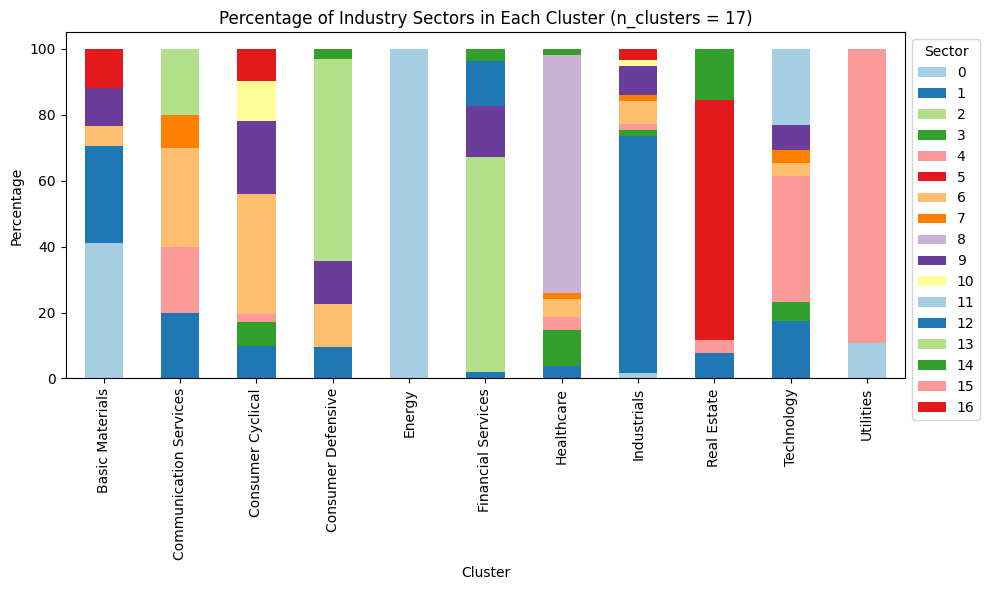

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      41.176471                     0.0           0.000000   
1                      29.411765                    20.0           9.756098   
2                       0.000000                     0.0           0.000000   
3                       0.000000                     0.0           7.317073   
4                       0.000000                    20.0           2.439024   
5                       0.000000                     0.0           0.000000   
6                       5.882353                    30.0          36.585366   
7                       0.000000                    10.0           0.000000   
8                       0.000000                     0.0           0.000000   
9                      11.764706                     0.0          21.951220   
10                      0.000000                    

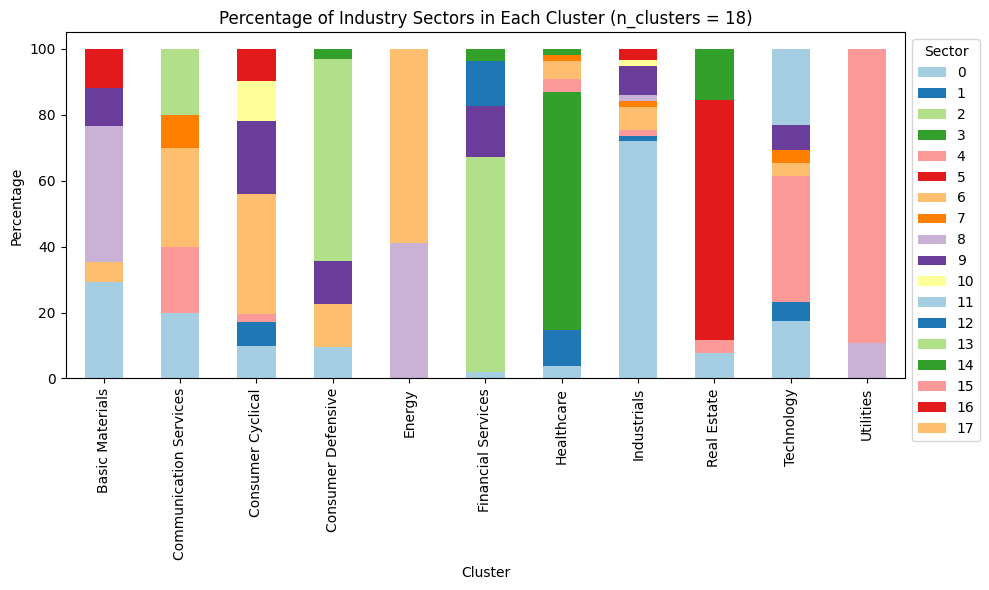

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      29.411765                    20.0           9.756098   
1                       0.000000                     0.0           7.317073   
2                       0.000000                     0.0           0.000000   
3                       0.000000                     0.0           0.000000   
4                       0.000000                    20.0           2.439024   
5                       0.000000                     0.0           0.000000   
6                       5.882353                    30.0          36.585366   
7                       0.000000                    10.0           0.000000   
8                      41.176471                     0.0           0.000000   
9                      11.764706                     0.0          21.951220   
10                      0.000000                    

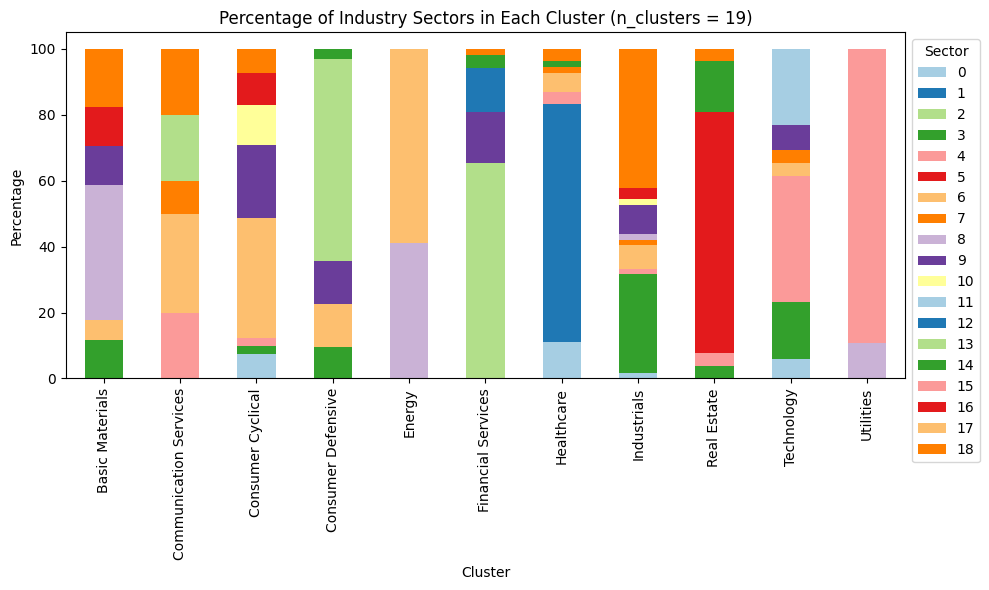

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                     0.0           7.317073   
1                       0.000000                     0.0           0.000000   
2                       0.000000                     0.0           0.000000   
3                      11.764706                     0.0           2.439024   
4                       0.000000                    20.0           2.439024   
5                       0.000000                     0.0           0.000000   
6                       5.882353                    30.0          36.585366   
7                       0.000000                    10.0           0.000000   
8                      41.176471                     0.0           0.000000   
9                      11.764706                     0.0          21.951220   
10                      0.000000                    

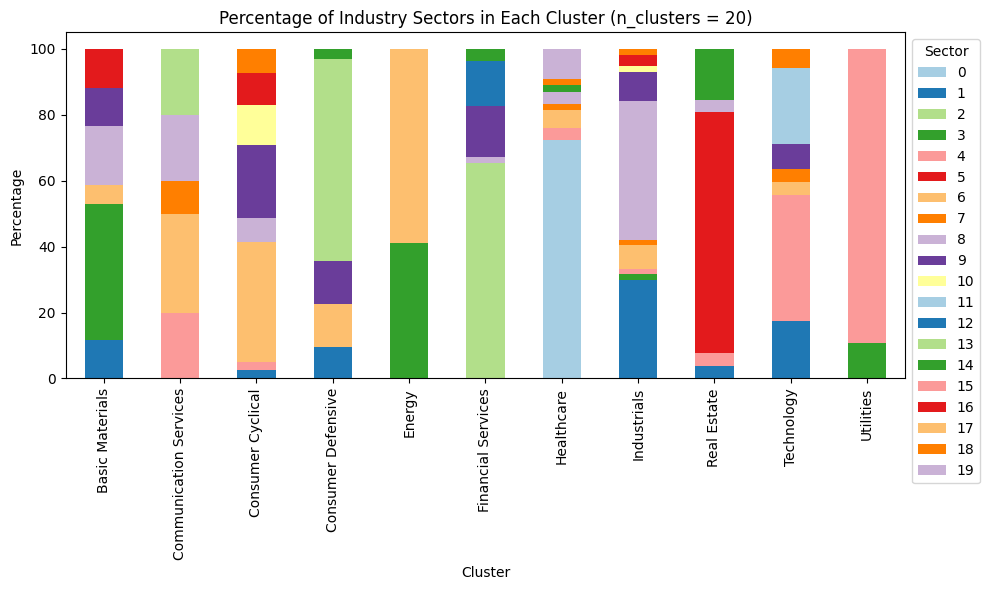

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                     0.0           0.000000   
1                      11.764706                     0.0           2.439024   
2                       0.000000                     0.0           0.000000   
3                      41.176471                     0.0           0.000000   
4                       0.000000                    20.0           2.439024   
5                       0.000000                     0.0           0.000000   
6                       5.882353                    30.0          36.585366   
7                       0.000000                    10.0           0.000000   
8                      17.647059                    20.0           7.317073   
9                      11.764706                     0.0          21.951220   
10                      0.000000                    

In [194]:
# Stacked bar charts
for n_cluster in n_cluster_options:
    hierarchical_third_sector_percentage_df = hierarchical_third_sector_percentage_dfs[n_cluster]

    ax = hierarchical_third_sector_percentage_df.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
    plt.title(f'Percentage of Industry Sectors in Each Cluster (n_clusters = {n_cluster})')
    plt.xlabel('Cluster')
    plt.ylabel('Percentage')
    plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    print(hierarchical_third_sector_percentage_df)

###**9.2.4 The average return and volatility of each cluster for n_clusters=17**

In [195]:
# Reset combined_matrix's index
combined_matrix = pd.concat([feature_matrix, correlation_matrix_reduced], axis=1)
combined_matrix_3 = combined_matrix.reset_index()
combined_matrix_3.rename(columns={'index': 'Company'}, inplace=True)
combined_matrix_3.head()

,Company,avg_return_pre_crisis,volatility_pre_crisis,avg_return_crisis,volatility_crisis,avg_return_post_crisis,volatility_post_crisis,avg_return_covid,volatility_covid,avg_return_post_covid,...,Corr_PCA_1,Corr_PCA_2,Corr_PCA_3,Corr_PCA_4,Corr_PCA_5,Corr_PCA_6,Corr_PCA_7,Corr_PCA_8,Corr_PCA_9,Corr_PCA_10
0,AAPL,0.003060,0.024775,0.001281,0.030126,0.001194,0.016205,0.001053,0.023264,0.001678,...,0.672405,-0.653636,-0.443668,-0.056129,-0.229598,-0.190065,-0.162563,0.152557,0.141502,0.104978
1,MSFT,0.000356,0.011085,0.000020,0.025123,0.000914,0.014376,0.000832,0.021890,0.001960,...,-0.378804,-0.102554,-0.884703,-0.043815,-0.051670,-0.328802,-0.074152,0.135558,0.302901,0.160216
2,NVDA,0.002036,0.030606,-0.000298,0.042996,0.001507,0.025704,0.001829,0.035245,0.005338,...,0.709742,-1.131153,-0.652119,-0.052182,-0.463892,-0.328701,-0.143165,0.299998,0.134455,-0.002337
3,AMZN,-0.000049,0.024757,0.001856,0.036857,0.001374,0.020287,0.000177,0.024624,0.002588,...,1.292061,-0.888673,-0.403928,-0.348478,-0.260385,-0.168526,-0.150053,0.081144,0.131398,0.199323
4,BRK-B,0.000391,0.008356,-0.000154,0.021217,0.000582,0.011497,0.000540,0.016116,0.000612,...,-0.959177,0.069834,0.071320,0.119224,0.420520,-0.023988,0.065813,0.101182,-0.017378,0.017297


In [196]:
scaler4 = StandardScaler()
combined_matrix_scaled_3 = scaler4.fit_transform(combined_matrix_3.drop(columns=['Company']))

In [197]:
# Deep dive on K-means with n_clusters = 17
hierarchical = AgglomerativeClustering(n_clusters=17, linkage='ward', metric='euclidean')
clusters = hierarchical.fit_predict(combined_matrix_scaled_2)

# Add the cluster labels to the merged data
combined_matrix_3['Cluster'] = clusters
combined_matrix_3.head()

,Company,avg_return_pre_crisis,volatility_pre_crisis,avg_return_crisis,volatility_crisis,avg_return_post_crisis,volatility_post_crisis,avg_return_covid,volatility_covid,avg_return_post_covid,...,Corr_PCA_2,Corr_PCA_3,Corr_PCA_4,Corr_PCA_5,Corr_PCA_6,Corr_PCA_7,Corr_PCA_8,Corr_PCA_9,Corr_PCA_10,Cluster
0,AAPL,0.003060,0.024775,0.001281,0.030126,0.001194,0.016205,0.001053,0.023264,0.001678,...,-0.653636,-0.443668,-0.056129,-0.229598,-0.190065,-0.162563,0.152557,0.141502,0.104978,3
1,MSFT,0.000356,0.011085,0.000020,0.025123,0.000914,0.014376,0.000832,0.021890,0.001960,...,-0.102554,-0.884703,-0.043815,-0.051670,-0.328802,-0.074152,0.135558,0.302901,0.160216,4
2,NVDA,0.002036,0.030606,-0.000298,0.042996,0.001507,0.025704,0.001829,0.035245,0.005338,...,-1.131153,-0.652119,-0.052182,-0.463892,-0.328701,-0.143165,0.299998,0.134455,-0.002337,7
3,AMZN,-0.000049,0.024757,0.001856,0.036857,0.001374,0.020287,0.000177,0.024624,0.002588,...,-0.888673,-0.403928,-0.348478,-0.260385,-0.168526,-0.150053,0.081144,0.131398,0.199323,3
4,BRK-B,0.000391,0.008356,-0.000154,0.021217,0.000582,0.011497,0.000540,0.016116,0.000612,...,0.069834,0.071320,0.119224,0.420520,-0.023988,0.065813,0.101182,-0.017378,0.017297,1


In [198]:
# Return the count in each cluster
combined_matrix_3['Cluster'].value_counts()

Cluster
1     69
8     39
2     34
9     32
6     32
0     28
4     27
15    25
13    21
5     19
3     13
11    12
14     8
16     8
12     7
10     6
7      5
Name: count, dtype: int64

In [199]:
cluster_summary = combined_matrix_3.drop(['Company'], axis=1).groupby('Cluster').mean()
cluster_summary

,avg_return_pre_crisis,volatility_pre_crisis,avg_return_crisis,volatility_crisis,avg_return_post_crisis,volatility_post_crisis,avg_return_covid,volatility_covid,avg_return_post_covid,volatility_post_covid,Corr_PCA_1,Corr_PCA_2,Corr_PCA_3,Corr_PCA_4,Corr_PCA_5,Corr_PCA_6,Corr_PCA_7,Corr_PCA_8,Corr_PCA_9,Corr_PCA_10
Cluster,,,,,,,,,,,,,,,,,,,,
0,0.001329,0.018646,0.000448,0.035850,0.000405,0.020823,0.001460,0.034341,0.000175,0.019830,0.273568,-0.424446,0.576433,1.012235,-0.184270,-0.056526,-0.080097,-0.121552,0.044051,0.101704
1,0.000641,0.014655,0.000059,0.028239,0.000678,0.015385,0.000669,0.021758,0.000700,0.014794,-0.898961,-0.057466,-0.220842,0.213368,0.054389,0.146721,-0.084364,-0.027120,-0.049442,-0.083722
2,0.000703,0.011999,0.000205,0.042698,0.000622,0.015481,0.000620,0.025427,0.000495,0.017311,-1.482523,0.049714,0.448635,-0.215017,0.379207,-0.192522,-0.048310,0.145182,-0.042990,0.066228
3,0.001321,0.029990,0.001030,0.037714,0.001215,0.023346,0.000697,0.025680,0.001300,0.017790,1.388126,-0.749644,-0.070486,-0.171511,-0.091341,-0.074941,0.029433,-0.040512,-0.042450,-0.026900
4,0.000944,0.022157,-0.000150,0.031489,0.000930,0.018254,0.000573,0.023872,0.001209,0.015964,0.547710,-0.525900,-0.386679,-0.128310,-0.141586,-0.179907,-0.060236,0.023888,0.028839,0.037734
5,0.001080,0.012525,-0.000028,0.043541,0.000679,0.014515,0.000300,0.025623,0.000483,0.016509,-1.135554,0.574217,0.740715,-0.803117,-0.538561,-0.098926,-0.038254,-0.318827,0.212053,-0.128525
6,0.000590,0.015761,-0.000032,0.028765,0.000799,0.016860,0.000195,0.027547,0.000410,0.019124,0.084031,-0.330729,0.030497,-0.099316,-0.018252,0.240923,0.144460,0.071950,0.055794,-0.001201
7,0.001078,0.037156,0.000011,0.042026,0.001645,0.030344,0.001061,0.034892,0.003007,0.028330,1.922893,-1.155280,-0.079243,-0.193817,-0.301577,-0.133112,0.003112,0.135245,-0.031064,0.005679
8,0.000572,0.015072,-0.000062,0.023444,0.000781,0.014717,0.000641,0.021078,0.000188,0.015699,0.844814,-0.010722,-0.326018,0.001076,0.285867,-0.169964,0.249513,-0.196243,-0.026498,-0.060612


In [200]:
combined_matrix_mc2 = combined_matrix_3.copy()

###**9.2.5 Average correlation between each cluster**

In [201]:
combined_matrix_mc2.head()

,Company,avg_return_pre_crisis,volatility_pre_crisis,avg_return_crisis,volatility_crisis,avg_return_post_crisis,volatility_post_crisis,avg_return_covid,volatility_covid,avg_return_post_covid,...,Corr_PCA_2,Corr_PCA_3,Corr_PCA_4,Corr_PCA_5,Corr_PCA_6,Corr_PCA_7,Corr_PCA_8,Corr_PCA_9,Corr_PCA_10,Cluster
0,AAPL,0.003060,0.024775,0.001281,0.030126,0.001194,0.016205,0.001053,0.023264,0.001678,...,-0.653636,-0.443668,-0.056129,-0.229598,-0.190065,-0.162563,0.152557,0.141502,0.104978,3
1,MSFT,0.000356,0.011085,0.000020,0.025123,0.000914,0.014376,0.000832,0.021890,0.001960,...,-0.102554,-0.884703,-0.043815,-0.051670,-0.328802,-0.074152,0.135558,0.302901,0.160216,4
2,NVDA,0.002036,0.030606,-0.000298,0.042996,0.001507,0.025704,0.001829,0.035245,0.005338,...,-1.131153,-0.652119,-0.052182,-0.463892,-0.328701,-0.143165,0.299998,0.134455,-0.002337,7
3,AMZN,-0.000049,0.024757,0.001856,0.036857,0.001374,0.020287,0.000177,0.024624,0.002588,...,-0.888673,-0.403928,-0.348478,-0.260385,-0.168526,-0.150053,0.081144,0.131398,0.199323,3
4,BRK-B,0.000391,0.008356,-0.000154,0.021217,0.000582,0.011497,0.000540,0.016116,0.000612,...,0.069834,0.071320,0.119224,0.420520,-0.023988,0.065813,0.101182,-0.017378,0.017297,1


In [202]:
cluster_labels = combined_matrix_mc2['Cluster']
feature_data = combined_matrix_mc2.drop(columns=['Cluster', 'Company'])

# Create a dictionary to hold data for each cluster
cluster_data = {}
for cluster in range(17):
    cluster_data[cluster] = feature_data.loc[cluster_labels == cluster]

# Print the size of each cluster to ensure they have sufficient data
for cluster, data in cluster_data.items():
    print(f"Cluster {cluster} size: {data.shape[0]}")

# Function to calculate the mean correlation of a cluster
def mean_correlation(cluster_df):
    if cluster_df.shape[1] < 2:
        return np.nan  # Not enough data to compute correlation
    correlation_matrix = cluster_df.corr()
    # Extract upper triangle values excluding the diagonal
    upper_triangle_values = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool)).stack().values
    if len(upper_triangle_values) == 0:
        return np.nan
    mean_corr = np.mean(upper_triangle_values)
    return mean_corr

# Calculate mean correlations for all clusters
mean_correlations = {cluster: mean_correlation(cluster_df) for cluster, cluster_df in cluster_data.items()}

# Function to calculate the mean correlation between two clusters
def mean_correlation_between_clusters(cluster_df1, cluster_df2):
    combined_df = pd.concat([cluster_df1, cluster_df2], axis=0)
    correlation_matrix = combined_df.corr()
    # Extract inter-cluster correlation values
    inter_cluster_values = correlation_matrix.loc[cluster_df1.columns, cluster_df2.columns].values.flatten()
    if len(inter_cluster_values) == 0:
        return np.nan
    mean_corr = np.mean(inter_cluster_values)
    return mean_corr

# Calculate mean correlations between all combinations of clusters
cluster_pairs = combinations(cluster_data.keys(), 2)
mean_between = {}
for (cluster1, cluster2) in cluster_pairs:
    mean_corr_between = mean_correlation_between_clusters(cluster_data[cluster1], cluster_data[cluster2])
    mean_between[(cluster1, cluster2)] = mean_corr_between

# Create a DataFrame for mean correlations between clusters
mean_between_df = pd.DataFrame(index=range(17), columns=range(17))
for (cluster1, cluster2), mean_corr in mean_between.items():
    mean_between_df.loc[cluster1, cluster2] = mean_corr
    mean_between_df.loc[cluster2, cluster1] = mean_corr
np.fill_diagonal(mean_between_df.values, 1)  # Fill diagonal with 1 for same clusters

print("\nMean Correlations Between Clusters:")
display(mean_between_df)

Cluster 0 size: 28
Cluster 1 size: 69
Cluster 2 size: 34
Cluster 3 size: 13
Cluster 4 size: 27
Cluster 5 size: 19
Cluster 6 size: 32
Cluster 7 size: 5
Cluster 8 size: 39
Cluster 9 size: 32
Cluster 10 size: 6
Cluster 11 size: 12
Cluster 12 size: 7
Cluster 13 size: 21
Cluster 14 size: 8
Cluster 15 size: 25
Cluster 16 size: 8

Mean Correlations Between Clusters:


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,1,0.083097,0.054902,0.033096,0.056123,0.104195,0.047035,0.043459,0.103504,0.047703,0.03767,0.070247,0.036905,0.071862,0.067368,0.136095,0.044607
1,0.083097,1,0.042078,0.074529,0.03637,0.037832,0.055094,0.089788,0.042947,0.044008,0.07676,0.049455,0.041763,0.039278,0.045724,0.04562,0.053339
2,0.054902,0.042078,1,0.042871,0.023587,0.046643,0.037433,0.065351,0.043805,0.029085,0.06061,0.050685,0.039959,0.065278,0.045772,0.052975,0.036161
3,0.033096,0.074529,0.042871,1,0.067053,0.12475,0.044882,0.049605,0.10036,0.069786,0.02271,0.073681,0.027564,0.076302,0.103616,0.124609,0.050138
4,0.056123,0.03637,0.023587,0.067053,1,0.054129,0.03299,0.091792,0.046476,0.031321,0.057244,0.04903,0.026327,0.032344,0.04451,0.041201,0.030848
5,0.104195,0.037832,0.046643,0.12475,0.054129,1,0.074111,0.173607,0.054519,0.056263,0.15874,0.082926,0.103582,0.040978,0.097749,0.043165,0.120975
6,0.047035,0.055094,0.037433,0.044882,0.03299,0.074111,1,0.073816,0.062475,0.051701,0.064203,0.050438,0.041853,0.068697,0.054055,0.086655,0.050237
7,0.043459,0.089788,0.065351,0.049605,0.091792,0.173607,0.073816,1,0.12126,0.088573,0.007399,0.120465,0.06275,0.094089,0.156283,0.131215,0.097897
8,0.103504,0.042947,0.043805,0.10036,0.046476,0.054519,0.062475,0.12126,1,0.057898,0.083132,0.06482,0.046044,0.043071,0.073187,0.060567,0.060966
9,0.047703,0.044008,0.029085,0.069786,0.031321,0.056263,0.051701,0.088573,0.057898,1,0.072409,0.059309,0.031356,0.053433,0.05218,0.07917,0.052862


In [203]:
# Create a dictionary to hold companies for each cluster
cluster_companies = {}
for cluster in range(17):
    cluster_companies[cluster] = combined_matrix_mc2.loc[combined_matrix_mc2['Cluster'] == cluster, 'Company'].tolist()

for cluster, companies in cluster_companies.items():
    print(f"Cluster {cluster}: {', '.join(companies)}")

Cluster 0: XOM, CVX, COP, EOG, SLB, FCX, NEM, WMB, VLO, OKE, PCG, OXY, HES, NUE, PWR, BKR, HAL, DVN, STLD, EQT, CTRA, MRO, NRG, AES, APA, ALB, MOS, FMC
Cluster 1: BRK-B, LIN, ORCL, CSCO, QCOM, GE, IBM, CAT, RTX, UNP, HON, LMT, ETN, UPS, DE, WM, CVS, TT, APH, MMM, NOC, ITW, PH, GD, CSX, FDX, APD, EMR, ROP, NSC, PCAR, JCI, GWW, RSG, CMI, FAST, AME, DD, IRM, GLW, ADM, ROK, HPQ, PPG, WAB, DOV, WY, HUBB, GPC, OMC, J, PKG, EXPD, TXT, AVY, IP, IEX, SNA, BG, PNR, JBHT, NDSN, JNPR, CHRW, IPG, EMN, AOS, TAP, HSIC
Cluster 2: JPM, BAC, WFC, GS, AXP, PGR, BLK, MS, CB, SCHW, PNC, USB, TFC, AFL, COF, TRV, BK, ALL, MET, PRU, ACGL, MTB, STT, TROW, RJF, CINF, NTRS, WRB, PFG, EG, L, GL, IVZ, BEN
Cluster 3: AAPL, AMZN, ISRG, VRTX, BKNG, REGN, CNC, ODFL, DECK, MOH, WDC, SWKS, INCY
Cluster 4: MSFT, ADBE, INTU, GILD, SNPS, CDNS, MSI, ADSK, LHX, FICO, CTSH, EA, CSGP, BIIB, EBAY, ANSS, GRMN, NTAP, TYL, TTWO, PTC, TDY, VRSN, GEN, AKAM, TRMB, FFIV
Cluster 5: PLD, WELL, O, SPG, PSA, AVB, EQR, VTR, ESS, ARE, MAA, 

###**9.2.6 Track Amazon**

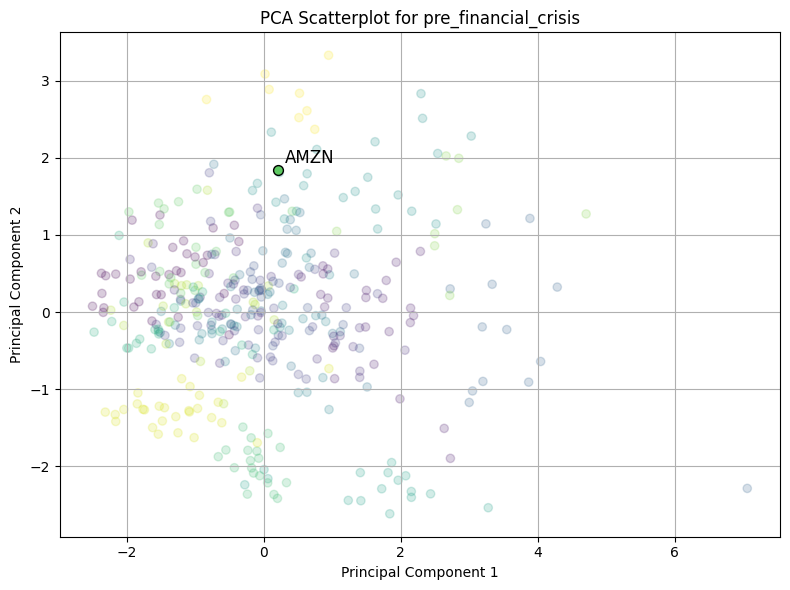

********** Period:  pre_financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Communication Services    7
Industrials               7
Technology                4
Consumer Cyclical         3
Consumer Defensive        1
Financial Services        1
Basic Materials           0
Energy                    0
Healthcare                0
Real Estate               0
Utilities                 0
Name: 12, dtype: int64 

Industry Sector
Communication Services    30.434783
Industrials               30.434783
Technology                17.391304
Consumer Cyclical         13.043478
Consumer Defensive         4.347826
Financial Services         4.347826
Basic Materials            0.000000
Energy                     0.000000
Healthcare                 0.000000
Real Estate                0.000000
Utilities                  0.000000
Name: 12, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Sector  Bas

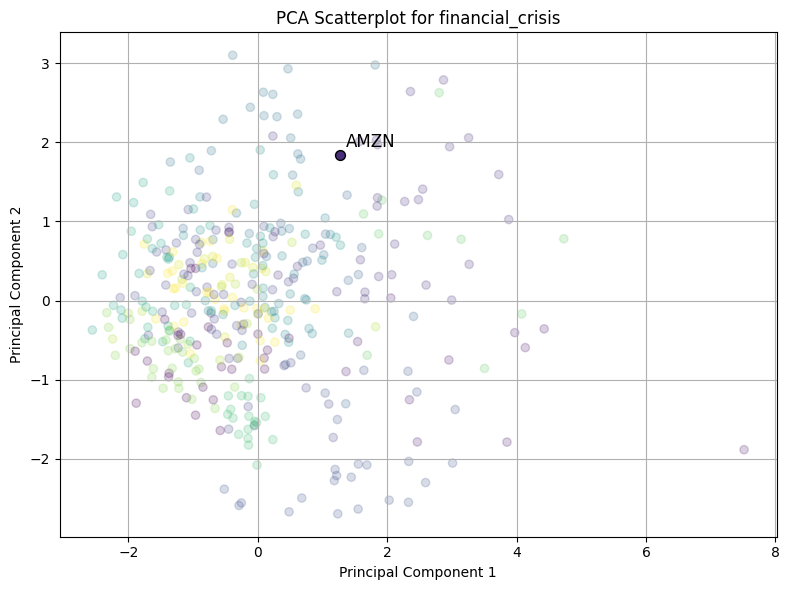

********** Period:  financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                20
Consumer Cyclical          4
Communication Services     3
Financial Services         1
Healthcare                 1
Industrials                1
Real Estate                1
Basic Materials            0
Consumer Defensive         0
Energy                     0
Utilities                  0
Name: 2, dtype: int64 

Industry Sector
Technology                64.516129
Consumer Cyclical         12.903226
Communication Services     9.677419
Financial Services         3.225806
Healthcare                 3.225806
Industrials                3.225806
Real Estate                3.225806
Basic Materials            0.000000
Consumer Defensive         0.000000
Energy                     0.000000
Utilities                  0.000000
Name: 2, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Sector

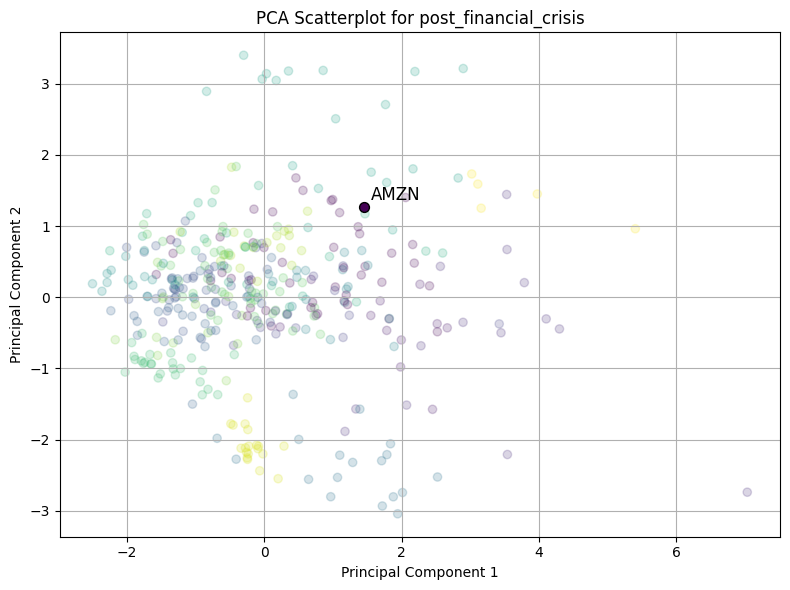

********** Period:  post_financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                27
Industrials                5
Communication Services     3
Consumer Cyclical          3
Financial Services         3
Healthcare                 2
Real Estate                2
Basic Materials            0
Consumer Defensive         0
Energy                     0
Utilities                  0
Name: 0, dtype: int64 

Industry Sector
Technology                60.000000
Industrials               11.111111
Communication Services     6.666667
Consumer Cyclical          6.666667
Financial Services         6.666667
Healthcare                 4.444444
Real Estate                4.444444
Basic Materials            0.000000
Consumer Defensive         0.000000
Energy                     0.000000
Utilities                  0.000000
Name: 0, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry S

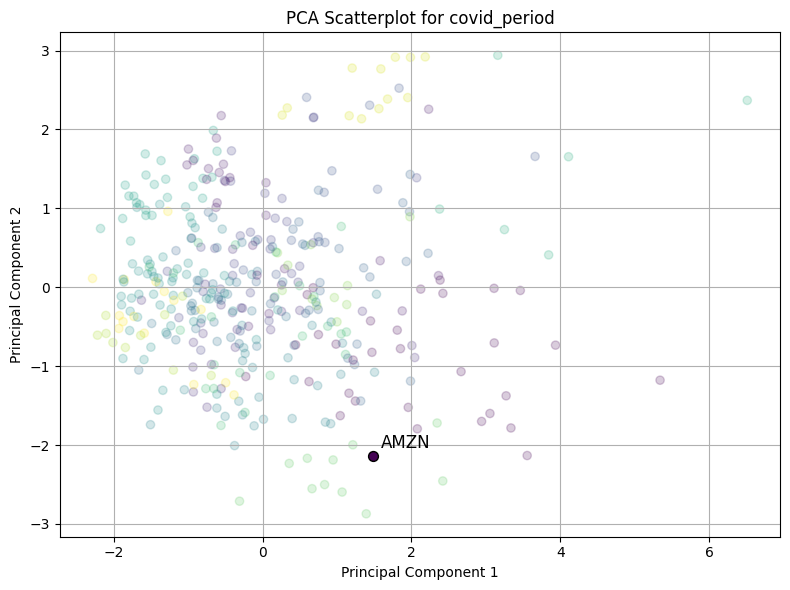

********** Period:  covid_period **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                18
Healthcare                 6
Communication Services     4
Consumer Cyclical          2
Industrials                1
Real Estate                1
Basic Materials            0
Consumer Defensive         0
Energy                     0
Financial Services         0
Utilities                  0
Name: 0, dtype: int64 

Industry Sector
Technology                56.250
Healthcare                18.750
Communication Services    12.500
Consumer Cyclical          6.250
Industrials                3.125
Real Estate                3.125
Basic Materials            0.000
Consumer Defensive         0.000
Energy                     0.000
Financial Services         0.000
Utilities                  0.000
Name: 0, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Sector  Basic Materials  Communication Serv

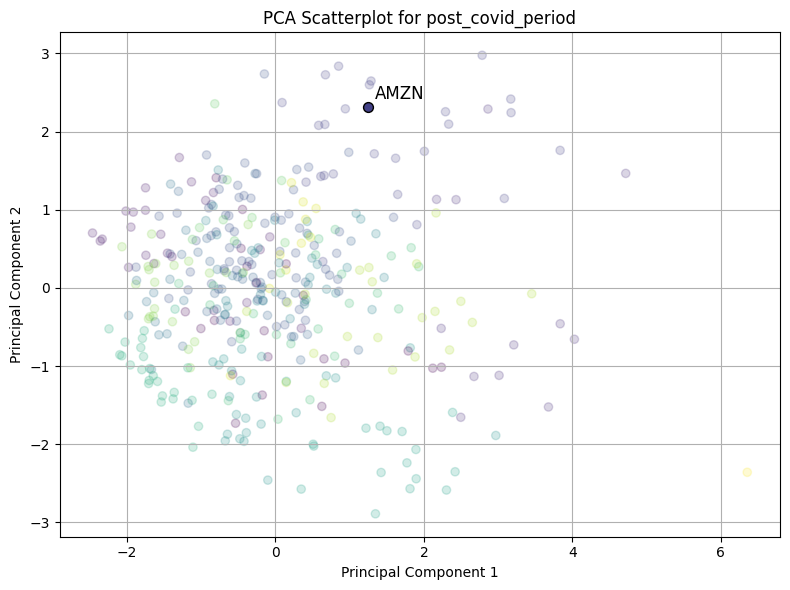

********** Period:  post_covid_period **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                21
Communication Services     3
Consumer Cyclical          2
Basic Materials            0
Consumer Defensive         0
Energy                     0
Financial Services         0
Healthcare                 0
Industrials                0
Real Estate                0
Utilities                  0
Name: 3, dtype: int64 

Industry Sector
Technology                80.769231
Communication Services    11.538462
Consumer Cyclical          7.692308
Basic Materials            0.000000
Consumer Defensive         0.000000
Energy                     0.000000
Financial Services         0.000000
Healthcare                 0.000000
Industrials                0.000000
Real Estate                0.000000
Utilities                  0.000000
Name: 3, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Secto

In [209]:
n_cluster = 17
pca_corr = PCA(n_components=10)
pca = PCA(n_components=2)
scaler = StandardScaler()

# Iterate over each period data
for index, period_data in enumerate(periods):
    # Use only the columns corresponding to this period
    # Get the correlation matrix specifically for this period
    period_correlation_matrix = period_data.corr()
    correlation_matrix_reduced2 = pca_corr.fit_transform(period_correlation_matrix)
    correlation_matrix_reduced2 = pd.DataFrame(correlation_matrix_reduced2)
    correlation_matrix_reduced2.rename(columns={0: "Corr_PCA_1", 1: "Corr_PCA_2", 2: "Corr_PCA_3", 3: "Corr_PCA_4", 4: "Corr_PCA_5", 5: "Corr_PCA_6", 6: "Corr_PCA_7", 7: "Corr_PCA_8", 8: "Corr_PCA_9", 9: "Corr_PCA_10"}, inplace=True)
    correlation_matrix_reduced2.index = period_correlation_matrix.index   # The underlying order of the rows remains after PCA

    combined_matrix = pd.concat([feature_matrix[period_columns[0]], correlation_matrix_reduced2], axis=1)
    combined_matrix_2 = combined_matrix.reset_index()
    combined_matrix_2.rename(columns={'index': 'Company'}, inplace=True)

    scaled_features_1 = scaler.fit_transform(combined_matrix)
    pca_components = pca.fit_transform(scaled_features_1)

    # Use the best hyperparameters
    hierarchical = AgglomerativeClustering(n_clusters=n_cluster, linkage='ward', metric='euclidean')
    hierarchical.fit(scaled_features_1)
    hierarchical_labels = hierarchical.labels_

    combined_matrix_2['Cluster'] = hierarchical_labels

    plt.figure(figsize=(8, 6))

    # Create a colormap from the hierarchical labels
    unique_labels_length = len(np.unique(hierarchical_labels))
    cmap = ListedColormap(plt.cm.viridis(np.linspace(0, 1, unique_labels_length)))
    colors = cmap(hierarchical_labels)

    plt.scatter(pca_components[:, 0], pca_components[:, 1], c=colors, cmap='viridis', alpha=0.2)

    # Highlight 'AMZN'
    amzn_index = period_correlation_matrix.index.get_loc('AMZN')
    plt.scatter(pca_components[amzn_index, 0], pca_components[amzn_index, 1], color=colors[amzn_index], marker='o', s=50, edgecolors='black', alpha=1.0)
    plt.annotate('AMZN', xy=(pca_components[amzn_index, 0], pca_components[amzn_index, 1]), xytext=(pca_components[amzn_index, 0] + 0.1, pca_components[amzn_index, 1] + 0.1), fontsize=12, color='black')

    plt.title(f'PCA Scatterplot for {period_names[index]}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    amazons_cluster = hierarchical_labels[amzn_index]

    print("********** Period: ", period_names[index], "**********")
    sector_counts_amzn = pd.DataFrame({'Cluster': hierarchical_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    sector_percentages_amzn = sector_counts_amzn.div(sector_counts_amzn.sum(axis=1), axis=0) * 100
    print("\n1. Count and percentage of industry sector in the cluster that Amazon is in: ")
    #count
    print(sector_counts_amzn.loc[amazons_cluster].sort_values(ascending=False), "\n")
    #order by percentage in descending order
    print(sector_percentages_amzn.loc[amazons_cluster].sort_values(ascending=False))

    print("\n2. Count and percentage of industry sector in all clusters: \n")
    #count
    print(sector_counts_amzn)
    print(sector_percentages_amzn)
    print("\n")

    # Get distances between each data point and cluster centers
    centroids = np.array([scaled_features_1[hierarchical_labels == i].mean(axis=0) for i in range(n_cluster)])
    amazon_features = scaled_features_1[amzn_index]
    amazon_distances = np.linalg.norm(centroids - amazon_features, axis=1)

    # Sort distances in ascending order and get corresponding cluster indices
    sorted_distances_indices = np.argsort(amazon_distances)
    sorted_amazon_distances = amazon_distances[sorted_distances_indices]

    # Print distances in ascending order
    print("\n3. Distances between Amazon and all cluster centers (in ascending order): \n")
    for idx in sorted_distances_indices:
        print(f"Cluster {idx}: {amazon_distances[idx]}")

    print("\n4. More information about each cluster: \n")
    print(combined_matrix_2.drop(['Company'], axis=1).groupby('Cluster').mean())